In [265]:
from functions import *

In [266]:
import sys, importlib
importlib.reload(sys.modules['functions'])
from functions import *

comparar valores de EW calculados com e sim binning

Voronoi binning

**Analysing SN2010ev, in galaxy NGC 3244, which has redshift z=0.009213 ± 7.00e-6 (He)**

# Importing data

In [4]:
#import data
file_name="../SN2010ev.fits"
data = fits.open(file_name)
cube = data[1].data   # this is the cube, a (3681 x 341 x 604) matrix with fluxes at different 3681 wavelengths and 308 x 318 spatial pixels ("spaxels")
header = data[1].header # this has information on the data cube
ecube = data[2].data # this is the cube uncertainty (3681 x 341 x 604)
print(np.shape(cube))


print(cube[0])
print(cube[0][200][300])

x_len=len(cube[0][0])
y_len=len(cube[0])

(3681, 341, 604)
[[     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 ...
 [     nan      nan      nan ... 69.65055      nan      nan]
 [     nan      nan      nan ... 68.30897      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]]
91.866684


In [5]:
#  -- following is to the get the wavelength array
CRVAL = float(header["CRVAL3"])
NAXIS = int(header["NAXIS3"])
CDELT = float(header["CD3_3"])
CRPIX = float(header["CRPIX3"])
wave = np.array(CRVAL + CDELT * (np.arange(NAXIS) - CRPIX))

In [6]:
#testing function findWavelengths
result = findWavelengths(wave, 5000)
print("Closest elements:", result)

result = findWavelengths(wave, [5000,4000,6000])
print("Closest elements:", result)

Closest elements: (4999.6923828125, 201)
Closest elements: [(4999.6923828125, 201), (4748.4423828125, 0), (5999.6923828125, 1001)]


# Plotting cube images

## Plotting cube at Hα

In [7]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

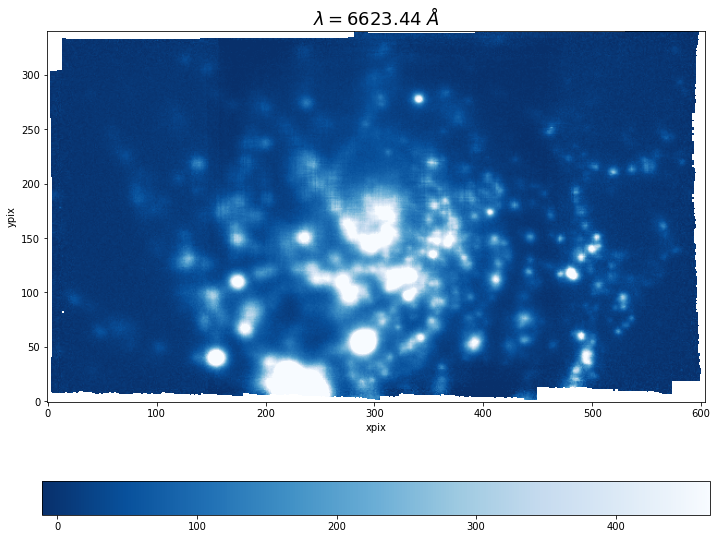

In [8]:
img_data=cube[index]

plot_image(img_data,wavelen, index, 'Blues_r')

In [9]:
print('Min:', np.nanmin(img_data))
print('Max:', np.nanmax(img_data))
print('Mean:', np.nanmean(img_data))
print('Stdev:', np.nanstd(img_data))

Min: -67.27145
Max: 6526.5054
Mean: 62.408295
Stdev: 175.11049


In [10]:
len(img_data.flatten())
y_len*x_len

205964

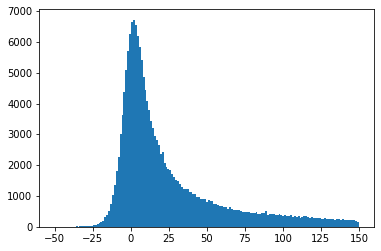

In [11]:
histogram = plt.hist(img_data.flatten(), bins='auto',range=[-50,150])

## Plotting cube at various wavelengths

In [12]:
W=5000
V=5510 #V (Visible/Green): ~551 nm
R=6580 #R (Red): ~658 nm

halpha=6563

xx=[W,V,R,halpha_obs]

selection=findWavelengths(wave, xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

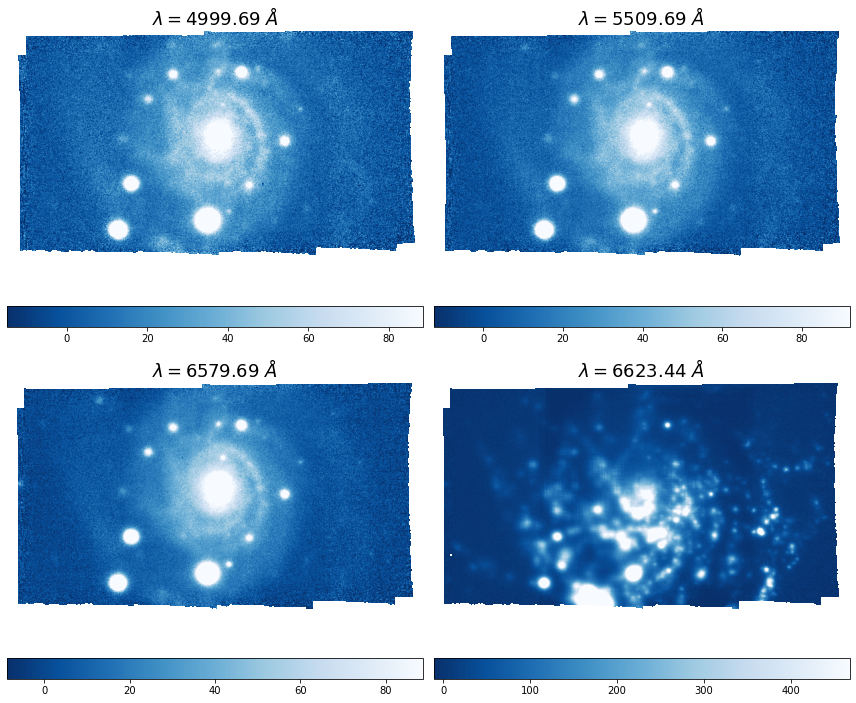

In [13]:
plot_image(cube[indices],wave[indices], indices, 'Blues_r')

## Making a gif around Halpha

In [14]:
xx=[halpha_obs-10,halpha_obs+10]

selection=findWavelengths(wave,xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

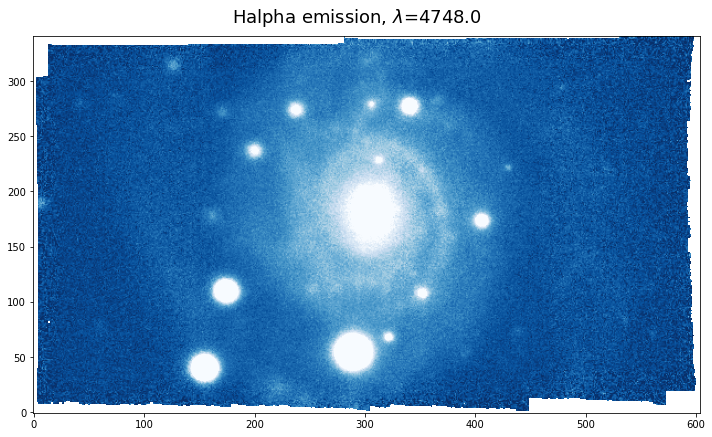

In [15]:


image_array = cube[indices[0]:indices[1]]



fig, ax = plt.subplots(figsize=(10, 8))


# Set the initial image
image=cube[indices[0]];
lo,up = np.nanpercentile(image,2),np.nanpercentile(image,98)

im = ax.imshow(image, animated=True,cmap="Blues_r",origin='lower',clim=(lo,up))
plt.tight_layout()
def update(i):
    im.set_array(image_array[i])
    fig.suptitle("Halpha emission, $\lambda$="+str(round(wave[i],0)),fontsize=18,y=0.85)
    
    return im,


# Create the animation object
animation_fig = animation.FuncAnimation(fig, update, frames=len(image_array), interval=400, blit=True,repeat_delay=15,)

# Show the animation
plt.tight_layout()
plt.show()

animation_fig.save("im.gif")

In [16]:
from PIL import Image

im = []
for n in range(20):
    arr = np.random.randint(low = 0, high = 255, size = (300, 300, 3))
    im.append(Image.fromarray(arr.astype('uint8')))

im[0].save('im.gif', save_all=True, append_images=im[1:], optimize=False, duration=200, loop=0)

## Plotting median within a certain waveband

0 1
[4748.44238281 4749.69238281]


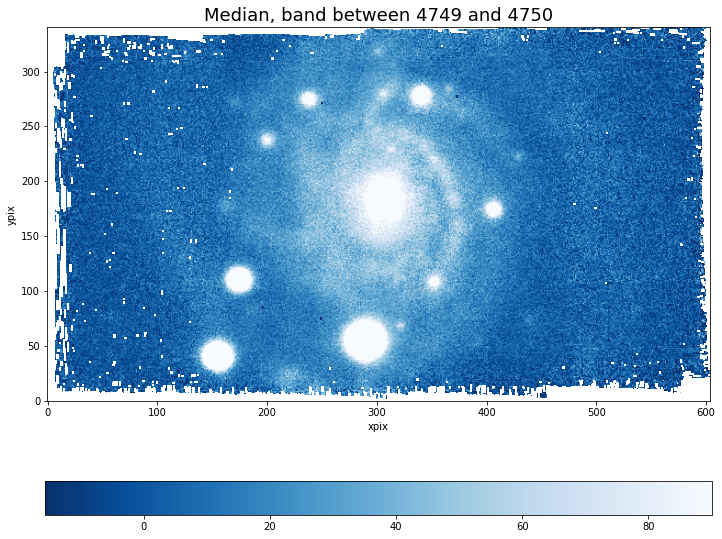

In [17]:
med=median(cube,wave,[4749,4750])


plot_image(med,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Median, band between 4749 and 4750')


#median(cube,wave,[np.max(wave),np.min(max)])


## Plotting average within a certain waveband

0 1
[4748.44238281 4749.69238281]


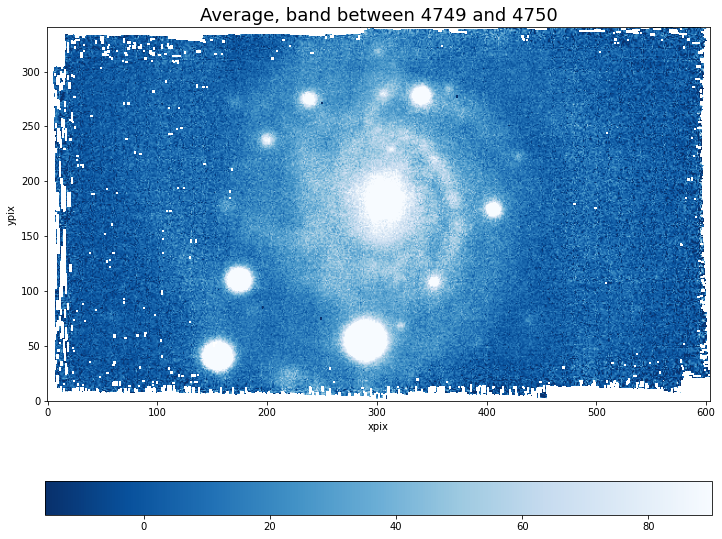

In [18]:
ave=average(cube,wave,[4749,4750])


plot_image(ave,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Average, band between 4749 and 4750')


#ave(cube,wave,[np.max(wave),np.min(max)])


# Binning

## Binning 2x2

In [19]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

img_data=cube[index]

print("dimensions before binning: ", len(img_data),len(img_data[0]))

binned_data=binning(img_data,4)

print("dimensions after binning: ", len(binned_data),len(binned_data[0]))


dimensions before binning:  341 604
dimensions after binning:  86 151


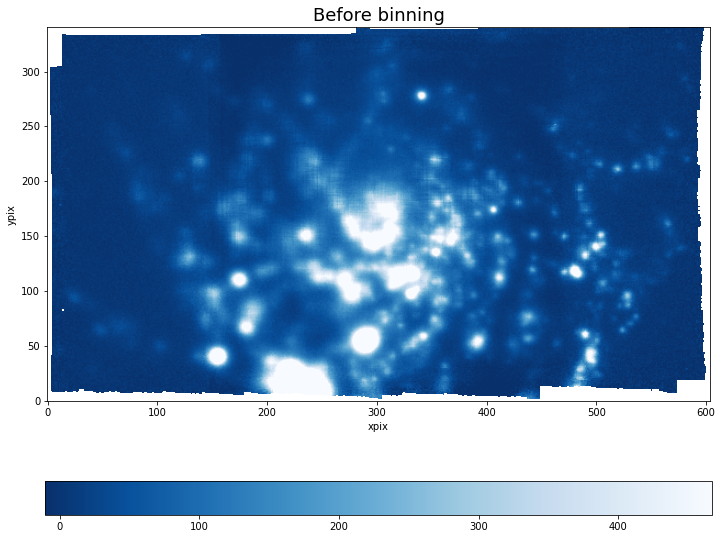

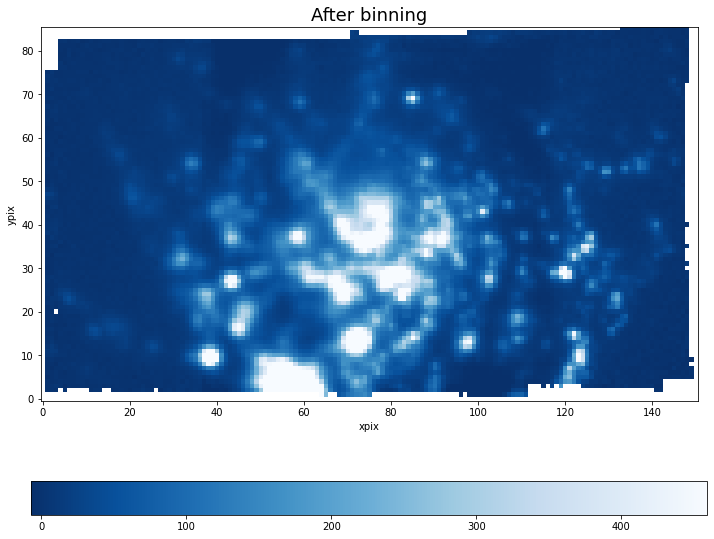

In [20]:
plot_image(img_data,wavelen, index, 'Blues_r', "Before binning")
plot_image(binned_data,wavelen, index, 'Blues_r',"After binning")

In [21]:
np.shape(cube)

(3681, 341, 604)

## Region w/ high SNR

Zoom in area of background signal

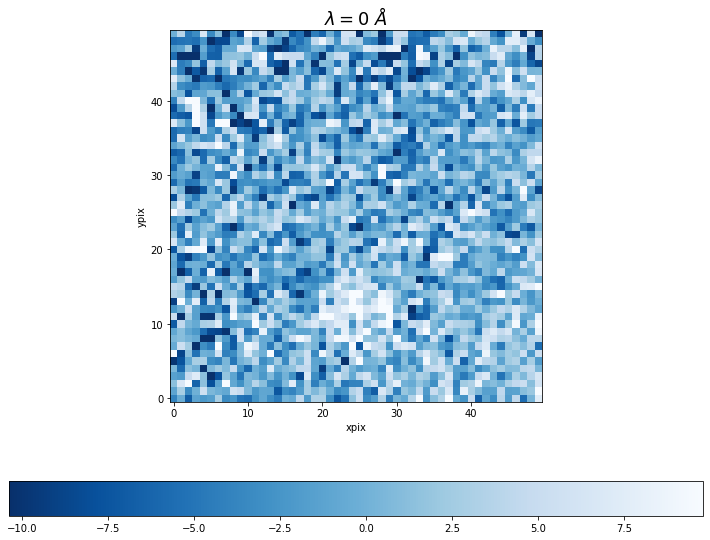

In [22]:
bg=img_data[270:320, 15:65]
plot_image(bg,0,0,'Blues_r')

In [23]:
# background noise
noise = np.nanstd(bg)

snr_map = img_data / noise
mean_snr = np.nanmean(snr_map)
threshold = 0.5 * mean_snr


square_size = 1000


#best square
best_square = None
best_snr = -np.inf  
best_coords = (0, 0)


h, w = image.shape
for y in range(0, h - square_size + 1, square_size):
    for x in range(0, w - square_size + 1, square_size):
        
        block = snr_map[y:y+square_size, x:x+square_size]

        block_mean_snr = np.mean(block)

        if block_mean_snr > best_snr:
            best_snr = block_mean_snr
            best_square = block
            best_coords = (y, x)

if best_square is not None:
    np.save("../best_snr_square.npy", best_square)
    print(f"Saved the best SNR square at {best_coords} with mean SNR {best_snr:.2f}")

best_square = np.load("../best_snr_square.npy")
print(best_square)

[[24.733227  23.659376  23.296698  ...  8.002031   6.8485003  6.3015223]
 [25.289423  24.369799  22.9598    ...  6.986258   6.1466255  7.6385193]
 [23.431923  22.804512  24.332674  ...  7.397483   7.678427   5.837128 ]
 ...
 [31.349007  31.20333   35.570824  ... 10.715965  10.636392  11.201308 ]
 [28.347382  27.447086  30.333021  ...  9.965655  11.025977  11.6718   ]
 [25.059385  26.852942  27.987513  ...  9.946177  11.049753  11.41961  ]]


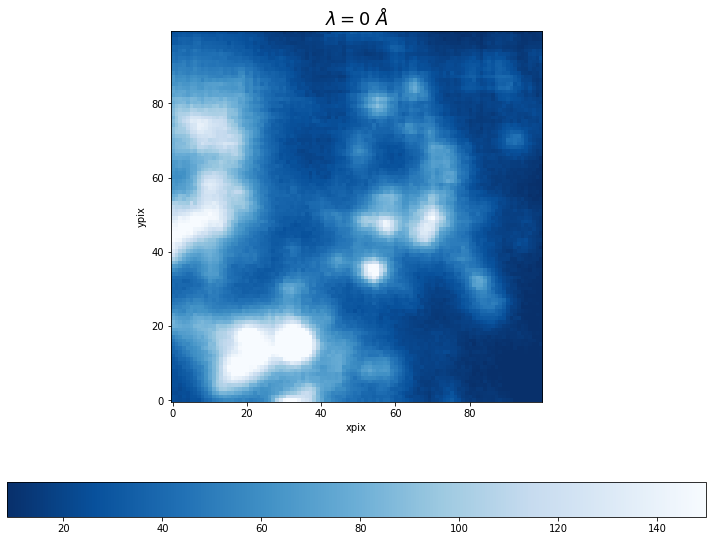

In [24]:
plot_image(best_square,0,0,'Blues_r')

## Binning of galaxy bulge

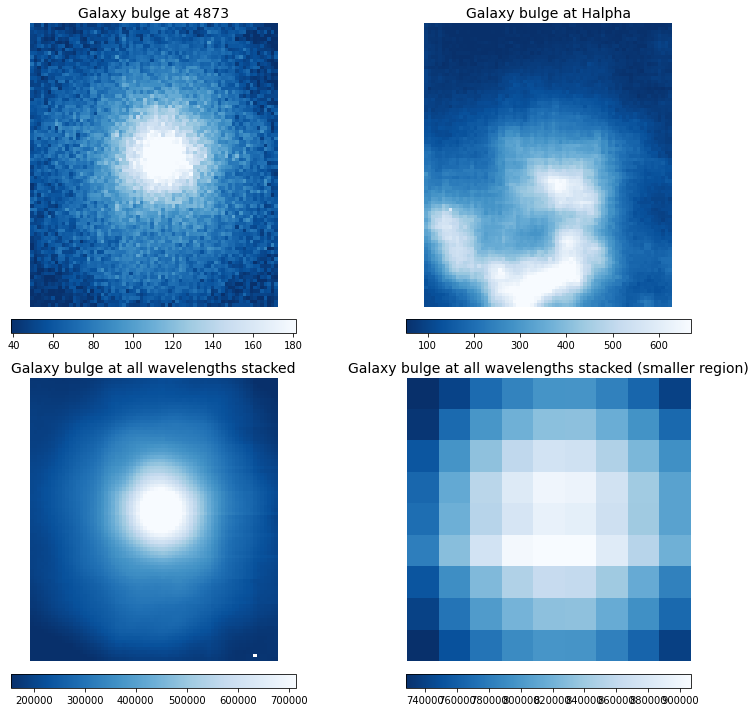

In [25]:
bulge=cube[:,140:220,270:340];
ebulge=ecube[:,140:220,270:340];

small_bulge=cube[:,178:187,302:311]
#small_bulge=cube[:,181:185,305:307]

images = [
    bulge[100],
    bulge[index], 
    stack_all(bulge),
    stack_all(small_bulge)
]

titles = [
    "Galaxy bulge at "+str(int(round(wave[100],0))),
    "Galaxy bulge at Halpha",
    "Galaxy bulge at all wavelengths stacked",
    "Galaxy bulge at all wavelengths stacked (smaller region)"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [26]:
stacked_bulge=stack(bulge,wave,number_images=10,central_wavelength=halpha_obs)
stacked_ebulge=stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs)

binned_bulge=binning(bulge[index],4)
ebinned_bulge=binning(ebulge[index],4)

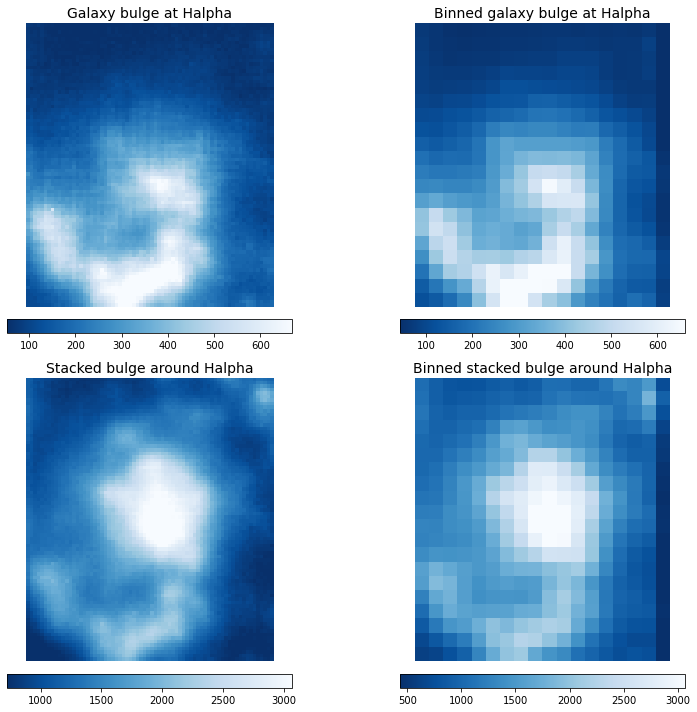

In [27]:
images = [
    bulge[index], 
    binned_bulge, 
    stacked_bulge, 
    binning(stacked_bulge, 4)
]

titles = [
    "Galaxy bulge at Halpha",
    "Binned galaxy bulge at Halpha",
    "Stacked bulge around Halpha",
    "Binned stacked bulge around Halpha"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [28]:
binned_stacked_bulge=binning(stack(bulge,wave,number_images=10,central_wavelength=halpha_obs),4)
binned_stacked_ebulge=binning(stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs),4)

print("Median SNR before binning = ",np.median(signaltonoise(stacked_bulge,stacked_ebulge)), "\nMedian SNR after stacking&binning = ",np.median(signaltonoise(binned_stacked_bulge,binned_stacked_ebulge)))
      

Median SNR before binning =  4.6879454 
Median SNR after stacking&binning =  4.642662903020382


so SNR is lower after binning?(*) could be because i am computing the same SNR for a bin for all the pixels that were collapsed

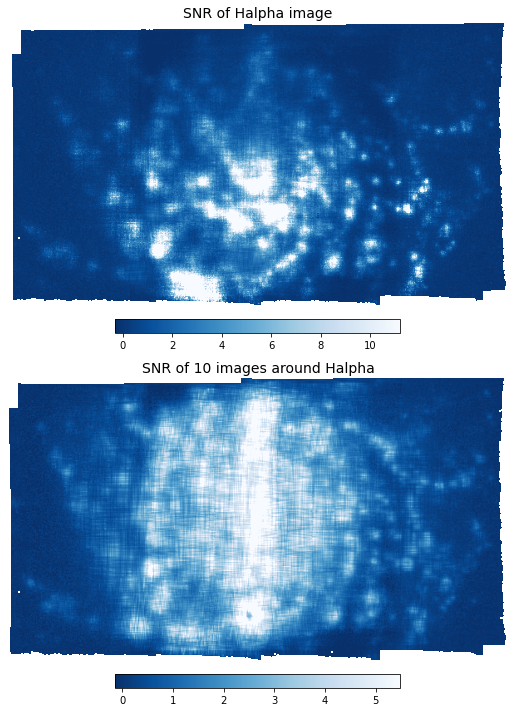

Average of SNR in the image is  1.5096688
Average of SNR in the image is  1.4523461
Median of SNR in the image is  0.4109841
Median of SNR in the image is  0.79283464

SNR gets worse on average, but not in median(**)


In [29]:
snr1=signaltonoise(cube[index],ecube[100])
#plot_image(snr,0,0,colormap='Blues_r',title="SNR of Halpha image")

stacked_galaxy=stack(cube,wave,number_images=10,central_wavelength=halpha_obs)
stacked_uncertainties=stack(ecube,wave,number_images=10,central_wavelength=halpha_obs)


snr2=signaltonoise(stacked_galaxy,stacked_uncertainties)

plot_images([snr1,snr2],wavelengths=[0, 0],colormap='Blues_r',titles=["SNR of Halpha image","SNR of 10 images around Halpha"])

print("Average of SNR in the image is ",np.nanmean(snr1))
print("Average of SNR in the image is ",np.nanmean(snr2))
print("Median of SNR in the image is ",np.nanmedian(snr1))
print("Median of SNR in the image is ",np.nanmedian(snr2))
print("\nSNR gets worse on average, but not in median(**)")

## Stacked galaxy bulge spetra

Text(0.5, 1.0, 'Median spectra of galaxy bulge')

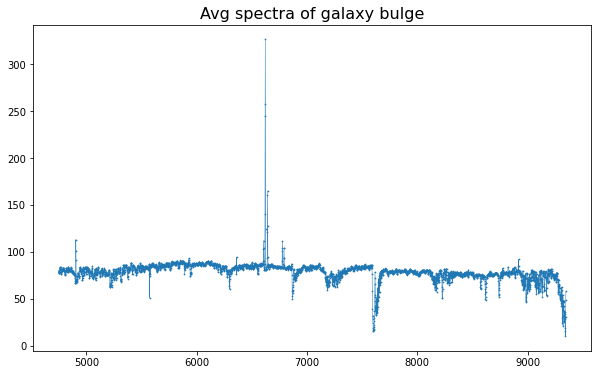

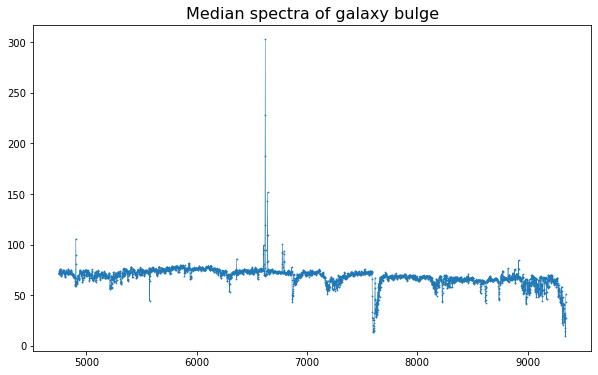

In [30]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(bulge),s=0.5)
plt.title("Avg spectra of galaxy bulge",fontsize=16)



plt.figure(figsize=(10,6))

median_bulge=median_spectra_of_region(bulge)
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)
plt.title("Median spectra of galaxy bulge",fontsize=16)




In [31]:
new_wave=wave/(1+z)
halpha_obs

6623.2630764

in x_obs we look for halpha_obs=6562.8*(1+z)

so in x_obs/(1+z) we look for 6562.8

Text(0.5, 1.0, 'Median spectra of smaller region of galaxy bulge')

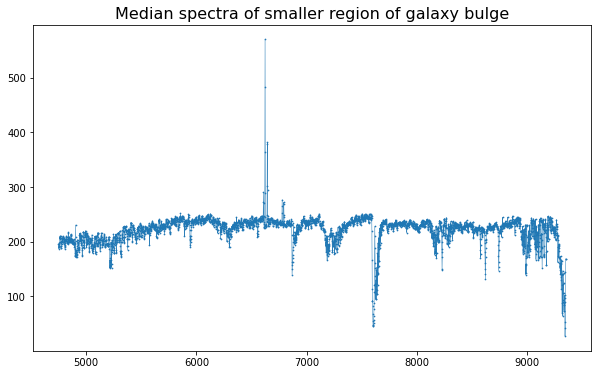

In [32]:
plt.figure(figsize=(10,6))



plt.plot(wave,median_spectra_of_region(small_bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_spectra_of_region(small_bulge),s=0.5)
plt.title("Median spectra of smaller region of galaxy bulge",fontsize=16)

#plt.xlim(halpha_obs-50,halpha_obs+50)

## Different galaxy regions

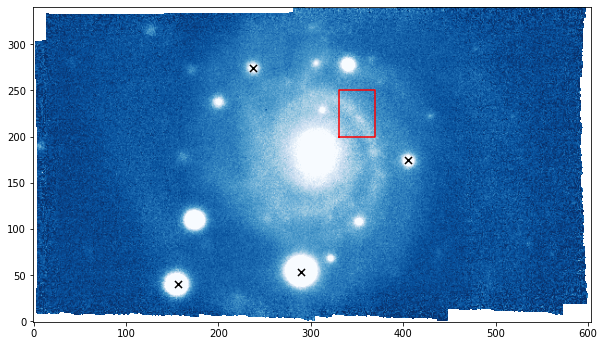

In [33]:
arm=cube[:,200:250,330:370]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [330, 330, 370, 370, 330]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline


star_x=[289,156,237,405]#175
star_y=[53,40,274,175]#110
plt.scatter(star_x,star_y,s=50,marker='x',c='black')


spectra at star (single pixel)

In [34]:
arr=np.transpose((star_x,star_y))
lbls = ["Star (single pixel spectra) at (x,y)= ({},{})".format(row[0], row[1]) for row in arr]

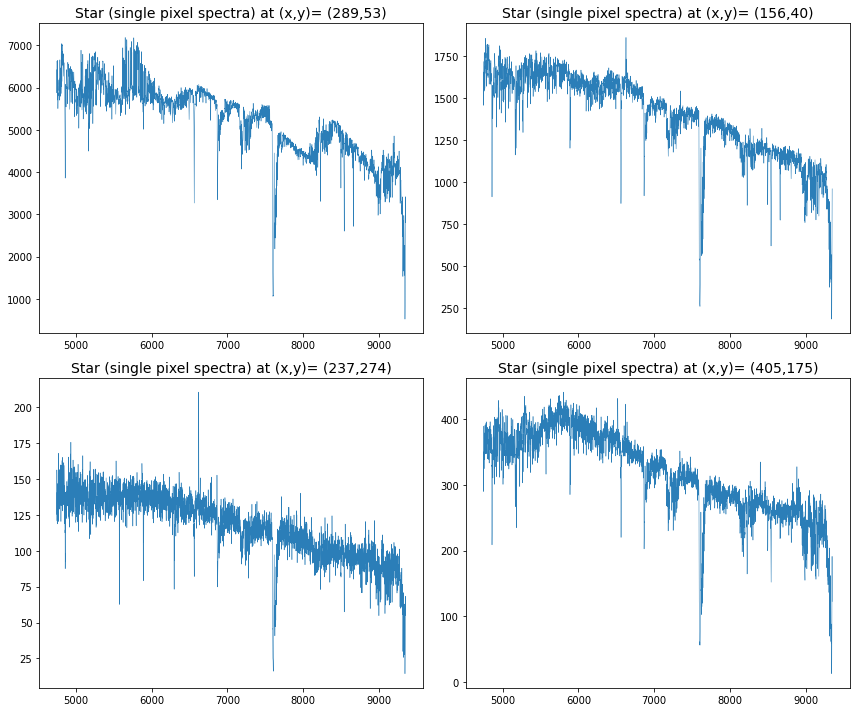

In [35]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = np.array(axes).reshape(-1)
    
for i in range(4):
    lo, up = np.nanpercentile(images[i], 2), np.nanpercentile(images[i], 98)
    im = axes[i].plot(wave,cube[:,star_y[i],star_x[i]],linewidth=0.5,alpha=0.95)
    axes[i].set_title(lbls[i], fontsize=14)
    
# Hide unused subplots if grid has extra slots
for j in range(4, len(axes)):
    axes[j].axis('off')
    
    

plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Median spectra of galaxy arm')

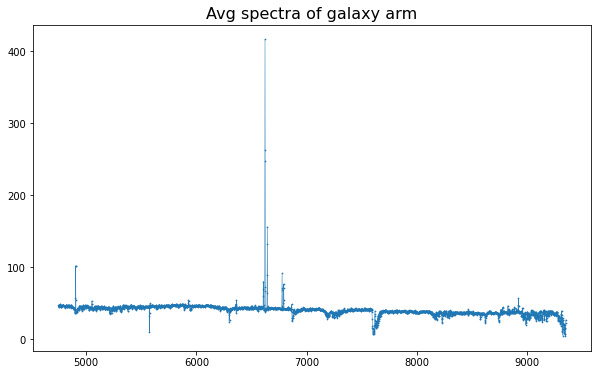

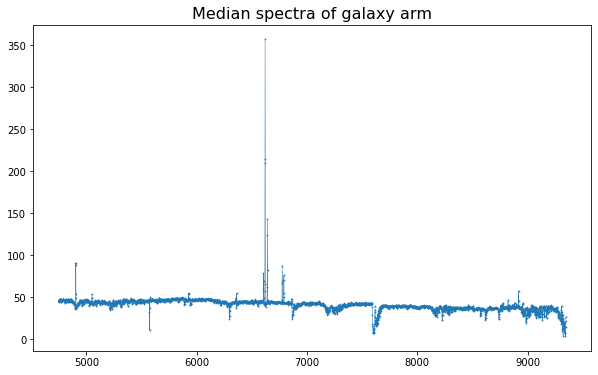

In [36]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(arm),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(arm),s=0.5)
plt.title("Avg spectra of galaxy arm",fontsize=16)



plt.figure(figsize=(10,6))

median_arm=median_spectra_of_region(arm)
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy arm",fontsize=16)

Text(0.5, 1.0, 'Median spectra of galaxy bg')

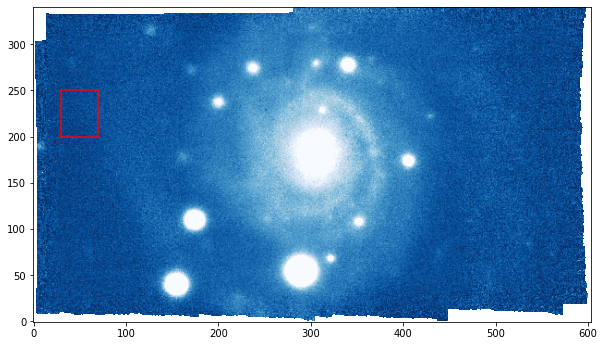

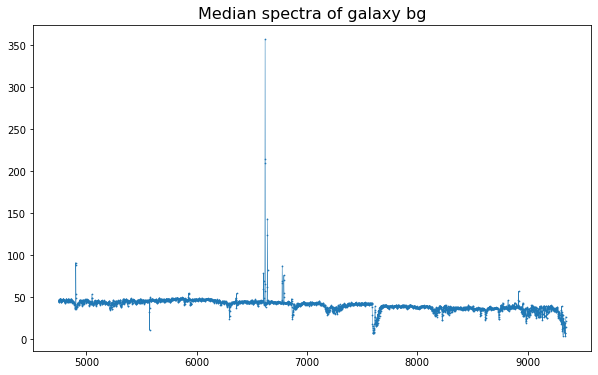

In [37]:
bg=cube[:,200:250,30:70]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [30, 30, 70, 70, 30]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline




plt.figure(figsize=(10,6))

plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy bg",fontsize=16)

## Plotting uncertainty of spectra

In [38]:
uncertainty=ecube[:,200:250,30:70]
y_err=np.sqrt(np.median(uncertainty, axis=(1, 2)));

np.median(uncertainty[2])

88.63081

In [39]:
median_bg=median_spectra_of_region(bg)

y_err2=mad(median_bg)
print(y_err,y_err2)

[      nan 10.026817  9.414394 ...  6.174121  7.762108       nan] 0.21641612


In [40]:
np.sqrt(y_err[2])

3.0682886

In [41]:
median_bg=median_spectra_of_region(bg)

Text(0.5, 1.0, 'Background spectra')

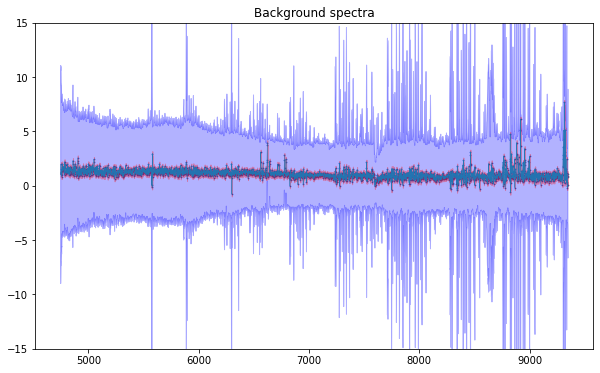

In [42]:
plt.figure(figsize=(10,6))

plt.plot(wave,median_bg,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bg,s=0.5)

plt.fill_between(wave,median_bg - y_err, median_bg + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bg - y_err2, median_bg + y_err2, color='red', alpha=0.3, label="Uncertainty")
plt.ylim(-15,15)

plt.title("Background spectra")

In [43]:
y_err2=mad(median_bulge)
print(y_err,y_err2)

[      nan 10.026817  9.414394 ...  6.174121  7.762108       nan] 3.808239


Text(0.5, 1.0, 'Bulge spectra')

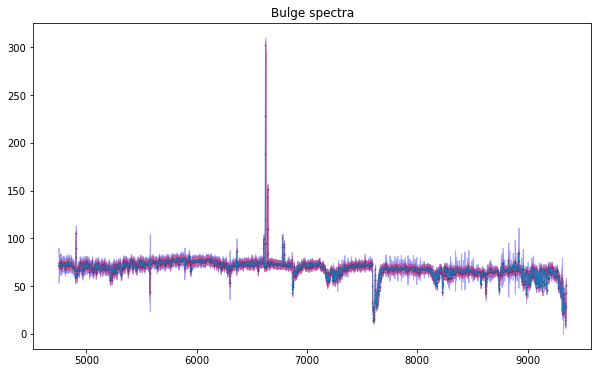

In [44]:
y_err=np.sqrt(np.median(ebulge, axis=(1, 2)));#median absolute deviaton=MAD

plt.figure(figsize=(10,6))

plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bulge - y_err2, median_bulge + y_err2, color='red', alpha=0.3, label="Uncertainty")
#plt.ylim(-15,15)
plt.title("Bulge spectra")

In [45]:
print("median snr of spectra is ",np.nanmedian(signaltonoise_spec(median_bulge,y_err)))

median snr of spectra is  13.528046


# EW

## EW - parametric

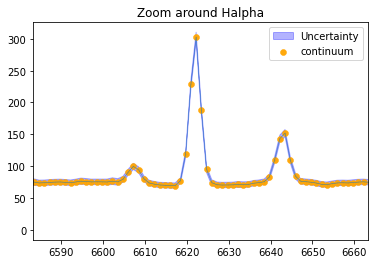

In [79]:
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")

x_min, x_max= plt.xlim(halpha_obs-40,halpha_obs+40)
plt.title("Zoom around Halpha")
x_chopped,y_chopped=chop_data(wave,median_bulge,x_min,x_max)

plt.scatter(x_chopped,y_chopped,linewidth=0.5,alpha=0.95,color="orange",label="continuum")

plt.legend()

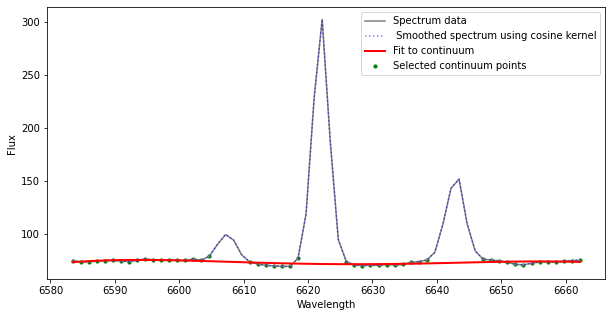

In [80]:
y_smooth=smooth_spectra(y_chopped,kernel_size=3)

continuum_fit, x_continuum, y_continuum=continuum(x_chopped,y_smooth)

y_continuum_fit = continuum_fit(x_chopped)


plt.figure(figsize=(10, 5))
plt.plot(x_chopped, y_chopped, label="Spectrum data", color="gray")
plt.plot(x_chopped, y_smooth, label=" Smoothed spectrum using cosine kernel", color="blue", alpha=0.5,linestyle="dotted")
plt.plot(x_chopped, y_continuum_fit, label="Fit to continuum", color="red", linewidth=2)
plt.scatter(x_continuum, y_continuum, color="green", s=10, label="Selected continuum points")
plt.xlabel("Wavelength")
plt.ylabel("Flux")
plt.legend()
#plt.xlim(6400,6500)
plt.show()

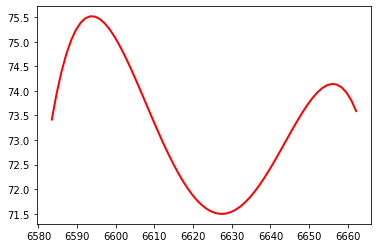

In [81]:
plt.plot(x_chopped, y_continuum_fit, label="Fitted Continuum (5th order)", color="red", linewidth=2)


Text(0.5, 1.0, 'Zoom around Halpha')

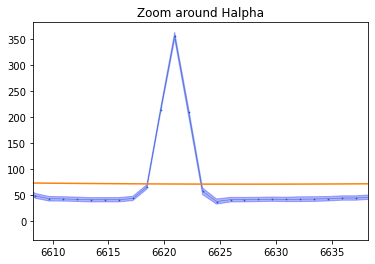

In [82]:
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)

plt.fill_between(wave,median_arm - y_err, median_arm + y_err, color='blue', alpha=0.3, label="Uncertainty")
#plt.ylim(-5,100)
plt.xlim(halpha_obs-15,halpha_obs+15)
plt.plot(x_chopped,y_continuum_fit)
plt.title("Zoom around Halpha")

Fitted Amplitude (A): 273.6439339911932
Fitted Mean (mu): 6622.004933078529
Fitted Standard Deviation (sigma): 1.9796754091079758
Integral using Trapezoidal's rule: 1277.3148


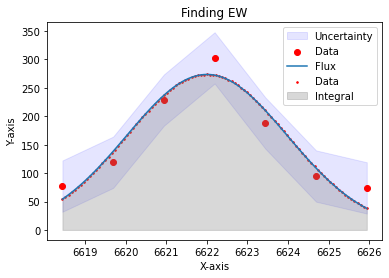

In [84]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6627)[1])

x = wave[bound1:bound2]
y = median_bulge[bound1:bound2]

y_err=np.full(len(y), mad(y))#np.sqrt(np.median(ebulge, axis=(1, 2)));


initial_guess = initial_guess = [max(y), np.mean(x), np.std(x)]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess, sigma=y_err, absolute_sigma=True)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(min(x), max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])



# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")


##

xx = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

#integral
integral = trapz(y_fit, xx)

print(f"Integral using Trapezoidal's rule: {integral:.4f}")

plt.fill_between(x,y - y_err, y + y_err, color='blue', alpha=0.1, label="Uncertainty")

plt.scatter(x, y, label="Data", color="red")
plt.plot(xx, y_fit, label="Flux")
plt.scatter(xx, y_fit, label="Data", color="red",s=2.4)
#plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(xx, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


integrating smoothed spectra

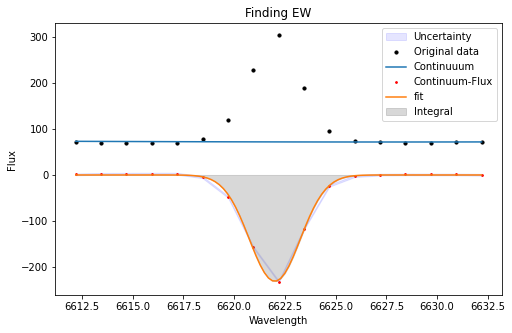

EW calculated through a parametric approach is ==  -10.077906776842157


In [85]:
bound1=halpha_obs-40
bound2=halpha_obs+40

x,y=chop_data(wave,median_bulge,bound1,bound2)


print("EW calculated through a parametric approach is == ", EW_parametric(x,y,continuum_fit,method=0,plots=True))

## fitting cont+peak together - parametric

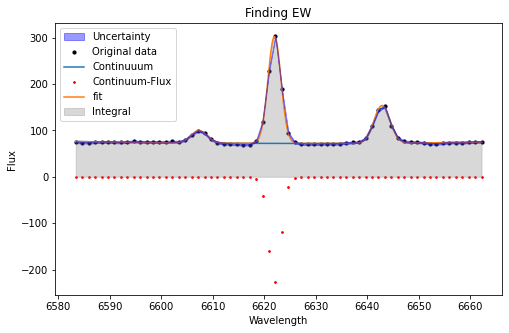

EW calculated through a parametric approach is ==  -10.031259716383907


In [90]:
bound1=halpha_obs-40
bound2=halpha_obs+40

x,y=chop_data(wave,median_bulge,bound1,bound2)

    
print("EW calculated through a parametric approach is == ", EW_parametric(x,y,continuum_fit,method=1,plots=True))

## picking region

In [92]:
x1=300
x2=420
y1=120
y2=200

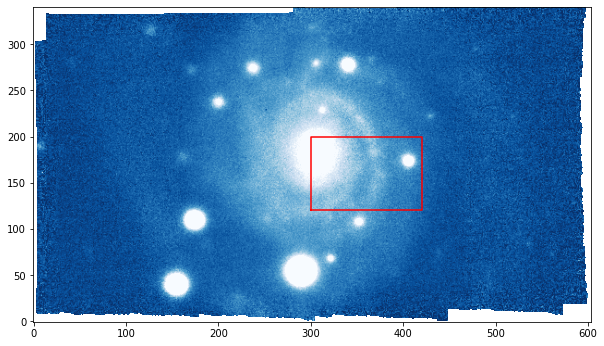

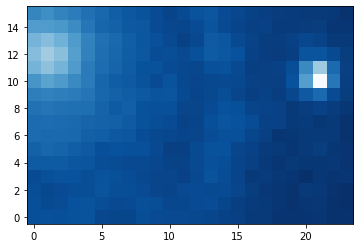

(8, 12)


In [93]:
region=cube[:,y1:y2,x1:x2]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [x1, x1, x2, x2, x1]
y_coords = [y1, y2, y2, y1, y1] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline

plt.show()

plt.imshow(binning(region[10], 5),"Blues_r",origin='lower');

plt.show()

print(np.shape(binning(region[10], 10)))

In [94]:
binned_region=[]

for w in range(0,len(wave)):
    binned_region.append(binning(region[w], 5))

In [96]:
binned_region=np.array(binned_region)

## EW map - parametric

sigma f is  [1.03564251e-09 1.35625882e-07 9.22621618e-06 3.27060210e-04
 6.05373352e-03 5.85832017e-02 2.96646113e-01 7.86388634e-01
 1.09162155e+00 7.93498407e-01 3.01968543e-01 6.01324419e-02
 6.26087857e-03 3.40401816e-04 9.64565019e-06 1.42009133e-07
 1.08073277e-09]
 


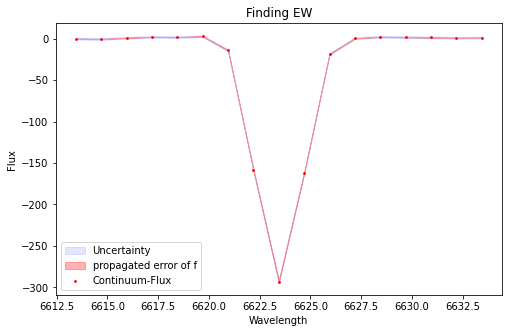

EW= -17.642460169183018  at (i,j)= 0 , 0
sigma f is  [2.28457201e-09 2.47481471e-07 1.43119494e-05 4.42291522e-04
 7.31270889e-03 6.47683409e-02 3.07698503e-01 7.85017768e-01
 1.07651658e+00 7.93899300e-01 3.14857120e-01 6.71194811e-02
 7.68377989e-03 4.71822974e-04 1.55202166e-05 2.73134178e-07
 2.56866693e-09]
 


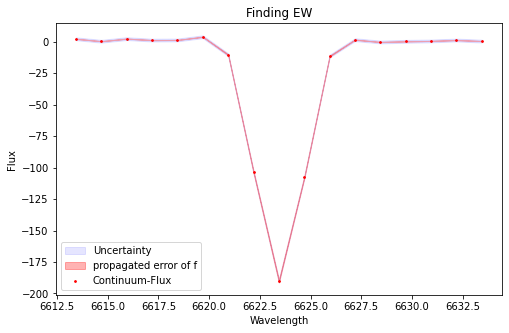

EW= -12.01099203768956  at (i,j)= 0 , 1
sigma f is  [6.23646329e-09 5.92421151e-07 3.03609008e-05 8.40435378e-04
 1.25841114e-02 1.02089140e-01 4.49490620e-01 1.07582593e+00
 1.40147552e+00 9.94350736e-01 3.84220470e-01 8.07936577e-02
 9.23333221e-03 5.72551111e-04 1.92309150e-05 3.49313788e-07
 3.42652592e-09]
 


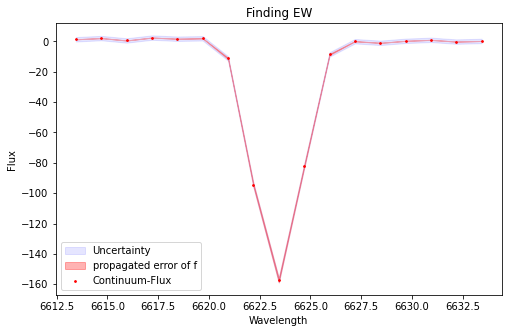

EW= -10.117071158443565  at (i,j)= 0 , 2
sigma f is  [4.23540260e-09 4.00612972e-07 2.04779096e-05 5.66016938e-04
 8.46487147e-03 6.85361605e-02 3.00586187e-01 7.14447380e-01
 9.20593181e-01 6.43181288e-01 2.43645805e-01 5.00330403e-02
 5.56762339e-03 3.35572313e-04 1.09486037e-05 1.93252238e-07
 1.84425447e-09]
 


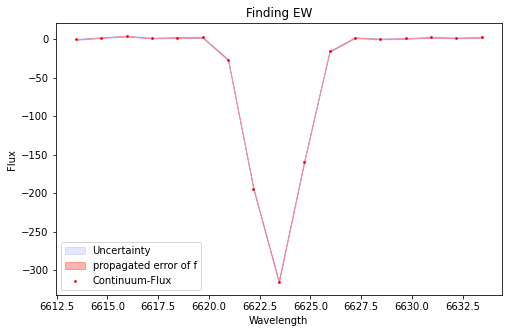

EW= -18.108355748306742  at (i,j)= 0 , 3
sigma f is  [1.08821490e-08 1.03097544e-06 5.27738414e-05 1.46029293e-03
 2.18509203e-02 1.76856898e-01 7.74418673e-01 1.83476572e+00
 2.35212017e+00 1.63158872e+00 6.12360819e-01 1.24335780e-01
 1.36550466e-02 8.10921553e-04 2.60308440e-05 4.51437480e-07
 4.22671366e-09]
 


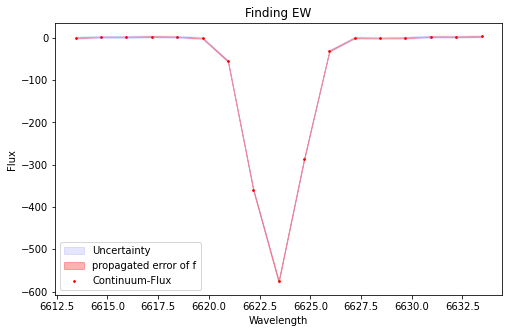

EW= -27.430869117754316  at (i,j)= 0 , 4
sigma f is  [1.33712690e-08 1.26852985e-06 6.48649548e-05 1.78837964e-03
 2.65930478e-02 2.13315350e-01 9.23171235e-01 2.15569119e+00
 2.71614220e+00 1.84662298e+00 6.77395489e-01 1.34061015e-01
 1.43117739e-02 8.23991360e-04 2.55778665e-05 4.27908030e-07
 3.85617955e-09]
 


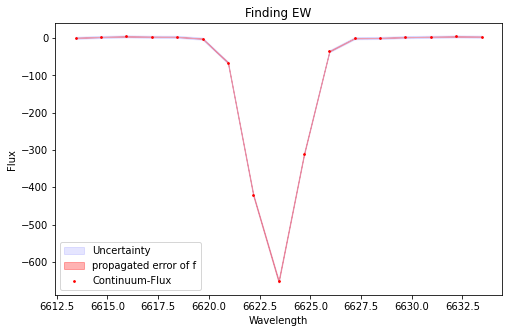

EW= -25.229420935519332  at (i,j)= 0 , 5
sigma f is  [1.85900660e-08 1.55842719e-06 7.10851034e-05 1.76486458e-03
 2.38581358e-02 1.75669278e-01 7.04715086e-01 1.54059540e+00
 1.83564006e+00 1.19217472e+00 4.22022838e-01 8.14192881e-02
 8.55914976e-03 4.90155158e-04 1.52862933e-05 2.59530740e-07
 2.39794764e-09]
 


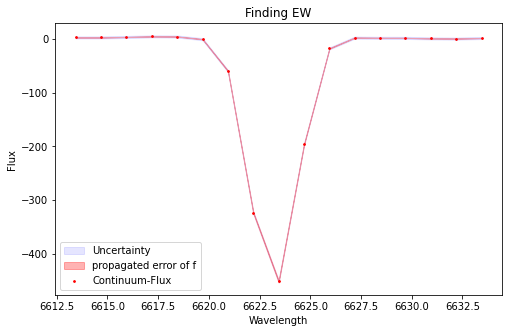

EW= -16.44277772995488  at (i,j)= 0 , 6
sigma f is  [1.24855807e-08 1.15711864e-06 5.66924124e-05 1.47339413e-03
 2.03552354e-02 1.49686138e-01 5.86412095e-01 1.22447784e+00
 1.36304625e+00 8.08821732e-01 2.55758714e-01 4.30682695e-02
 3.85801977e-03 1.83533471e-04 4.62431809e-06 6.14400760e-08
 4.27114804e-10]
 


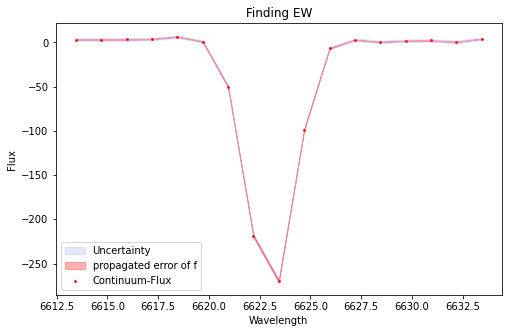

EW= -9.163496121647325  at (i,j)= 0 , 7
sigma f is  [2.10680095e-10 3.72037638e-08 3.38495840e-06 1.59873722e-04
 3.93637291e-03 5.06549627e-02 3.41228923e-01 1.20445478e+00
 2.22888486e+00 2.16279616e+00 1.10030087e+00 2.93333342e-01
 4.09417339e-02 2.98723195e-03 1.13661813e-04 2.24629437e-06
 2.28970601e-08]
 


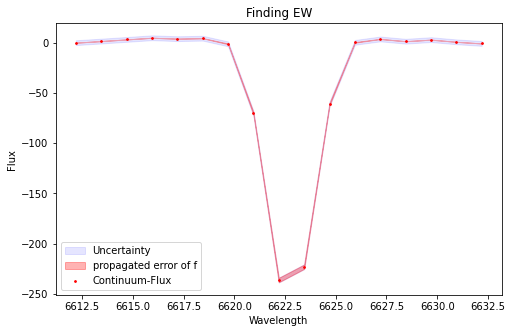

EW= -7.7062991640135  at (i,j)= 0 , 8
sigma f is  [8.80383617e-10 1.13964939e-07 7.92162732e-06 2.95814709e-04
 5.93766084e-03 6.40956445e-02 3.72282204e-01 1.16393998e+00
 1.95949065e+00 1.77661406e+00 8.67558019e-01 2.28145129e-01
 3.23013745e-02 2.46131013e-03 1.00889996e-04 2.22354007e-06
 2.63346648e-08]
 


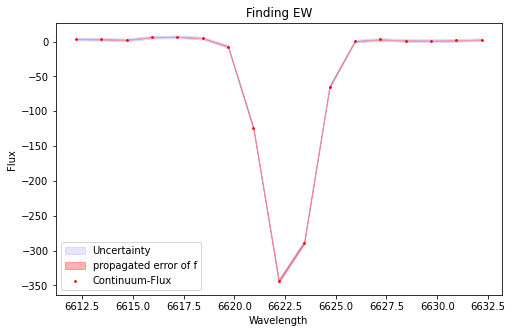

EW= -9.153739931855522  at (i,j)= 0 , 9
sigma f is  [4.55623594e-09 4.90604210e-07 2.87708952e-05 9.19917085e-04
 1.60491444e-02 1.52861600e-01 7.95151841e-01 2.25949234e+00
 3.50781148e+00 2.97534794e+00 1.37874541e+00 3.48978251e-01
 4.82338135e-02 3.63873720e-03 1.49733409e-04 3.35786146e-06
 4.09845785e-08]
 


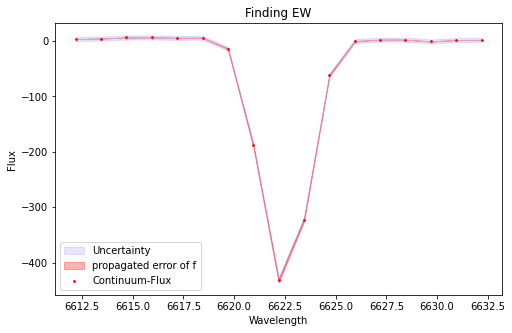

EW= -8.731399941570238  at (i,j)= 0 , 10
sigma f is  [5.56593094e-09 5.52833189e-07 2.99374695e-05 8.84750076e-04
 1.42793294e-02 1.25917553e-01 6.06875548e-01 1.59896487e+00
 2.30329905e+00 1.81400730e+00 7.81033339e-01 1.83807405e-01
 2.36368831e-02 1.66019918e-03 6.36503783e-05 1.33084859e-06
 1.51563973e-08]
 


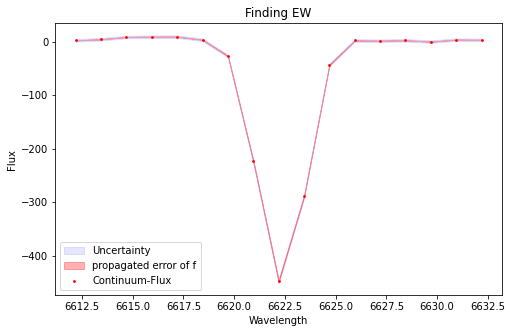

EW= -6.699178600321011  at (i,j)= 0 , 11
sigma f is  [2.32249423e-08 2.14717340e-06 1.06474168e-04 2.83691237e-03
 4.06612813e-02 3.13756216e-01 1.30408007e+00 2.92045690e+00
 3.52444328e+00 2.29199038e+00 8.03039012e-01 1.51531207e-01
 1.53904603e-02 8.40615391e-04 2.46583400e-05 3.87691575e-07
 3.25700972e-09]
 


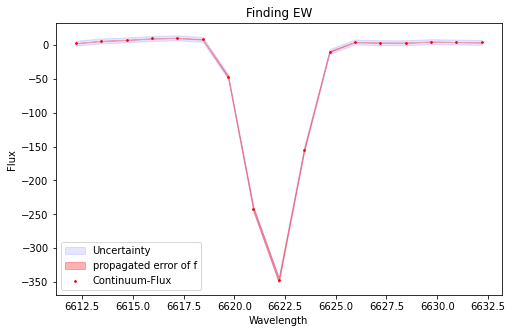

EW= -4.6052046155003055  at (i,j)= 0 , 12
sigma f is  [6.42938187e-10 9.75736174e-08 7.85708437e-06 3.36397765e-04
 7.66842023e-03 9.31593709e-02 6.03517695e-01 2.08580833e+00
 3.84663629e+00 3.78569421e+00 1.98811020e+00 5.57023467e-01
 8.32295206e-02 6.62813483e-03 2.81079000e-04 6.33898527e-06
 7.58780010e-08]
 


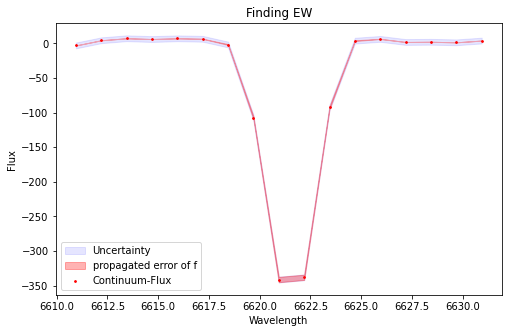

EW= -5.749437470662381  at (i,j)= 0 , 13
sigma f is  [1.89126096e-09 2.28008210e-07 1.47776519e-05 5.15348797e-04
 9.67638327e-03 9.78671223e-02 5.33345532e-01 1.56645112e+00
 2.47975603e+00 2.11590219e+00 9.73085866e-01 2.41163721e-01
 3.22011330e-02 2.31563285e-03 8.96358841e-05 1.86634549e-06
 2.08812601e-08]
 


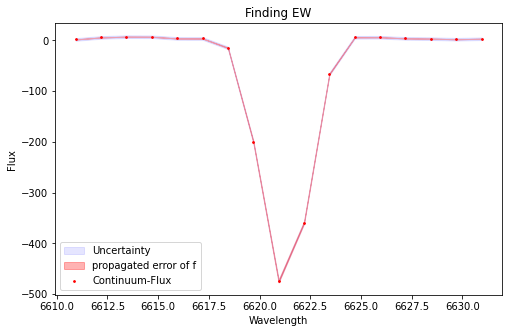

EW= -9.119135774723027  at (i,j)= 0 , 14
sigma f is  [7.17086501e-09 7.13279008e-07 3.87852454e-05 1.15330446e-03
 1.87604103e-02 1.66995613e-01 8.13693674e-01 2.17078286e+00
 3.17138106e+00 2.53746018e+00 1.11191852e+00 2.66830493e-01
 3.50603946e-02 2.52183306e-03 9.92680415e-05 2.13774169e-06
 2.51770009e-08]
 


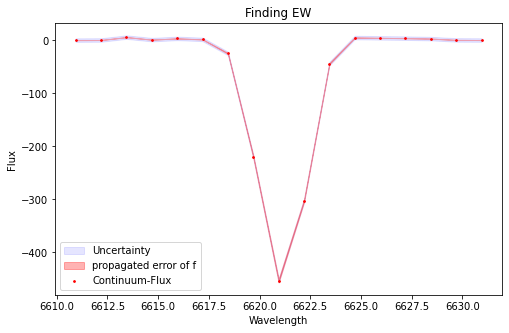

EW= -11.157484335765341  at (i,j)= 0 , 15
sigma f is  [1.57205240e-09 1.89248060e-07 1.19978844e-05 4.01560539e-04
 7.10661018e-03 6.65728068e-02 3.30333641e-01 8.68584099e-01
 1.21049082e+00 8.94139526e-01 3.49996306e-01 7.25710518e-02
 7.96559374e-03 4.62366390e-04 1.41710047e-05 2.28790474e-07
 1.93848945e-09]
 


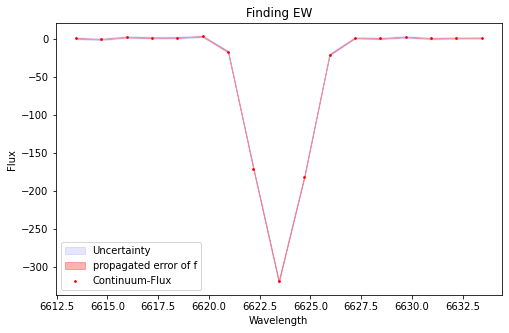

EW= -19.269868230901313  at (i,j)= 1 , 0
sigma f is  [1.70177995e-09 2.20926462e-07 1.47591232e-05 5.11639651e-04
 9.24605921e-03 8.73409455e-02 4.31975029e-01 1.11966283e+00
 1.52156621e+00 1.08409934e+00 4.04793995e-01 7.91364390e-02
 8.08693982e-03 4.30799295e-04 1.19082120e-05 1.69382145e-07
 1.21859367e-09]
 


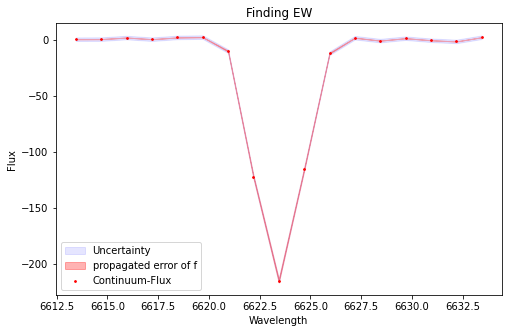

EW= -13.420086206118159  at (i,j)= 1 , 1
sigma f is  [4.06604817e-09 4.30543233e-07 2.43012118e-05 7.31893524e-04
 1.17757760e-02 1.01347677e-01 4.67183931e-01 1.15484982e+00
 1.53220882e+00 1.09162265e+00 4.17615614e-01 8.57433385e-02
 9.43920185e-03 5.56491328e-04 1.75469076e-05 2.95531995e-07
 2.65561055e-09]
 


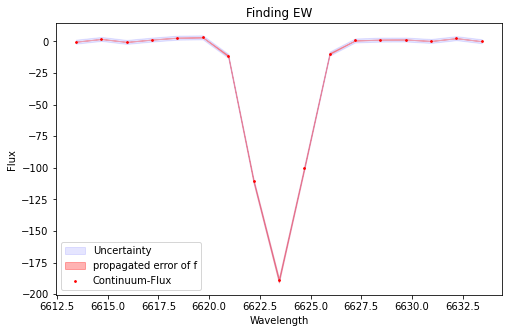

EW= -11.885943275381772  at (i,j)= 1 , 2
sigma f is  [6.44063555e-09 6.16292411e-07 3.17674303e-05 8.82735484e-04
 1.32334452e-02 1.07116491e-01 4.68500253e-01 1.10793563e+00
 1.41733923e+00 9.81045280e-01 3.67406437e-01 7.44252496e-02
 8.15052957e-03 4.82223522e-04 1.54018274e-05 2.65344279e-07
 2.46390847e-09]
 


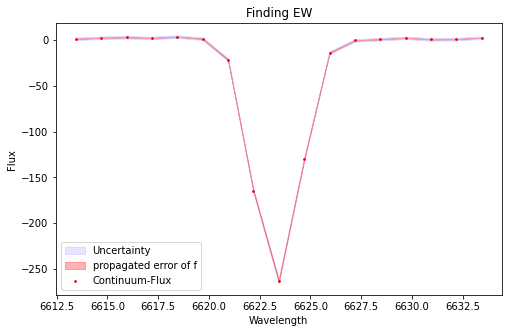

EW= -15.241261537933333  at (i,j)= 1 , 3
sigma f is  [3.72149933e-09 4.22232642e-07 2.52298952e-05 7.94852121e-04
 1.32128869e-02 1.15952815e-01 5.37394216e-01 1.31561392e+00
 1.70149996e+00 1.16251915e+00 4.19548169e-01 7.99601454e-02
 8.04470017e-03 4.27018326e-04 1.19490403e-05 1.76062411e-07
 1.36368324e-09]
 


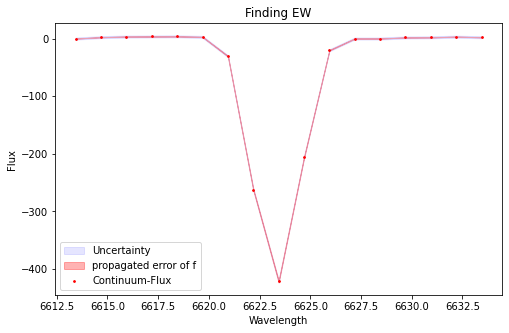

EW= -19.694027236655234  at (i,j)= 1 , 4
sigma f is  [4.04528747e-09 4.24987320e-07 2.37617822e-05 7.07333863e-04
 1.12133665e-02 9.46900069e-02 4.25982662e-01 1.02103104e+00
 1.30395814e+00 8.87287462e-01 3.21676338e-01 6.21276011e-02
 6.39136117e-03 3.50146553e-04 1.02123084e-05 1.58504389e-07
 1.30848657e-09]
 


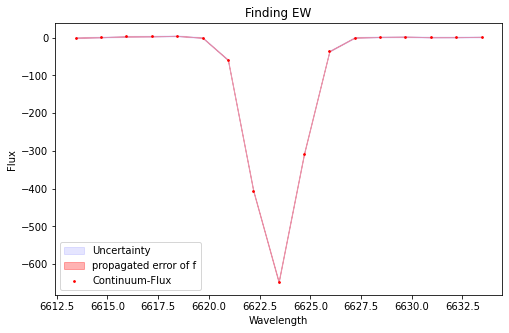

EW= -25.033332640664423  at (i,j)= 1 , 5
sigma f is  [1.66623494e-08 1.55698911e-06 7.81621726e-05 2.10858029e-03
 3.05761452e-02 2.38386558e-01 9.99493736e-01 2.25398420e+00
 2.73428219e+00 1.78434808e+00 6.26402059e-01 1.18284981e-01
 1.20129159e-02 6.56035111e-04 1.92604101e-05 3.03914641e-07
 2.57671450e-09]
 


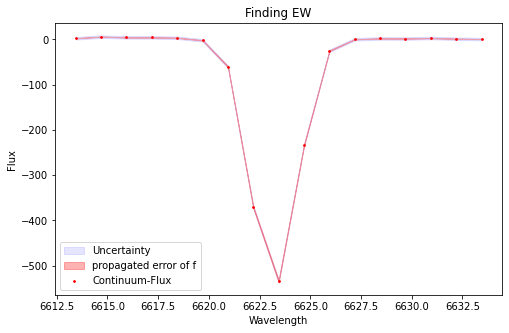

EW= -19.173826628233602  at (i,j)= 1 , 6
sigma f is  [1.56850511e-08 1.47729763e-06 7.36490135e-05 1.94427092e-03
 2.71899963e-02 2.01504386e-01 7.91630572e-01 1.64904595e+00
 1.82173873e+00 1.06735636e+00 3.31652564e-01 5.46441499e-02
 4.77294743e-03 2.20941267e-04 5.41821789e-06 7.03647416e-08
 4.83725023e-10]
 


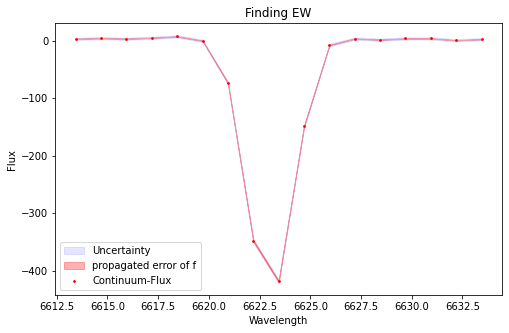

EW= -14.181808454182027  at (i,j)= 1 , 7
sigma f is  [3.24088605e-08 2.91590881e-06 1.38286819e-04 3.45876327e-03
 4.56491823e-02 3.18086276e-01 1.17073099e+00 2.27680873e+00
 2.34019707e+00 1.27135388e+00 3.65030858e-01 5.53778397e-02
 4.43734776e-03 1.87710185e-04 4.18986059e-06 4.93195865e-08
 3.05993199e-10]
 


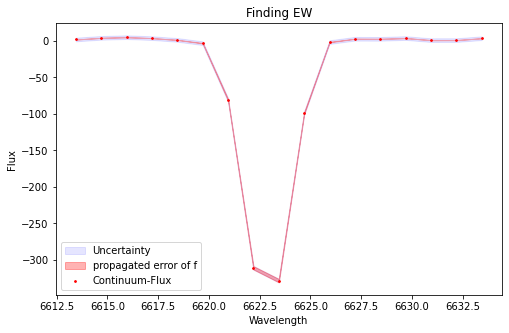

EW= -10.642636279271272  at (i,j)= 1 , 8
sigma f is  [3.83650439e-10 6.84902497e-08 6.31794344e-06 3.01620178e-04
 7.46020066e-03 9.56686421e-02 6.36412626e-01 2.19685642e+00
 3.93585506e+00 3.65996385e+00 1.76639484e+00 4.42374297e-01
 5.74695561e-02 3.87086925e-03 1.35075170e-04 2.43931024e-06
 2.27610879e-08]
 


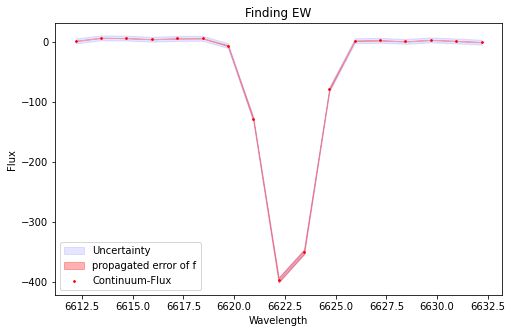

EW= -10.221208250922876  at (i,j)= 1 , 9
sigma f is  [1.94505682e-09 2.37938943e-07 1.56324730e-05 5.51871152e-04
 1.04726793e-02 1.06857972e-01 5.86366869e-01 1.73061639e+00
 2.74745971e+00 2.34621499e+00 1.07769043e+00 2.66237851e-01
 3.53694602e-02 2.52622702e-03 9.69764744e-05 1.99998687e-06
 2.21466171e-08]
 


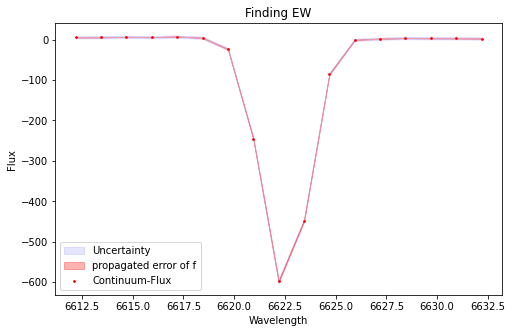

EW= -11.016366575430876  at (i,j)= 1 , 10
sigma f is  [4.92444993e-09 5.08130480e-07 2.84811382e-05 8.67765538e-04
 1.43789348e-02 1.29624077e-01 6.35897758e-01 1.69785559e+00
 2.46752476e+00 1.95197343e+00 8.40448897e-01 1.96931142e-01
 2.51065324e-02 1.74095407e-03 6.56324545e-05 1.34433681e-06
 1.49478343e-08]
 


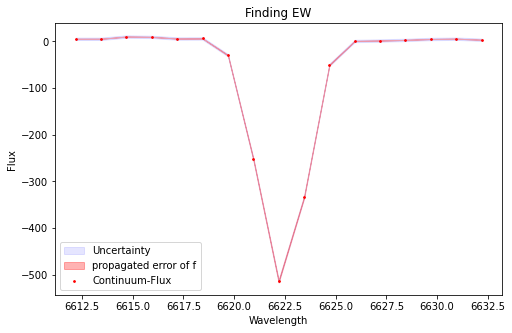

EW= -6.9082200373206  at (i,j)= 1 , 11
sigma f is  [1.71406334e-08 1.68315680e-06 8.72852971e-05 2.39607984e-03
 3.48715322e-02 2.69332304e-01 1.10467688e+00 2.40700235e+00
 2.78664442e+00 1.71408522e+00 5.60043334e-01 9.71491814e-02
 8.94014339e-03 4.35929358e-04 1.12424256e-05 1.52910702e-07
 1.09173815e-09]
 


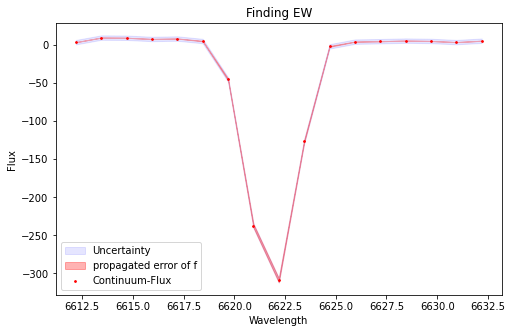

EW= -3.668307669528471  at (i,j)= 1 , 12
sigma f is  [5.96557096e-10 9.35877004e-08 7.69640938e-06 3.32390417e-04
 7.54799690e-03 9.01990129e-02 5.67551508e-01 1.88105328e+00
 3.28456349e+00 3.02177331e+00 1.46460920e+00 3.73906719e-01
 5.02598071e-02 3.55499629e-03 1.32203291e-04 2.58154936e-06
 2.64202688e-08]
 


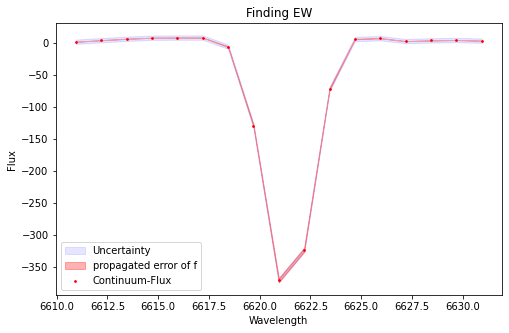

EW= -5.280719116112952  at (i,j)= 1 , 13
sigma f is  [1.92443827e-09 2.49313966e-07 1.71610023e-05 6.28054893e-04
 1.22273713e-02 1.26680217e-01 6.98612510e-01 2.05110695e+00
 3.20629450e+00 2.66863658e+00 1.18256133e+00 2.78966051e-01
 3.50252872e-02 2.33981220e-03 8.31307042e-05 1.56987068e-06
 1.57445487e-08]
 


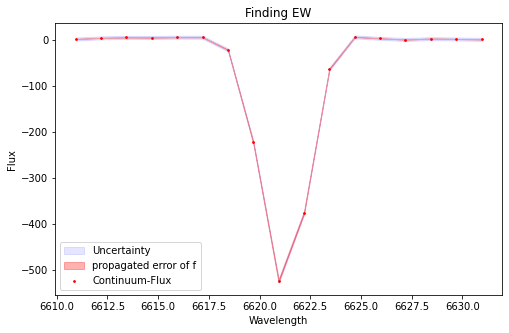

EW= -9.353362732811387  at (i,j)= 1 , 14
sigma f is  [2.28227486e-09 2.97064975e-07 2.04313267e-05 7.42741375e-04
 1.42760192e-02 1.45120975e-01 7.80401819e-01 2.22056219e+00
 3.34372232e+00 2.66474816e+00 1.12394370e+00 2.50880228e-01
 2.96320862e-02 1.85159368e-03 6.11940668e-05 1.06937625e-06
 9.87820364e-09]
 


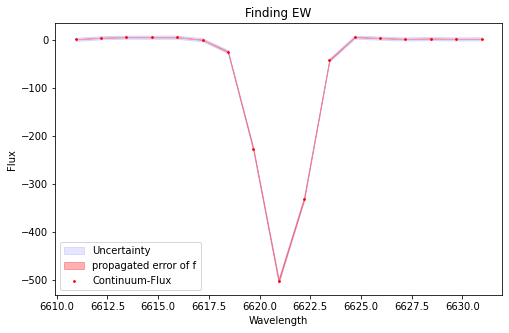

EW= -11.426697244168203  at (i,j)= 1 , 15
sigma f is  [4.74414408e-09 4.33505291e-07 2.16240414e-05 5.90265722e-04
 8.83114869e-03 7.24940887e-02 3.26739464e-01 8.08900260e-01
 1.10019413e+00 8.22104920e-01 3.37433113e-01 7.60460045e-02
 9.40381233e-03 6.37419587e-04 2.36465683e-05 4.78960277e-07
 5.27676941e-09]
 


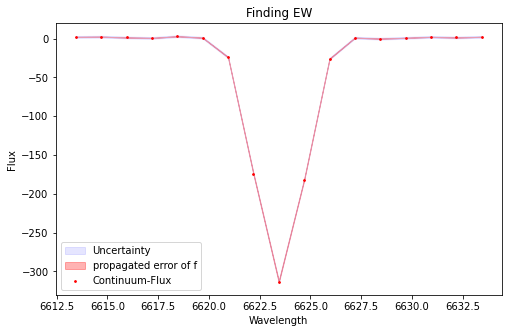

EW= -19.555395826512292  at (i,j)= 2 , 0
sigma f is  [3.59162893e-09 3.69639723e-07 2.03618224e-05 6.00933835e-04
 9.51243119e-03 8.08599348e-02 3.69551262e-01 9.09042989e-01
 1.20452952e+00 8.60123898e-01 3.30981647e-01 6.86022515e-02
 7.65233621e-03 4.58873630e-04 1.47744291e-05 2.55109989e-07
 2.35975274e-09]
 


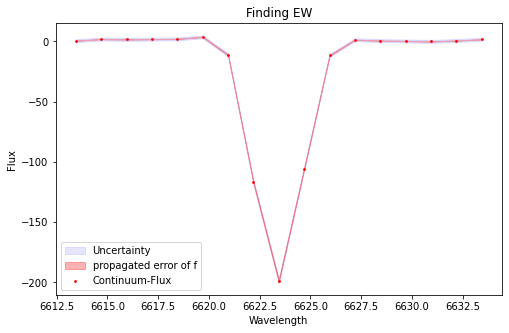

EW= -12.350840765169433  at (i,j)= 2 , 1
sigma f is  [8.02392965e-09 8.22911017e-07 4.48842502e-05 1.31016105e-03
 2.05404990e-02 1.73342558e-01 7.88482297e-01 1.93468597e+00
 2.56162692e+00 1.83022548e+00 7.05365037e-01 1.46519382e-01
 1.63813582e-02 9.83568853e-04 3.15977503e-05 5.39653858e-07
 4.83961686e-09]
 


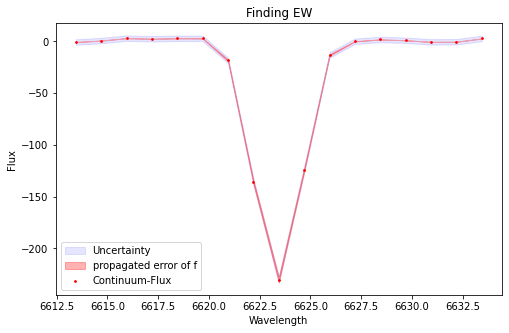

EW= -14.435862798259517  at (i,j)= 2 , 2
sigma f is  [3.65553203e-09 3.65221541e-07 1.94726996e-05 5.55937466e-04
 8.51673878e-03 7.01064351e-02 3.10352107e-01 7.39239903e-01
 9.47654839e-01 6.53794544e-01 2.42684476e-01 4.84407400e-02
 5.19452554e-03 2.98826178e-04 9.20128968e-06 1.51098383e-07
 1.31508792e-09]
 


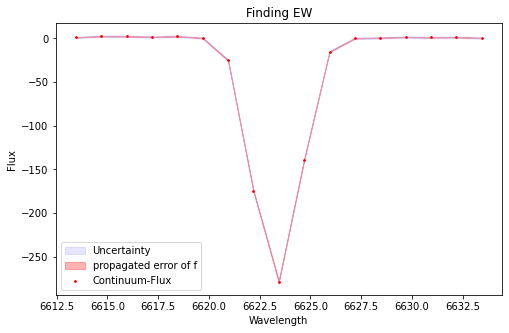

EW= -16.318792925281908  at (i,j)= 2 , 3
sigma f is  [2.60890873e-09 2.82196689e-07 1.61286317e-05 4.87981435e-04
 7.82542206e-03 6.65691276e-02 3.00563391e-01 7.20510646e-01
 9.17171768e-01 6.19955694e-01 2.22480675e-01 4.23728113e-02
 4.28044192e-03 2.29143493e-04 6.49181160e-06 9.71389427e-08
 7.65302424e-10]
 


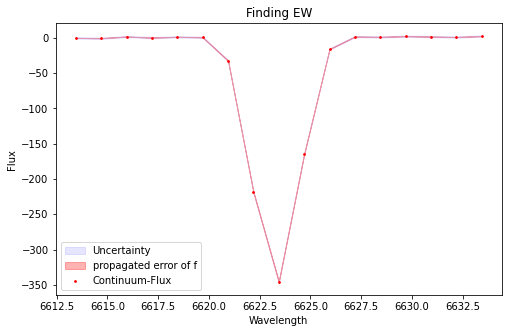

EW= -16.935219673001285  at (i,j)= 2 , 4
sigma f is  [5.96153582e-09 5.83994168e-07 3.06937652e-05 8.66014148e-04
 1.31222896e-02 1.06814718e-01 4.67172159e-01 1.09799810e+00
 1.38685181e+00 9.41368624e-01 3.43368199e-01 6.72931259e-02
 7.08430238e-03 4.00500980e-04 1.21535298e-05 1.97850337e-07
 1.72645058e-09]
 


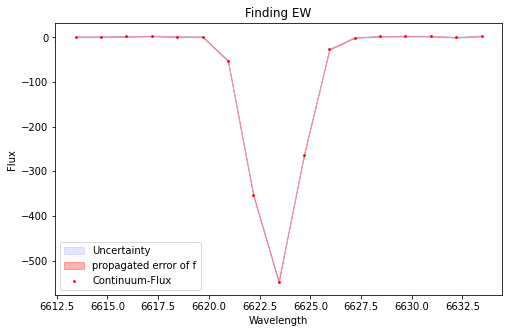

EW= -22.50930848136547  at (i,j)= 2 , 5
sigma f is  [2.77236056e-08 2.30741882e-06 1.04725703e-04 2.59263670e-03
 3.50185740e-02 2.58119940e-01 1.03847291e+00 2.28079057e+00
 2.73486869e+00 1.79047422e+00 6.39991404e-01 1.24888734e-01
 1.33033365e-02 7.73412130e-04 2.45348425e-05 4.24594907e-07
 4.00752244e-09]
 


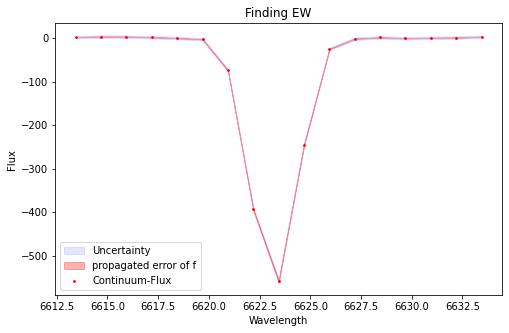

EW= -20.55388230516693  at (i,j)= 2 , 6
sigma f is  [2.37232168e-08 2.03778095e-06 9.37632731e-05 2.31241619e-03
 3.05808775e-02 2.16930944e-01 8.25607002e-01 1.68601387e+00
 1.84759794e+00 1.08643463e+00 3.42774727e-01 5.80159468e-02
 5.26626939e-03 2.56276919e-04 6.68244469e-06 9.32955891e-08
 6.96692687e-10]
 


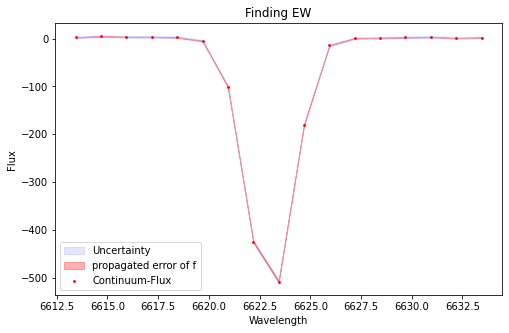

EW= -17.8780380726039  at (i,j)= 2 , 7
sigma f is  [4.31106118e-08 3.45696909e-06 1.48558346e-04 3.42263357e-03
 4.22915375e-02 2.80370217e-01 9.97538140e-01 1.90523859e+00
 1.95369090e+00 1.07564667e+00 3.17955242e-01 5.04518146e-02
 4.29631309e-03 1.96285017e-04 4.80942732e-06 6.31751070e-08
 4.44706543e-10]
 


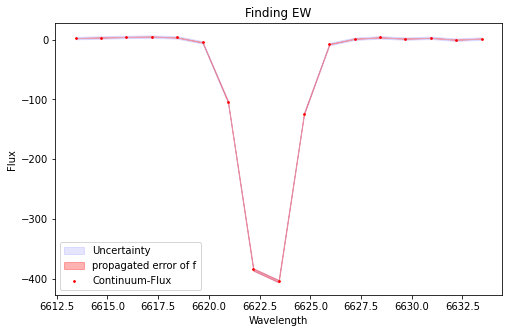

EW= -13.205664611508498  at (i,j)= 2 , 8
sigma f is  [7.71574854e-10 1.04720114e-07 7.61233700e-06 2.96694032e-04
 6.20486682e-03 6.96662893e-02 4.20089609e-01 1.36080840e+00
 2.36836208e+00 2.21469601e+00 1.11268930e+00 3.00306459e-01
 4.35288073e-02 3.38722549e-03 1.41425671e-04 3.16586697e-06
 3.79542744e-08]
 


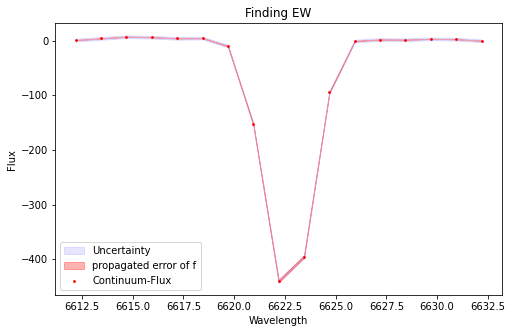

EW= -12.028225914288207  at (i,j)= 2 , 9
sigma f is  [4.20579831e-09 4.43518207e-07 2.55718291e-05 8.06532897e-04
 1.39205721e-02 1.31518645e-01 6.80296363e-01 1.92683942e+00
 2.98854410e+00 2.53832328e+00 1.18056572e+00 3.00640639e-01
 4.19131821e-02 3.19814715e-03 1.33521644e-04 3.04874514e-06
 3.80496994e-08]
 


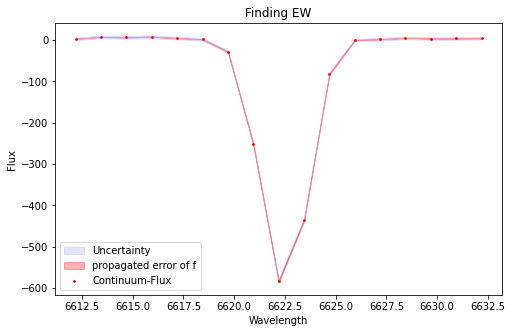

EW= -11.855033576213495  at (i,j)= 2 , 10
sigma f is  [1.42079476e-08 1.15596634e-06 5.24313772e-05 1.32611818e-03
 1.87080001e-02 1.47240794e-01 6.46656349e-01 1.58502233e+00
 2.16852453e+00 1.65610135e+00 7.05998546e-01 1.67992493e-01
 2.23098000e-02 1.65329527e-03 6.83543184e-05 1.57630900e-06
 2.02706479e-08]
 


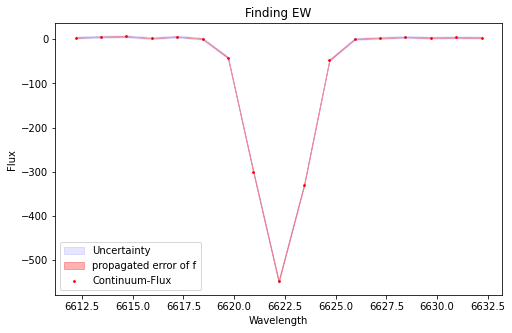

EW= -8.502927948612408  at (i,j)= 2 , 11
sigma f is  [2.77660401e-08 2.40625100e-06 1.12312538e-04 2.82641550e-03
 3.83782570e-02 2.81318588e-01 1.11358646e+00 2.38095271e+00
 2.74989870e+00 1.71558252e+00 5.78064965e-01 1.05171702e-01
 1.03276325e-02 5.47043243e-04 1.56166421e-05 2.39972241e-07
 1.98131007e-09]
 


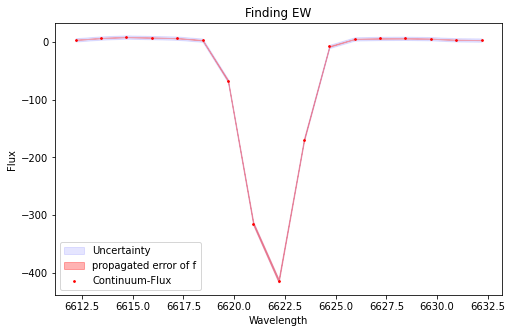

EW= -5.9019111635547485  at (i,j)= 2 , 12
sigma f is  [3.26946283e-10 5.60288158e-08 5.00850600e-06 2.33865383e-04
 5.70952311e-03 7.29289414e-02 4.87602712e-01 1.70698433e+00
 3.12942852e+00 3.00467855e+00 1.51079873e+00 3.97758801e-01
 5.48164630e-02 3.95262861e-03 1.49026137e-04 2.93518906e-06
 3.01595002e-08]
 


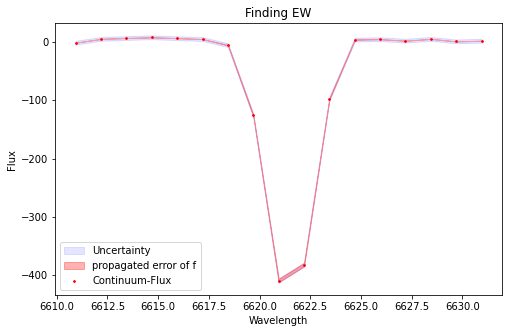

EW= -6.996519019694648  at (i,j)= 2 , 13
sigma f is  [2.04200133e-09 2.34196337e-07 1.45526941e-05 4.90100622e-04
 8.94837230e-03 8.86036001e-02 4.75910695e-01 1.38696187e+00
 2.19351459e+00 1.88275767e+00 8.77067959e-01 2.21732626e-01
 3.04175073e-02 2.26374278e-03 9.13753563e-05 1.99987408e-06
 2.37252827e-08]
 


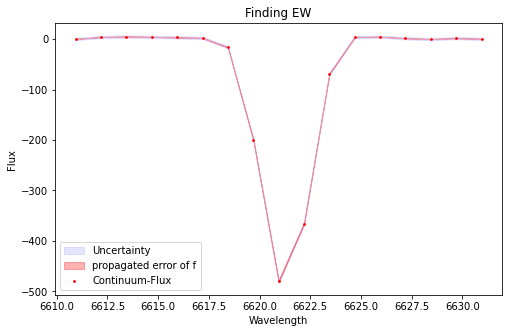

EW= -9.88272090615743  at (i,j)= 2 , 14
sigma f is  [2.42784116e-09 3.06354671e-07 2.05869038e-05 7.37062820e-04
 1.40654281e-02 1.43126211e-01 7.76909462e-01 2.25033589e+00
 3.47899392e+00 2.87109577e+00 1.26484507e+00 2.97426418e-01
 3.73236312e-02 2.49873431e-03 8.92129489e-05 1.69796290e-06
 1.72200161e-08]
 


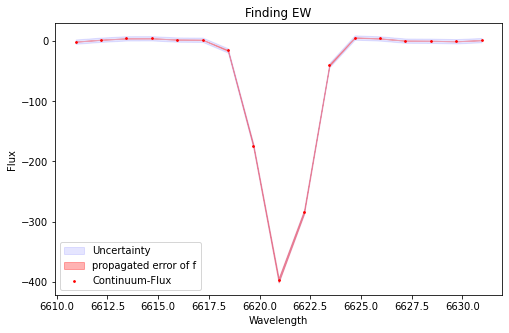

EW= -10.063446233311126  at (i,j)= 2 , 15
sigma f is  [8.84257769e-09 6.98978222e-07 3.06621712e-05 7.47626555e-04
 1.01432080e-02 7.66288300e-02 3.22512179e-01 7.56425082e-01
 9.88808456e-01 7.20415950e-01 2.92493039e-01 6.61570676e-02
 8.33201305e-03 5.83865513e-04 2.27399498e-05 4.91448297e-07
 5.87912156e-09]
 


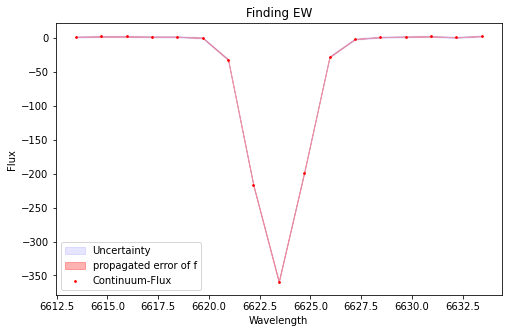

EW= -21.948592160194284  at (i,j)= 3 , 0
sigma f is  [1.33666813e-08 1.03576582e-06 4.45499695e-05 1.06478204e-03
 1.41602474e-02 1.04933448e-01 4.33955966e-01 1.00292704e+00
 1.29673075e+00 9.38499873e-01 3.80194157e-01 8.61559740e-02
 1.09090523e-02 7.70718474e-04 3.03357645e-05 6.64254882e-07
 8.08120929e-09]
 


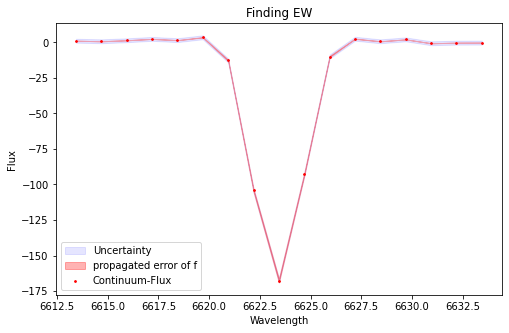

EW= -10.252893557579846  at (i,j)= 3 , 1
sigma f is  [1.81912523e-08 1.48516414e-06 6.66129969e-05 1.64344916e-03
 2.23373613e-02 1.67554315e-01 6.94937574e-01 1.59651921e+00
 2.03443619e+00 1.43904425e+00 5.64975131e-01 1.23006695e-01
 1.48295085e-02 9.88174523e-04 3.63273961e-05 7.35488212e-07
 8.18871796e-09]
 


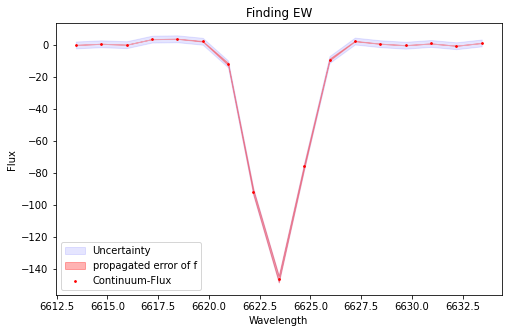

EW= -9.017243718530134  at (i,j)= 3 , 2
sigma f is  [1.01924343e-08 9.38031874e-07 4.65737040e-05 1.24888063e-03
 1.81097782e-02 1.42209755e-01 6.05607604e-01 1.40042961e+00
 1.76020190e+00 1.20311760e+00 4.47159049e-01 9.03120797e-02
 9.90122288e-03 5.88442316e-04 1.89306691e-05 3.29211808e-07
 3.09099758e-09]
 


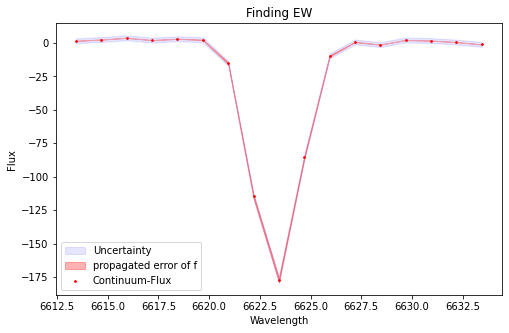

EW= -10.42023546584296  at (i,j)= 3 , 3
sigma f is  [1.38014571e-08 1.14169468e-06 5.15604434e-05 1.27234614e-03
 1.71726521e-02 1.26897563e-01 5.13899752e-01 1.14151219e+00
 1.39163481e+00 9.31406588e-01 3.42209217e-01 6.89919764e-02
 7.62693010e-03 4.61901896e-04 1.53095578e-05 2.77429106e-07
 2.74606185e-09]
 


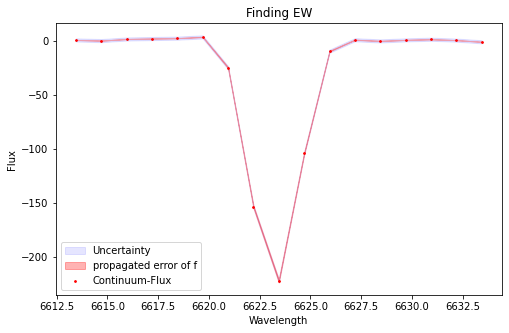

EW= -11.824963842119843  at (i,j)= 3 , 4
sigma f is  [1.95017638e-08 1.67926063e-06 7.86858506e-05 2.00748115e-03
 2.79018258e-02 2.11390278e-01 8.73438355e-01 1.96906034e+00
 2.42267071e+00 1.62704350e+00 5.96430179e-01 1.19313304e-01
 1.30207448e-02 7.74817734e-04 2.51273462e-05 4.43842122e-07
 4.26772882e-09]
 


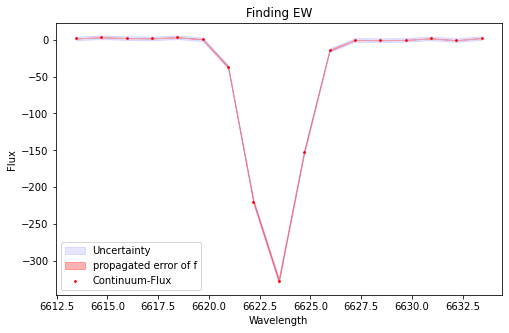

EW= -14.618584235215206  at (i,j)= 3 , 5
sigma f is  [1.35030789e-08 1.25064688e-06 6.19616394e-05 1.64279079e-03
 2.33183149e-02 1.77272835e-01 7.22057134e-01 1.57618962e+00
 1.84431686e+00 1.15687945e+00 3.89001364e-01 7.01068551e-02
 6.77030772e-03 3.50228906e-04 9.70115811e-06 1.43827381e-07
 1.14082826e-09]
 


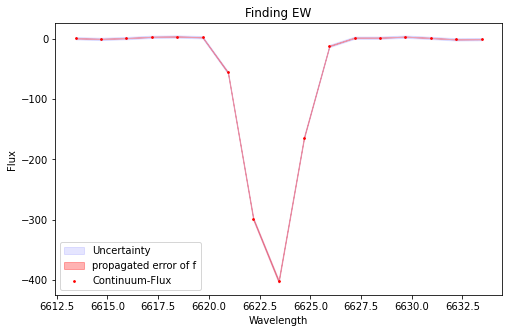

EW= -15.812204024573283  at (i,j)= 3 , 6
sigma f is  [3.22381425e-08 2.56226687e-06 1.10278193e-04 2.57289214e-03
 3.25640089e-02 2.23695979e-01 8.34311729e-01 1.68979799e+00
 1.85871351e+00 1.11031945e+00 3.60145775e-01 6.34140422e-02
 6.05877239e-03 3.13910233e-04 8.81170083e-06 1.33840622e-07
 1.09790803e-09]
 


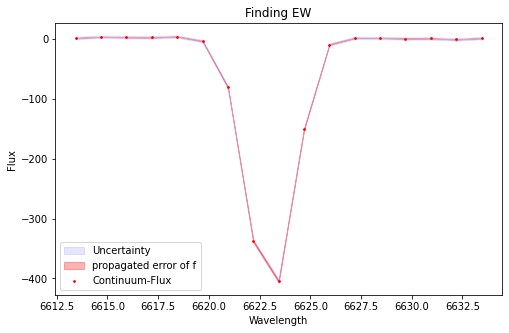

EW= -15.119530415061908  at (i,j)= 3 , 7
sigma f is  [3.27768450e-10 4.53188874e-08 3.37298495e-06 1.35204186e-04
 2.92034978e-03 3.40077445e-02 2.13617058e-01 7.24100321e-01
 1.32499193e+00 1.30909342e+00 6.98389526e-01 2.01165773e-01
 3.12778028e-02 2.62414180e-03 1.18743775e-04 2.89658497e-06
 3.80700570e-08]
 


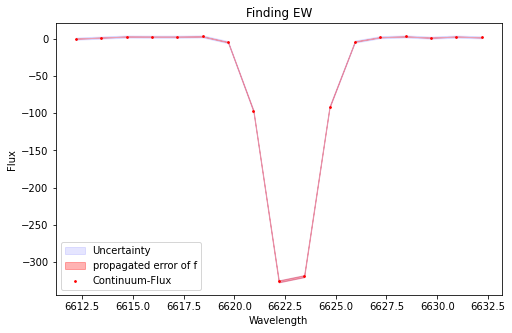

EW= -11.514084701804007  at (i,j)= 3 , 8
sigma f is  [2.27663694e-09 2.48997611e-07 1.49220795e-05 4.90424157e-04
 8.84488089e-03 8.75754592e-02 4.76187252e-01 1.42221818e+00
 2.33344031e+00 2.10320911e+00 1.04136306e+00 2.83203283e-01
 4.22934030e-02 3.46719613e-03 1.55957834e-04 3.84652237e-06
 5.19703299e-08]
 


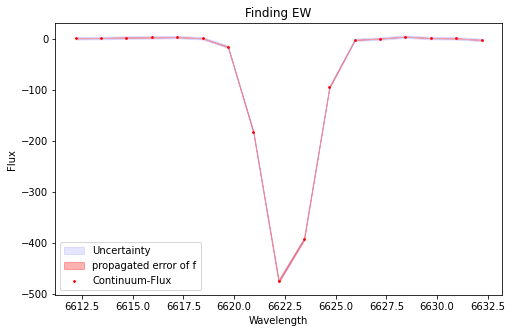

EW= -13.676099491514623  at (i,j)= 3 , 9
sigma f is  [2.05951991e-09 2.30856518e-07 1.39889729e-05 4.58579231e-04
 8.13686874e-03 7.81770887e-02 4.06814002e-01 1.14678200e+00
 1.75135343e+00 1.44904510e+00 6.49502422e-01 1.57693078e-01
 2.07339502e-02 1.47587141e-03 5.68479060e-05 1.18414939e-06
 1.33274025e-08]
 


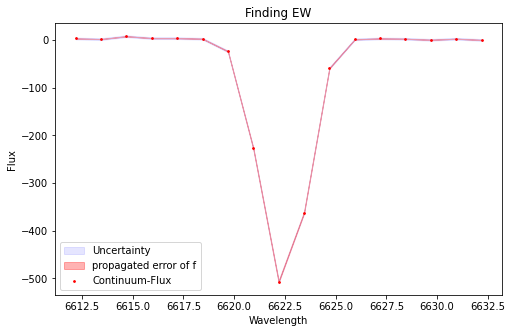

EW= -11.96654628448339  at (i,j)= 3 , 10
sigma f is  [1.20634271e-08 1.07051511e-06 5.19900955e-05 1.38286111e-03
 2.01557834e-02 1.61045918e-01 7.05573564e-01 1.69530709e+00
 2.23409574e+00 1.61473673e+00 6.40048320e-01 1.39111211e-01
 1.65742569e-02 1.08208189e-03 3.86904438e-05 7.57068951e-07
 8.09829029e-09]
 


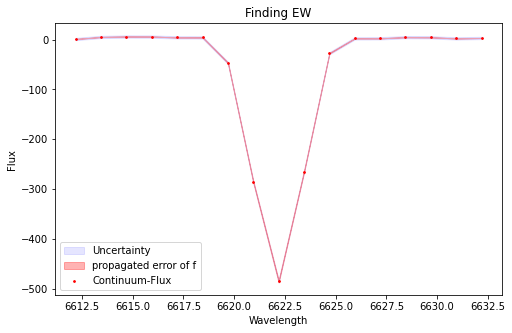

EW= -9.744562921940075  at (i,j)= 3 , 11
sigma f is  [3.36055016e-08 2.88597011e-06 1.33780482e-04 3.34845987e-03
 4.52664638e-02 3.30601525e-01 1.30476251e+00 2.78314523e+00
 3.20900513e+00 2.00012381e+00 6.73883755e-01 1.22719358e-01
 1.20773303e-02 6.42191227e-04 1.84450901e-05 2.86085195e-07
 2.39539497e-09]
 


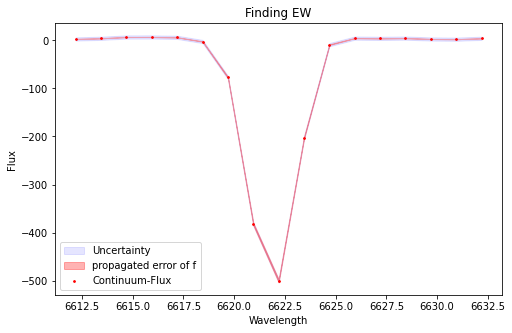

EW= -9.721891306597126  at (i,j)= 3 , 12
sigma f is  [1.22331297e-08 1.46069445e-06 8.85808830e-05 2.72908452e-03
 4.27289806e-02 3.40076953e-01 1.37620555e+00 2.83216582e+00
 2.96436416e+00 1.57810987e+00 4.27284369e-01 5.88327908e-02
 4.11873648e-03 1.46570383e-04 2.65059922e-06 2.43514322e-08
 1.13618698e-10]
 


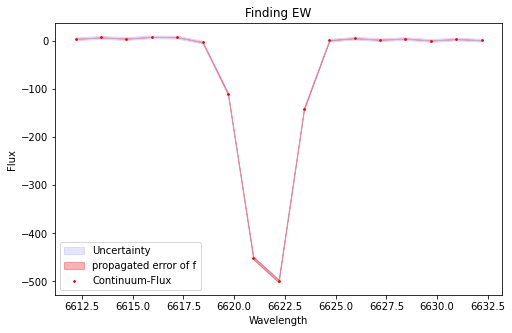

EW= -10.73005930667896  at (i,j)= 3 , 13
sigma f is  [5.45132292e-10 7.88182128e-08 6.04613468e-06 2.46175199e-04
 5.32255033e-03 6.11356281e-02 3.73202064e-01 1.21120865e+00
 2.09041478e+00 1.91889722e+00 9.36897161e-01 2.43284828e-01
 3.35917794e-02 2.46555878e-03 9.61610829e-05 1.99205591e-06
 2.19093254e-08]
 


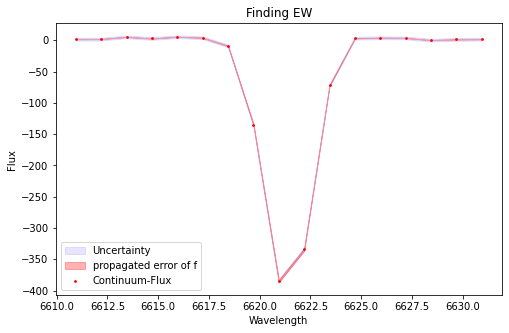

EW= -9.919474108692741  at (i,j)= 3 , 14
sigma f is  [4.14184952e-10 6.27624772e-08 4.94136025e-06 2.02857877e-04
 4.35221126e-03 4.88685870e-02 2.87447377e-01 8.86231551e-01
 1.43261133e+00 1.21431612e+00 5.39621020e-01 1.25667822e-01
 1.53260777e-02 9.77747006e-04 3.25736553e-05 5.65181858e-07
 5.08501473e-09]
 


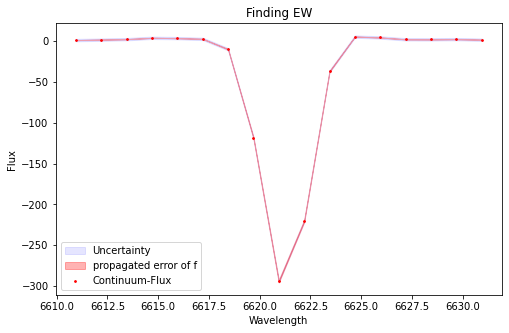

EW= -8.329604237043462  at (i,j)= 3 , 15
sigma f is  [8.20513544e-09 7.00977769e-07 3.28357383e-05 8.44358388e-04
 1.19289115e-02 9.26436666e-02 3.95673967e-01 9.29539658e-01
 1.20130863e+00 8.54072925e-01 3.33992083e-01 7.18241246e-02
 8.49032222e-03 5.51367300e-04 1.96539960e-05 3.84078786e-07
 4.10738655e-09]
 


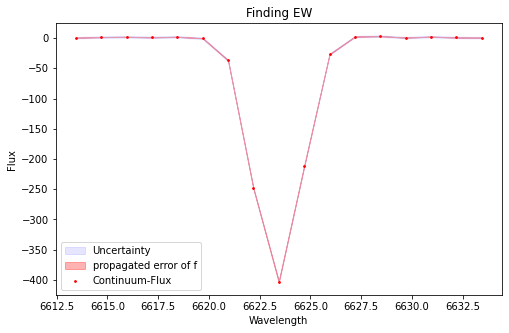

EW= -24.51129571522634  at (i,j)= 4 , 0
sigma f is  [1.74789598e-08 1.40750388e-06 6.23557482e-05 1.52151040e-03
 2.04743159e-02 1.52161971e-01 6.25468164e-01 1.42393366e+00
 1.79722504e+00 1.25826044e+00 4.88611141e-01 1.05171558e-01
 1.25340852e-02 8.25929089e-04 3.00473536e-05 6.02653691e-07
 6.65551409e-09]
 


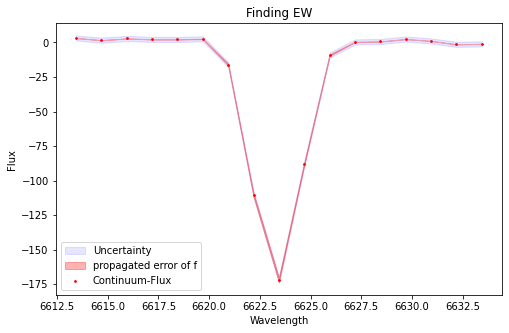

EW= -10.130681570140295  at (i,j)= 4 , 1
sigma f is  [1.33732573e-09 2.15888495e-07 1.51994586e-05 5.25431371e-04
 9.21146093e-03 8.29892866e-02 3.86703841e-01 9.34938040e-01
 1.17434855e+00 7.66222622e-01 2.59263138e-01 4.53245262e-02
 4.06345390e-03 1.83893986e-04 4.03279936e-06 3.58608829e-08
            nan]
 


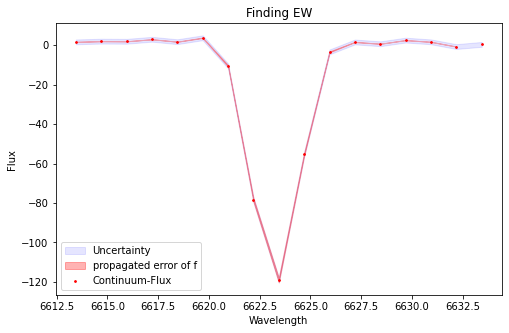

EW= -6.962378869106975  at (i,j)= 4 , 2
sigma f is  [2.14756515e-09 2.96816873e-07 2.00586933e-05 6.83022836e-04
 1.18687343e-02 1.05921387e-01 4.87162861e-01 1.15683556e+00
 1.41940007e+00 8.99750452e-01 2.94359541e-01 4.95922547e-02
 4.28501929e-03 1.88439642e-04 4.15161936e-06 4.40159223e-08
 1.89029576e-10]
 


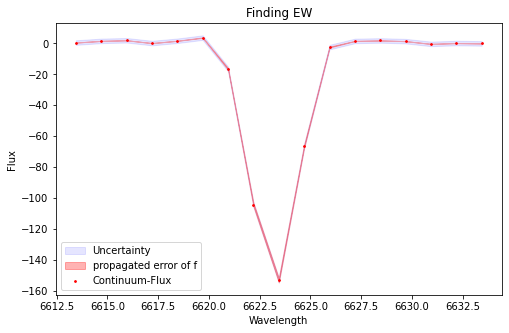

EW= -8.914327325227005  at (i,j)= 4 , 3
sigma f is  [3.37583281e-09 4.16516851e-07 2.57273994e-05 8.12636220e-04
 1.32547366e-02 1.12214968e-01 4.94510294e-01 1.13608521e+00
 1.36154214e+00 8.51104754e-01 2.77252188e-01 4.69763107e-02
 4.12563893e-03 1.86629728e-04 4.29511116e-06 4.88567124e-08
 2.49065078e-10]
 


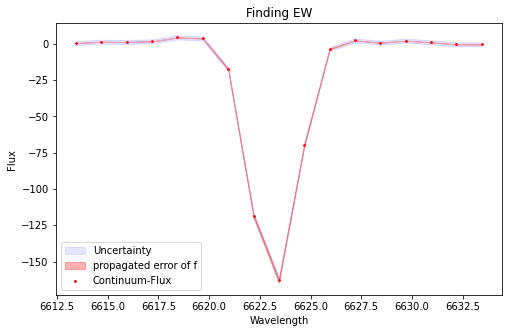

EW= -8.845610891576163  at (i,j)= 4 , 4
sigma f is  [6.11443538e-09 6.82246317e-07 3.92405477e-05 1.17337736e-03
 1.83264304e-02 1.49915076e-01 6.43351598e-01 1.44971764e+00
 1.71599269e+00 1.06686346e+00 3.48193771e-01 5.95875987e-02
 5.33651714e-03 2.49282458e-04 6.03899140e-06 7.50507223e-08
 4.67066495e-10]
 


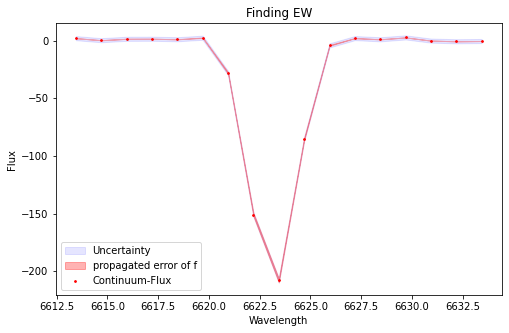

EW= -10.132198078179364  at (i,j)= 4 , 5
sigma f is  [1.68967095e-08 1.49948750e-06 7.12497600e-05 1.81397734e-03
 2.47636056e-02 1.81407075e-01 7.13596022e-01 1.50818738e+00
 1.71328946e+00 1.04628012e+00 3.43454360e-01 6.05833774e-02
 5.73951512e-03 2.91841669e-04 7.95883876e-06 1.16320111e-07
 9.10432652e-10]
 


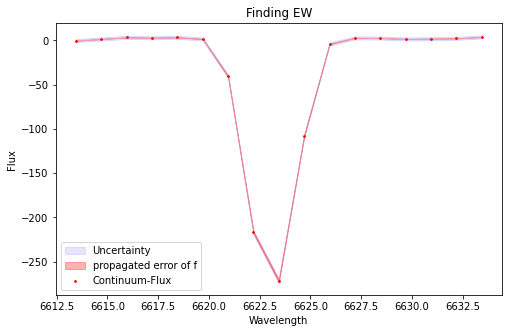

EW= -12.018075910533705  at (i,j)= 4 , 6
sigma f is  [7.36935796e-09 8.91490657e-07 5.47846608e-05 1.71872463e-03
 2.76081155e-02 2.27478339e-01 9.62502136e-01 2.09265113e+00
 2.33849632e+00 1.34303145e+00 3.96240102e-01 6.00045934e-02
 4.65744093e-03 1.84863983e-04 3.73823830e-06 3.82606886e-08
 1.95717220e-10]
 


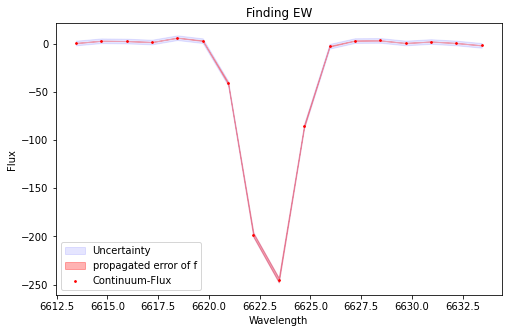

EW= -9.596916015592578  at (i,j)= 4 , 7
sigma f is  [1.30986597e-11 3.68222743e-09 4.96707516e-07 3.26867164e-05
 1.05785578e-03 1.69121208e-02 1.33911421e-01 5.25957916e-01
 1.02554946e+00 9.93021855e-01 4.77387935e-01 1.13862745e-01
 1.34551013e-02 7.85880896e-04 2.25964663e-05 3.17548267e-07
 2.14996728e-09]
 


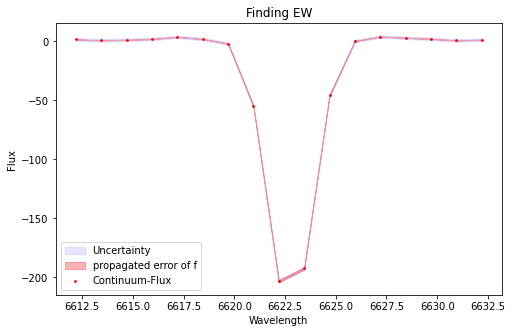

EW= -7.6587932543903126  at (i,j)= 4 , 8
sigma f is  [2.23934363e-10 3.34585699e-08 2.60778040e-06 1.06559916e-04
 2.28971740e-03 2.59211471e-02 1.54785827e-01 4.87901063e-01
 8.12128953e-01 7.13928600e-01 3.31395048e-01 8.11884025e-02
 1.04889944e-02 7.13640770e-04 2.55158079e-05 4.77792743e-07
 4.65851005e-09]
 


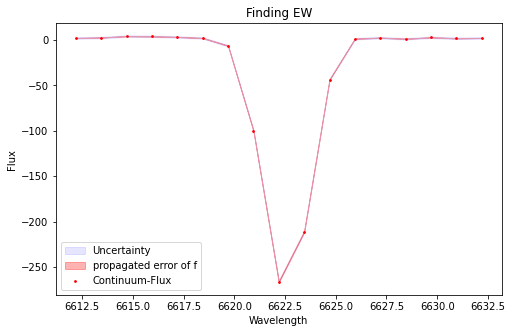

EW= -8.513756767851536  at (i,j)= 4 , 9
sigma f is  [1.82932001e-09 1.94288990e-07 1.12119616e-05 3.51765437e-04
 6.00403190e-03 5.57871954e-02 2.82355627e-01 7.78863595e-01
 1.17139811e+00 9.60782910e-01 4.29770372e-01 1.04824509e-01
 1.39363612e-02 1.00943395e-03 3.98095995e-05 8.54275340e-07
 9.96839908e-09]
 


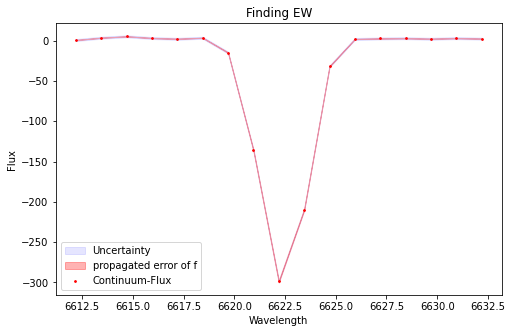

EW= -8.722683660492983  at (i,j)= 4 , 10
sigma f is  [5.95761776e-09 5.52616853e-07 2.79433579e-05 7.70673353e-04
 1.15995874e-02 9.53311892e-02 4.28024848e-01 1.05034087e+00
 1.40913649e+00 1.03372998e+00 4.14658594e-01 9.09349140e-02
 1.08990856e-02 7.13642937e-04 2.55141365e-05 4.97793774e-07
 5.29716791e-09]
 


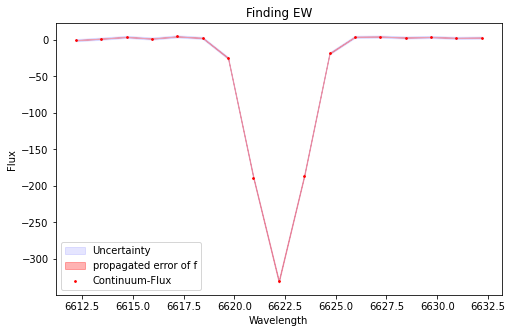

EW= -8.846588537304754  at (i,j)= 4 , 11
sigma f is  [1.38627173e-08 1.29995504e-06 6.52214575e-05 1.75162149e-03
 2.51932961e-02 1.94143692e-01 8.01922709e-01 1.77605262e+00
 2.10955313e+00 1.34393779e+00 4.59204603e-01 8.41393197e-02
 8.26483861e-03 4.35060208e-04 1.22674308e-05 1.85200599e-07
 1.49626384e-09]
 


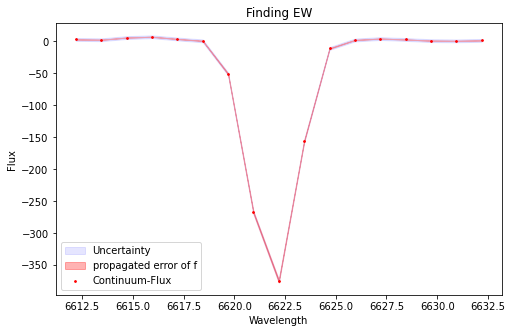

EW= -9.641454530049023  at (i,j)= 4 , 12
sigma f is  [5.89776459e-09 7.40094511e-07 4.70823132e-05 1.52073140e-03
 2.49639838e-02 2.08421120e-01 8.85385375e-01 1.91426216e+00
 2.10666890e+00 1.18005108e+00 3.36382749e-01 4.87798182e-02
 3.59645488e-03 1.34700908e-04 2.55969730e-06 2.46334723e-08
 1.19714034e-10]
 


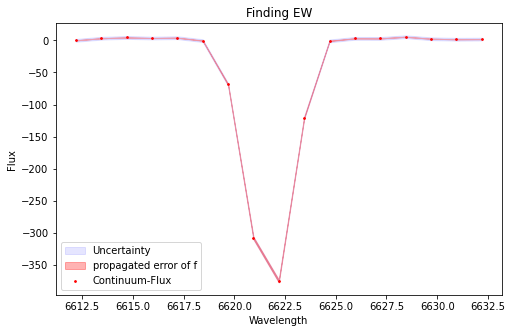

EW= -10.118328712443688  at (i,j)= 4 , 13
sigma f is  [2.97409108e-11 7.27363203e-09 8.81938308e-07 5.34125726e-05
 1.62253514e-03 2.47854345e-02 1.90695753e-01 7.39693072e-01
 1.44731534e+00 1.42876236e+00 7.11521632e-01 1.78668209e-01
 2.26026438e-02 1.43846964e-03 4.59487429e-05 7.33915254e-07
 5.82351628e-09]
 


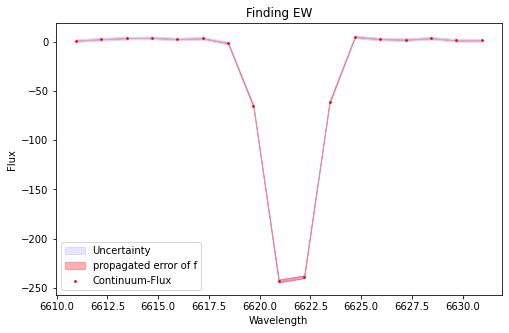

EW= -7.830393919844831  at (i,j)= 4 , 14
sigma f is  [7.89613694e-10 1.15072754e-07 8.67109776e-06 3.41555001e-04
 7.07354987e-03 7.72769930e-02 4.46237183e-01 1.36362066e+00
 2.20644978e+00 1.89072043e+00 8.57756434e-01 2.05855182e-01
 2.60975089e-02 1.74355046e-03 6.11388401e-05 1.11720901e-06
 1.04884266e-08]
 


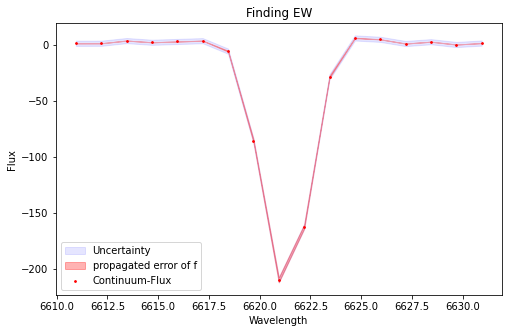

EW= -6.864317688812068  at (i,j)= 4 , 15
sigma f is  [1.12235352e-08 9.13613061e-07 4.12037754e-05 1.02996052e-03
 1.42751147e-02 1.09741971e-01 4.68103509e-01 1.10816149e+00
 1.45625743e+00 1.06240181e+00 4.30281765e-01 9.67353133e-02
 1.20697897e-02 8.35560961e-04 3.20831153e-05 6.83022673e-07
 8.05910806e-09]
 


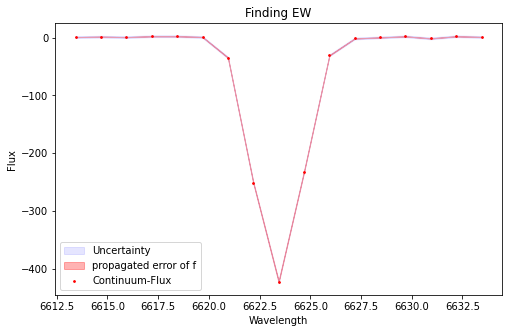

EW= -29.452340605625974  at (i,j)= 5 , 0
sigma f is  [2.96839807e-08 2.14505325e-06 8.65658022e-05 1.95264934e-03
 2.46428732e-02 1.74175845e-01 6.90147582e-01 1.53435839e+00
 1.91520966e+00 1.34260225e+00 5.28566467e-01 1.16814979e-01
 1.44824129e-02 1.00631797e-03 3.91513387e-05 8.51995606e-07
 1.03608901e-08]
 


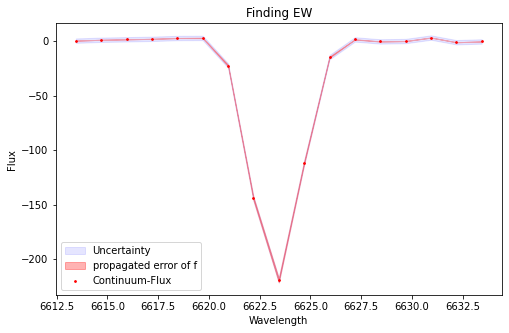

EW= -14.01772125694841  at (i,j)= 5 , 1
sigma f is  [1.36498847e-09 2.26468009e-07 1.78344406e-05 6.88368902e-04
 1.31973457e-02 1.26514629e-01 6.08605557e-01 1.47194227e+00
 1.79118633e+00 1.09654843e+00 3.37353613e-01 5.20366948e-02
 4.00713744e-03 1.52805576e-04 2.83698626e-06 2.45278609e-08
 8.01917537e-11]
 


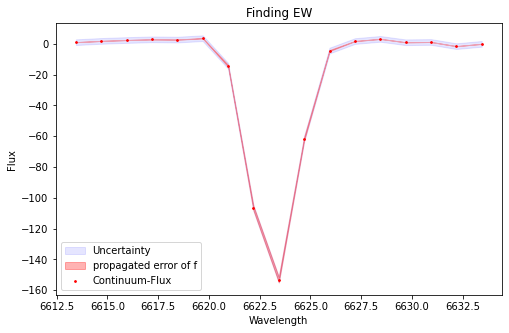

EW= -8.681268969662138  at (i,j)= 5 , 2
sigma f is  [9.94945178e-10 1.83745342e-07 1.42796526e-05 5.28932201e-04
 9.65414617e-03 8.80102443e-02 4.03343805e-01 9.32233665e-01
 1.08796987e+00 6.40956039e-01 1.90254338e-01 2.83336643e-02
 2.09910507e-03 7.59373180e-05 1.27435200e-06 7.50094015e-09
            nan]
 


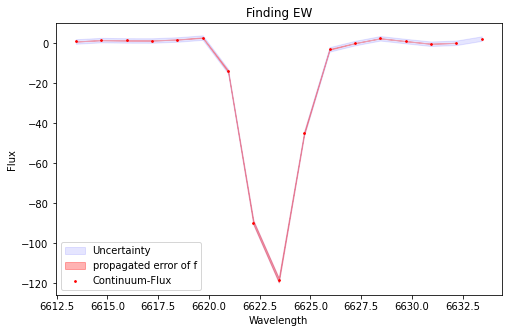

EW= -7.142647353514101  at (i,j)= 5 , 3
sigma f is  [2.29497153e-09 3.34785503e-07 2.17283703e-05 6.93604337e-04
 1.12119457e-02 9.29079399e-02 3.97027097e-01 8.77536548e-01
 1.00433565e+00 5.95016809e-01 1.82145258e-01 2.86939262e-02
 2.30748944e-03 9.30949778e-05 1.79860958e-06 1.32405554e-08
            nan]
 


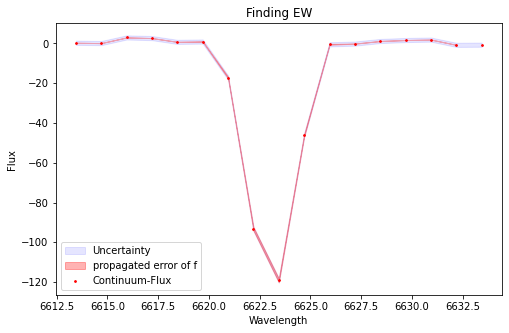

EW= -7.338957984382979  at (i,j)= 5 , 4
sigma f is  [3.67038923e-09 5.01397288e-07 3.23045198e-05 1.03309505e-03
 1.67073717e-02 1.37825679e-01 5.82564975e-01 1.26455148e+00
 1.41085742e+00 8.08845295e-01 2.37922013e-01 3.57935086e-02
 2.73723105e-03 1.05097467e-04 1.96773554e-06 1.62537729e-08
            nan]
 


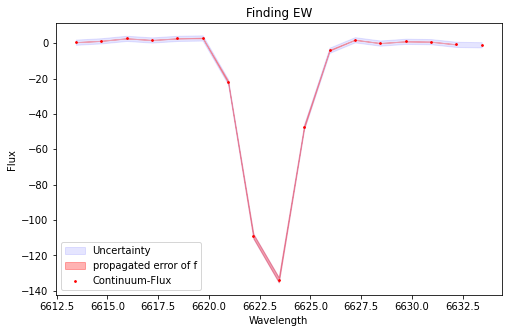

EW= -7.637597988663737  at (i,j)= 5 , 5
sigma f is  [6.24558528e-09 7.84979600e-07 4.78009777e-05 1.45717685e-03
 2.25400134e-02 1.78101713e-01 7.21444260e-01 1.50091743e+00
 1.60482439e+00 8.81643446e-01 2.48530151e-01 3.58501934e-02
 2.63266336e-03 9.74449062e-05 1.77832390e-06 1.49960875e-08
 3.56450122e-11]
 


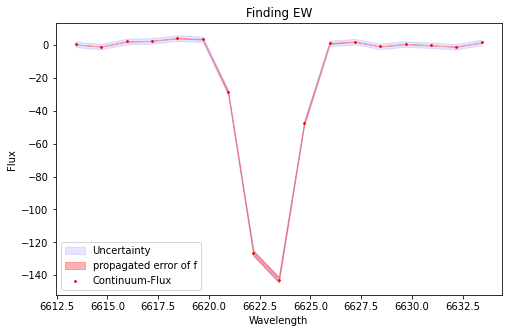

EW= -7.123417175882184  at (i,j)= 5 , 6
sigma f is  [2.94970192e-09 4.17372598e-07 2.75104772e-05 8.89484622e-04
 1.43747770e-02 1.17129831e-01 4.83368056e-01 1.01253702e+00
 1.07752320e+00 5.82340816e-01 1.59574152e-01 2.20953569e-02
 1.53579745e-03 5.28718051e-05 8.72538492e-07 6.12038367e-09
            nan]
 


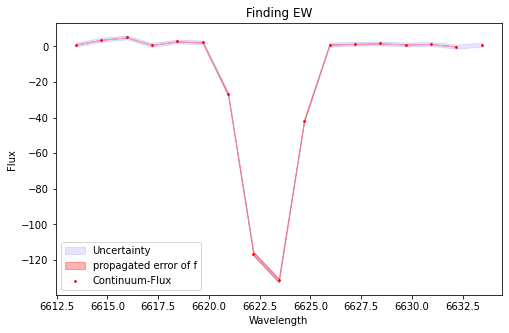

EW= -5.906197767013373  at (i,j)= 5 , 7
sigma f is  [1.85449779e-11 5.29773035e-09 7.38692723e-07 5.03382541e-05
 1.67939223e-03 2.74923758e-02 2.21443062e-01 8.80182447e-01
 1.73101827e+00 1.68747710e+00 8.15812836e-01 1.95401491e-01
 2.31366772e-02 1.35046712e-03 3.87452500e-05 5.44983056e-07
 3.75034813e-09]
 


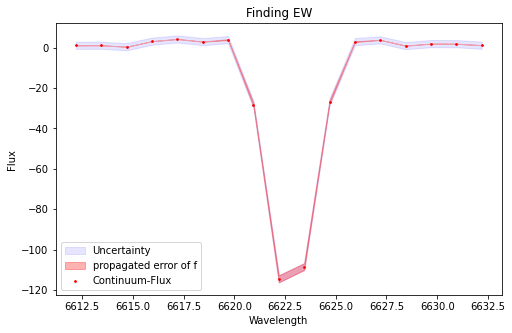

EW= -4.830829198101443  at (i,j)= 5 , 8
sigma f is  [5.42205782e-11 1.67905705e-08 2.12295396e-06 1.25356587e-04
 3.57961271e-03 5.01347565e-02 3.46765876e-01 1.18869790e+00
 2.02293361e+00 1.70978736e+00 7.17164804e-01 1.48959072e-01
 1.52545698e-02 7.63742626e-04 1.83586175e-05 2.01720354e-07
 7.85691864e-10]
 


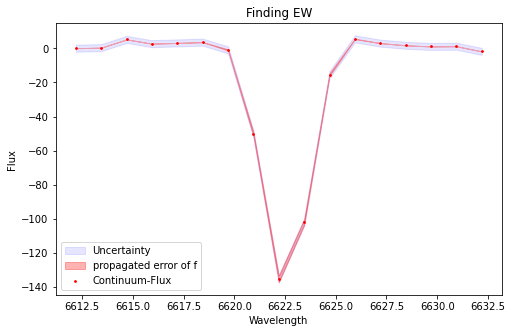

EW= -4.955591237132274  at (i,j)= 5 , 9
sigma f is  [8.23106541e-10 1.33980344e-07 1.05443704e-05 4.18449897e-04
 8.51097813e-03 8.94197851e-02 4.87325289e-01 1.38073721e+00
 2.03591901e+00 1.56248594e+00 6.23644813e-01 1.29212181e-01
 1.38472628e-02 7.62502166e-04 2.12893620e-05 2.91924205e-07
 1.75188217e-09]
 


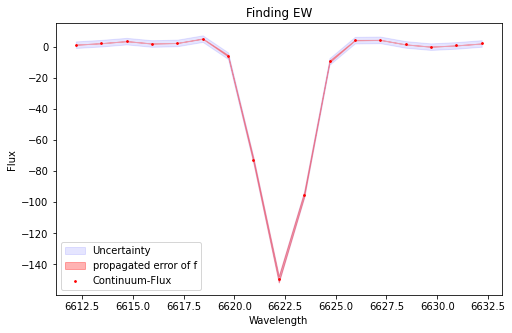

EW= -5.166746311275421  at (i,j)= 5 , 10
sigma f is  [3.93578624e-09 4.49132692e-07 2.70321783e-05 8.58945681e-04
 1.44245511e-02 1.28174222e-01 6.03349136e-01 1.50612187e+00
 1.99533853e+00 1.40351407e+00 5.24140063e-01 1.03873629e-01
 1.09151695e-02 6.07516943e-04 1.78886734e-05 2.78344656e-07
 2.28615646e-09]
 


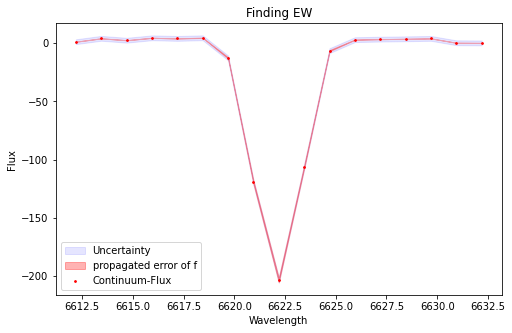

EW= -6.674189234814971  at (i,j)= 5 , 11
sigma f is  [2.56419948e-09 3.18071433e-07 2.03380519e-05 6.70900663e-04
 1.14275959e-02 1.00598884e-01 4.58086153e-01 1.07977904e+00
 1.31820082e+00 8.33662844e-01 2.73104243e-01 4.63266484e-02
 4.06652672e-03 1.84568257e-04 4.32756101e-06 5.23709019e-08
 3.26833789e-10]
 


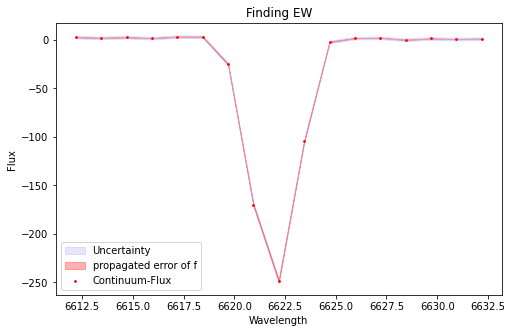

EW= -7.827384247730098  at (i,j)= 5 , 12
sigma f is  [3.16627011e-09 3.95870903e-07 2.51060455e-05 8.11468093e-04
 1.34047731e-02 1.13371561e-01 4.91446140e-01 1.09255423e+00
 1.24599306e+00 7.28892079e-01 2.18630010e-01 3.35974156e-02
 2.64160475e-03 1.06037351e-04 2.16547431e-06 2.23628616e-08
 1.15454220e-10]
 


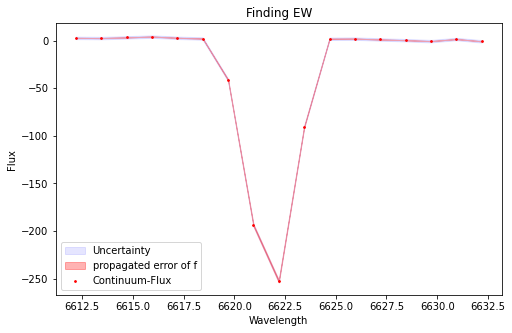

EW= -8.399410884256428  at (i,j)= 5 , 13
sigma f is  [3.71597222e-09 5.42958655e-07 3.83320631e-05 1.32128602e-03
 2.23597920e-02 1.86355714e-01 7.66329218e-01 1.55637007e+00
 1.56167474e+00 7.74040923e-01 1.89361290e-01 2.28297010e-02
 1.35276375e-03 3.92130778e-05 5.51316782e-07 3.69283007e-09
 1.12363695e-11]
 


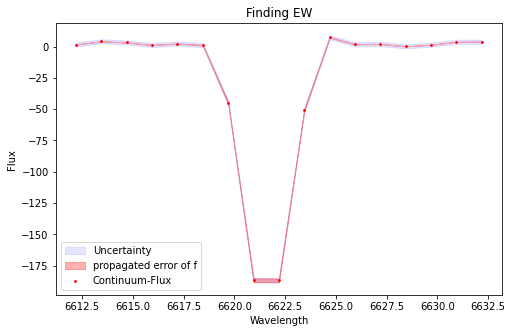

EW= -7.231568278556426  at (i,j)= 5 , 14
sigma f is  [2.37011038e-11 8.15335763e-09 1.20265093e-06 8.21454930e-05
 2.66312682e-03 4.14282487e-02 3.10964712e-01 1.12959628e+00
 1.98867485e+00 1.69744220e+00 7.02028941e-01 1.40438277e-01
 1.35424305e-02 6.25448590e-04 1.36569622e-05 1.36704016e-07
 5.62374696e-10]
 


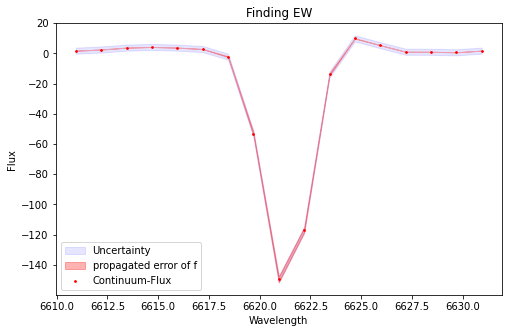

EW= -5.485839527452251  at (i,j)= 5 , 15
sigma f is  [7.45789948e-09 6.04124761e-07 2.71235058e-05 6.75164454e-04
 9.32074777e-03 7.13828408e-02 3.03353111e-01 7.15489438e-01
 9.36742235e-01 6.80816775e-01 2.74683066e-01 6.15163297e-02
 7.64611466e-03 5.27341473e-04 2.01758679e-05 4.28090956e-07
 5.03581757e-09]
 


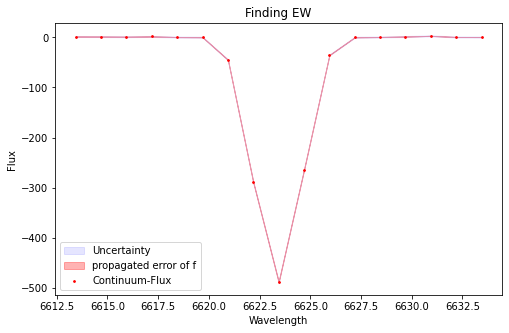

EW= -34.71603942918135  at (i,j)= 6 , 0
sigma f is  [2.19873111e-08 1.89418282e-06 8.85436601e-05 2.24729309e-03
 3.09901750e-02 2.32350885e-01 9.47746895e-01 2.10423573e+00
 2.54395076e+00 1.67497510e+00 6.00582569e-01 1.17243801e-01
 1.24557347e-02 7.19717547e-04 2.26039272e-05 3.85600782e-07
 3.57053592e-09]
 


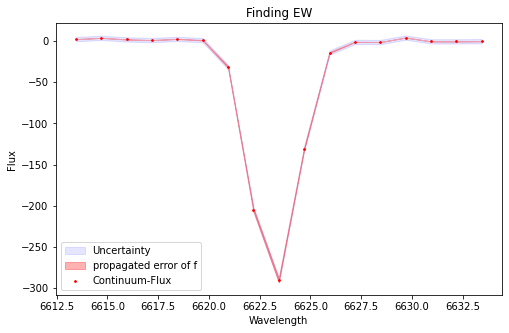

EW= -19.657440298892883  at (i,j)= 6 , 1
sigma f is  [1.64917628e-09 2.04431656e-07 1.28925895e-05 4.15643626e-04
 6.86961959e-03 5.83103103e-02 2.54469092e-01 5.71312108e-01
 6.60044514e-01 3.92378867e-01 1.19976404e-01 1.88536562e-02
 1.52062476e-03 6.28115299e-05 1.32410580e-06 1.41595919e-08
 7.59372503e-11]
 


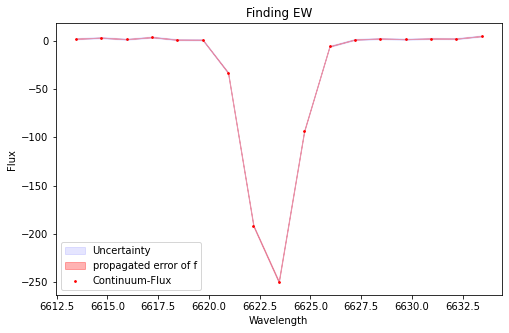

EW= -15.007593360987862  at (i,j)= 6 , 2
sigma f is  [1.91328454e-09 3.08058445e-07 2.34542286e-05 8.71070381e-04
 1.59878047e-02 1.45966857e-01 6.65225692e-01 1.51610235e+00
 1.72920583e+00 9.86825131e-01 2.81453556e-01 4.00206696e-02
 2.82422146e-03 9.80618437e-05 1.64481552e-06 1.26809714e-08
 3.46402362e-11]
 


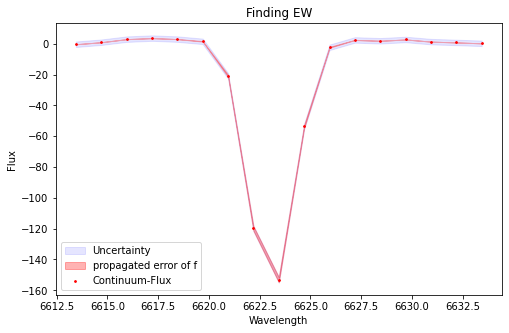

EW= -9.121127164479347  at (i,j)= 6 , 3
sigma f is  [2.20621560e-10 6.20154231e-08 7.22141184e-06 3.76160916e-04
 8.98318661e-03 9.94178818e-02 5.12632147e-01 1.23487539e+00
 1.39113771e+00 7.32712503e-01 1.80134871e-01 2.05967611e-02
 1.08759079e-03 2.61334661e-05 2.75353334e-07 1.09548189e-09
            nan]
 


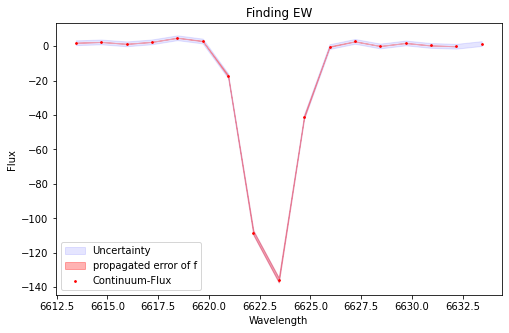

EW= -7.941733697034376  at (i,j)= 6 , 4
sigma f is  [3.53114655e-09 4.96216003e-07 3.41959130e-05 1.15777585e-03
 1.93070203e-02 1.59084592e-01 6.50014925e-01 1.32157499e+00
 1.34030177e+00 6.78553185e-01 1.71283103e-01 2.14978002e-02
 1.33686033e-03 4.10445154e-05 6.20271489e-07 4.60302624e-09
 1.67457747e-11]
 


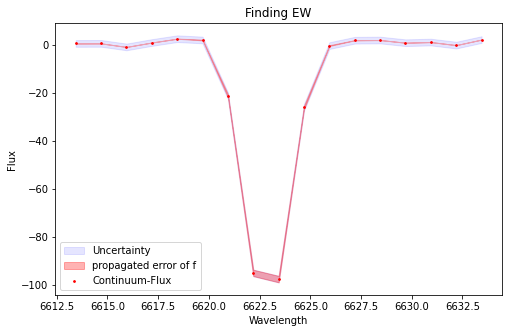

EW= -6.082232614171659  at (i,j)= 6 , 5
sigma f is  [1.36282183e-12 2.34391594e-09 4.57485924e-07 3.80693960e-05
 1.46484103e-03 2.67347613e-02 2.34000306e-01 9.87565271e-01
 2.01499479e+00 1.98946578e+00 9.50013607e-01 2.18945675e-01
 2.42438854e-02 1.27823209e-03 3.14581780e-05 3.41619455e-07
 1.16092975e-09]
 


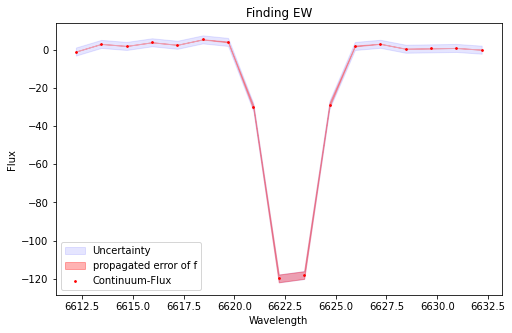

EW= -6.537063840961769  at (i,j)= 6 , 6
sigma f is  [9.02282261e-12 3.08299142e-09 5.03193796e-07 3.92807331e-05
 1.46911616e-03 2.63835277e-02 2.28119407e-01 9.52298329e-01
 1.92431657e+00 1.88549310e+00 8.96217841e-01 2.06454784e-01
 2.30009568e-02 1.23593165e-03 3.19412461e-05 3.96028100e-07
 2.35087095e-09]
 


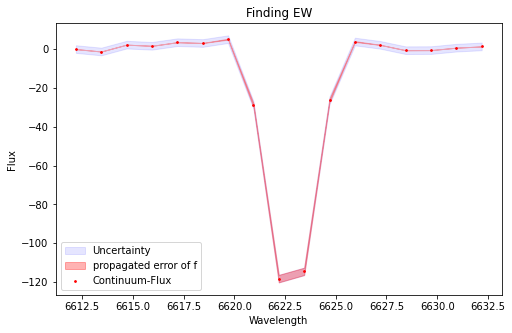

EW= -5.81589403032873  at (i,j)= 6 , 7
sigma f is  [           nan            nan 9.74236658e-08 1.46581912e-05
 7.57016420e-04 1.67179140e-02 1.65161617e-01 7.41967909e-01
 1.52603152e+00 1.44001262e+00 6.22590552e-01 1.22643172e-01
 1.08592788e-02 4.17110977e-04 6.02705283e-06            nan
            nan]
 


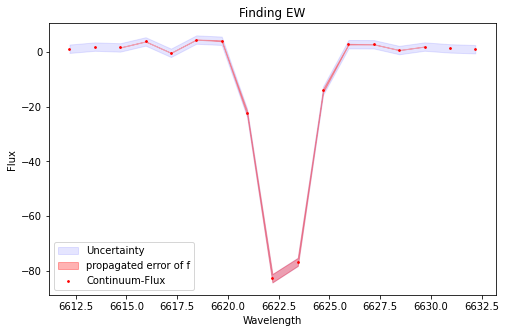

EW= -3.797085607749582  at (i,j)= 6 , 8
sigma f is  [           nan            nan 1.27816795e-07 2.09985900e-05
 1.12118114e-03 2.46095486e-02 2.32637547e-01 9.62873446e-01
 1.75632919e+00 1.41388931e+00 5.00951236e-01 7.74384656e-02
 5.10909055e-03 1.34308590e-04 7.63193855e-07            nan
            nan]
 


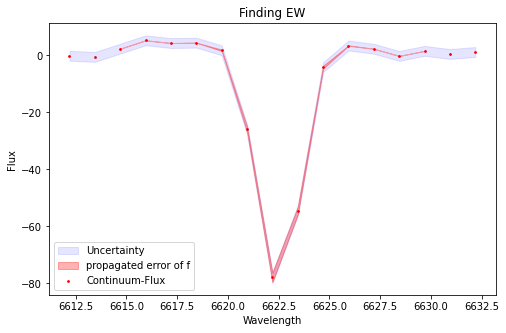

EW= -3.0267289402289803  at (i,j)= 6 , 9
sigma f is  [1.21089439e-10 2.61506102e-08 2.74787813e-06 1.40695289e-04
 3.51741526e-03 4.30552247e-02 2.58908759e-01 7.67638104e-01
 1.12575204e+00 8.18181220e-01 2.94722423e-01 5.25230869e-02
 4.61641766e-03 1.99392987e-04 4.21780880e-06 4.35727519e-08
 2.19368322e-10]
 


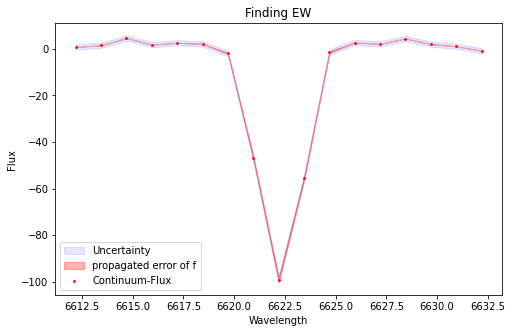

EW= -3.6488020605976415  at (i,j)= 6 , 10
sigma f is  [2.07760129e-10 4.44097193e-08 4.36045938e-06 2.04484583e-04
 4.65106480e-03 5.16954985e-02 2.81893742e-01 7.55718647e-01
 9.96926472e-01 6.47089382e-01 2.06447220e-01 3.22991244e-02
 2.46728168e-03 9.12653208e-05 1.60654655e-06 1.28507076e-08
 3.73403006e-11]
 


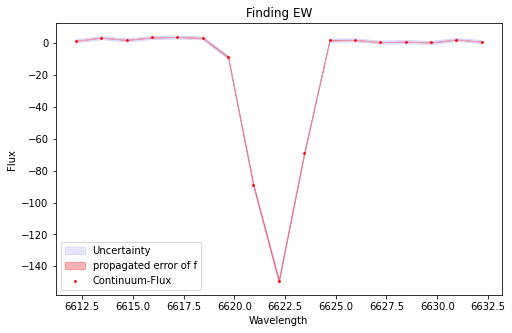

EW= -5.450391442197836  at (i,j)= 6 , 11
sigma f is  [5.17223068e-10 8.92727412e-08 7.46359832e-06 3.06306553e-04
 6.21262881e-03 6.25089686e-02 3.12681820e-01 7.78534930e-01
 9.65360504e-01 5.96078378e-01 1.83157575e-01 2.79662636e-02
 2.11658427e-03 7.90541214e-05 1.44551522e-06 1.27287842e-08
 5.17420438e-11]
 


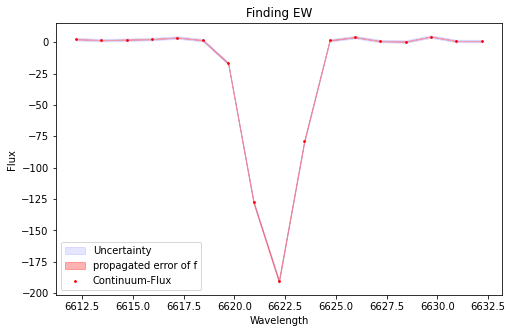

EW= -6.833589087406836  at (i,j)= 6 , 12
sigma f is  [1.56430142e-09 2.53525647e-07 1.96357662e-05 7.40791763e-04
 1.37361810e-02 1.25786585e-01 5.70376238e-01 1.28252965e+00
 1.43085920e+00 7.91912240e-01 2.17220468e-01 2.94730957e-02
 1.97120611e-03 6.45747762e-05 1.02327274e-06 7.61747407e-09
 2.41074119e-11]
 


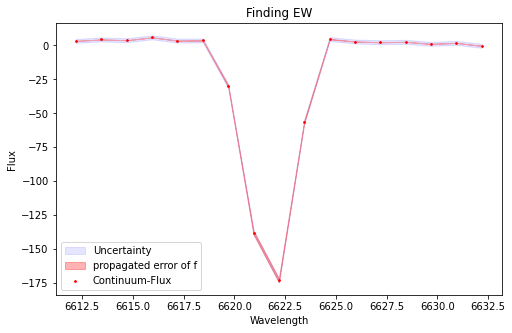

EW= -6.498370962492623  at (i,j)= 6 , 13
sigma f is  [6.78868726e-09 9.55737077e-07 6.62062251e-05 2.25946075e-03
 3.80431607e-02 3.16504882e-01 1.30306364e+00 2.65815693e+00
 2.68896194e+00 1.34921706e+00 3.35660833e-01 4.13644668e-02
 2.52162302e-03 7.59273224e-05 1.12751303e-06 8.24609720e-09
 2.96663576e-11]
 


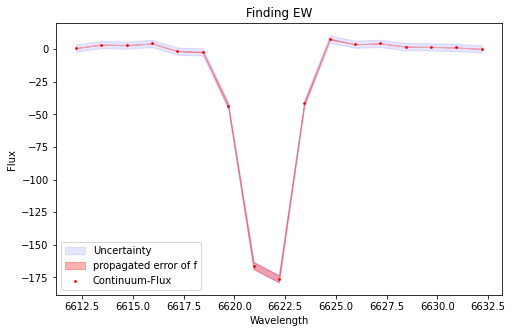

EW= -7.600954084001814  at (i,j)= 6 , 14
sigma f is  [2.52976841e-12 1.75847838e-09 3.79161998e-07 3.48004741e-05
 1.43549688e-03 2.71332906e-02 2.37106658e-01 9.62211399e-01
 1.81727369e+00 1.59832887e+00 6.54190602e-01 1.24324346e-01
 1.09196251e-02 4.39192194e-04 7.92641536e-06 6.05752540e-08
 1.35542411e-10]
 


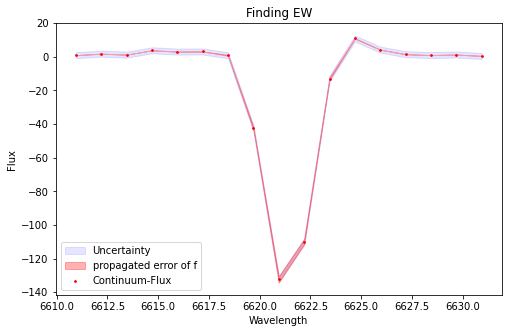

EW= -5.766761754773322  at (i,j)= 6 , 15
sigma f is  [1.25975509e-08 9.78922100e-07 4.23073123e-05 1.01884551e-03
 1.36890640e-02 1.02702193e-01 4.30495504e-01 1.00852771e+00
 1.32070738e+00 9.66770762e-01 3.95518057e-01 9.04032780e-02
 1.15379933e-02 8.21543466e-04 3.25933577e-05 7.19103682e-07
 8.79677075e-09]
 


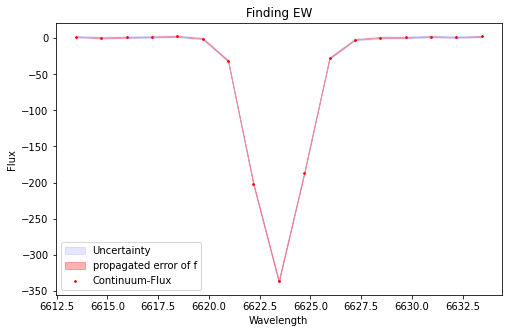

EW= -24.715108805554905  at (i,j)= 7 , 0
sigma f is  [6.00618444e-09 5.40415320e-07 2.63183464e-05 6.94358327e-04
 9.93439651e-03 7.71604674e-02 3.25683047e-01 7.47716309e-01
 9.34348007e-01 6.35700714e-01 2.35473905e-01 4.74666447e-02
 5.20312077e-03 3.09850195e-04 1.00136585e-05 1.75439905e-07
 1.66468611e-09]
 


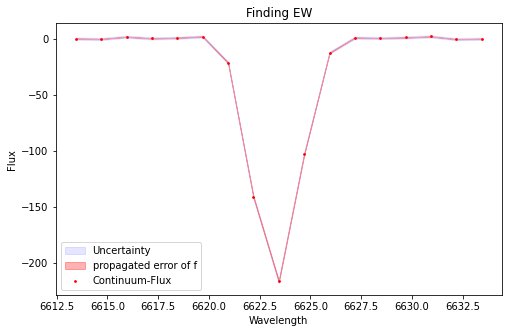

EW= -14.84846779930031  at (i,j)= 7 , 1
sigma f is  [9.10044479e-09 8.93664360e-07 4.65660110e-05 1.28877219e-03
 1.89662576e-02 1.48594222e-01 6.20500924e-01 1.38242964e+00
 1.64444546e+00 1.04475667e+00 3.54468419e-01 6.41899432e-02
 6.19861737e-03 3.18844593e-04 8.72574057e-06 1.26899585e-07
 9.79703168e-10]
 


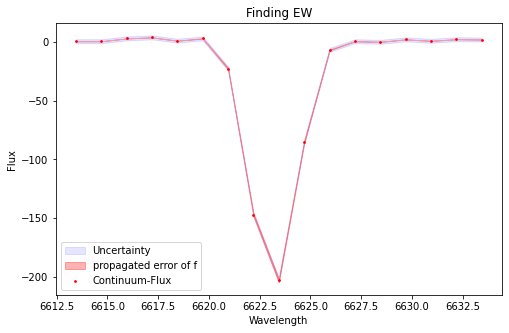

EW= -13.069551783130095  at (i,j)= 7 , 2
sigma f is  [5.35116306e-09 6.55268929e-07 3.98984590e-05 1.23379837e-03
 1.95661205e-02 1.59939960e-01 6.75820166e-01 1.47836587e+00
 1.67520398e+00 9.83135815e-01 2.98533656e-01 4.68081513e-02
 3.77563426e-03 1.55616028e-04 3.23316995e-06 3.27746980e-08
 1.43849173e-10]
 


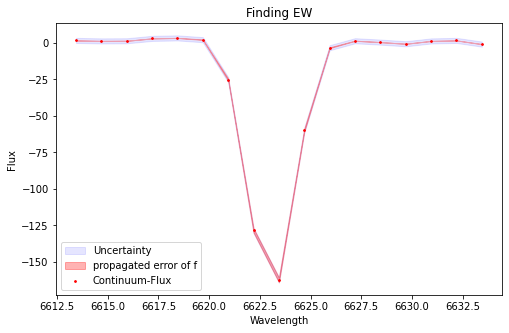

EW= -10.206761161131958  at (i,j)= 7 , 3
sigma f is  [2.58486486e-09 4.44752478e-07 3.18053471e-05 1.08130992e-03
 1.80955753e-02 1.51156149e-01 6.34433647e-01 1.34227907e+00
 1.43317340e+00 7.71889246e-01 2.09237622e-01 2.84068910e-02
 1.91222637e-03 6.23803136e-05 9.20056220e-07 3.32178007e-09
            nan]
 


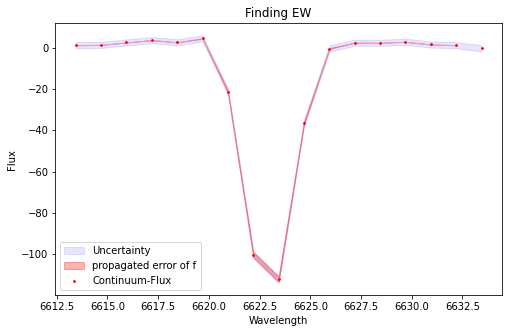

EW= -7.208717716075001  at (i,j)= 7 , 4
sigma f is  [2.11324980e-11 5.20778908e-09 6.39409089e-07 3.91627139e-05
 1.19866606e-03 1.83763212e-02 1.41505481e-01 5.48996674e-01
 1.07615538e+00 1.06793088e+00 5.36811972e-01 1.36546259e-01
 1.75360117e-02 1.13369003e-03 3.67837648e-05 5.97379469e-07
 4.84551838e-09]
 


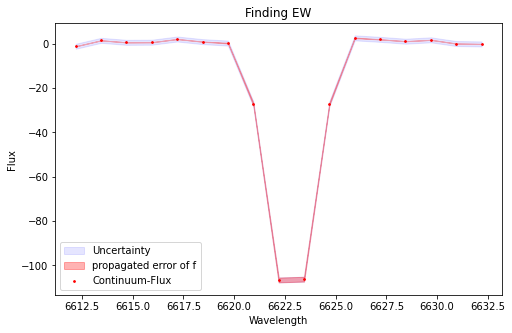

EW= -6.888124253577765  at (i,j)= 7 , 5
sigma f is  [1.09908697e-11 3.43292279e-09 5.15133599e-07 3.71807220e-05
 1.29277684e-03 2.16941989e-02 1.76068750e-01 6.92548687e-01
 1.32260118e+00 1.22777585e+00 5.54152198e-01 1.21520146e-01
 1.29276733e-02 6.65857886e-04 1.65695093e-05 1.98810876e-07
 1.14824061e-09]
 


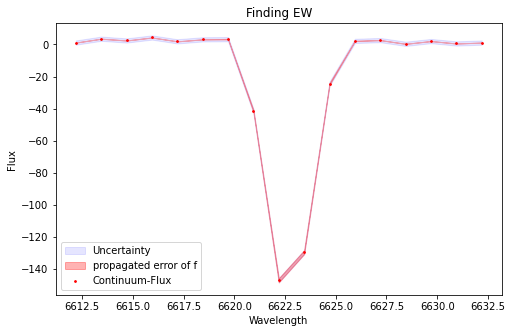

EW= -8.130116487234012  at (i,j)= 7 , 6
sigma f is  [5.54874338e-12 2.20038070e-09 4.05503184e-07 3.47744025e-05
 1.39027539e-03 2.59763957e-02 2.27498419e-01 9.36879331e-01
 1.81947852e+00 1.66953285e+00 7.24092025e-01 1.48250922e-01
 1.42926044e-02 6.46810517e-04 1.36975360e-05 1.35374207e-07
 6.23067776e-10]
 


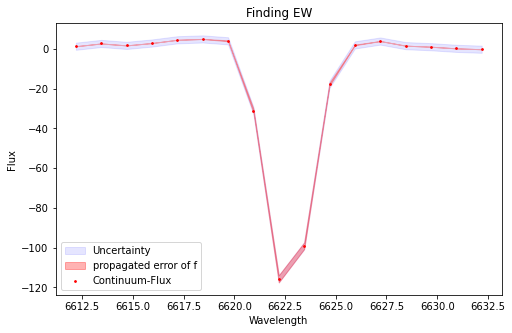

EW= -5.820888420517787  at (i,j)= 7 , 7
sigma f is  [           nan            nan 1.81654660e-08 7.69014738e-06
 5.21320115e-04 1.36378019e-02 1.48438504e-01 6.88025127e-01
 1.37017394e+00 1.17516085e+00 4.32997632e-01 6.79205491e-02
 4.42928457e-03 1.11115900e-04 3.82073860e-07            nan
            nan]
 


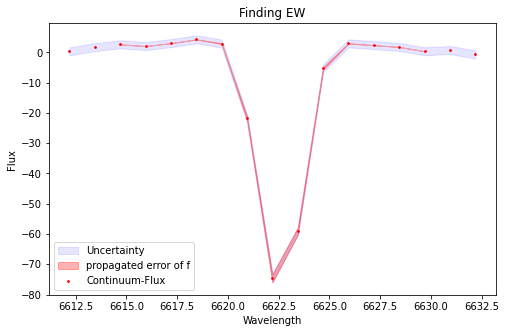

EW= -3.4554455743726593  at (i,j)= 7 , 8
sigma f is  [           nan            nan 4.53067289e-07 5.40769515e-05
 2.21668877e-03 3.89224501e-02 3.06222869e-01 1.09683871e+00
 1.79954894e+00 1.35355172e+00 4.64959091e-01 7.21351678e-02
 4.90888453e-03 1.31883549e-04            nan            nan
            nan]
 


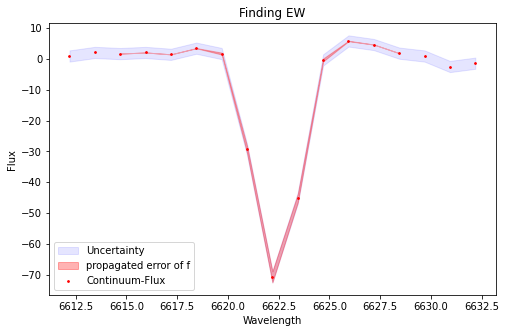

EW= -3.073342020785422  at (i,j)= 7 , 9
sigma f is  [           nan 1.27910249e-08 2.01959334e-06 1.30766929e-04
 3.82603910e-03 5.20401904e-02 3.32945125e-01 1.00743274e+00
 1.44490166e+00 9.82299657e-01 3.15845815e-01 4.77732907e-02
 3.35976806e-03 1.06820002e-04 1.39554663e-06            nan
            nan]
 


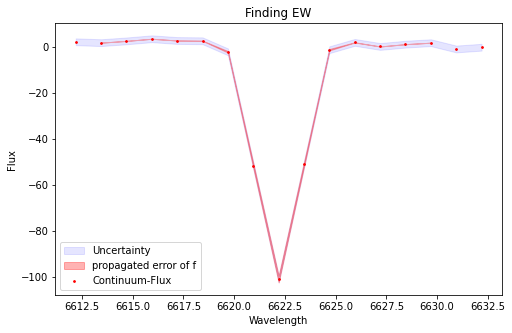

EW= -4.270730045111925  at (i,j)= 7 , 10
sigma f is  [3.64567304e-10 7.99277655e-08 8.13232730e-06 3.94261169e-04
 9.21321194e-03 1.04390290e-01 5.75357396e-01 1.54525307e+00
 2.02380300e+00 1.29245057e+00 4.02112832e-01 6.08306510e-02
 4.45840005e-03 1.57274629e-04 2.63552183e-06 2.03342325e-08
 6.46271239e-11]
 


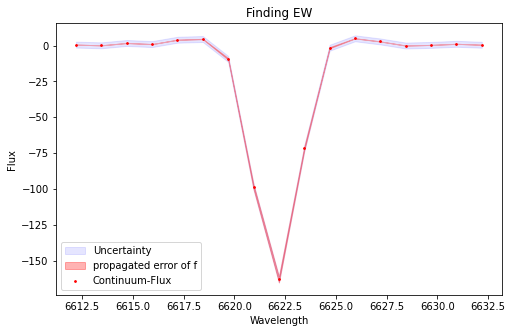

EW= -6.927083252387605  at (i,j)= 7 , 11
sigma f is  [3.28666395e-10 7.14220659e-08 7.02643350e-06 3.24374537e-04
 7.12949413e-03 7.51368054e-02 3.81126656e-01 9.32322016e-01
 1.10074750e+00 6.27137431e-01 1.72219706e-01 2.27383168e-02
 1.43663951e-03 4.30470107e-05 5.99978114e-07 3.68636404e-09
 7.34114333e-12]
 


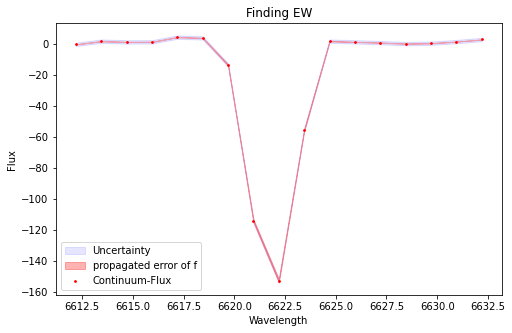

EW= -6.645475157761689  at (i,j)= 7 , 12
sigma f is  [1.76906150e-10 6.71009948e-08 9.27690385e-06 5.44257864e-04
 1.40655078e-02 1.62497568e-01 8.45066359e-01 1.98492997e+00
 2.10841151e+00 1.01240846e+00 2.19285889e-01 2.13228495e-02
 9.21727295e-04 1.73239398e-05 1.32489833e-07 2.42442630e-10
            nan]
 


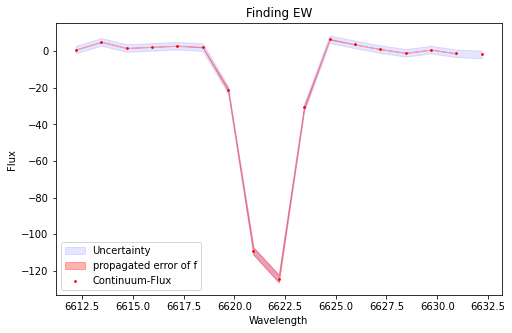

EW= -5.536732850868143  at (i,j)= 7 , 13
sigma f is  [2.81862883e-12 1.51018580e-09 3.21205109e-07 3.02323957e-05
 1.29854169e-03 2.57829473e-02 2.38172160e-01 1.02710505e+00
 2.07136355e+00 1.95465202e+00 8.62741301e-01 1.77844621e-01
 1.70698550e-02 7.58526754e-04 1.54306426e-05 1.40059062e-07
 5.22692725e-10]
 


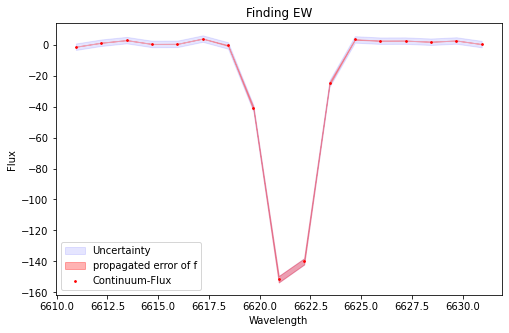

EW= -7.402033702786558  at (i,j)= 7 , 14
sigma f is  [3.76879762e-11 1.04862029e-08 1.37467509e-06 8.68202882e-05
 2.66870438e-03 4.01397620e-02 2.96327692e-01 1.07560405e+00
 1.92134845e+00 1.68944274e+00 7.30999378e-01 1.55485761e-01
 1.62270460e-02 8.28184348e-04 2.05498663e-05 2.45131549e-07
 1.37049746e-09]
 


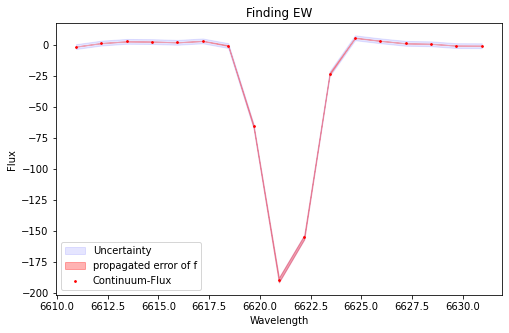

EW= -9.628065405248924  at (i,j)= 7 , 15
sigma f is  [1.30925301e-08 1.12810275e-06 5.29679413e-05 1.35628814e-03
 1.89552340e-02 1.44716503e-01 6.04051811e-01 1.37943741e+00
 1.72433298e+00 1.18015504e+00 4.42218353e-01 9.06924787e-02
 1.01740645e-02 6.23854330e-04 2.08916767e-05 3.81761123e-07
 3.80348265e-09]
 


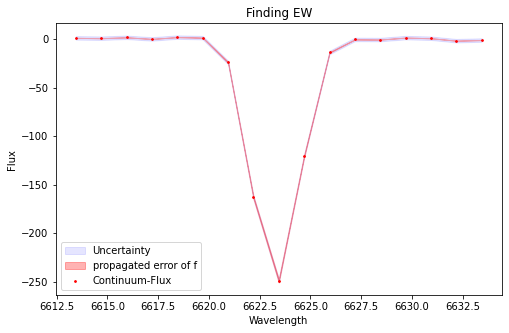

EW= -18.029346774968488  at (i,j)= 8 , 0
sigma f is  [8.33248796e-09 7.91252688e-07 4.02092395e-05 1.09470204e-03
 1.59882570e-02 1.25452041e-01 5.29629738e-01 1.20467061e+00
 1.47774781e+00 9.78091710e-01 3.49264023e-01 6.72384319e-02
 6.97056526e-03 3.88586063e-04 1.16312145e-05 1.86665604e-07
 1.60420944e-09]
 


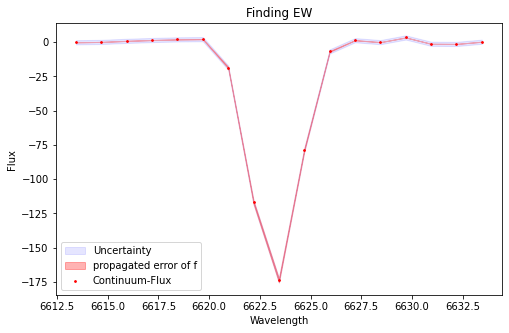

EW= -11.587194484769205  at (i,j)= 8 , 1
sigma f is  [3.50157601e-09 4.52907388e-07 2.90639494e-05 9.43111509e-04
 1.56143029e-02 1.32527711e-01 5.78197152e-01 1.29853456e+00
 1.50206896e+00 8.94791844e-01 2.74257759e-01 4.31703776e-02
 3.47802666e-03 1.42542719e-04 2.93654221e-06 2.95830246e-08
 1.33093139e-10]
 


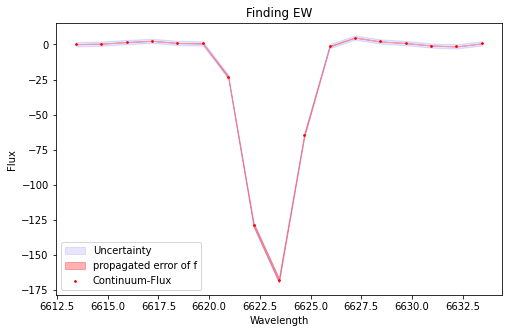

EW= -11.608551654785066  at (i,j)= 8 , 2
sigma f is  [7.80060467e-09 8.90491813e-07 5.18496713e-05 1.54875423e-03
 2.38120479e-02 1.88831976e-01 7.73317598e-01 1.63661281e+00
 1.79043744e+00 1.01240472e+00 2.95745218e-01 4.45892354e-02
 3.46405014e-03 1.38301104e-04 2.82501385e-06 2.92886194e-08
 1.51639980e-10]
 


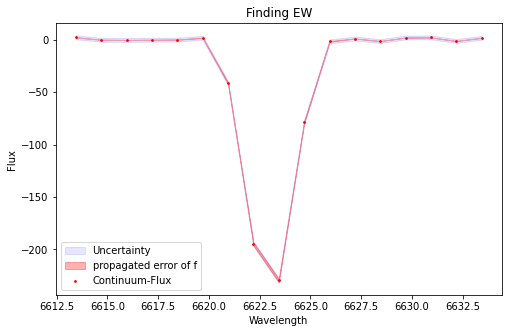

EW= -16.042021000746914  at (i,j)= 8 , 3
sigma f is  [2.88588956e-09 4.10944665e-07 2.80262665e-05 9.36098217e-04
 1.54684745e-02 1.27125394e-01 5.21112182e-01 1.06708474e+00
 1.09212769e+00 5.58516688e-01 1.42554995e-01 1.81169926e-02
 1.14149020e-03 3.53697612e-05 5.29975447e-07 3.67499580e-09
 9.62640801e-12]
 


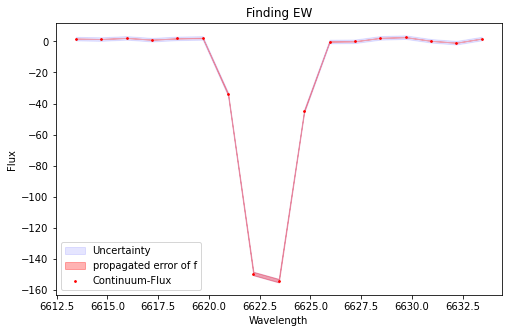

EW= -10.847380413044805  at (i,j)= 8 , 4
sigma f is  [5.61832789e-11 1.14082147e-08 1.18282239e-06 6.26826930e-05
 1.69991209e-03 2.36240781e-02 1.68488297e-01 6.17569004e-01
 1.16470290e+00 1.13106995e+00 5.65714731e-01 1.45669871e-01
 1.92934549e-02 1.31269603e-03 4.58144908e-05 8.19022407e-07
 7.48970531e-09]
 


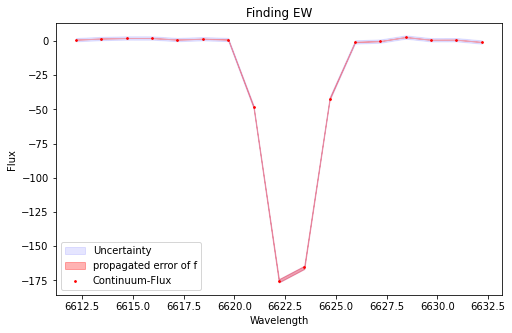

EW= -11.393036201856646  at (i,j)= 8 , 5
sigma f is  [2.89111684e-11 8.06262287e-09 1.06366834e-06 6.80113165e-05
 2.13068129e-03 3.28918447e-02 2.51008467e-01 9.48682269e-01
 1.77748429e+00 1.65149757e+00 7.60701969e-01 1.73544027e-01
 1.95741169e-02 1.08809930e-03 2.96458888e-05 3.91742819e-07
 2.45289651e-09]
 


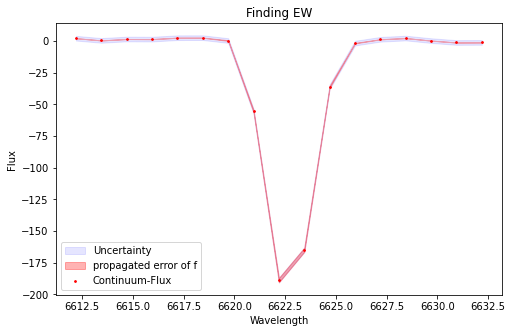

EW= -11.357777229454982  at (i,j)= 8 , 6
sigma f is  [1.19849531e-11 5.04428844e-09 8.48160000e-07 6.41825498e-05
 2.25803409e-03 3.74317343e-02 2.94311157e-01 1.10135103e+00
 1.96481447e+00 1.67179052e+00 6.77973386e-01 1.30782932e-01
 1.19529994e-02 5.13669151e-04 1.02155198e-05 9.02450529e-08
 2.96289407e-10]
 


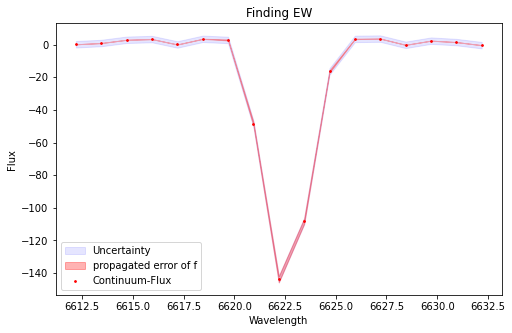

EW= -7.681584647718491  at (i,j)= 8 , 7
sigma f is  [           nan 4.11141205e-09 7.58622712e-07 5.61764511e-05
 1.87671341e-03 2.92025360e-02 2.14411241e-01 7.47314128e-01
 1.23978870e+00 9.79475296e-01 3.67950756e-01 6.54566585e-02
 5.46614645e-03 2.10095899e-04 3.51354174e-06 1.81058618e-08
            nan]
 


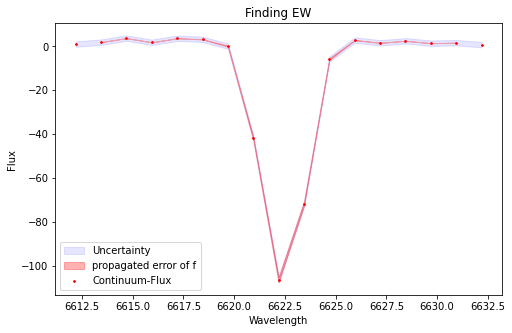

EW= -5.3248712479807825  at (i,j)= 8 , 8
sigma f is  [1.16297142e-11 2.19529847e-08 2.72899172e-06 1.47635566e-04
 3.77807050e-03 4.69281119e-02 2.86048382e-01 8.60081399e-01
 1.27847921e+00 9.39680340e-01 3.40898834e-01 6.07695003e-02
 5.27294277e-03 2.17962890e-04 4.02707778e-06 2.06816993e-08
            nan]
 


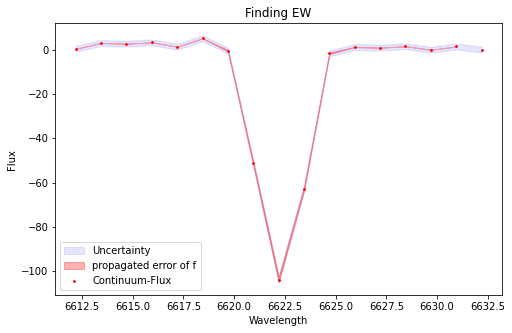

EW= -5.0696109479175675  at (i,j)= 8 , 9
sigma f is  [3.56531692e-10 7.52724217e-08 6.87632508e-06 3.00318132e-04
 6.45571737e-03 6.91469049e-02 3.71267126e-01 1.00233742e+00
 1.36244431e+00 9.32367892e-01 3.20792651e-01 5.53164655e-02
 4.75081654e-03 2.00646807e-04 4.04177477e-06 3.48559507e-08
            nan]
 


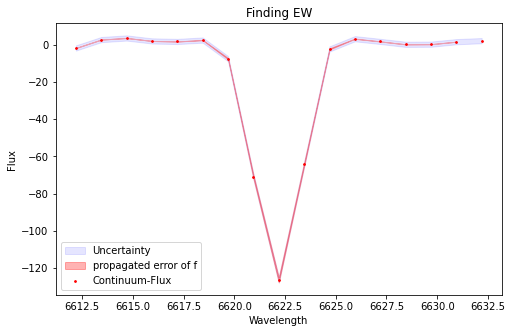

EW= -6.326276376709942  at (i,j)= 8 , 10
sigma f is  [4.29959459e-10 8.76968813e-08 8.11806866e-06 3.59238258e-04
 7.74409754e-03 8.20406777e-02 4.29073672e-01 1.11045754e+00
 1.42352419e+00 9.03803394e-01 2.83855672e-01 4.39802596e-02
 3.34430503e-03 1.23549086e-04 2.16793426e-06 1.68905295e-08
 3.35199239e-11]
 


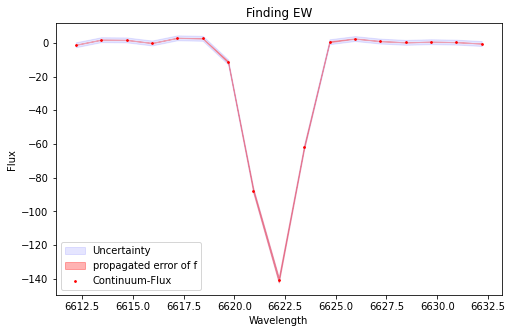

EW= -7.10911574237614  at (i,j)= 8 , 11
sigma f is  [5.29296600e-10 1.13094239e-07 1.07299357e-05 4.77376130e-04
 1.01556900e-02 1.04244076e-01 5.18673954e-01 1.25390881e+00
 1.47425969e+00 8.42812739e-01 2.33953036e-01 3.14372741e-02
 2.03301262e-03 6.25368978e-05 8.90487208e-07 5.36754032e-09
            nan]
 


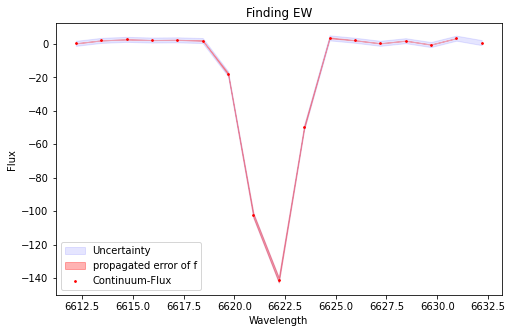

EW= -7.211644207968743  at (i,j)= 8 , 12
sigma f is  [2.29444703e-10 7.10181674e-08 9.20700572e-06 5.23970168e-04
 1.33217523e-02 1.52571559e-01 7.90508370e-01 1.85700353e+00
 1.97951636e+00 9.57271326e-01 2.09710888e-01 2.07488844e-02
 9.21789405e-04 1.81761747e-05 1.54868082e-07 5.22413279e-10
            nan]
 


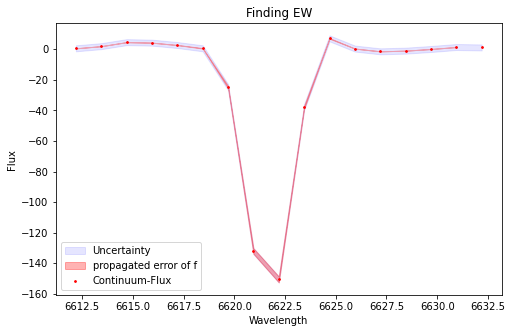

EW= -7.872749722463879  at (i,j)= 8 , 13
sigma f is  [3.36245352e-12 1.38106350e-09 2.56166789e-07 2.20230022e-05
 8.87674534e-04 1.68748454e-02 1.51807399e-01 6.47517816e-01
 1.31087893e+00 1.26003462e+00 5.74926032e-01 1.24415494e-01
 1.27476995e-02 6.16584360e-04 1.40052067e-05 1.47931334e-07
 7.11325860e-10]
 


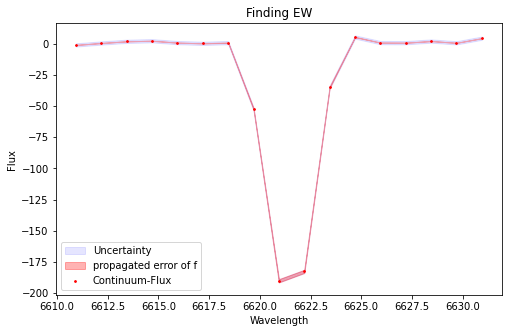

EW= -10.78768677012032  at (i,j)= 8 , 14
sigma f is  [6.94990276e-11 1.46302681e-08 1.55348236e-06 8.35103555e-05
 2.27799768e-03 3.15785301e-02 2.22678255e-01 7.99238229e-01
 1.46060898e+00 1.35924647e+00 6.44054498e-01 1.55332180e-01
 1.90568291e-02 1.18814749e-03 3.75903529e-05 6.02107401e-07
 4.86486695e-09]
 


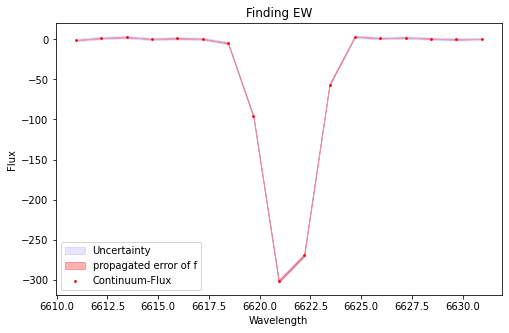

EW= -18.166954495132206  at (i,j)= 8 , 15
sigma f is  [3.88617090e-09 4.86888255e-07 2.99355586e-05 9.41241621e-04
 1.53791386e-02 1.31591471e-01 5.92045862e-01 1.40358992e+00
 1.75496108e+00 1.15715202e+00 4.01899943e-01 7.33454025e-02
 7.00042939e-03 3.46319588e-04 8.71050095e-06 1.05576806e-07
 4.54331885e-10]
 


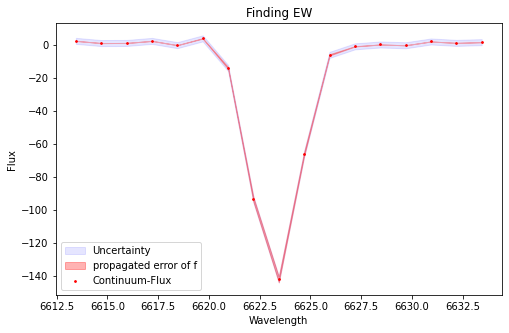

EW= -10.308766303944038  at (i,j)= 9 , 0
sigma f is  [1.07433952e-09 1.95102066e-07 1.45346661e-05 5.21367195e-04
 9.35818015e-03 8.53281860e-02 3.98045120e-01 9.53282645e-01
 1.17371143e+00 7.42781769e-01 2.41162278e-01 4.00003653e-02
 3.36032968e-03 1.40296479e-04 2.76181031e-06 1.90658568e-08
            nan]
 


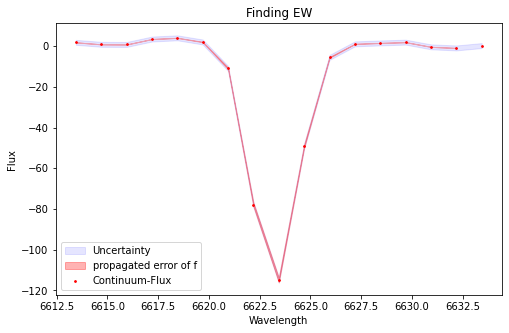

EW= -7.937916563364626  at (i,j)= 9 , 1
sigma f is  [8.56715843e-09 8.33312997e-07 4.16977663e-05 1.09008669e-03
 1.50019438e-02 1.09136919e-01 4.20680289e-01 8.60268251e-01
 9.33736772e-01 5.37825022e-01 1.64244871e-01 2.65450423e-02
 2.26309003e-03 1.01185600e-04 2.34616087e-06 2.75042647e-08
 1.50521009e-10]
 


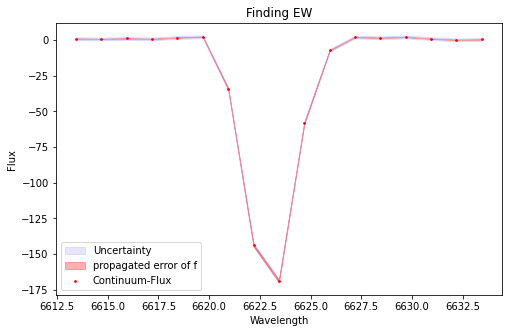

EW= -14.283939772922277  at (i,j)= 9 , 2
sigma f is  [1.01891972e-08 1.04674667e-06 5.56338697e-05 1.53520139e-03
 2.20429564e-02 1.64913463e-01 6.43429483e-01 1.30983938e+00
 1.39152182e+00 7.71401009e-01 2.23062943e-01 3.36219238e-02
 2.63851109e-03 1.07606454e-04 2.27399873e-06 2.47798720e-08
 1.38019780e-10]
 


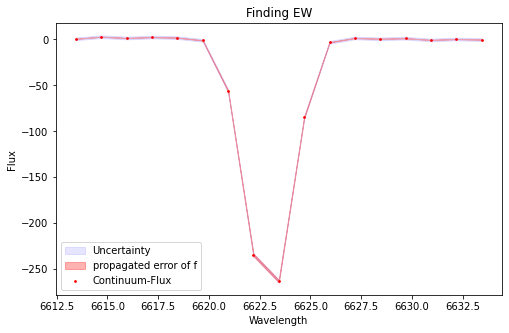

EW= -21.98202358872698  at (i,j)= 9 , 3
sigma f is  [2.50522653e-11 5.91886762e-09 6.93277637e-07 4.07395140e-05
 1.20853045e-03 1.81626623e-02 1.38584061e-01 5.37549503e-01
 1.06072252e+00 1.06506051e+00 5.44089645e-01 1.41330893e-01
 1.86460677e-02 1.24709787e-03 4.21522737e-05 7.16187218e-07
 6.05616203e-09]
 


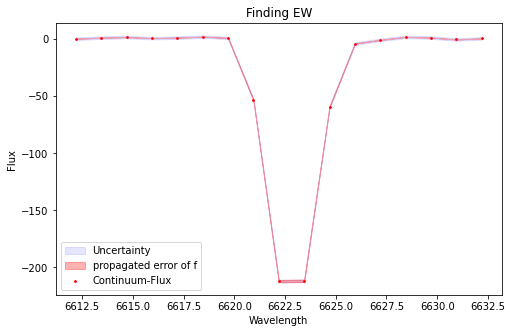

EW= -17.355307032309515  at (i,j)= 9 , 4
sigma f is  [3.61214788e-11 8.77735779e-09 1.05515060e-06 6.32128586e-05
 1.89515032e-03 2.85052114e-02 2.15441878e-01 8.18992172e-01
 1.56676347e+00 1.50862245e+00 7.31057756e-01 1.78200745e-01
 2.18306035e-02 1.34209046e-03 4.13080202e-05 6.34082543e-07
 4.82160400e-09]
 


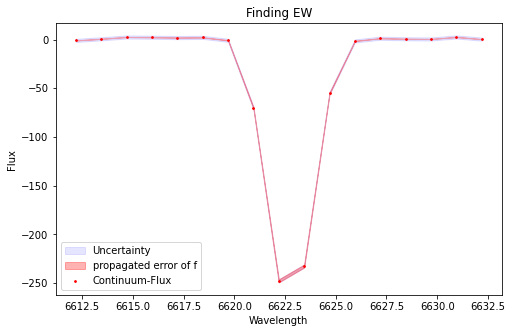

EW= -17.869452034789173  at (i,j)= 9 , 5
sigma f is  [5.68677699e-11 1.32723929e-08 1.50890642e-06 8.51101212e-05
 2.40276935e-03 3.41131634e-02 2.44234786e-01 8.83210199e-01
 1.61457243e+00 1.49245795e+00 6.97401593e-01 1.64601349e-01
 1.95910163e-02 1.17261469e-03 3.51283849e-05 5.22098500e-07
 3.77958391e-09]
 


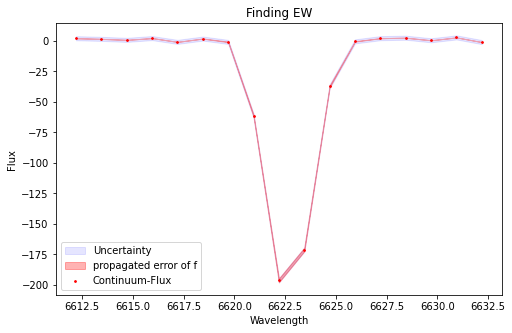

EW= -13.345193536248422  at (i,j)= 9 , 6
sigma f is  [3.14441515e-11 1.03457696e-08 1.50364991e-06 1.02039924e-04
 3.29790679e-03 5.12323162e-02 3.84398209e-01 1.39664965e+00
 2.46050890e+00 2.10251705e+00 8.70958975e-01 1.74632831e-01
 1.68972280e-02 7.84614959e-04 1.72967262e-05 1.76682435e-07
 7.75957317e-10]
 


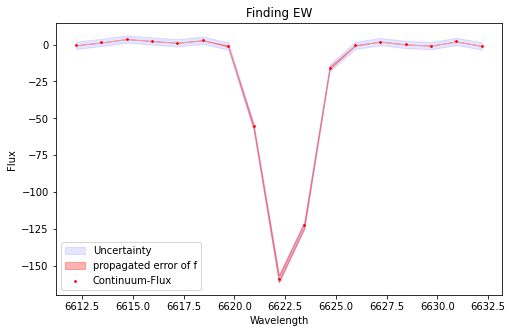

EW= -9.52927227292719  at (i,j)= 9 , 7
sigma f is  [2.50756062e-10 5.04588215e-08 4.93352286e-06 2.38025018e-04
 5.71010023e-03 6.83984065e-02 4.10096152e-01 1.23242705e+00
 1.85762043e+00 1.40444225e+00 5.32335739e-01 1.01040051e-01
 9.58316569e-03 4.52530773e-04 1.05703605e-05 1.20591020e-07
 6.52225293e-10]
 


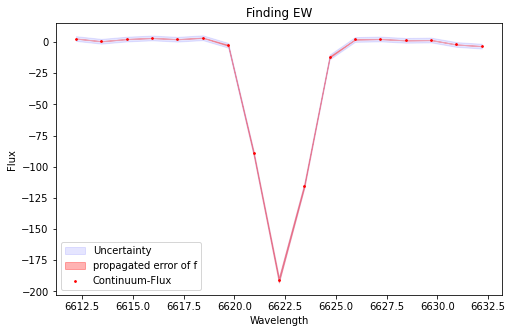

EW= -10.563397634436608  at (i,j)= 9 , 8
sigma f is  [6.96234616e-10 1.01316592e-07 7.58684356e-06 2.92567940e-04
 5.81484395e-03 5.96168558e-02 3.15559113e-01 8.62955701e-01
 1.21991108e+00 8.91716662e-01 3.37043753e-01 6.58540279e-02
 6.64785859e-03 3.46474077e-04 9.31513236e-06 1.29081097e-07
 9.21149914e-10]
 


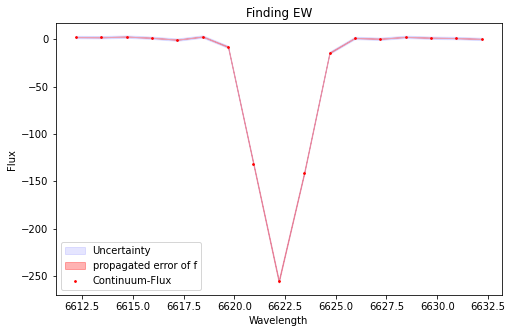

EW= -13.576311589748354  at (i,j)= 9 , 9
sigma f is  [9.43819417e-10 1.36640998e-07 1.00168916e-05 3.75436210e-04
 7.23179813e-03 7.18082736e-02 3.68215800e-01 9.76059606e-01
 1.33813614e+00 9.48799905e-01 3.47773129e-01 6.58292898e-02
 6.42338237e-03 3.22122500e-04 8.25923262e-06 1.07235338e-07
 6.90641922e-10]
 


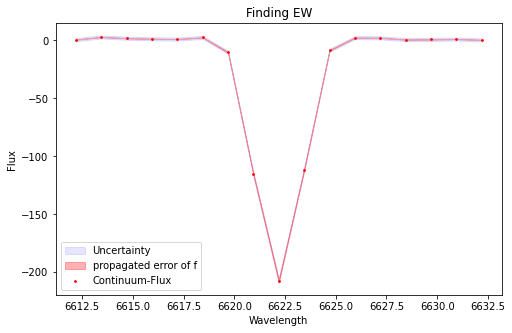

EW= -11.64651583951864  at (i,j)= 9 , 10
sigma f is  [8.59325574e-10 1.47034019e-07 1.22885022e-05 5.07272092e-04
 1.04035037e-02 1.06355813e-01 5.43042889e-01 1.38634871e+00
 1.77044009e+00 1.13093348e+00 3.61146861e-01 5.75811991e-02
 4.57381463e-03 1.80325810e-04 3.50543846e-06 3.31663275e-08
 1.48133335e-10]
 


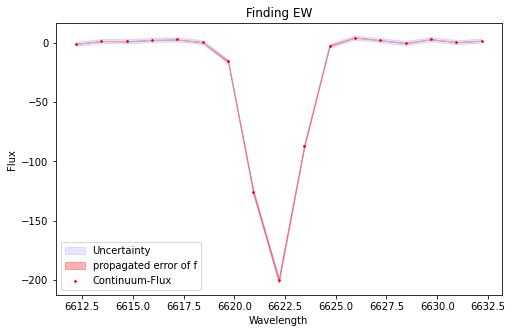

EW= -11.220814122431452  at (i,j)= 9 , 11
sigma f is  [2.52625872e-09 3.34290471e-07 2.24245454e-05 7.63194557e-04
 1.31900681e-02 1.15865632e-01 5.17761799e-01 1.17783465e+00
 1.36468168e+00 8.05488478e-01 2.42169047e-01 3.70705288e-02
 2.88737167e-03 1.14335672e-04 2.29971221e-06 2.34738834e-08
 1.21491949e-10]
 


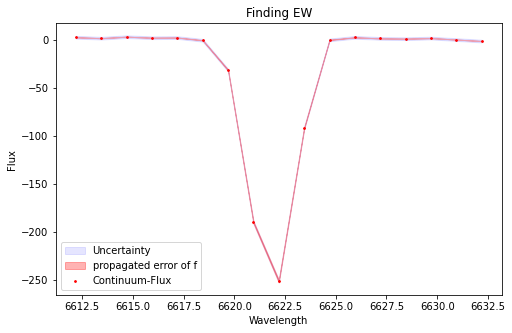

EW= -15.107955501091181  at (i,j)= 9 , 12
sigma f is  [1.02259854e-09 1.94172624e-07 1.75164617e-05 7.55312039e-04
 1.56226892e-02 1.55331853e-01 7.43366595e-01 1.71356352e+00
 1.90318511e+00 1.01837654e+00 2.62405455e-01 3.25279360e-02
 1.93665528e-03 5.52335462e-05 7.51219289e-07 4.83342622e-09
 1.44734234e-11]
 


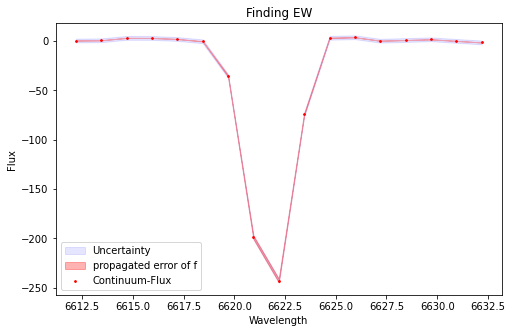

EW= -14.72017143461338  at (i,j)= 9 , 13
sigma f is  [1.84429780e-11 5.21842604e-09 7.25498900e-07 4.95966503e-05
 1.66861212e-03 2.76527796e-02 2.25940509e-01 9.10915578e-01
 1.81332341e+00 1.78304650e+00 8.66136617e-01 2.07804516e-01
 2.46122954e-02 1.43802049e-03 4.14115364e-05 5.87253433e-07
 4.09723113e-09]
 


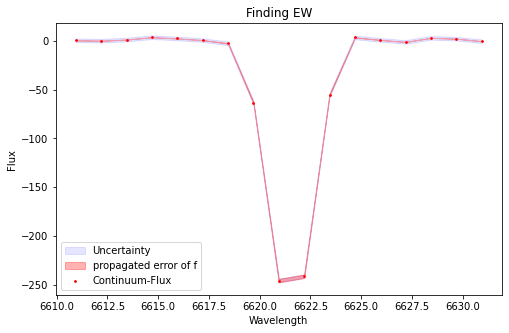

EW= -16.313607335213607  at (i,j)= 9 , 14
sigma f is  [1.19711238e-10 2.00550602e-08 1.75490632e-06 8.02475072e-05
 1.91854327e-03 2.39931470e-02 1.57028217e-01 5.38040379e-01
 9.65449546e-01 9.07403356e-01 4.46731169e-01 1.15192669e-01
 1.55537962e-02 1.09934214e-03 4.06565244e-05 7.86361703e-07
 7.95049379e-09]
 


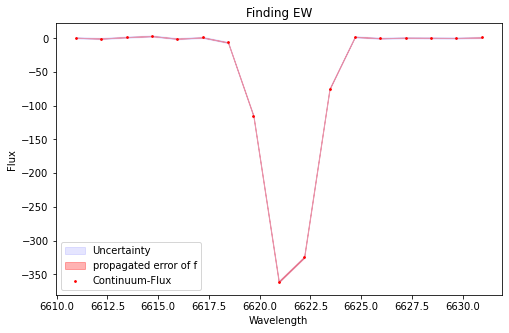

EW= -25.175247835896535  at (i,j)= 9 , 15
sigma f is  [1.36883421e-09 2.57552427e-07 2.02433584e-05 7.60530177e-04
 1.41418272e-02 1.31987797e-01 6.22452525e-01 1.48817161e+00
 1.80608984e+00 1.11241627e+00 3.47090344e-01 5.46359880e-02
 4.30300478e-03 1.66530110e-04 3.01512551e-06 1.97848636e-08
            nan]
 


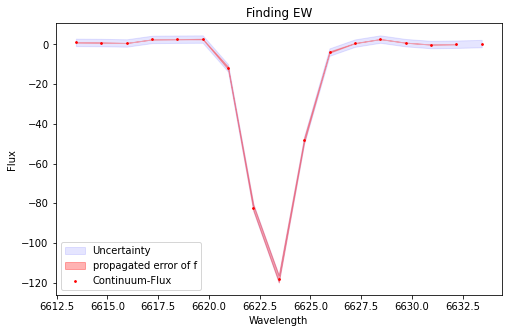

EW= -9.207722045258775  at (i,j)= 10 , 0
sigma f is  [6.82645757e-09 7.62926582e-07 4.10381971e-05 1.12496465e-03
 1.60355957e-02 1.19957074e-01 4.73150038e-01 9.86350731e-01
 1.08769863e+00 6.34298336e-01 1.95292591e-01 3.16365596e-02
 2.67858178e-03 1.16919580e-04 2.54440071e-06 2.43491936e-08
            nan]
 


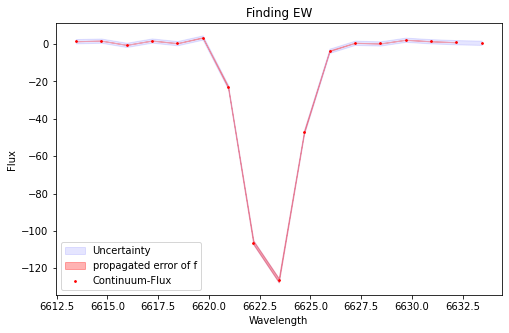

EW= -11.066495883125937  at (i,j)= 10 , 1
sigma f is  [7.45548482e-08 5.19585994e-06 1.97340455e-04 4.08935696e-03
 4.62722967e-02 2.86056266e-01 9.66498949e-01 1.78508982e+00
 1.80243492e+00 9.94896302e-01 3.00148627e-01 4.94758235e-02
 4.45376382e-03 2.18783526e-04 5.85848581e-06 8.53790487e-08
 6.75577811e-10]
 


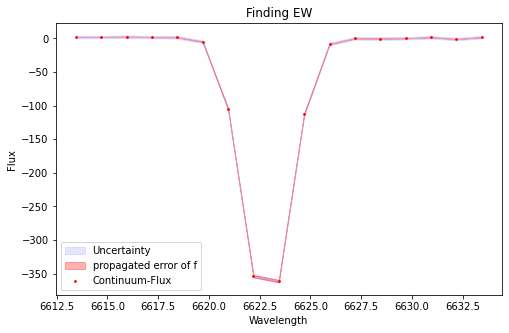

EW= -34.73485738729737  at (i,j)= 10 , 2
sigma f is  [1.37658857e-10 2.27042085e-08 1.96988324e-06 8.99371206e-05
 2.16139261e-03 2.73495610e-02 1.82264842e-01 6.39862925e-01
 1.18351626e+00 1.15347432e+00 5.92379149e-01 1.60298385e-01
 2.28530747e-02 1.71619793e-03 6.78728475e-05 1.41323037e-06
 1.54878094e-08]
 


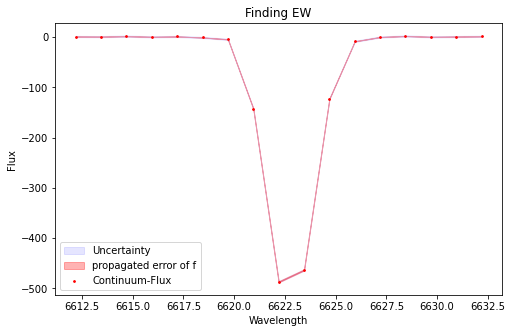

EW= -45.034215740387246  at (i,j)= 10 , 3
sigma f is  [6.06902652e-11 1.19747968e-08 1.21461816e-06 6.33757650e-05
 1.70229600e-03 2.35562008e-02 1.68056916e-01 6.18554695e-01
 1.17516536e+00 1.15281953e+00 5.83988236e-01 1.52741844e-01
 2.06183650e-02 1.43563507e-03 5.15259203e-05 9.52515772e-07
 9.06265367e-09]
 


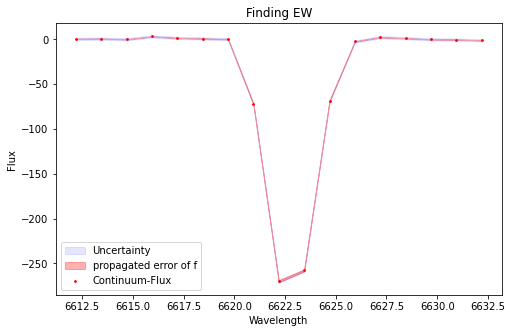

EW= -25.07123027925162  at (i,j)= 10 , 4
sigma f is  [1.15191875e-10 2.03587992e-08 1.86807907e-06 8.91097923e-05
 2.21178014e-03 2.85840954e-02 1.92426998e-01 6.74983686e-01
 1.23389585e+00 1.17556304e+00 5.83678705e-01 1.51005513e-01
 2.03507013e-02 1.42805385e-03 5.21451915e-05 9.89912782e-07
 9.75730614e-09]
 


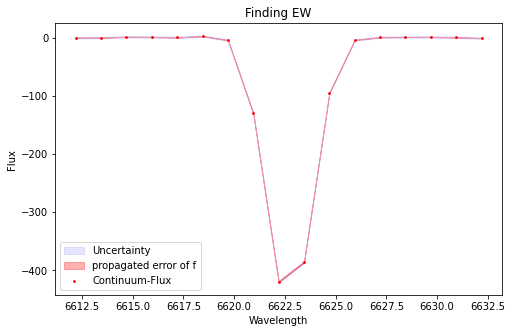

EW= -35.78436512304871  at (i,j)= 10 , 5
sigma f is  [2.12881029e-10 3.61794006e-08 3.18551096e-06 1.45723513e-04
 3.46984933e-03 4.30575541e-02 2.78672651e-01 9.41166482e-01
 1.65915701e+00 1.52684430e+00 7.33407424e-01 1.83827726e-01
 2.40305251e-02 1.63697886e-03 5.80373927e-05 1.06889765e-06
 1.01964156e-08]
 


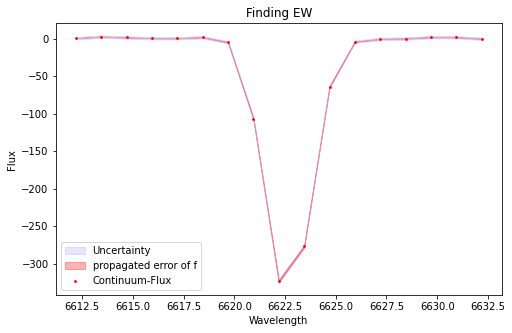

EW= -24.920102591129616  at (i,j)= 10 , 6
sigma f is  [1.34018998e-10 2.86310844e-08 3.01317069e-06 1.58070695e-04
 4.15903226e-03 5.50776888e-02 3.67887105e-01 1.24092596e+00
 2.11517882e+00 1.82217120e+00 7.93139099e-01 1.74296554e-01
 1.93101707e-02 1.07596101e-03 3.00302517e-05 4.16808574e-07
 2.83589957e-09]
 


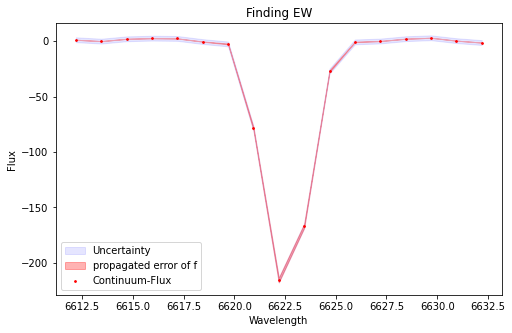

EW= -14.866418875753803  at (i,j)= 10 , 7
sigma f is  [5.66140323e-10 9.15446371e-08 7.55948006e-06 3.19054771e-04
 6.88908074e-03 7.61752190e-02 4.31768629e-01 1.25561538e+00
 1.87466664e+00 1.43753509e+00 5.66177174e-01 1.14494289e-01
 1.18805691e-02 6.32034333e-04 1.72214569e-05 2.40098647e-07
 1.71114234e-09]
 


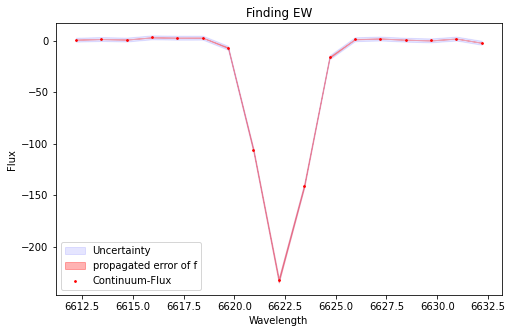

EW= -13.788486145501617  at (i,j)= 10 , 8
sigma f is  [4.01339650e-09 4.07348475e-07 2.22976219e-05 6.58626174e-04
 1.05043400e-02 9.05123609e-02 4.21597598e-01 1.06204778e+00
 1.44741996e+00 1.06740176e+00 4.25935199e-01 9.19521709e-02
 1.07357763e-02 6.77567635e-04 2.31034800e-05 4.25351111e-07
 4.22573144e-09]
 


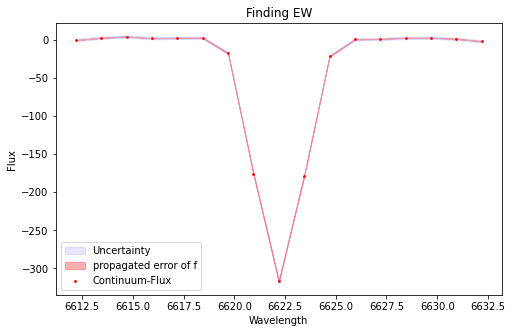

EW= -18.45480734598726  at (i,j)= 10 , 9
sigma f is  [1.03077987e-09 1.19838466e-07 7.33048214e-06 2.36823148e-04
 4.05032613e-03 3.67265123e-02 1.76728078e-01 4.51557213e-01
 6.12796403e-01 4.41688668e-01 1.69043713e-01 3.43336862e-02
 3.69717211e-03 2.10765413e-04 6.34591364e-06 1.00533600e-07
 8.32561078e-10]
 


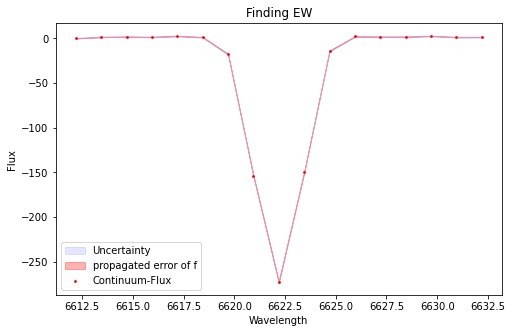

EW= -16.477267514206595  at (i,j)= 10 , 10
sigma f is  [2.37766473e-09 2.57603994e-07 1.47614396e-05 4.47892914e-04
 7.20167522e-03 6.13967791e-02 2.77632709e-01 6.66049626e-01
 8.47809424e-01 5.72586637e-01 2.05154753e-01 3.89862144e-02
 3.92786629e-03 2.09682893e-04 5.92600992e-06 8.85575408e-08
 6.98515232e-10]
 


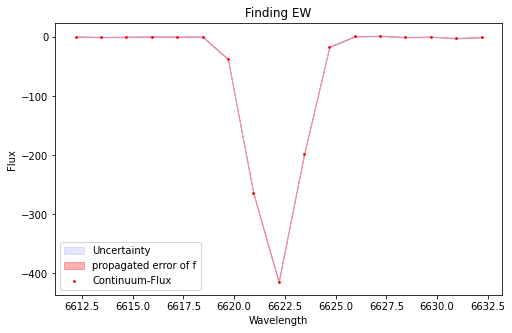

EW= -26.392442805336493  at (i,j)= 10 , 11
sigma f is  [5.45737917e-09 5.71372969e-07 3.15696917e-05 9.21162111e-04
 1.42014524e-02 1.15721418e-01 4.98520891e-01 1.13554791e+00
 1.36775482e+00 8.71136863e-01 2.93359787e-01 5.22245449e-02
 4.91348585e-03 2.44216001e-04 6.40896420e-06 8.87355101e-08
 6.47493898e-10]
 


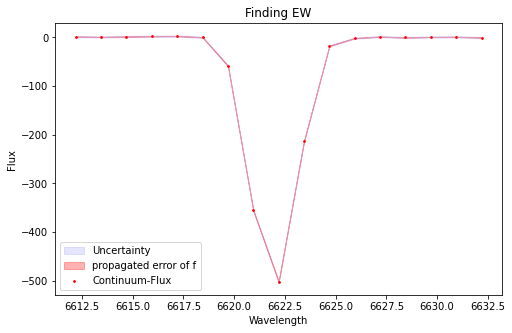

EW= -33.098452637225925  at (i,j)= 10 , 12
sigma f is  [6.55119869e-09 6.82762736e-07 3.71722852e-05 1.05936988e-03
 1.58246575e-02 1.24012238e-01 5.10137821e-01 1.10191834e+00
 1.25000240e+00 7.44652853e-01 2.32905546e-01 3.82294517e-02
 3.29080387e-03 1.48397400e-04 3.50002258e-06 4.30686362e-08
 2.75405973e-10]
 


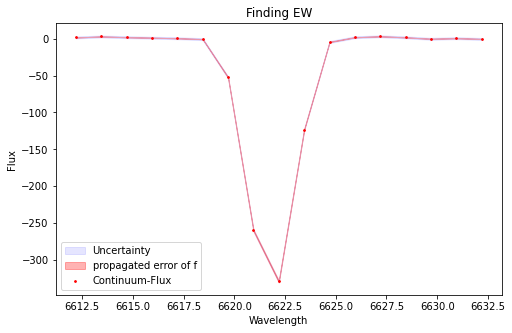

EW= -23.47059795137832  at (i,j)= 10 , 13
sigma f is  [1.07635288e-08 1.11124003e-06 5.90731000e-05 1.61854257e-03
 2.28810406e-02 1.67078900e-01 6.30824691e-01 1.23254767e+00
 1.24693524e+00 6.53282824e-01 1.77203085e-01 2.48707825e-02
 1.80455507e-03 6.76171822e-05 1.30699149e-06 1.30184199e-08
 6.67574200e-11]
 


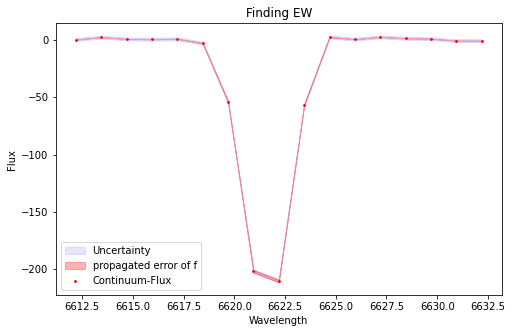

EW= -16.730989632977817  at (i,j)= 10 , 14
sigma f is  [6.17524925e-10 7.34318997e-08 4.75877807e-06 1.68410092e-04
 3.25905288e-03 3.45195575e-02 2.00243908e-01 6.36425239e-01
 1.10847722e+00 1.05810447e+00 5.53504028e-01 1.58637278e-01
 2.49004452e-02 2.13921858e-03 1.00495698e-04 2.57805589e-06
 3.60415354e-08]
 


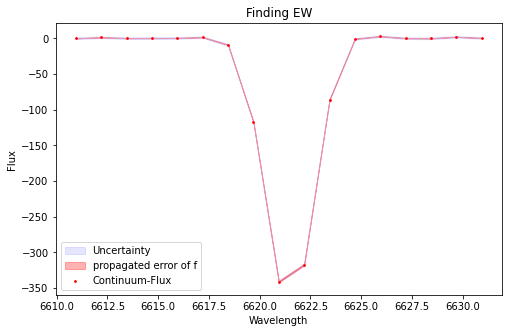

EW= -28.531140301555872  at (i,j)= 10 , 15
sigma f is  [           nan 3.52793425e-07 2.49232345e-05 8.03021335e-04
 1.28961868e-02 1.06028818e-01 4.51291258e-01 9.99458498e-01
 1.15388438e+00 6.94136360e-01 2.16919958e-01 3.49676261e-02
 2.86242892e-03 1.14160710e-04 1.84436289e-06            nan
            nan]
 


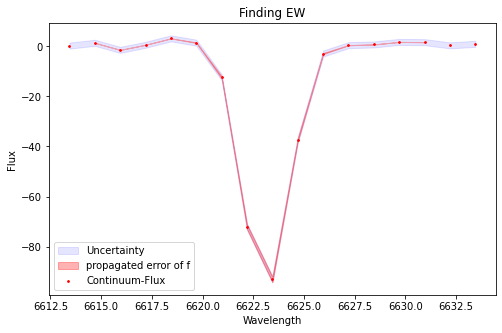

EW= -7.539485965167264  at (i,j)= 11 , 0
sigma f is  [3.82642313e-09 5.56818715e-07 3.68916186e-05 1.19033937e-03
 1.91301199e-02 1.54676240e-01 6.32372247e-01 1.31054072e+00
 1.37800072e+00 7.34847057e-01 1.98381192e-01 2.70066438e-02
 1.83985951e-03 6.17187364e-05 9.77438259e-07 6.05528915e-09
            nan]
 


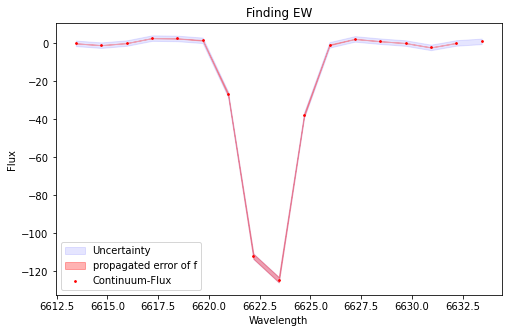

EW= -10.463882825722113  at (i,j)= 11 , 1
sigma f is  [7.94224958e-10 9.86165793e-08 6.67015895e-06 2.45882321e-04
 4.94265812e-03 5.42094393e-02 3.24561564e-01 1.06126941e+00
 1.89589656e+00 1.85079991e+00 9.87387305e-01 2.87842853e-01
 4.58409279e-02 3.98672095e-03 1.89250189e-04 4.90099169e-06
 6.92020739e-08]
 


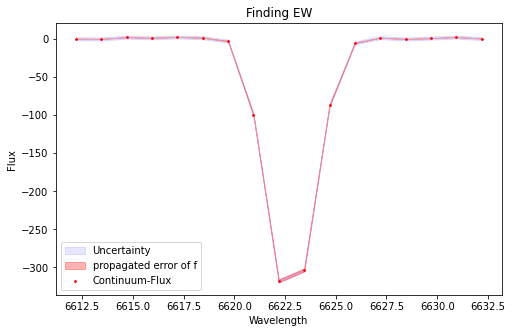

EW= -28.322336974479658  at (i,j)= 11 , 2
sigma f is  [9.08934695e-11 1.78447766e-08 1.79743503e-06 9.30327102e-05
 2.47697981e-03 3.39496455e-02 2.39659500e-01 8.71655778e-01
 1.63368739e+00 1.57795704e+00 7.85418369e-01 2.01423724e-01
 2.66064794e-02 1.80934261e-03 6.32998652e-05 1.13812269e-06
 1.05010598e-08]
 


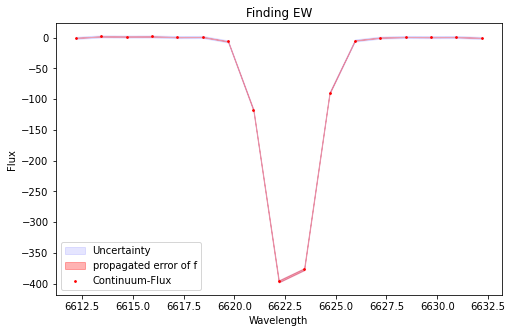

EW= -36.49785890281648  at (i,j)= 11 , 3
sigma f is  [1.66994996e-11 3.86979047e-09 4.49133185e-07 2.61966070e-05
 7.69538504e-04 1.14009306e-02 8.52658347e-02 3.22098496e-01
 6.14786393e-01 5.92968371e-01 2.88983587e-01 7.11410334e-02
 8.84170016e-03 5.54298302e-04 1.75052875e-05 2.77930139e-07
 2.21137149e-09]
 


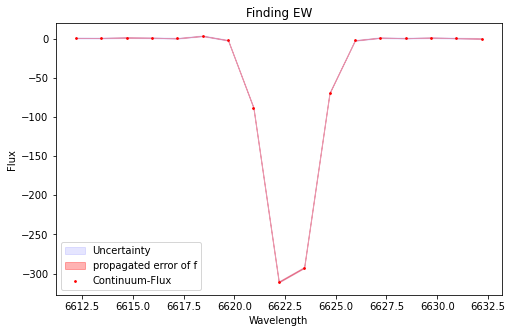

EW= -28.596418075509533  at (i,j)= 11 , 4
sigma f is  [1.87655854e-10 3.16943516e-08 2.79159078e-06 1.28253636e-04
 3.07418954e-03 3.84523714e-02 2.51029895e-01 8.55464517e-01
 1.52194884e+00 1.41366715e+00 6.85566596e-01 1.73577018e-01
 2.29424012e-02 1.58283203e-03 5.69914194e-05 1.07072956e-06
 1.04943160e-08]
 


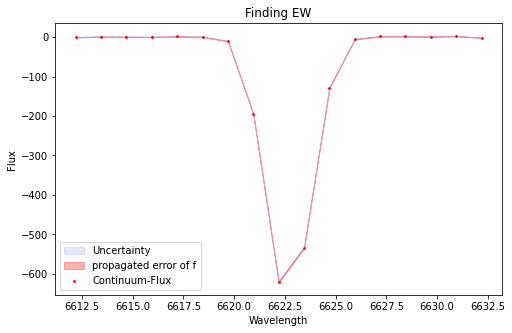

EW= -54.44863972493302  at (i,j)= 11 , 5
sigma f is  [2.95993603e-10 4.40415711e-08 3.46342162e-06 1.44002215e-04
 3.16675710e-03 3.68465670e-02 2.26911898e-01 7.39800408e-01
 1.27719688e+00 1.16772176e+00 5.65419432e-01 1.44984618e-01
 1.96844705e-02 1.41472780e-03 5.38070743e-05 1.08261696e-06
 1.15191616e-08]
 


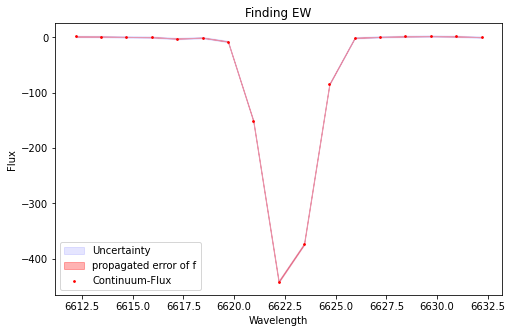

EW= -37.85689618444374  at (i,j)= 11 , 6
sigma f is  [1.73871740e-10 3.20683973e-08 3.02053690e-06 1.45729206e-04
 3.60823144e-03 4.59064156e-02 3.00360384e-01 1.01117963e+00
 1.75207811e+00 1.56261921e+00 7.17263147e-01 1.69391248e-01
 2.05705175e-02 1.28338283e-03 4.10809017e-05 6.73296262e-07
 5.63188535e-09]
 


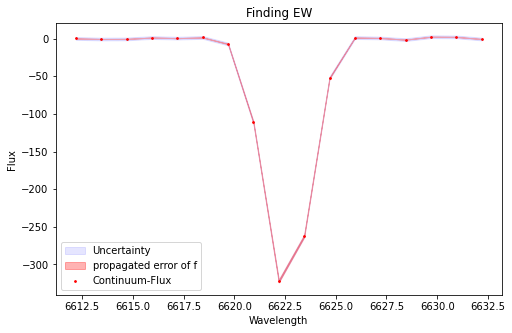

EW= -25.76222473396468  at (i,j)= 11 , 7
sigma f is  [3.07636790e-10 4.69317205e-08 3.70250010e-06 1.51205107e-04
 3.20039992e-03 3.51555574e-02 2.00698012e-01 5.96237630e-01
 9.22733192e-01 7.44354653e-01 3.13013676e-01 6.85834061e-02
 7.82235029e-03 4.63845176e-04 1.42798207e-05 2.27924067e-07
 1.88379018e-09]
 


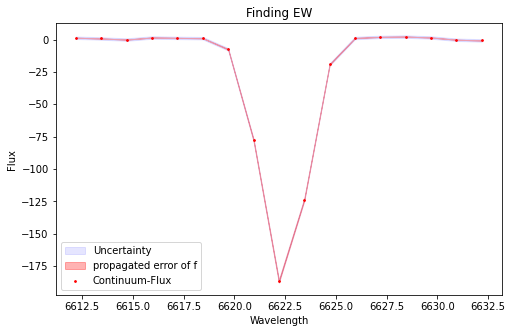

EW= -13.405314985968946  at (i,j)= 11 , 8
sigma f is  [9.21122961e-10 1.20483993e-07 8.20922121e-06 2.91677575e-04
 5.41113061e-03 5.24902512e-02 2.66635720e-01 7.10237413e-01
 9.93117852e-01 7.29404964e-01 2.81391014e-01 5.69864899e-02
 6.05189048e-03 3.36568235e-04 9.78757115e-06 1.48618773e-07
 1.17682575e-09]
 


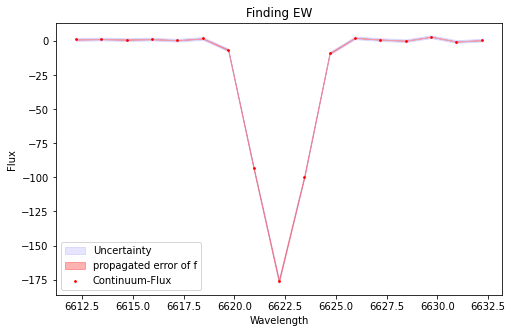

EW= -11.82695087078849  at (i,j)= 11 , 9
sigma f is  [2.09330387e-09 2.56156123e-07 1.63333914e-05 5.45425009e-04
 9.56715946e-03 8.83139462e-02 4.29514794e-01 1.10135044e+00
 1.48939053e+00 1.06224941e+00 3.99429780e-01 7.91320244e-02
 8.25001639e-03 4.51787790e-04 1.29563121e-05 1.93594552e-07
 1.49329369e-09]
 


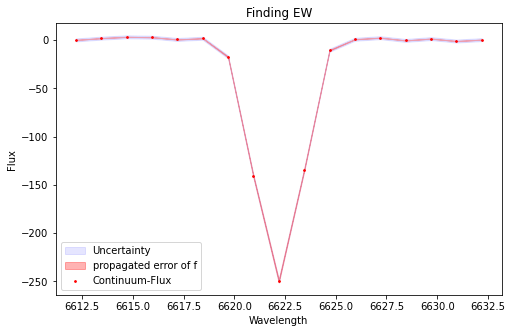

EW= -17.10697500827992  at (i,j)= 11 , 10
sigma f is  [4.67363015e-09 4.80457213e-07 2.63545118e-05 7.71901598e-04
 1.20780415e-02 1.00998729e-01 4.51468693e-01 1.07894259e+00
 1.37866521e+00 9.41903378e-01 3.44036468e-01 6.71707642e-02
 7.00839906e-03 3.90619181e-04 1.16238851e-05 1.84539015e-07
 1.56138884e-09]
 


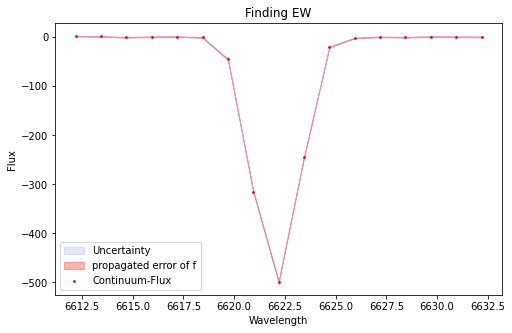

EW= -34.3620991256583  at (i,j)= 11 , 11
sigma f is  [3.33600815e-09 3.49927365e-07 1.94435537e-05 5.72442029e-04
 8.93207443e-03 7.38815636e-02 3.24016561e-01 7.53550281e-01
 9.29428428e-01 6.07993239e-01 2.10938267e-01 3.88110364e-02
 3.78655533e-03 1.95861122e-04 5.37002739e-06 7.80237745e-08
 6.00607123e-10]
 


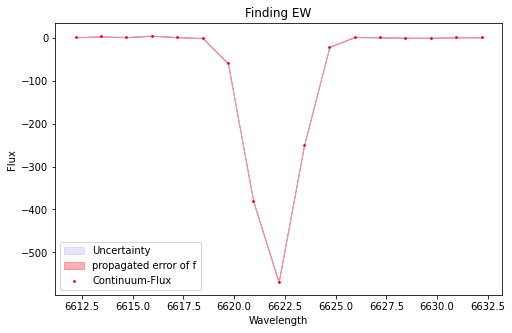

EW= -40.32846023543381  at (i,j)= 11 , 12
sigma f is  [7.76381924e-09 7.85840191e-07 4.18733388e-05 1.17532046e-03
 1.73888821e-02 1.35693721e-01 5.58819718e-01 1.21510089e+00
 1.39546822e+00 8.46548234e-01 2.71254626e-01 4.58967206e-02
 4.09900928e-03 1.93121088e-04 4.79693031e-06 6.27766953e-08
 4.32572980e-10]
 


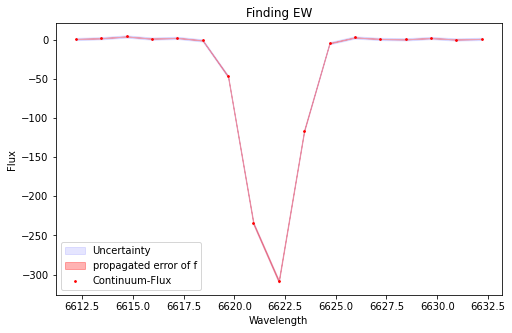

EW= -23.824022480560657  at (i,j)= 11 , 13
sigma f is  [1.19439614e-08 1.37581310e-06 8.02645161e-05 2.37984777e-03
 3.59395330e-02 2.76813973e-01 1.08834504e+00 2.18533037e+00
 2.24139254e+00 1.17416217e+00 3.14037458e-01 4.28511470e-02
 2.97958100e-03 1.05377314e-04 1.88991911e-06 1.71033700e-08
 7.73996371e-11]
 


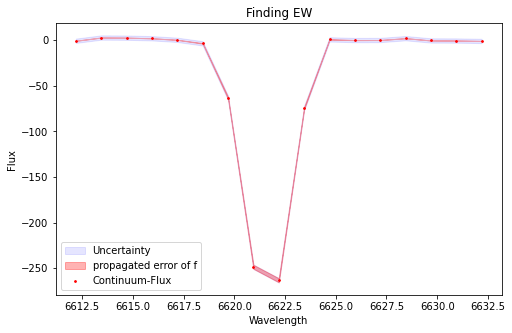

EW= -22.41907671042309  at (i,j)= 11 , 14
sigma f is  [8.73538938e-10 1.05387317e-07 6.94617369e-06 2.50243742e-04
 4.93014144e-03 5.31437065e-02 3.13577935e-01 1.01325416e+00
 1.79352630e+00 1.73939411e+00 9.24299946e-01 2.69099828e-01
 4.29142140e-02 3.74737965e-03 1.79104726e-04 4.68306219e-06
 6.69541351e-08]
 


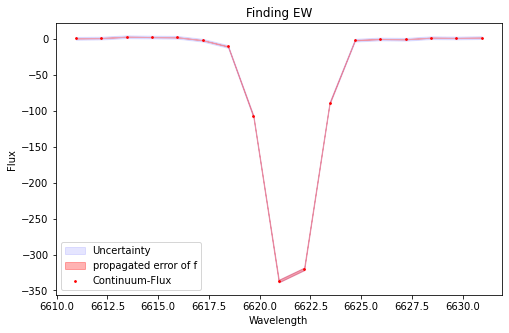

EW= -26.310160056695942  at (i,j)= 11 , 15
sigma f is  [           nan 7.82113492e-08 1.52513293e-05 6.83208098e-04
 1.35887217e-02 1.28741643e-01 5.94180622e-01 1.34799371e+00
 1.50790699e+00 8.30989718e-01 2.24396215e-01 2.92912387e-02
 1.78276735e-03 4.36702963e-05            nan            nan
            nan]
 


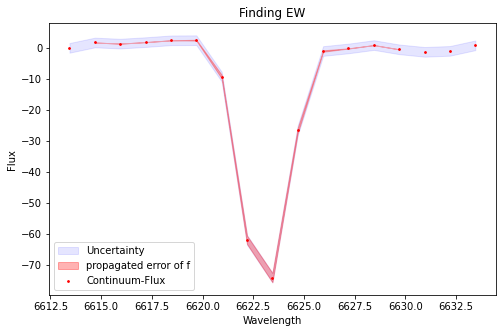

EW= -6.3843685116319975  at (i,j)= 12 , 0
sigma f is  [5.02840048e-09 7.70800603e-07 5.22320245e-05 1.70344571e-03
 2.74478135e-02 2.20989756e-01 8.93978655e-01 1.82200739e+00
 1.87264753e+00 9.70149899e-01 2.52814957e-01 3.29935889e-02
 2.13734710e-03 6.74077501e-05 9.80144278e-07 4.77803987e-09
            nan]
 


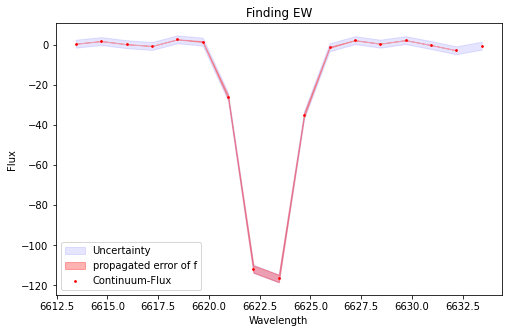

EW= -10.087382343581536  at (i,j)= 12 , 1
sigma f is  [3.17676143e-11 7.19347459e-09 7.89091798e-07 4.31855164e-05
 1.19408506e-03 1.67882643e-02 1.20448789e-01 4.41884328e-01
 8.29827146e-01 7.97982414e-01 3.92828922e-01 9.88993170e-02
 1.27097099e-02 8.30946008e-04 2.74728469e-05 4.54042149e-07
 3.65326800e-09]
 


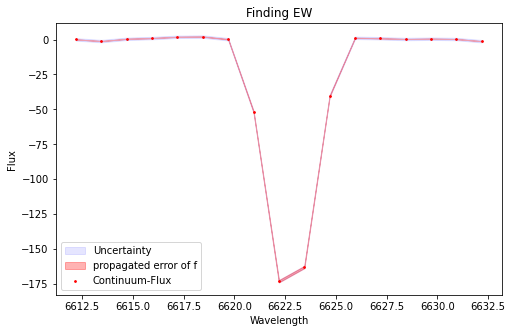

EW= -14.566103978300033  at (i,j)= 12 , 2
sigma f is  [4.21861010e-11 9.44202231e-09 1.06370214e-06 6.03753423e-05
 1.72858391e-03 2.49968119e-02 1.82828289e-01 6.77236216e-01
 1.27188498e+00 1.21189771e+00 5.85961141e-01 1.43711563e-01
 1.78632649e-02 1.12397263e-03 3.57506805e-05 5.74051498e-07
 4.64734917e-09]
 


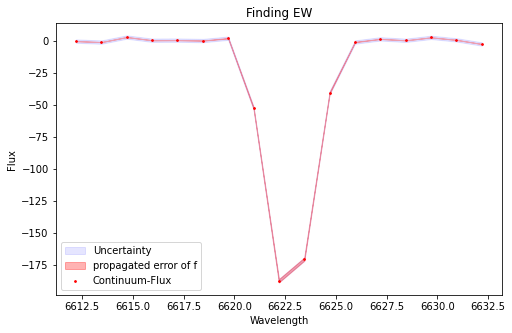

EW= -15.719921508849682  at (i,j)= 12 , 3
sigma f is  [4.74552509e-11 1.07230395e-08 1.21558439e-06 6.94018717e-05
 2.00042583e-03 2.91550633e-02 2.15072732e-01 8.03551709e-01
 1.52108863e+00 1.45901827e+00 7.09072503e-01 1.74542870e-01
 2.17487401e-02 1.37046985e-03 4.36080713e-05 6.99092828e-07
 5.62582488e-09]
 


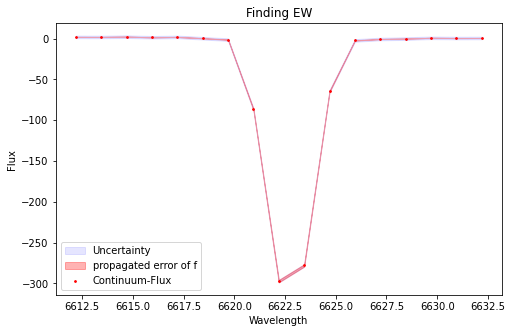

EW= -24.55477732094664  at (i,j)= 12 , 4
sigma f is  [3.06676574e-10 4.75867519e-08 3.89089475e-06 1.67820406e-04
 3.82125865e-03 4.59590830e-02 2.92081640e-01 9.81100524e-01
 1.74204995e+00 1.63517888e+00 8.11347733e-01 2.12776452e-01
 2.94853008e-02 2.15817732e-03 8.33930435e-05 1.69979676e-06
 1.82562504e-08]
 


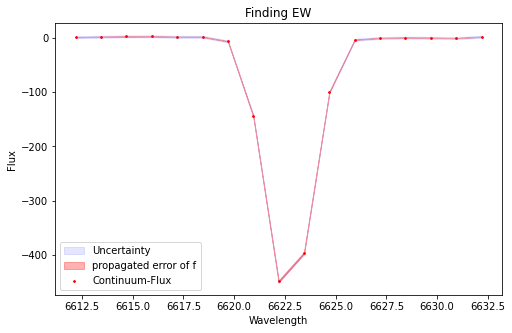

EW= -36.646843697976294  at (i,j)= 12 , 5
sigma f is  [1.62235952e-10 2.89750924e-08 2.66414859e-06 1.26319890e-04
 3.09212427e-03 3.91068407e-02 2.55675657e-01 8.64401446e-01
 1.51151880e+00 1.36712457e+00 6.39540287e-01 1.54704581e-01
 1.93444577e-02 1.24964472e-03 4.16714911e-05 7.16471899e-07
 6.34027131e-09]
 


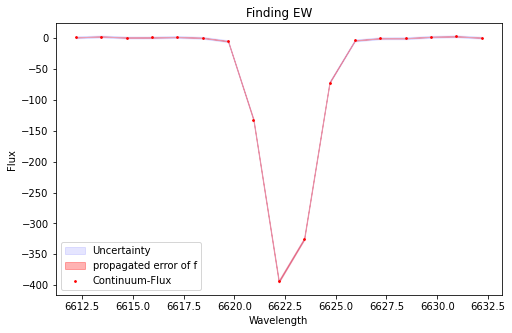

EW= -32.515786456605504  at (i,j)= 12 , 6
sigma f is  [2.30057506e-10 3.82553541e-08 3.29826613e-06 1.47530873e-04
 3.42585433e-03 4.13270317e-02 2.59153291e-01 8.45239470e-01
 1.43446396e+00 1.26705728e+00 5.82533372e-01 1.39377739e-01
 1.73484621e-02 1.12280366e-03 3.77621912e-05 6.59528931e-07
 5.97783954e-09]
 


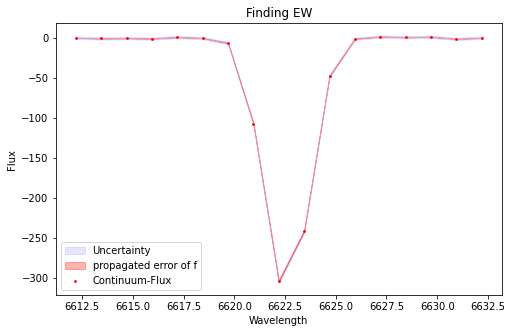

EW= -26.102898973314225  at (i,j)= 12 , 7
sigma f is  [2.57792111e-10 4.38870597e-08 3.82829505e-06 1.71282484e-04
 3.93528308e-03 4.64914298e-02 2.82816555e-01 8.87024624e-01
 1.43588130e+00 1.20039589e+00 5.18316500e-01 1.15540539e-01
 1.32844860e-02 7.86849556e-04 2.39761373e-05 3.75331994e-07
 3.01480865e-09]
 


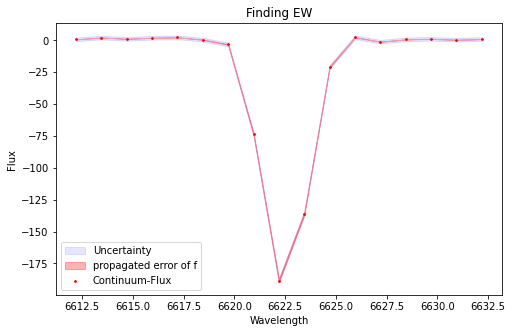

EW= -15.396903580556357  at (i,j)= 12 , 8
sigma f is  [2.60339314e-10 4.61266266e-08 4.11272714e-06 1.84713708e-04
 4.18362578e-03 4.78445429e-02 2.76623271e-01 8.09517834e-01
 1.20015943e+00 9.01879333e-01 3.43532988e-01 6.62981715e-02
 6.47698384e-03 3.19954239e-04 7.98175338e-06 1.00428978e-07
 6.36603690e-10]
 


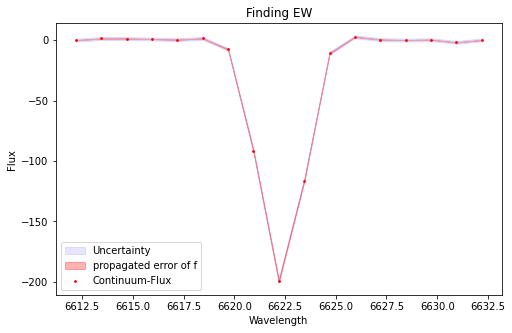

EW= -14.666512887101709  at (i,j)= 12 , 9
sigma f is  [1.62183696e-09 1.76094144e-07 1.02268866e-05 3.17852696e-04
 5.28959861e-03 4.71585261e-02 2.25344297e-01 5.77372826e-01
 7.93443129e-01 5.84912986e-01 2.31303701e-01 4.90595084e-02
 5.57938839e-03 3.40093272e-04 1.11057852e-05 1.94184211e-07
 1.81702771e-09]
 


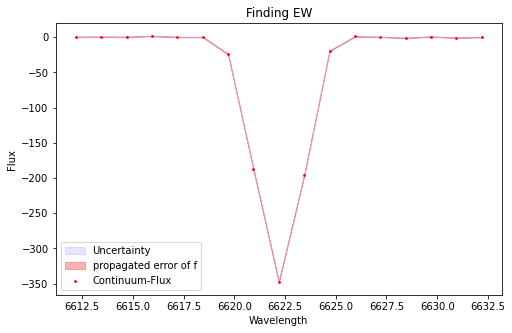

EW= -25.472531239251808  at (i,j)= 12 , 10
sigma f is  [6.13924808e-09 6.85417737e-07 4.01914184e-05 1.23834168e-03
 2.00571494e-02 1.70845418e-01 7.65609071e-01 1.80556653e+00
 2.24137335e+00 1.46470988e+00 5.03866210e-01 9.12310418e-02
 8.69210163e-03 4.35627274e-04 1.14799535e-05 1.59005270e-07
 1.15700763e-09]
 


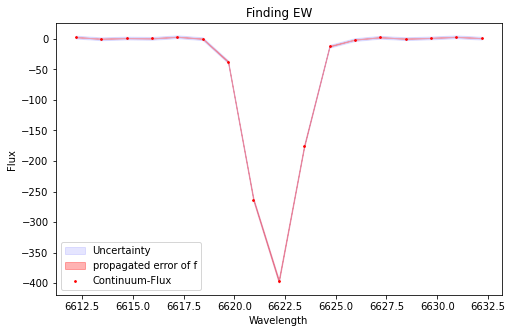

EW= -28.285402713477325  at (i,j)= 12 , 11
sigma f is  [1.07709362e-08 1.05583090e-06 5.48655627e-05 1.51178892e-03
 2.20945408e-02 1.71312159e-01 7.04843199e-01 1.53910922e+00
 1.78388106e+00 1.09749179e+00 3.58398519e-01 6.21188080e-02
 5.71358470e-03 2.78828825e-04 7.21785102e-06 9.90844638e-08
 7.21124736e-10]
 


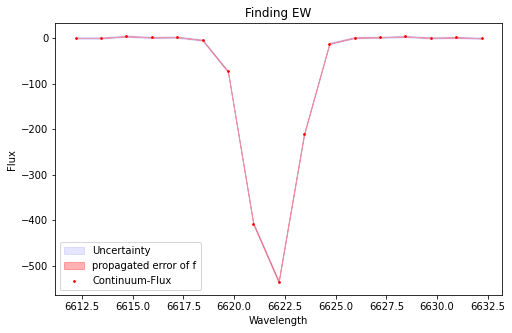

EW= -36.22133671864083  at (i,j)= 12 , 12
sigma f is  [9.69128006e-09 1.02400186e-06 5.64866262e-05 1.62740727e-03
 2.44980379e-02 1.92760766e-01 7.93058281e-01 1.70650010e+00
 1.92086965e+00 1.13112153e+00 3.48434551e-01 5.61393604e-02
 4.72977152e-03 2.08304310e-04 4.79377293e-06 5.76236204e-08
 3.61648572e-10]
 


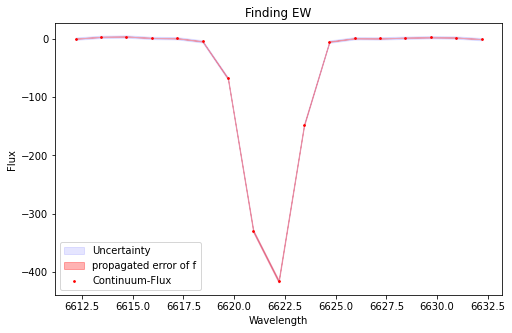

EW= -28.116793627412154  at (i,j)= 12 , 13
sigma f is  [1.81182678e-08 1.76384101e-06 8.95178747e-05 2.36989145e-03
 3.27477817e-02 2.36334124e-01 8.91229985e-01 1.75691761e+00
 1.81102759e+00 9.76218578e-01 2.75151694e-01 4.05395234e-02
 3.12090610e-03 1.25471918e-04 2.63279948e-06 2.88156212e-08
 1.64406032e-10]
 


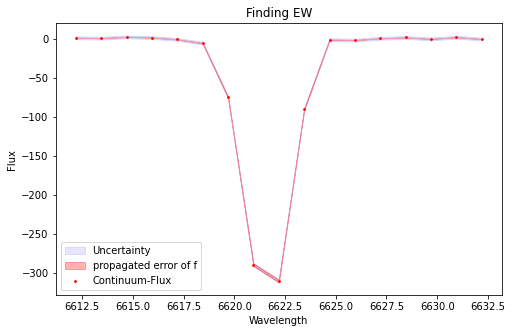

EW= -23.140595658706083  at (i,j)= 12 , 14
sigma f is  [2.51977279e-10 3.51888371e-08 2.63475897e-06 1.05838296e-04
 2.28248219e-03 2.64448514e-02 1.64718261e-01 5.51918447e-01
 9.95289721e-01 9.66263618e-01 5.05067620e-01 1.42118109e-01
 2.15200240e-02 1.75268304e-03 7.67281722e-05 1.80424297e-06
 2.27728996e-08]
 


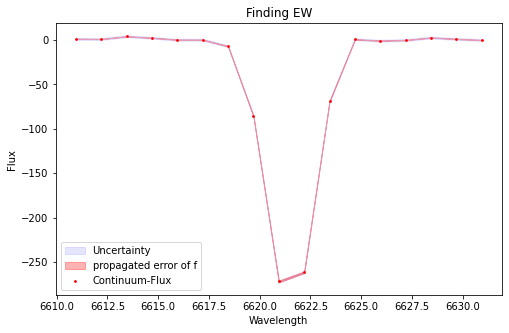

EW= -18.663656508038855  at (i,j)= 12 , 15
sigma f is  [           nan            nan 3.63163852e-06 3.46195604e-04
 8.59969711e-03 9.16617029e-02 4.46709345e-01 1.01514511e+00
 1.08218006e+00 5.40113003e-01 1.24746110e-01 1.28778042e-02
 5.14064282e-04            nan            nan            nan
            nan]
 


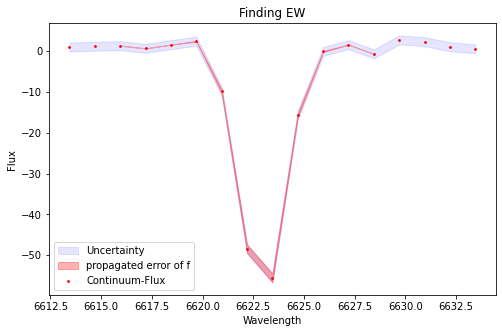

EW= -5.072644167067981  at (i,j)= 13 , 0
sigma f is  [           nan 9.98808938e-08 1.20901043e-05 5.32339290e-04
 1.05061281e-02 9.71172660e-02 4.27305520e-01 9.00979835e-01
 9.12433704e-01 4.43339624e-01 1.02844316e-01 1.12555059e-02
 5.63947766e-04 1.16108136e-05            nan            nan
            nan]
 


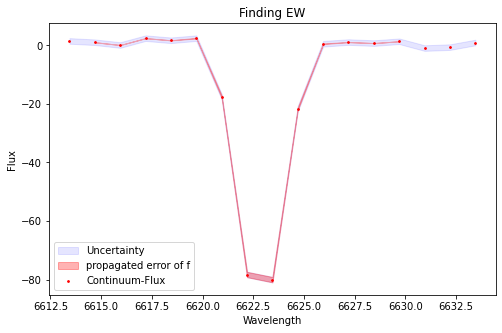

EW= -7.238677620292629  at (i,j)= 13 , 1
sigma f is  [           nan 1.28426963e-09 3.07583811e-07 2.42745707e-05
 8.61650761e-04 1.45153068e-02 1.18276363e-01 4.70126109e-01
 9.15069347e-01 8.73271207e-01 4.08235252e-01 9.31675986e-02
 1.03024832e-02 5.42871033e-04 1.30338079e-05 1.15149908e-07
            nan]
 


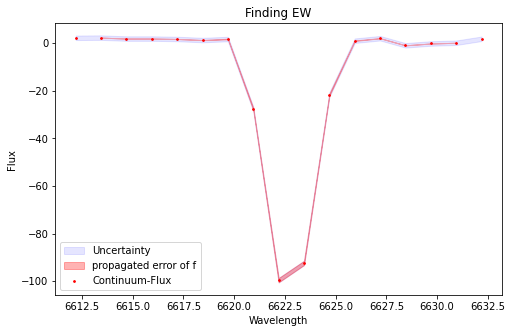

EW= -8.113541102655082  at (i,j)= 13 , 2
sigma f is  [4.90015323e-11 1.15747628e-08 1.36561858e-06 8.05625461e-05
 2.37961462e-03 3.52477789e-02 2.62270414e-01 9.81942560e-01
 1.85248720e+00 1.76258747e+00 8.45998316e-01 2.04734679e-01
 2.49530925e-02 1.52931690e-03 4.70508776e-05 7.25455348e-07
 5.59732139e-09]
 


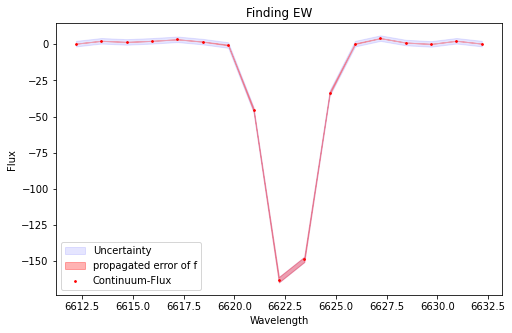

EW= -12.815187129565315  at (i,j)= 13 , 3
sigma f is  [9.31518726e-11 1.82778995e-08 1.84124078e-06 9.53638754e-05
 2.54206605e-03 3.49000552e-02 2.46895276e-01 9.00295803e-01
 1.69247735e+00 1.64041399e+00 8.19701290e-01 2.11133351e-01
 2.80237931e-02 1.91586628e-03 6.74184829e-05 1.21996605e-06
 1.13360738e-08]
 


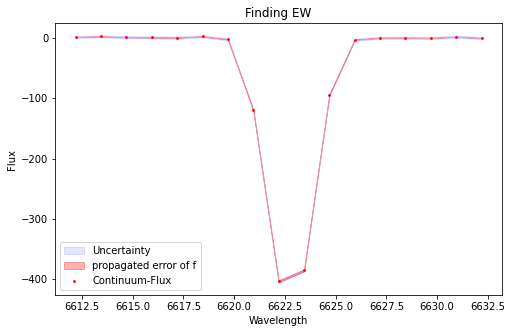

EW= -31.41637960687017  at (i,j)= 13 , 4
sigma f is  [3.08100237e-10 4.40586403e-08 3.36950588e-06 1.37889070e-04
 3.02060830e-03 3.54312840e-02 2.22586237e-01 7.49014135e-01
 1.35019854e+00 1.30386692e+00 6.74506595e-01 1.86905586e-01
 2.77384256e-02 2.20432538e-03 9.37733444e-05 2.13463473e-06
 2.59884242e-08]
 


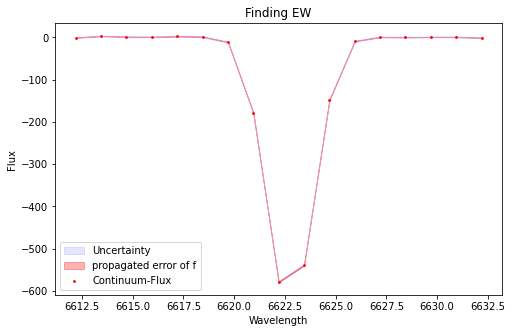

EW= -44.101455730254926  at (i,j)= 13 , 5
sigma f is  [5.91123049e-10 8.25349769e-08 6.14143805e-06 2.43764328e-04
 5.16441991e-03 5.84287664e-02 3.53124036e-01 1.14029318e+00
 1.96764635e+00 1.81440724e+00 8.94046673e-01 2.35378546e-01
 3.31022182e-02 2.48590085e-03 9.96408645e-05 2.13022391e-06
 2.42681797e-08]
 


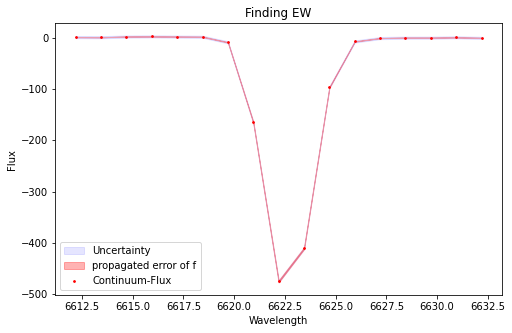

EW= -37.12705404079314  at (i,j)= 13 , 6
sigma f is  [6.05565676e-10 8.37343141e-08 6.12173263e-06 2.37182125e-04
 4.87740446e-03 5.32891476e-02 3.09547523e-01 9.56403391e-01
 1.57210134e+00 1.37489989e+00 6.39684688e-01 1.58285481e-01
 2.08200091e-02 1.45462729e-03 5.39205938e-05 1.05862673e-06
 1.09791451e-08]
 


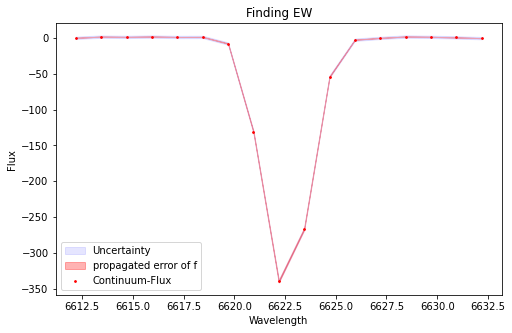

EW= -26.606738951775256  at (i,j)= 13 , 7
sigma f is  [6.25480443e-10 8.71489907e-08 6.35808858e-06 2.43572496e-04
 4.90854081e-03 5.20973531e-02 2.91444618e-01 8.59771342e-01
 1.33784155e+00 1.09809879e+00 4.75365620e-01 1.08493801e-01
 1.30466998e-02 8.25831828e-04 2.74748568e-05 4.79343578e-07
 4.36975612e-09]
 


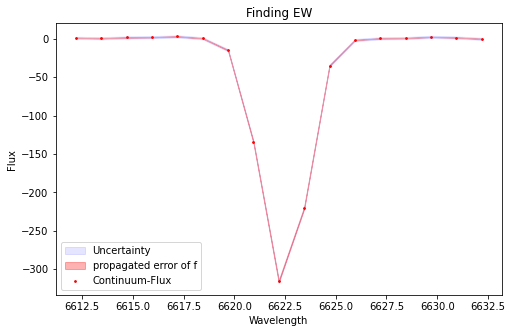

EW= -23.272298490949627  at (i,j)= 13 , 8
sigma f is  [6.03682947e-10 8.18828227e-08 5.79295725e-06 2.14321619e-04
 4.15358804e-03 4.22140281e-02 2.25155404e-01 6.30513071e-01
 9.27232146e-01 7.16104196e-01 2.90391168e-01 6.18077279e-02
 6.90037518e-03 4.03680636e-04 1.23560416e-05 1.97417498e-07
 1.64037198e-09]
 


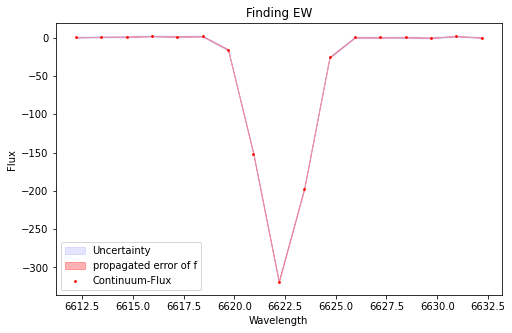

EW= -22.311650796466242  at (i,j)= 13 , 9
sigma f is  [1.29578639e-09 1.42414946e-07 8.32026297e-06 2.58718527e-04
 4.28555230e-03 3.78387921e-02 1.78153805e-01 4.47392697e-01
 5.99335720e-01 4.28290232e-01 1.63244974e-01 3.31791118e-02
 3.59446791e-03 2.07435984e-04 6.37131914e-06 1.04019486e-07
 9.00989096e-10]
 


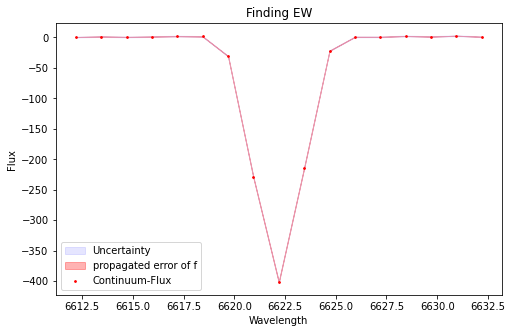

EW= -27.801165635420173  at (i,j)= 13 , 10
sigma f is  [4.85323454e-09 5.30086320e-07 3.03528032e-05 9.12377055e-04
 1.44103684e-02 1.19667471e-01 5.22708829e-01 1.20125712e+00
 1.45262217e+00 9.24274819e-01 3.09396049e-01 5.44706755e-02
 5.04122965e-03 2.45090120e-04 6.25286526e-06 8.35861529e-08
 5.84111786e-10]
 


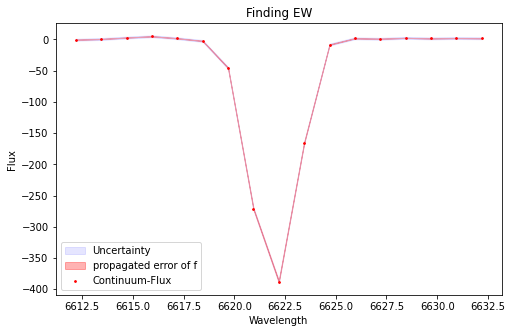

EW= -24.647218506332827  at (i,j)= 13 , 11
sigma f is  [1.34166558e-08 1.30472511e-06 6.70914958e-05 1.82526862e-03
 2.62826865e-02 2.00364157e-01 8.08838760e-01 1.72920587e+00
 1.95792411e+00 1.17409392e+00 3.72848574e-01 6.26929420e-02
 5.58032524e-03 2.62851137e-04 6.54891015e-06 8.62506145e-08
 5.99944204e-10]
 


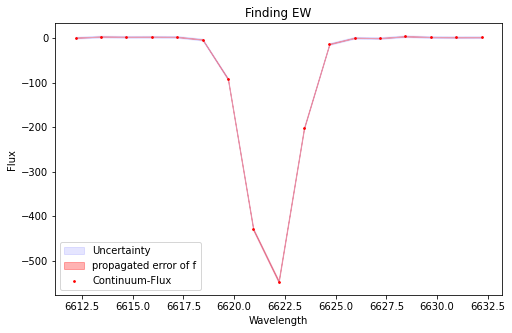

EW= -30.68224085332267  at (i,j)= 13 , 12
sigma f is  [2.82834140e-08 2.48059069e-06 1.16314298e-04 2.91702881e-03
 3.91426783e-02 2.81140920e-01 1.08118999e+00 2.22686946e+00
 2.45682374e+00 1.45200150e+00 4.59678976e-01 7.79421493e-02
 7.07646020e-03 3.43913776e-04 8.94363936e-06 1.24405293e-07
 9.25226890e-10]
 


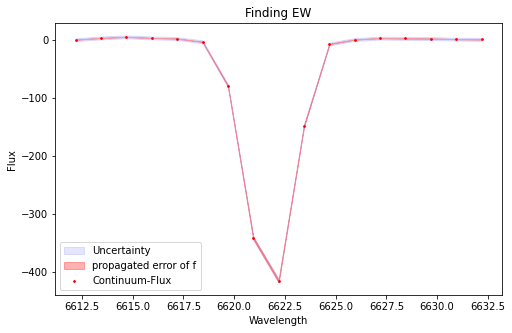

EW= -24.860187666602165  at (i,j)= 13 , 13
sigma f is  [1.01411074e-08 1.13399779e-06 6.48534271e-05 1.89861806e-03
 2.84805911e-02 2.19127374e-01 8.65526558e-01 1.75641730e+00
 1.83211247e+00 9.82479310e-01 2.70805298e-01 3.83466354e-02
 2.78738814e-03 1.03911391e-04 1.98469638e-06 1.94030343e-08
 9.70071900e-11]
 


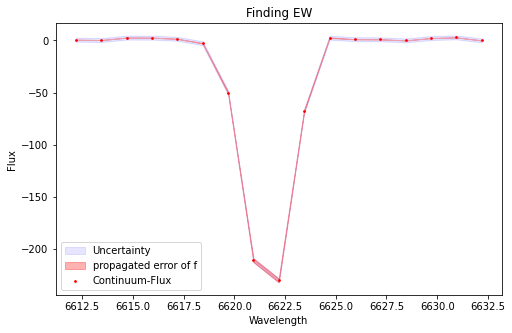

EW= -15.65699997159846  at (i,j)= 13 , 14
sigma f is  [2.19826400e-08 1.91087314e-06 8.74094203e-05 2.10671392e-03
 2.67922333e-02 1.80075981e-01 6.40651402e-01 1.20804395e+00
 1.20842884e+00 6.41437450e-01 1.80597412e-01 2.69443243e-02
 2.12725559e-03 8.87328953e-05 1.95245285e-06 2.26301287e-08
 1.37999065e-10]
 


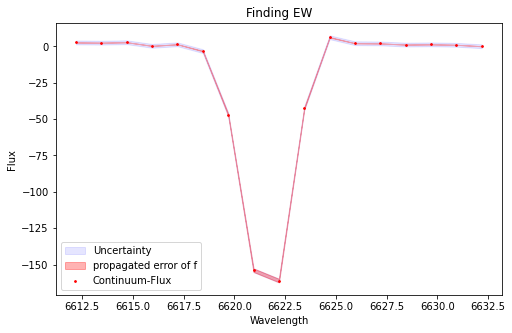

EW= -11.161697637862252  at (i,j)= 13 , 15
sigma f is  [           nan            nan            nan 1.63399468e-04
 4.58478921e-03 5.04288911e-02 2.44210473e-01 5.36107279e-01
 5.37811660e-01 2.45699814e-01 5.01702339e-02 4.29178828e-03
 8.91337693e-05            nan            nan            nan
            nan]
 


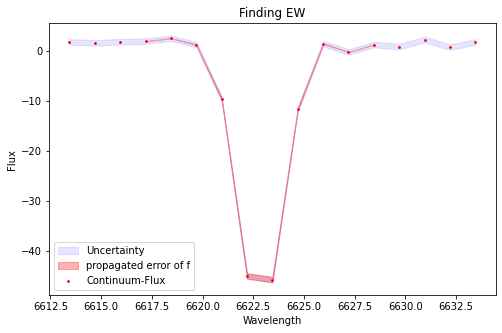

EW= -4.905524700923543  at (i,j)= 14 , 0
sigma f is  [1.03050348e-11 2.97878425e-09 4.17189850e-07 2.83372612e-05
 9.35292301e-04 1.50510449e-02 1.18720348e-01 4.62394353e-01
 8.96678687e-01 8.71531366e-01 4.25381965e-01 1.03860299e-01
 1.25889761e-02 7.51354354e-04 2.19338557e-05 3.11752342e-07
 2.15136523e-09]
 


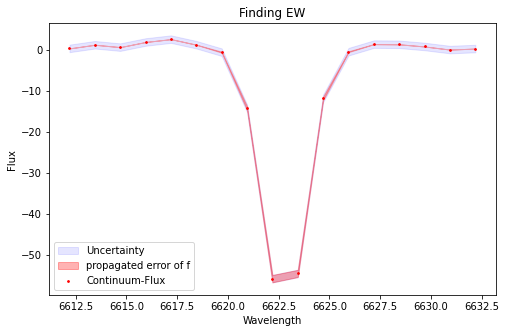

EW= -5.691533405103396  at (i,j)= 14 , 1
sigma f is  [4.21953638e-11 9.22919704e-09 1.01305101e-06 5.58770559e-05
 1.55169736e-03 2.17524503e-02 1.54456800e-01 5.57655792e-01
 1.02745636e+00 9.68497704e-01 4.67358435e-01 1.15286461e-01
 1.44924288e-02 9.24876001e-04 2.98535653e-05 4.85880270e-07
 3.97794895e-09]
 


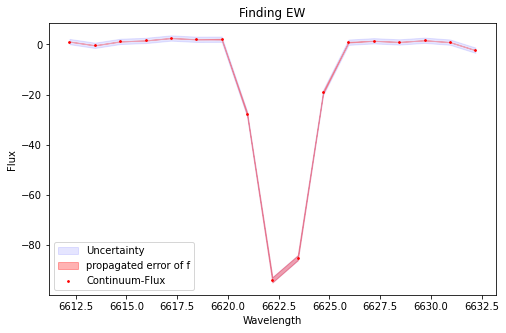

EW= -8.36855798521407  at (i,j)= 14 , 2
sigma f is  [4.53263210e-11 1.03501199e-08 1.12349577e-06 6.05202644e-05
 1.64489705e-03 2.27386014e-02 1.60564697e-01 5.80551413e-01
 1.07615235e+00 1.02311125e+00 4.98698738e-01 1.24483416e-01
 1.58761054e-02 1.03024311e-03 3.37583763e-05 5.49886657e-07
 4.27949767e-09]
 


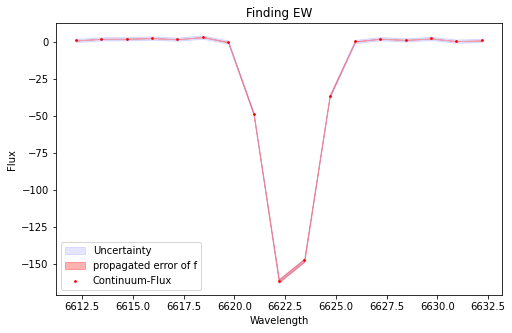

EW= -13.4182528822171  at (i,j)= 14 , 3
sigma f is  [1.37675105e-10 2.39194820e-08 2.14895877e-06 1.00190826e-04
 2.42951517e-03 3.06853964e-02 2.02057448e-01 6.94076747e-01
 1.24414908e+00 1.16389842e+00 5.68184103e-01 1.44694015e-01
 1.92105458e-02 1.32844664e-03 4.77784868e-05 8.91726919e-07
 8.60579813e-09]
 


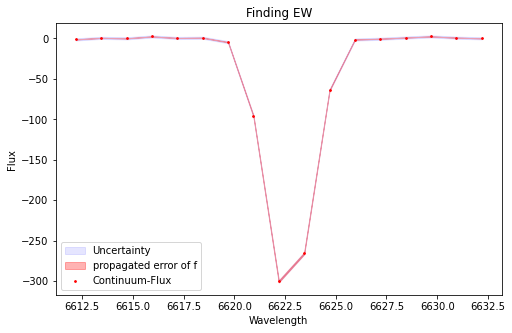

EW= -23.686574599791197  at (i,j)= 14 , 4
sigma f is  [1.64484571e-10 2.78554621e-08 2.46205051e-06 1.13675364e-04
 2.74342034e-03 3.46235355e-02 2.28581766e-01 7.89576981e-01
 1.42719263e+00 1.34996739e+00 6.68190036e-01 1.73045827e-01
 2.34431560e-02 1.66084081e-03 6.15038156e-05 1.18977975e-06
 1.20127710e-08]
 


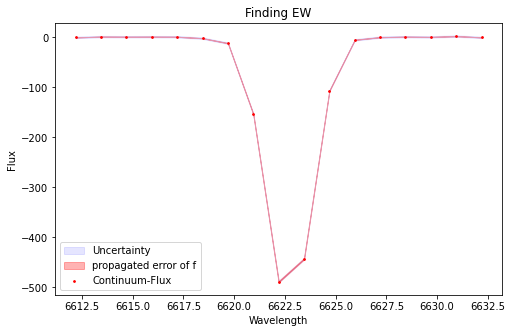

EW= -36.43770002696005  at (i,j)= 14 , 5
sigma f is  [1.35546487e-10 2.27577178e-08 1.98414369e-06 8.98594291e-05
 2.11466699e-03 2.58668376e-02 1.64509022e-01 5.44105334e-01
 9.36048565e-01 8.37682538e-01 3.89973386e-01 9.44361355e-02
 1.18940283e-02 7.78964601e-04 2.65210985e-05 4.69267763e-07
 4.31385998e-09]
 


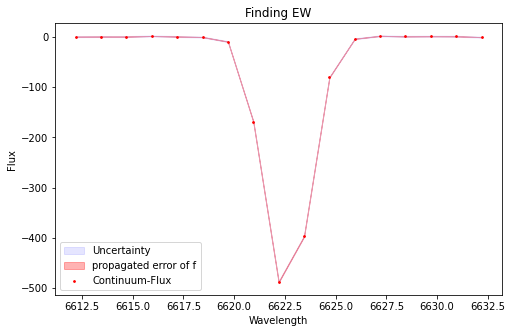

EW= -35.24185929360212  at (i,j)= 14 , 6
sigma f is  [4.06081347e-10 6.22753053e-08 4.97550135e-06 2.07415196e-04
 4.51628786e-03 5.14012319e-02 3.05934938e-01 9.52542208e-01
 1.55171528e+00 1.32260349e+00 5.89793495e-01 1.37571371e-01
 1.67784544e-02 1.06936385e-03 3.55868420e-05 6.17621775e-07
 5.58029281e-09]
 


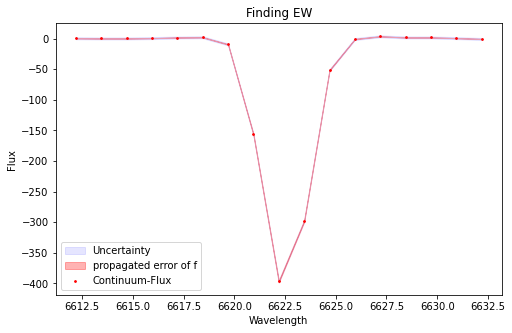

EW= -26.955187846514427  at (i,j)= 14 , 7
sigma f is  [7.48678640e-10 1.00034955e-07 7.03522112e-06 2.60515504e-04
 5.08135812e-03 5.22239989e-02 2.82906627e-01 8.08004456e-01
 1.21692972e+00 9.66594155e-01 4.04906148e-01 8.94456405e-02
 1.04179666e-02 6.39612671e-04 2.06931861e-05 3.52665347e-07
 3.16492649e-09]
 


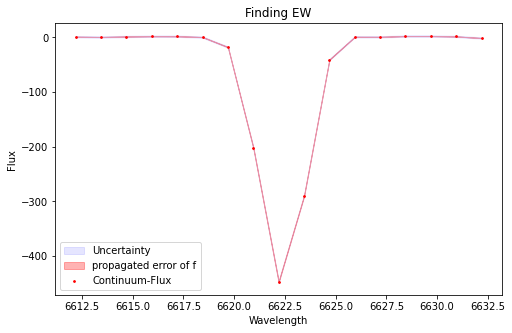

EW= -29.01851391368222  at (i,j)= 14 , 8
sigma f is  [1.20071017e-09 1.68901636e-07 1.23313218e-05 4.67661029e-04
 9.21848721e-03 9.44888077e-02 5.03756514e-01 1.39720815e+00
 2.01623859e+00 1.51379196e+00 5.91289380e-01 1.20135177e-01
 1.26928077e-02 6.97088795e-04 1.98890791e-05 2.94572389e-07
 2.26221030e-09]
 


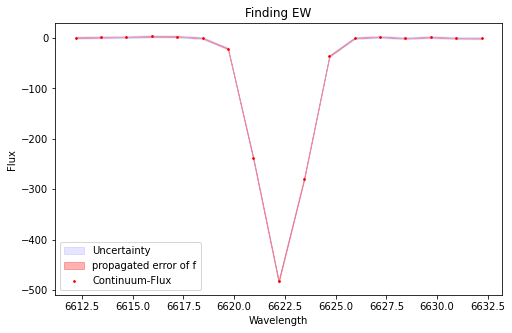

EW= -31.954246332660702  at (i,j)= 14 , 9
sigma f is  [1.44370472e-09 1.99758190e-07 1.41667810e-05 5.15802528e-04
 9.65201487e-03 9.28962589e-02 4.60085164e-01 1.17291877e+00
 1.53938497e+00 1.04009293e+00 3.61721517e-01 6.47312801e-02
 5.95751943e-03 2.81765713e-04 6.84040412e-06 8.50949699e-08
 5.41029180e-10]
 


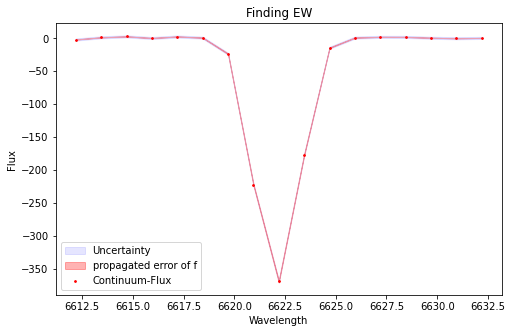

EW= -25.259960098878143  at (i,j)= 14 , 10
sigma f is  [2.99793435e-09 3.61302362e-07 2.24132452e-05 7.18844816e-04
 1.19513720e-02 1.03175486e-01 4.62980267e-01 1.08052861e+00
 1.31192791e+00 8.28636137e-01 2.72172058e-01 4.64554227e-02
 4.11547412e-03 1.88869064e-04 4.47630924e-06 5.45058774e-08
 3.37750643e-10]
 


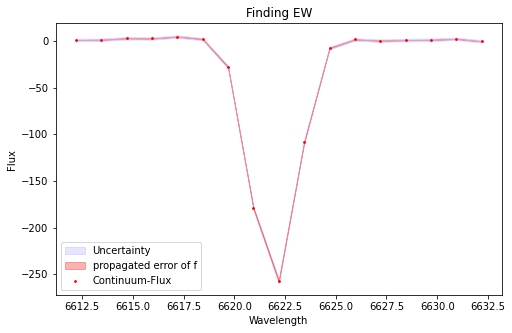

EW= -16.35112564615427  at (i,j)= 14 , 11
sigma f is  [2.16858025e-09 2.90983912e-07 1.94654498e-05 6.54109600e-04
 1.10882660e-02 9.50587936e-02 4.12750438e-01 9.08472887e-01
 1.01393739e+00 5.73772726e-01 1.64533517e-01 2.38817639e-02
 1.75122127e-03 6.46675007e-05 1.19591236e-06 1.09615454e-08
 4.86782561e-11]
 


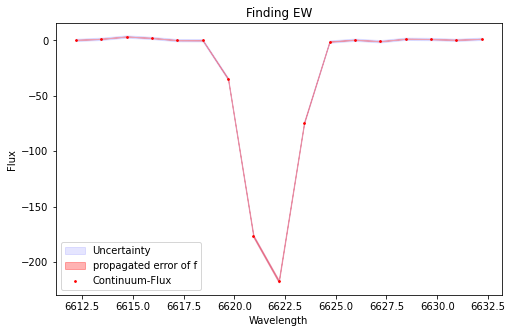

EW= -13.071454361353664  at (i,j)= 14 , 12
sigma f is  [1.06285739e-09 1.70402695e-07 1.32507814e-05 5.03304308e-04
 9.37501656e-03 8.58414954e-02 3.86924252e-01 8.59218568e-01
 9.40304153e-01 5.07078104e-01 1.34674982e-01 1.75968143e-02
 1.12905453e-03 3.54650532e-05 5.42519867e-07 4.00256739e-09
 1.39480198e-11]
 


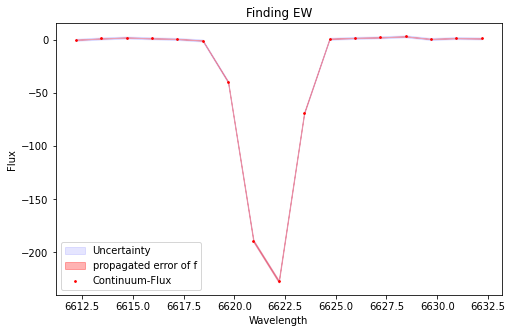

EW= -14.485039776682118  at (i,j)= 14 , 13
sigma f is  [4.17798971e-09 4.89775157e-07 2.91937289e-05 8.85865827e-04
 1.37036346e-02 1.08229343e-01 4.37055669e-01 9.03567874e-01
 9.57171269e-01 5.19698711e-01 1.44579260e-01 2.05906494e-02
 1.49929711e-03 5.57334240e-05 1.05609567e-06 1.01870802e-08
 4.99617089e-11]
 


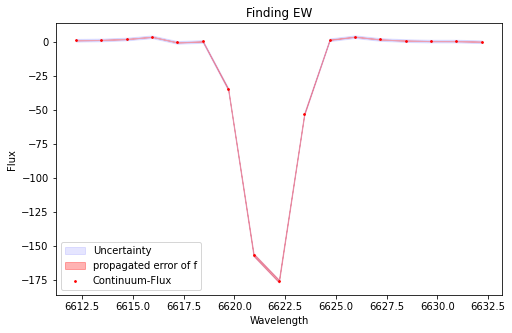

EW= -13.548772412889836  at (i,j)= 14 , 14
sigma f is  [9.52619535e-10 2.46712342e-07 2.15819756e-05 8.44271405e-04
 1.55462915e-02 1.37256805e-01 5.85864683e-01 1.21364150e+00
 1.22176246e+00 5.97303884e-01 1.41398241e-01 1.61027571e-02
 8.69851990e-04 2.15083640e-05 2.11487769e-07            nan
            nan]
 


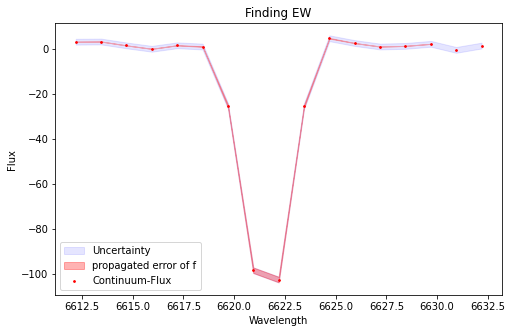

EW= -8.359270412489309  at (i,j)= 14 , 15
sigma f is  [           nan            nan 3.24802176e-06 2.64078366e-04
 7.20477045e-03 8.31256459e-02 4.24509998e-01 9.74537258e-01
 1.01060178e+00 4.72615179e-01 9.87312374e-02 8.97000191e-03
 3.22339806e-04            nan            nan            nan
            nan]
 


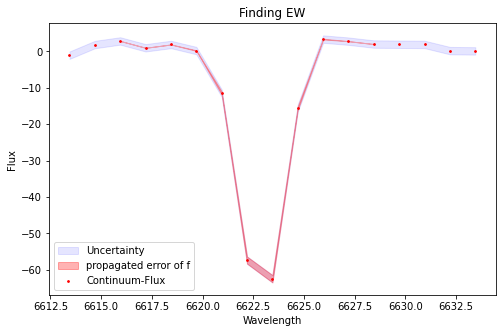

EW= -7.185731596744526  at (i,j)= 15 , 0
sigma f is  [2.73038442e-09 3.39100112e-07 2.09596317e-05 6.45930167e-04
 9.94967461e-03 7.68414288e-02 2.98567170e-01 5.85546104e-01
 5.80965192e-01 2.91810109e-01 7.41144273e-02 9.49313620e-03
 6.11159001e-04 1.97089831e-05 3.17443342e-07 2.54779859e-09
 1.01727677e-11]
 


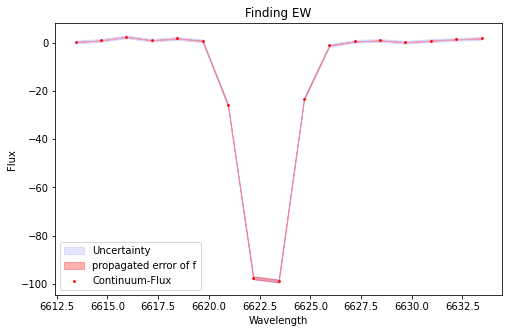

EW= -11.502561519315938  at (i,j)= 15 , 1
sigma f is  [1.18167366e-11 3.41193066e-09 4.80823841e-07 3.31085598e-05
 1.11550635e-03 1.84205814e-02 1.49358124e-01 5.95714170e-01
 1.17058690e+00 1.13439136e+00 5.42283293e-01 1.27806672e-01
 1.48322187e-02 8.46160859e-04 2.36859645e-05 3.24747684e-07
 2.17738596e-09]
 


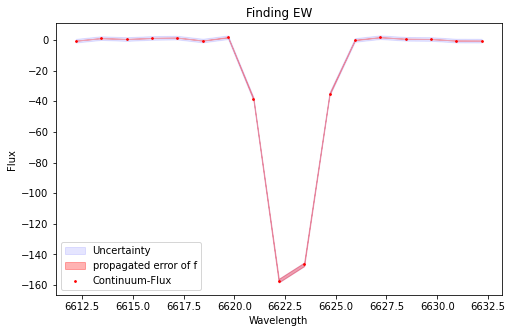

EW= -16.771824920703526  at (i,j)= 15 , 2
sigma f is  [3.22443037e-09 4.42328842e-07 2.97401834e-05 9.87476091e-04
 1.62600783e-02 1.33110512e-01 5.42547114e-01 1.10191617e+00
 1.11551364e+00 5.62792227e-01 1.41413139e-01 1.76749330e-02
 1.09654826e-03 3.36470818e-05 5.07453879e-07 3.71648118e-09
 1.28564279e-11]
 


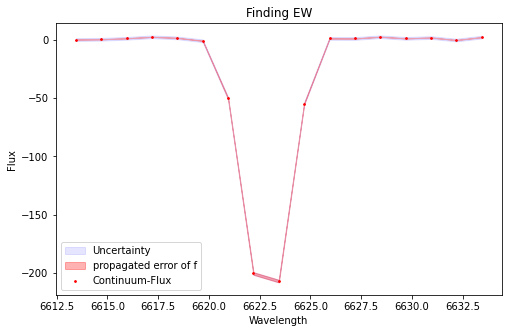

EW= -20.787374273052627  at (i,j)= 15 , 3
sigma f is  [6.76189664e-11 1.29449686e-08 1.27630201e-06 6.48605540e-05
 1.70053952e-03 2.30254935e-02 1.61172081e-01 5.83765147e-01
 1.09492369e+00 1.06398325e+00 5.35731191e-01 1.39738421e-01
 1.88708859e-02 1.31830959e-03 4.75956665e-05 8.87151348e-07
 8.52862048e-09]
 


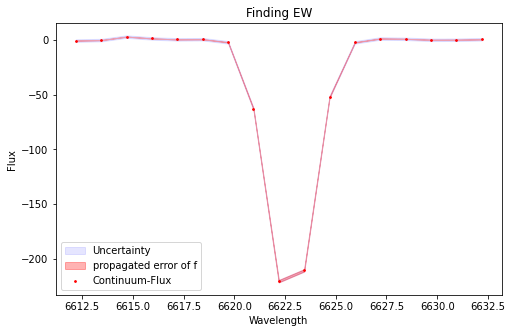

EW= -21.528969436045315  at (i,j)= 15 , 4
sigma f is  [2.59802061e-10 4.01783727e-08 3.26964188e-06 1.40108340e-04
 3.16380736e-03 3.76771747e-02 2.36810514e-01 7.86094804e-01
 1.37889932e+00 1.27854330e+00 6.26696014e-01 1.62359578e-01
 2.22226982e-02 1.60602082e-03 6.12387260e-05 1.23107166e-06
 1.30372539e-08]
 


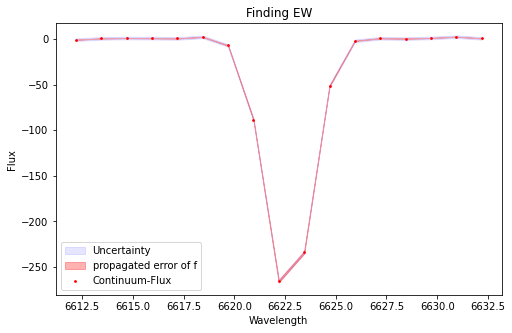

EW= -23.63020933623986  at (i,j)= 15 , 5
sigma f is  [5.22457023e-10 7.54489799e-08 5.76097725e-06 2.32746981e-04
 4.97911279e-03 5.64481031e-02 3.39404561e-01 1.08308333e+00
 1.83535308e+00 1.65209088e+00 7.90014804e-01 2.00649191e-01
 2.70550849e-02 1.93551185e-03 7.34094316e-05 1.47491983e-06
 1.56855833e-08]
 


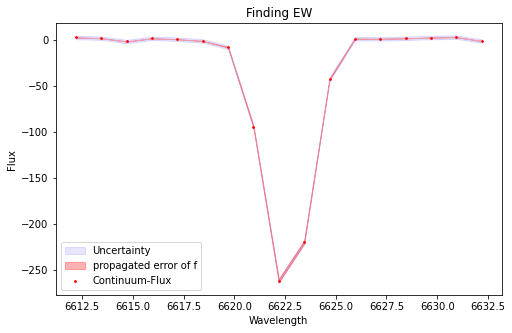

EW= -21.5519269500566  at (i,j)= 15 , 6
sigma f is  [8.89297944e-10 1.10492933e-07 7.33674162e-06 2.60527411e-04
 4.95121418e-03 5.03983061e-02 2.74974858e-01 8.04695127e-01
 1.26372414e+00 1.06533052e+00 4.82111977e-01 1.17098755e-01
 1.52583364e-02 1.06597052e-03 3.98978926e-05 7.99437829e-07
 8.56873265e-09]
 


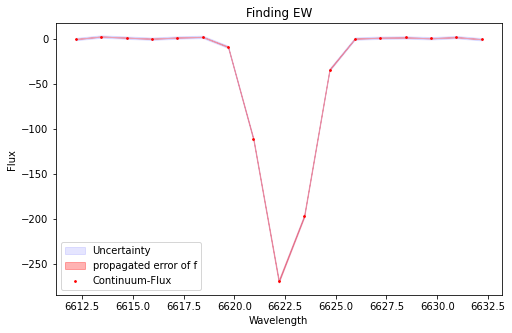

EW= -19.039490096853307  at (i,j)= 15 , 7
sigma f is  [1.76146187e-09 1.95076999e-07 1.16426454e-05 3.74666455e-04
 6.50475424e-03 6.09612839e-02 3.08561885e-01 8.43897745e-01
 1.24750117e+00 9.96955921e-01 4.30727891e-01 1.00590585e-01
 1.26942752e-02 8.65306688e-04 3.18435784e-05 6.32297349e-07
 6.77052361e-09]
 


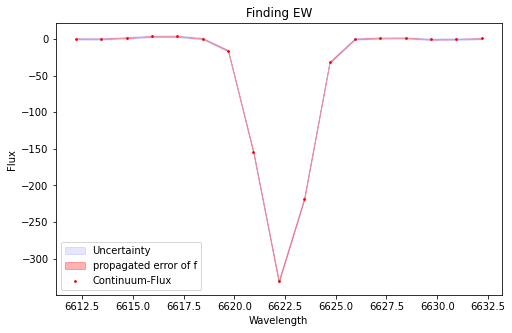

EW= -23.159938580947493  at (i,j)= 15 , 8
sigma f is  [1.10993043e-09 1.39301882e-07 9.16372425e-06 3.16817946e-04
 5.76663993e-03 5.53229946e-02 2.79949392e-01 7.47548540e-01
 1.05360935e+00 7.83800140e-01 3.07704018e-01 6.37207714e-02
 6.95575960e-03 3.99809664e-04 1.20806839e-05 1.91404368e-07
 1.58359487e-09]
 


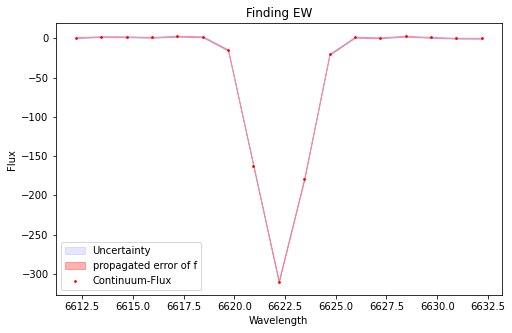

EW= -23.72241853331034  at (i,j)= 15 , 9
sigma f is  [1.17776053e-09 1.58257572e-07 1.09564828e-05 3.91216537e-04
 7.21292973e-03 6.87557979e-02 3.39287991e-01 8.67745327e-01
 1.15122745e+00 7.92634827e-01 2.83210988e-01 5.24856578e-02
 5.04033761e-03 2.50524538e-04 6.43651981e-06 8.53714419e-08
 5.83896564e-10]
 


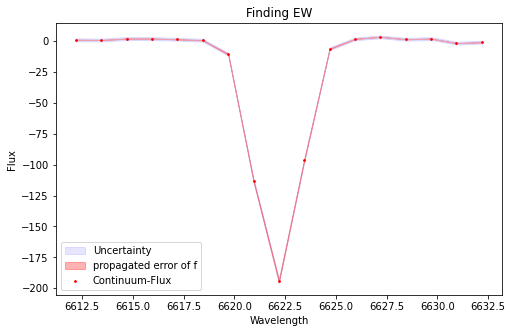

EW= -15.199861923174378  at (i,j)= 15 , 10
sigma f is  [5.19941385e-09 5.40483755e-07 2.96434132e-05 8.58940345e-04
 1.31703225e-02 1.07066189e-01 4.62388035e-01 1.06286871e+00
 1.30226629e+00 8.51089878e-01 2.96636677e-01 5.50801874e-02
 5.43954655e-03 2.85146470e-04 7.91856239e-06 1.16282889e-07
 9.01618024e-10]
 


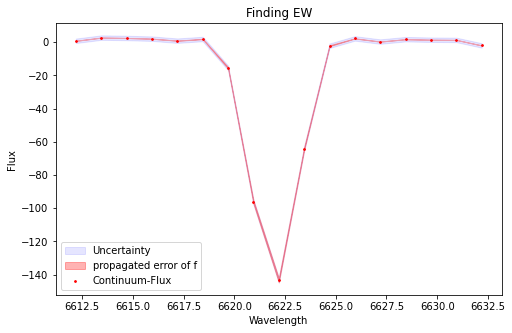

EW= -10.754302396696346  at (i,j)= 15 , 11
sigma f is  [6.46016648e-09 6.86460931e-07 3.71057778e-05 1.04292130e-03
 1.53953598e-02 1.19986082e-01 4.95146220e-01 1.08360009e+00
 1.25836537e+00 7.75317629e-01 2.53202839e-01 4.37416829e-02
 3.98256460e-03 1.89821468e-04 4.67305028e-06 5.75297873e-08
 3.14906077e-10]
 


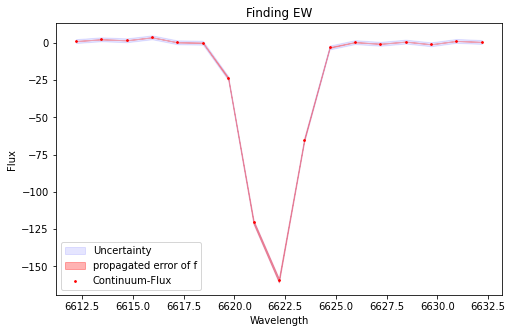

EW= -12.091613415005044  at (i,j)= 15 , 12
sigma f is  [2.02550130e-09 2.97151791e-07 2.16097394e-05 7.83202719e-04
 1.41912863e-02 1.28805093e-01 5.86304907e-01 1.33932515e+00
 1.53582398e+00 8.84012279e-01 2.55298175e-01 3.69600249e-02
 2.67841012e-03 9.69290298e-05 1.74488078e-06 1.55181451e-08
 6.72774945e-11]
 


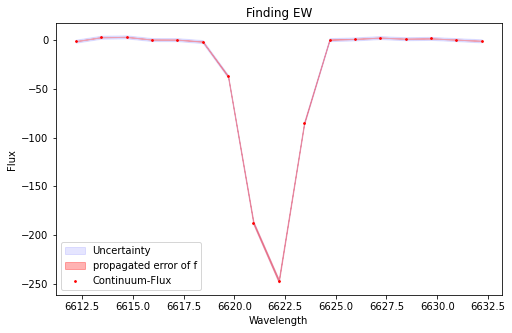

EW= -19.578218978932597  at (i,j)= 15 , 13
sigma f is  [5.51454806e-09 6.27648574e-07 3.65620161e-05 1.09108732e-03
 1.66975635e-02 1.31181330e-01 5.29603472e-01 1.09963857e+00
 1.17492175e+00 6.46117223e-01 1.82840263e-01 2.66102883e-02
 1.99013741e-03 7.64077223e-05 1.50435728e-06 1.51731632e-08
 7.83257112e-11]
 


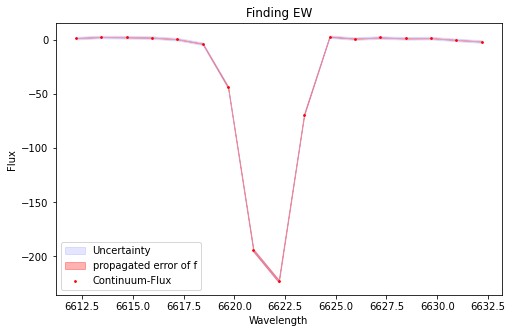

EW= -19.82686893310054  at (i,j)= 15 , 14
sigma f is  [1.34918313e-09 2.88295672e-07 2.44585076e-05 9.48520183e-04
 1.74264438e-02 1.53848220e-01 6.57068431e-01 1.36193446e+00
 1.37155495e+00 6.70712868e-01 1.58877863e-01 1.81332913e-02
 9.86216481e-04 2.49073006e-05 2.68730113e-07 1.89331201e-10
            nan]
 


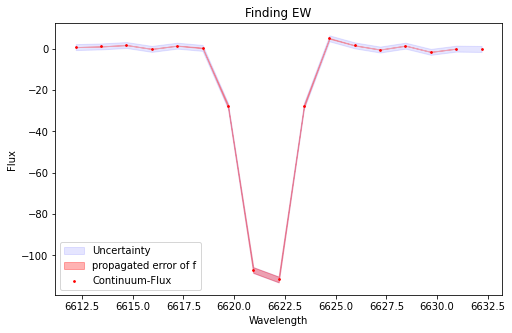

EW= -10.972133221821485  at (i,j)= 15 , 15
sigma f is  [2.49255594e-09 4.23313037e-07 2.94337421e-05 9.75037396e-04
 1.59726068e-02 1.31306076e-01 5.45438894e-01 1.14868294e+00
 1.22791106e+00 6.65946714e-01 1.82813972e-01 2.52731064e-02
 1.74102114e-03 5.83269010e-05 8.80554244e-07 2.45549897e-09
            nan]
 


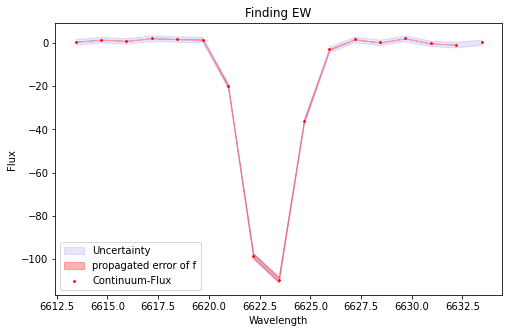

EW= -14.385435281608169  at (i,j)= 16 , 0
sigma f is  [8.46109839e-09 9.74780172e-07 5.65530488e-05 1.66592873e-03
 2.50309773e-02 1.92341998e-01 7.57054436e-01 1.52759678e+00
 1.58072883e+00 8.38694719e-01 2.28012592e-01 3.17215931e-02
 2.25330528e-03 8.14159509e-05 1.48631827e-06 1.35307889e-08
 5.95485335e-11]
 


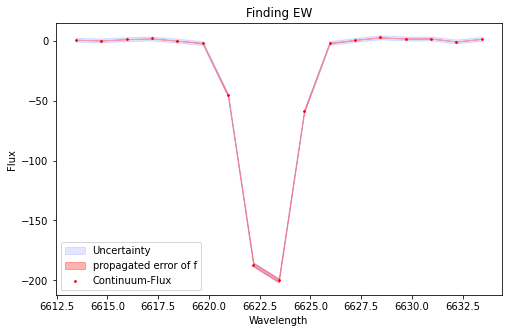

EW= -24.830132781259845  at (i,j)= 16 , 1
sigma f is  [3.12503150e-11 7.43894457e-09 8.86349430e-07 5.30754189e-05
 1.60126447e-03 2.43788325e-02 1.87498540e-01 7.28963602e-01
 1.43317607e+00 1.42507708e+00 7.16614593e-01 1.82181494e-01
 2.34012243e-02 1.51732337e-03 4.95896293e-05 8.15078942e-07
 6.71339690e-09]
 


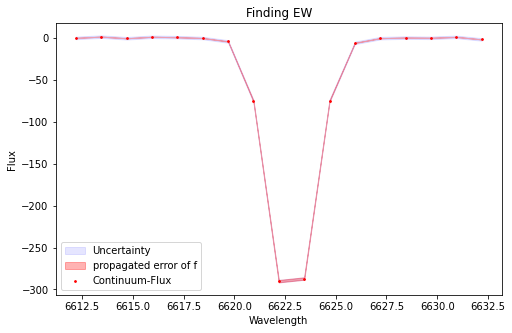

EW= -35.8457370396071  at (i,j)= 16 , 2
sigma f is  [1.79430692e-11 4.03047995e-09 4.45746140e-07 2.47610388e-05
 6.97379467e-04 1.00086831e-02 7.34098038e-02 2.75635951e-01
 5.30293250e-01 5.22915822e-01 2.64235025e-01 6.83677971e-02
 9.04389509e-03 6.10045929e-04 2.08886159e-05 3.60090570e-07
 3.07234798e-09]
 


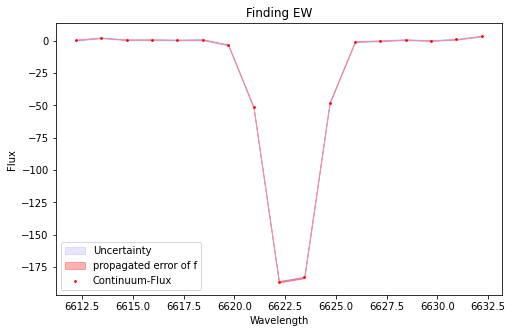

EW= -23.33565926922097  at (i,j)= 16 , 3
sigma f is  [1.08625994e-10 1.90043511e-08 1.72191382e-06 8.08898247e-05
 1.97291738e-03 2.50252048e-02 1.65384078e-01 5.70486157e-01
 1.02873563e+00 9.70746355e-01 4.79470021e-01 1.23888589e-01
 1.67254454e-02 1.17779809e-03 4.31826341e-05 8.22846968e-07
 8.13614905e-09]
 


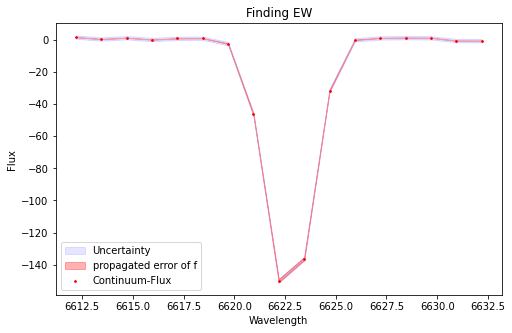

EW= -17.69978854005748  at (i,j)= 16 , 4
sigma f is  [1.04209585e-09 1.25175270e-07 7.92535967e-06 2.68695016e-04
 4.91599561e-03 4.87456408e-02 2.62613198e-01 7.69802807e-01
 1.22868689e+00 1.06800989e+00 5.05389831e-01 1.30070935e-01
 1.81749214e-02 1.37466060e-03 5.59854824e-05 1.21578876e-06
 1.37833835e-08]
 


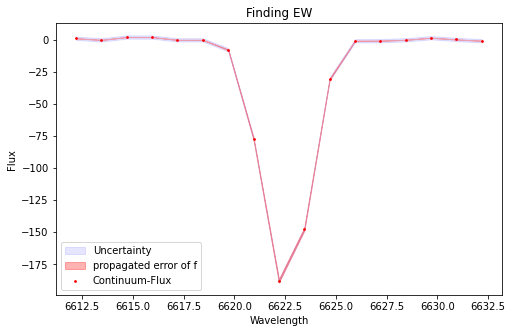

EW= -19.906480839048562  at (i,j)= 16 , 5
sigma f is  [7.14705177e-10 9.24435608e-08 6.25123886e-06 2.24175007e-04
 4.29387777e-03 4.41054139e-02 2.43519842e-01 7.23717038e-01
 1.15849740e+00 9.99037691e-01 4.63959415e-01 1.15929322e-01
 1.55594844e-02 1.11853432e-03 4.28573069e-05 8.67337937e-07
 9.09567318e-09]
 


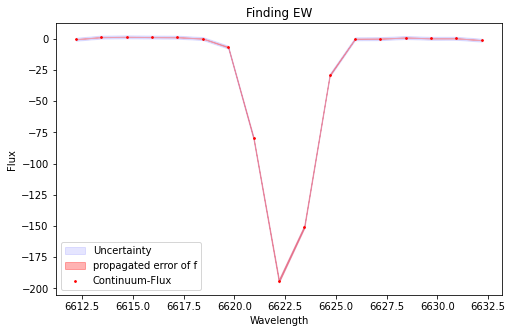

EW= -18.43145013107094  at (i,j)= 16 , 6
sigma f is  [7.99363303e-10 1.35145335e-07 1.04032492e-05 4.02338396e-04
 8.04660999e-03 8.42467397e-02 4.64574545e-01 1.35361583e+00
 2.08696147e+00 1.70303704e+00 7.34918661e-01 1.67325185e-01
 2.00091577e-02 1.24574368e-03 3.96217047e-05 6.10997144e-07
 3.41748220e-09]
 


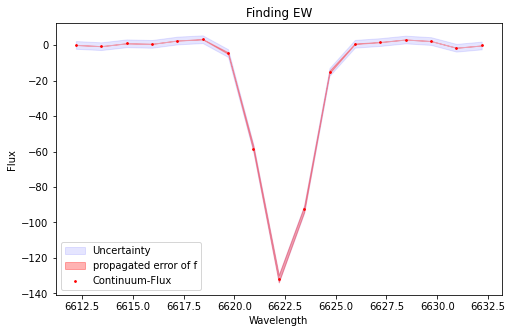

EW= -11.113898767647814  at (i,j)= 16 , 7
sigma f is  [3.32201743e-10 6.41998036e-08 5.80292268e-06 2.58389804e-04
 5.77599191e-03 6.53932286e-02 3.76702885e-01 1.10686220e+00
 1.66076929e+00 1.27263460e+00 4.97639195e-01 9.90967437e-02
 1.00104641e-02 5.09247687e-04 1.28521374e-05 1.54978846e-07
 7.66651552e-10]
 


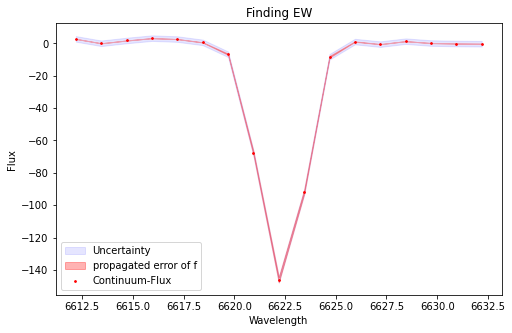

EW= -12.202345017253231  at (i,j)= 16 , 8
sigma f is  [8.57359442e-10 1.30649176e-07 1.01616126e-05 4.03882609e-04
 8.21549952e-03 8.56754725e-02 4.58919510e-01 1.26489340e+00
 1.79653414e+00 1.31594064e+00 4.97123215e-01 9.67781173e-02
 9.69523073e-03 4.98920103e-04 1.31638009e-05 1.77765695e-07
 1.22680660e-09]
 


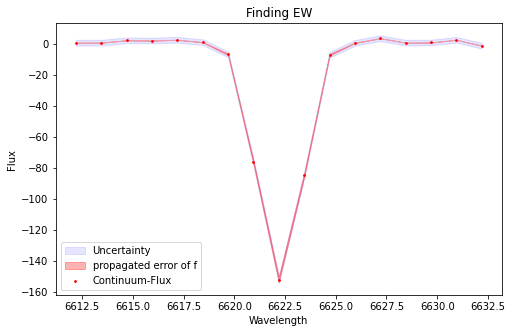

EW= -13.39729937255621  at (i,j)= 16 , 9
sigma f is  [9.30159415e-10 1.38118163e-07 1.04219140e-05 4.00185509e-04
 7.83451574e-03 7.83834887e-02 4.01856591e-01 1.05860714e+00
 1.43614415e+00 1.00464597e+00 3.62370445e-01 6.73005172e-02
 6.42096005e-03 3.13839447e-04 7.83750010e-06 9.97705610e-08
 6.46221439e-10]
 


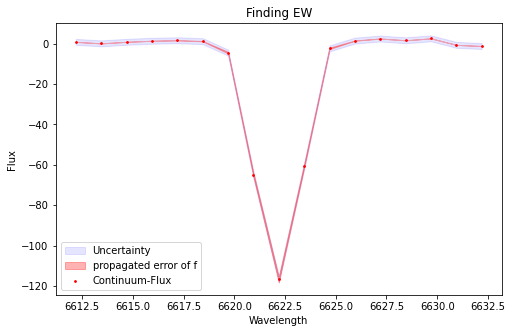

EW= -10.701319056043598  at (i,j)= 16 , 10
sigma f is  [2.62861390e-10 6.42018530e-08 6.40603270e-06 2.96644212e-04
 6.59399486e-03 7.13302495e-02 3.77980135e-01 9.84358508e-01
 1.26154637e+00 7.95527126e-01 2.46424216e-01 3.73542803e-02
 2.74994768e-03 9.67396190e-05 1.55889166e-06 9.51573268e-09
            nan]
 


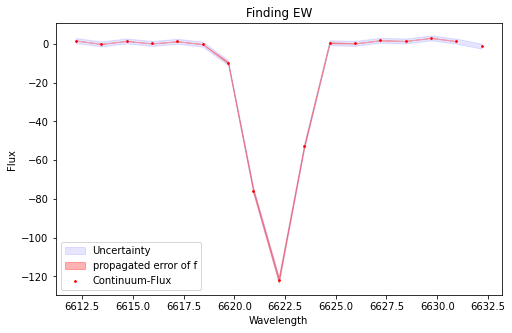

EW= -10.82914282890904  at (i,j)= 16 , 11
sigma f is  [5.69968969e-10 1.07421631e-07 9.68424698e-06 4.23271797e-04
 9.03040590e-03 9.44011193e-02 4.84596194e-01 1.22303923e+00
 1.51837881e+00 9.27182846e-01 2.78291311e-01 4.09977024e-02
 2.95693173e-03 1.03950616e-04 1.76688136e-06 1.42810201e-08
 5.25799359e-11]
 


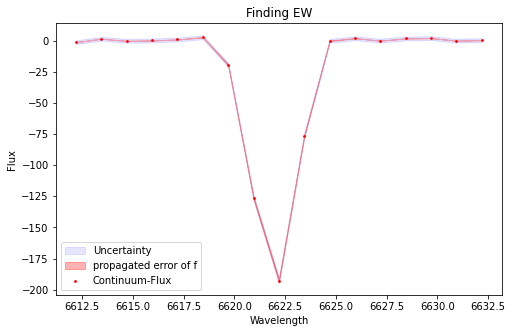

EW= -17.159042224774563  at (i,j)= 16 , 12
sigma f is  [1.12640212e-09 1.71943540e-07 1.30577812e-05 4.93665648e-04
 9.29777139e-03 8.72983667e-02 4.08872663e-01 9.55759056e-01
 1.11541969e+00 6.50009079e-01 1.89128395e-01 2.74677226e-02
 1.99026794e-03 7.19053809e-05 1.29442846e-06 1.16026753e-08
 5.17496708e-11]
 


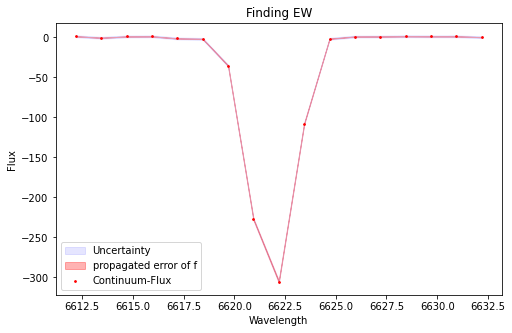

EW= -28.54538372210244  at (i,j)= 16 , 13
sigma f is  [3.12958165e-09 3.80429785e-07 2.34676191e-05 7.35176372e-04
 1.17052546e-02 9.47922034e-02 3.90726474e-01 8.20216780e-01
 8.77204660e-01 4.78018585e-01 1.32709660e-01 1.87633800e-02
 1.35027302e-03 4.94227649e-05 9.19372382e-07 8.68512762e-09
 4.16351535e-11]
 


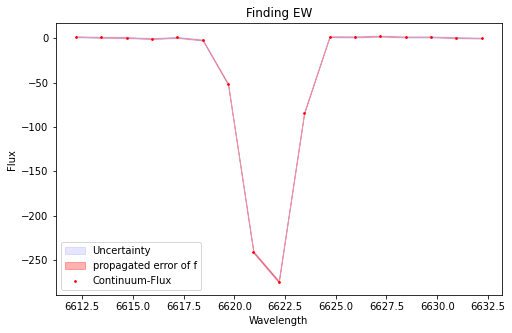

EW= -26.61389621139644  at (i,j)= 16 , 14
sigma f is  [6.32020678e-13 3.79046178e-10 8.78325898e-08 8.90972945e-06
 4.09117467e-04 8.62126820e-03 8.39408676e-02 3.78977469e-01
 7.94850781e-01 7.74946554e-01 3.51090720e-01 7.38073739e-02
 7.17825006e-03 3.21174729e-04 6.53851422e-06 5.90657193e-08
 2.18809388e-10]
 


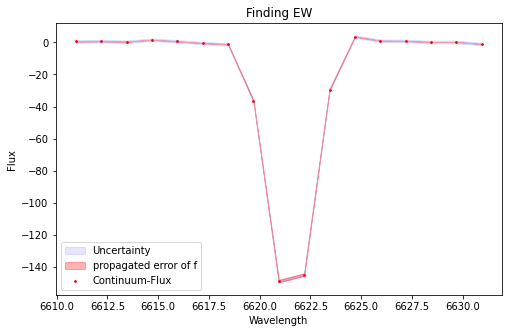

EW= -15.94058392884519  at (i,j)= 16 , 15
sigma f is  [6.78061793e-10 1.45882381e-07 1.30111460e-05 5.38076118e-04
 1.06448199e-02 1.02045811e-01 4.76998532e-01 1.09051636e+00
 1.22080103e+00 6.68978768e-01 1.79100289e-01 2.33265848e-02
 1.46542028e-03 4.35835384e-05 5.82822873e-07 2.64127330e-09
            nan]
 


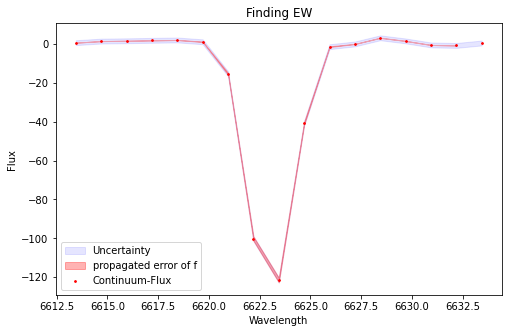

EW= -17.355020505719082  at (i,j)= 17 , 0
sigma f is  [2.56273451e-09 3.77964505e-07 2.70826718e-05 9.55194748e-04
 1.66928009e-02 1.45080000e-01 6.28416824e-01 1.35815078e+00
 1.46521427e+00 7.88926952e-01 2.11839097e-01 2.83206827e-02
 1.87968732e-03 6.16266187e-05 9.88706005e-07 7.60729048e-09
 2.65287293e-11]
 


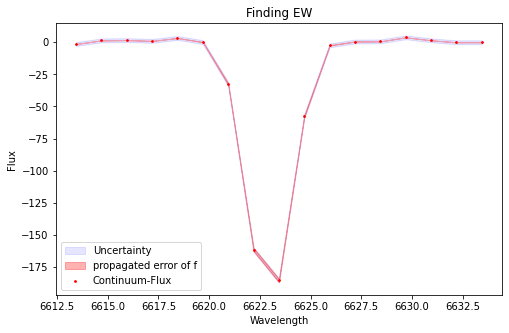

EW= -24.463493115133684  at (i,j)= 17 , 1
sigma f is  [7.18030751e-09 7.68571384e-07 4.20854521e-05 1.18058280e-03
 1.69945942e-02 1.25775038e-01 4.79486220e-01 9.43147117e-01
 9.58283448e-01 5.03121775e-01 1.36426727e-01 1.90824205e-02
 1.37443307e-03 5.08786290e-05 9.66184907e-07 9.39690722e-09
 4.67436329e-11]
 


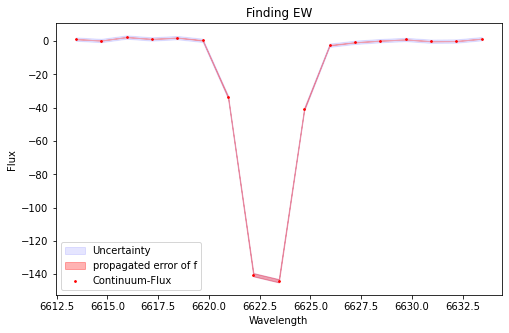

EW= -20.09638776068587  at (i,j)= 17 , 2
sigma f is  [           nan 1.14964436e-09 4.05462683e-07 3.21978132e-05
 1.13374325e-03 1.90082462e-02 1.55286605e-01 6.24271888e-01
 1.24049129e+00 1.22018017e+00 5.93574231e-01 1.42287442e-01
 1.66693567e-02 9.36701124e-04 2.39493040e-05 2.06408299e-07
            nan]
 


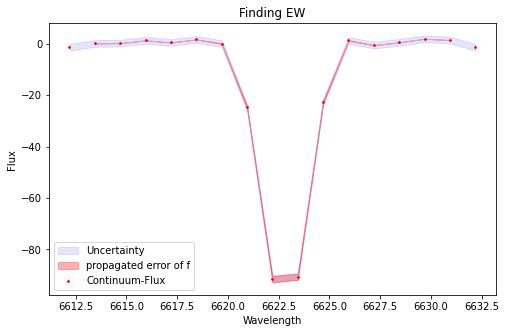

EW= -13.113104766855866  at (i,j)= 17 , 3
sigma f is  [           nan 3.12917825e-09 8.83781215e-07 6.31111917e-05
 2.01571277e-03 3.08102210e-02 2.30446814e-01 8.51509524e-01
 1.56092324e+00 1.42124239e+00 6.41947491e-01 1.43219851e-01
 1.56300607e-02 8.15585979e-04 1.89711503e-05 1.03606882e-07
            nan]
 


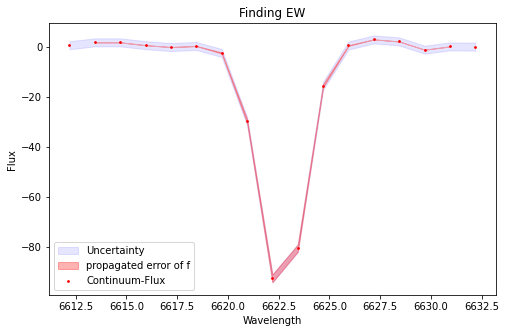

EW= -11.731996950087407  at (i,j)= 17 , 4
sigma f is  [           nan 4.51480918e-08 3.94064835e-06 1.59514846e-04
 3.29262287e-03 3.56434036e-02 2.04753768e-01 6.27693016e-01
 1.02955054e+00 9.04069986e-01 4.24547317e-01 1.06267043e-01
 1.40808039e-02 9.73243843e-04 3.37996147e-05 5.06090006e-07
            nan]
 


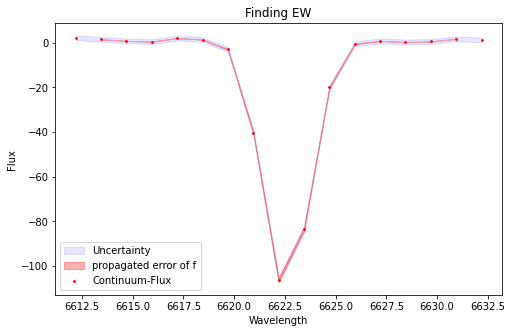

EW= -12.805396966267447  at (i,j)= 17 , 5
sigma f is  [5.00509911e-10 8.63506941e-08 6.44610747e-06 2.42562547e-04
 4.77693129e-03 4.99738725e-02 2.79716341e-01 8.40763921e-01
 1.35947775e+00 1.18301169e+00 5.53570421e-01 1.38973722e-01
 1.86330654e-02 1.32231080e-03 4.87083548e-05 8.81787259e-07
 5.69368792e-09]
 


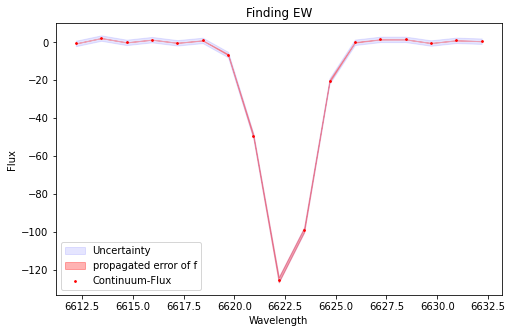

EW= -14.635993585977342  at (i,j)= 17 , 6
sigma f is  [           nan 3.84938676e-08 4.43440016e-06 1.85209295e-04
 3.77635966e-03 3.96168182e-02 2.17850153e-01 6.33038618e-01
 9.75427350e-01 7.97459391e-01 3.45225783e-01 7.86991816e-02
 9.33055683e-03 5.57810005e-04 1.50338869e-05            nan
            nan]
 


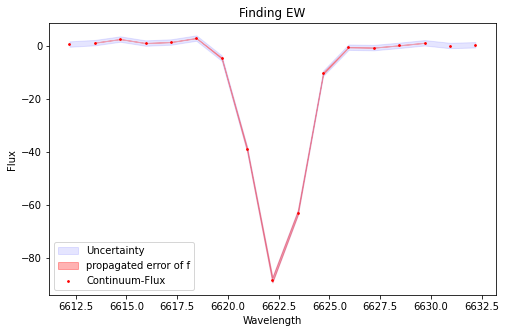

EW= -9.900476197587809  at (i,j)= 17 , 7
sigma f is  [           nan 2.58058171e-08 3.06426634e-06 1.36808420e-04
 2.94194137e-03 3.19745742e-02 1.78734367e-01 5.17814722e-01
 7.80015842e-01 6.11198477e-01 2.48582529e-01 5.21731531e-02
 5.57780105e-03 2.93979948e-04 6.75683795e-06            nan
            nan]
 


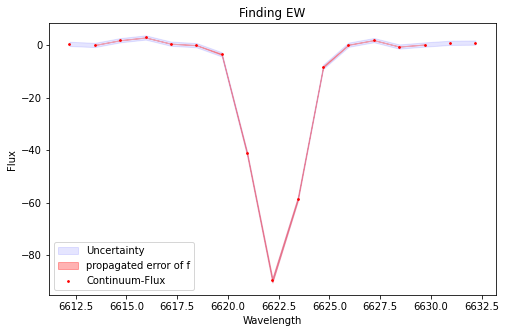

EW= -9.424556920608417  at (i,j)= 17 , 8
sigma f is  [2.49196506e-10 5.71403486e-08 5.18665778e-06 2.25787286e-04
 4.91860770e-03 5.44978483e-02 3.09479152e-01 9.04198367e-01
 1.36151728e+00 1.05683020e+00 4.22362605e-01 8.66441648e-02
 9.06780523e-03 4.78075099e-04 1.23188789e-05 1.39460304e-07
            nan]
 


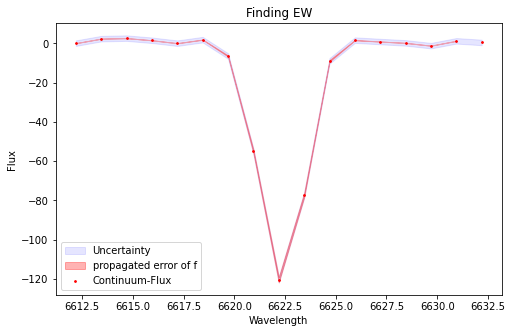

EW= -12.208008477687063  at (i,j)= 17 , 9
sigma f is  [1.41828716e-09 1.66656527e-07 1.03866386e-05 3.43782722e-04
 6.05308998e-03 5.68120062e-02 2.84882327e-01 7.64967521e-01
 1.10204319e+00 8.52750957e-01 3.54445337e-01 7.90590966e-02
 9.44589878e-03 6.03180139e-04 2.05382139e-05 3.72120888e-07
 3.58144862e-09]
 


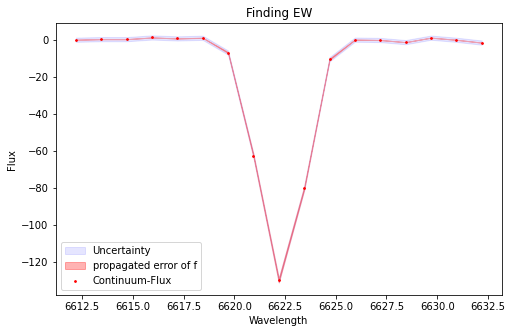

EW= -12.903381933005496  at (i,j)= 17 , 10
sigma f is  [4.33849957e-09 4.85169956e-07 2.85957921e-05 8.89517121e-04
 1.46289013e-02 1.27466124e-01 5.89825414e-01 1.45276935e+00
 1.90818725e+00 1.33793770e+00 5.00731388e-01 9.99135986e-02
 1.06083635e-02 5.97949185e-04 1.78509343e-05 2.81669074e-07
 2.34510975e-09]
 


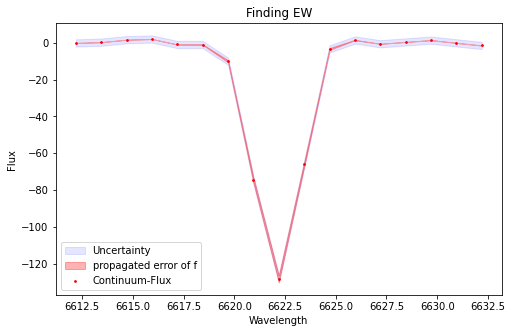

EW= -13.08737871913715  at (i,j)= 17 , 11
sigma f is  [1.21400031e-08 1.23262557e-06 6.64287556e-05 1.90193771e-03
 2.89602941e-02 2.34775393e-01 1.01440081e+00 2.33818309e+00
 2.87708581e+00 1.89048144e+00 6.63287703e-01 1.24204211e-01
 1.24031497e-02 6.59863874e-04 1.86822393e-05 2.81180773e-07
 2.24745209e-09]
 


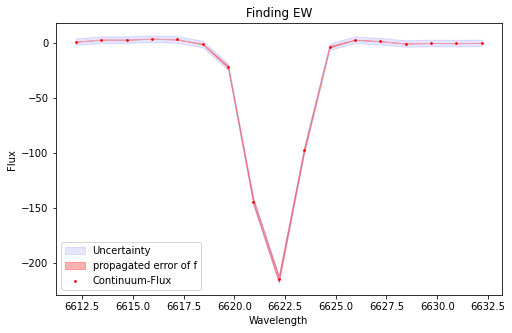

EW= -22.68746960864445  at (i,j)= 17 , 12
sigma f is  [3.60920736e-09 4.20038431e-07 2.53284250e-05 7.91787983e-04
 1.28391660e-02 1.08051364e-01 4.72176356e-01 1.07184822e+00
 1.26425802e+00 7.74929110e-01 2.46825221e-01 4.08437101e-02
 3.51005867e-03 1.56586995e-04 3.62424680e-06 4.34966720e-08
 2.70537338e-10]
 


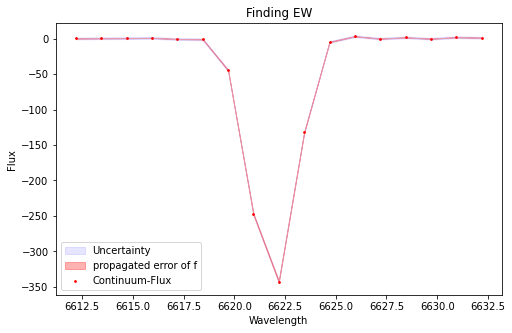

EW= -35.08239861111167  at (i,j)= 17 , 13
sigma f is  [1.25661848e-08 1.20303008e-06 6.07380939e-05 1.61821203e-03
 2.27660463e-02 1.69238772e-01 6.65162121e-01 1.38285516e+00
 1.52119107e+00 8.85524137e-01 2.72764415e-01 4.44447717e-02
 3.82914615e-03 1.74333885e-04 4.19160764e-06 5.31875299e-08
 3.55950114e-10]
 


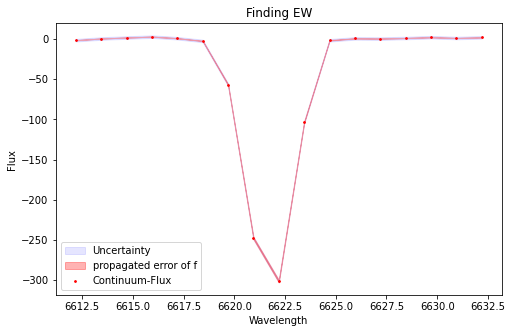

EW= -31.92039189329267  at (i,j)= 17 , 14
sigma f is  [4.36702077e-09 5.83130332e-07 3.81856014e-05 1.23787248e-03
 1.99661095e-02 1.60702041e-01 6.46549119e-01 1.30147142e+00
 1.31119277e+00 6.61023496e-01 1.66633935e-01 2.09737001e-02
 1.31480451e-03 4.08743588e-05 6.25251819e-07 4.63210267e-09
 1.59644006e-11]
 


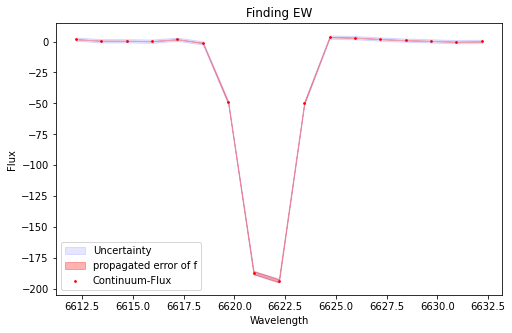

EW= -23.21929152887957  at (i,j)= 17 , 15
sigma f is  [           nan            nan            nan 1.21552038e-04
 3.81474155e-03 4.72192565e-02 2.59200644e-01 6.50008562e-01
 7.51258509e-01 3.99442744e-01 9.63163627e-02 1.00530214e-02
 3.53592160e-04            nan            nan            nan
            nan]
 


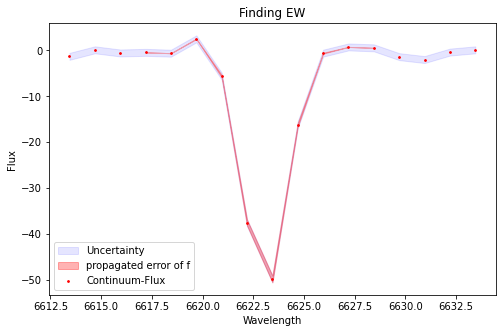

EW= -7.0242778253819695  at (i,j)= 18 , 0
sigma f is  [           nan            nan 7.18606374e-06 4.63013785e-04
 1.09892974e-02 1.15219363e-01 5.55526438e-01 1.24916296e+00
 1.31586564e+00 6.48338672e-01 1.48109310e-01 1.53124356e-02
 6.60540144e-04 2.63032349e-06            nan            nan
            nan]
 


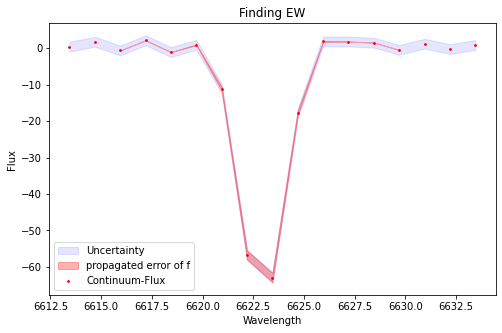

EW= -9.2618124398305  at (i,j)= 18 , 1
sigma f is  [           nan            nan 1.39594400e-05 8.75828017e-04
 1.66294872e-02 1.43555455e-01 5.97541222e-01 1.22156883e+00
 1.23304234e+00 6.12847378e-01 1.48003274e-01 1.66829152e-02
 7.28525804e-04            nan            nan            nan
            nan]
 


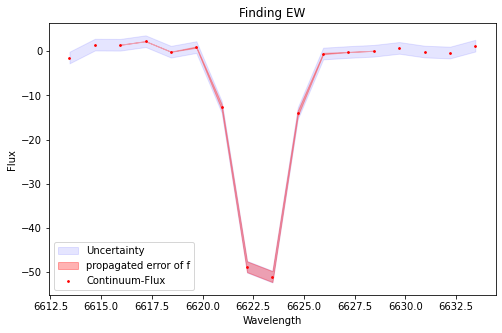

EW= -7.826974072449655  at (i,j)= 18 , 2
sigma f is  [           nan            nan            nan 1.93833220e-05
 9.31188367e-04 1.63212062e-02 1.31656717e-01 5.11507384e-01
 9.71653616e-01 9.06087038e-01 4.13365965e-01 9.09854082e-02
 9.26932729e-03 3.59233365e-04            nan            nan
            nan]
 


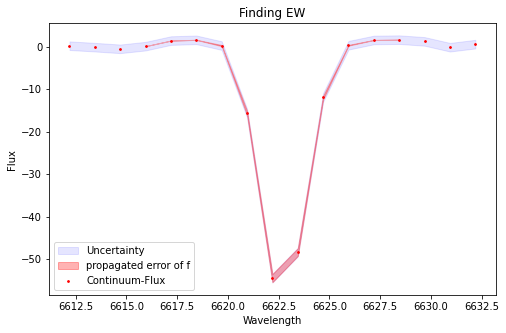

EW= -8.133463926452784  at (i,j)= 18 , 3
sigma f is  [           nan            nan 2.22889846e-07 1.97511489e-05
 7.31257261e-04 1.24546920e-02 1.00358052e-01 3.86963496e-01
 7.17489643e-01 6.40591135e-01 2.74987925e-01 5.64667150e-02
 5.48123940e-03 2.44234705e-04 4.50329046e-06            nan
            nan]
 


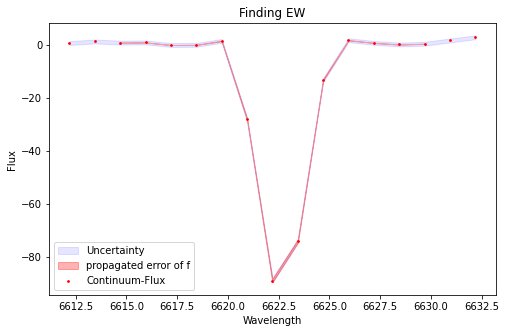

EW= -12.594548889056776  at (i,j)= 18 , 4
sigma f is  [           nan 1.40098056e-08 2.63736899e-06 1.27521261e-04
 2.91912288e-03 3.38983396e-02 2.04239576e-01 6.44580641e-01
 1.06998185e+00 9.35103036e-01 4.29520847e-01 1.03153700e-01
 1.28002082e-02 7.97059383e-04 2.24800288e-05            nan
            nan]
 


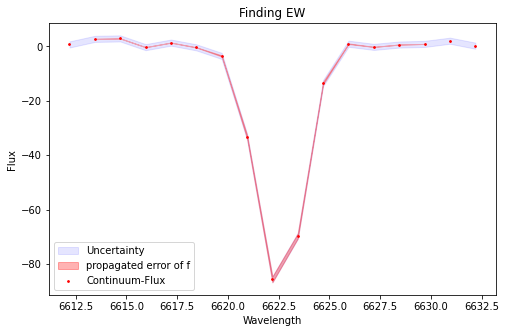

EW= -12.19961216167513  at (i,j)= 18 , 5
sigma f is  [           nan            nan 9.47070031e-07 6.59204539e-05
 1.93422480e-03 2.70386922e-02 1.86015252e-01 6.37810582e-01
 1.09571910e+00 9.44311744e-01 4.07414152e-01 8.74203782e-02
 9.18476968e-03 4.52931669e-04 8.63444780e-06            nan
            nan]
 


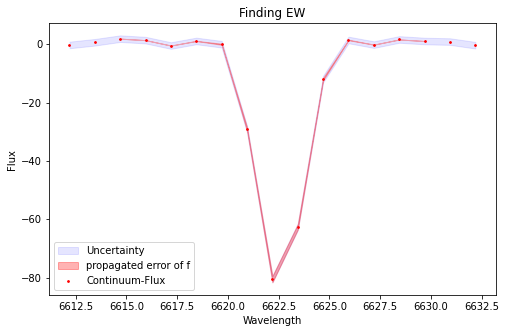

EW= -10.552584859563057  at (i,j)= 18 , 6
sigma f is  [           nan            nan 6.42678196e-07 7.74664246e-05
 2.05261187e-03 2.50482279e-02 1.51300477e-01 4.62563978e-01
 7.21594216e-01 5.75114656e-01 2.33096560e-01 4.73643748e-02
 4.63335359e-03 1.81459682e-04            nan            nan
            nan]
 


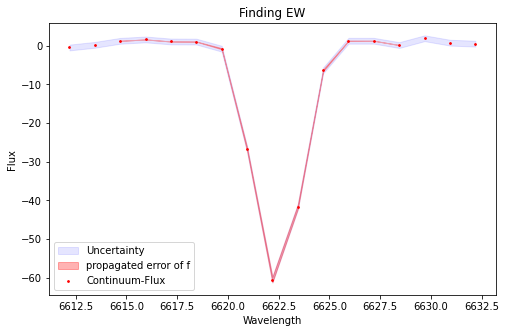

EW= -7.312478656617367  at (i,j)= 18 , 7
sigma f is  [           nan            nan 1.16850837e-06 8.89870502e-05
 2.63833638e-03 3.62265258e-02 2.39667945e-01 7.75164267e-01
 1.23266090e+00 9.64591225e-01 3.70190972e-01 6.89965456e-02
 6.09125993e-03 2.34558255e-04 7.00231374e-07            nan
            nan]
 


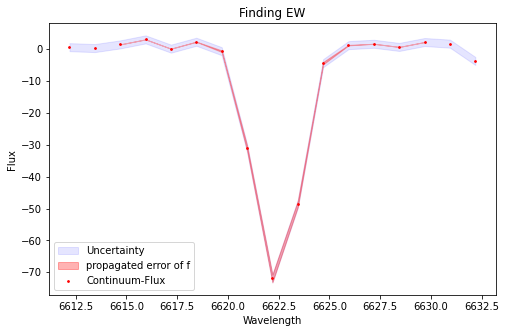

EW= -7.843068525140562  at (i,j)= 18 , 8
sigma f is  [9.67783622e-11 2.12037184e-08 2.17933389e-06 1.09838739e-04
 2.76094711e-03 3.48941952e-02 2.22699358e-01 7.19414675e-01
 1.17769277e+00 9.77199976e-01 4.10747630e-01 8.73207398e-02
 9.36036027e-03 5.03138998e-04 1.34160888e-05 1.73220326e-07
 1.00528678e-09]
 


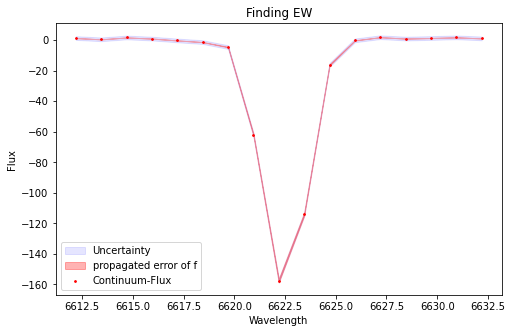

EW= -16.194460690135635  at (i,j)= 18 , 9
sigma f is  [4.23235266e-10 6.49117295e-08 5.05043243e-06 2.02949297e-04
 4.24844204e-03 4.65456626e-02 2.67609056e-01 8.08647812e-01
 1.28524467e+00 1.07460386e+00 4.72462328e-01 1.09112971e-01
 1.32104592e-02 8.35619763e-04 2.74487700e-05 4.62802074e-07
 3.90017815e-09]
 


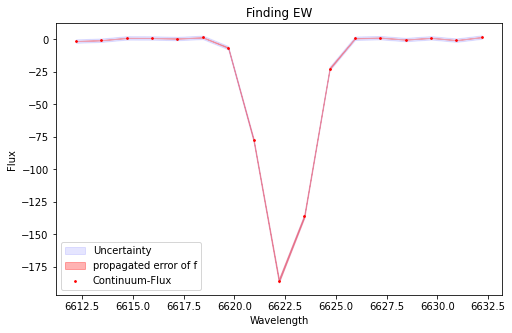

EW= -17.871852894544613  at (i,j)= 18 , 10
sigma f is  [2.59818410e-09 3.06197420e-07 1.89419763e-05 6.15888425e-04
 1.05424240e-02 9.51877776e-02 4.54297221e-01 1.14842486e+00
 1.54020789e+00 1.09688612e+00 4.14792211e-01 8.32075216e-02
 8.83945428e-03 4.96278788e-04 1.46943550e-05 2.29017821e-07
 1.87579791e-09]
 


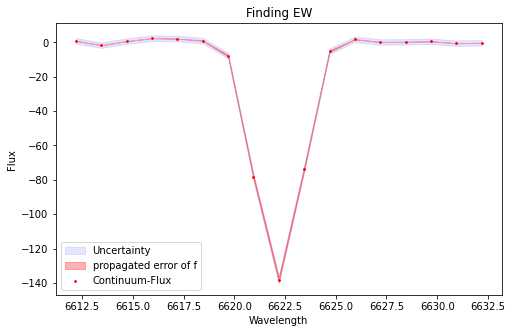

EW= -12.995667355271692  at (i,j)= 18 , 11
sigma f is  [3.41844344e-09 3.80790251e-07 2.22900347e-05 6.86257886e-04
 1.11235429e-02 9.50225499e-02 4.28226345e-01 1.01897087e+00
 1.28105370e+00 8.51185481e-01 2.98885664e-01 5.54402768e-02
 5.42838195e-03 2.80309245e-04 7.62574329e-06 1.09184226e-07
 8.21969381e-10]
 


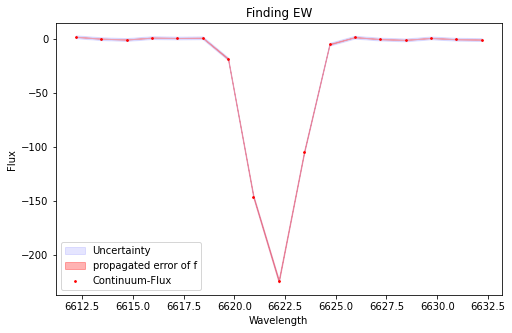

EW= -22.877271156794414  at (i,j)= 18 , 12
sigma f is  [1.00791121e-09 1.50278820e-07 1.12501934e-05 4.23178250e-04
 8.00429481e-03 7.61897783e-02 3.65223748e-01 8.82212372e-01
 1.07429236e+00 6.59612377e-01 2.04193511e-01 3.18598480e-02
 2.50417566e-03 9.90856513e-05 1.97220149e-06 1.97309181e-08
 9.91454583e-11]
 


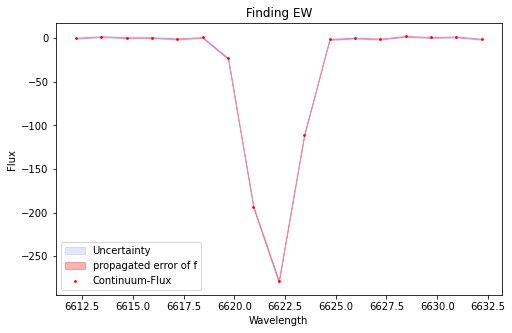

EW= -28.88124626812149  at (i,j)= 18 , 13
sigma f is  [7.09240334e-10 1.18675178e-07 9.56350897e-06 3.74922494e-04
 7.18891031e-03 6.76273069e-02 3.12683375e-01 7.11286388e-01
 7.96371233e-01 4.38801166e-01 1.18909519e-01 1.58265140e-02
 1.03221702e-03 3.28595817e-05 5.06988147e-07 3.73853803e-09
 1.27375341e-11]
 


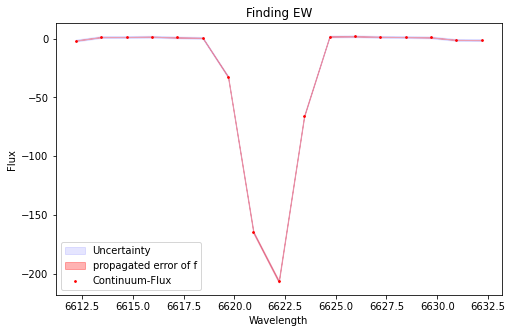

EW= -23.40860562189353  at (i,j)= 18 , 14
sigma f is  [1.48481330e-09 2.72929767e-07 2.33321537e-05 9.43507540e-04
 1.81956679e-02 1.68087769e-01 7.45630783e-01 1.59038134e+00
 1.63185542e+00 8.05324740e-01 1.90961841e-01 2.17146570e-02
 1.17993085e-03 3.04426092e-05 3.68269172e-07 2.02812799e-09
 4.59553517e-12]
 


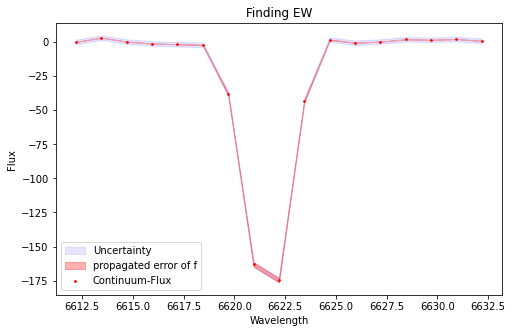

EW= -21.52268019609926  at (i,j)= 18 , 15
sigma f is  [       nan        nan        nan        nan        nan 0.02429358
 0.26144676 0.87739826 1.0035315  0.38833374 0.04431327        nan
        nan        nan        nan        nan        nan]
 


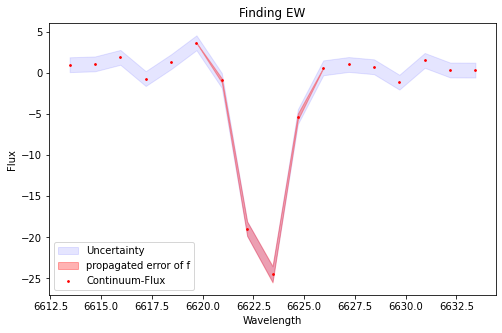

EW= -3.3106347386199935  at (i,j)= 19 , 0
sigma f is  [       nan        nan        nan        nan        nan 0.04071091
 0.33852196 0.95872149 1.01237876 0.39296454 0.0459734         nan
        nan        nan        nan        nan        nan]
 


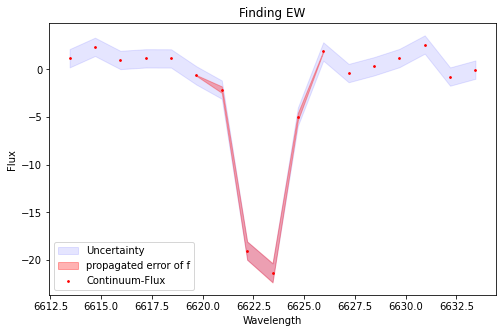

EW= -2.9892383131273466  at (i,j)= 19 , 1
sigma f is  [           nan            nan            nan            nan
 1.31251141e-03 5.97919760e-02 5.53011741e-01 1.64104222e+00
 1.64394640e+00 5.51719290e-01 5.66446706e-02            nan
            nan            nan            nan            nan
            nan]
 


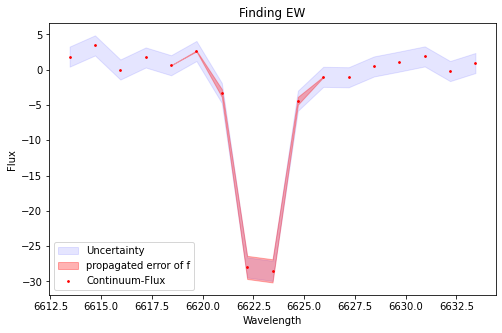

EW= -4.064486443856247  at (i,j)= 19 , 2
sigma f is  [           nan            nan            nan            nan
 2.18781890e-05 2.28595613e-03 4.02933533e-02 2.51137678e-01
 5.92739037e-01 5.37956912e-01 1.86383184e-01 2.36230543e-02
 8.60126267e-04            nan            nan            nan
            nan]
 


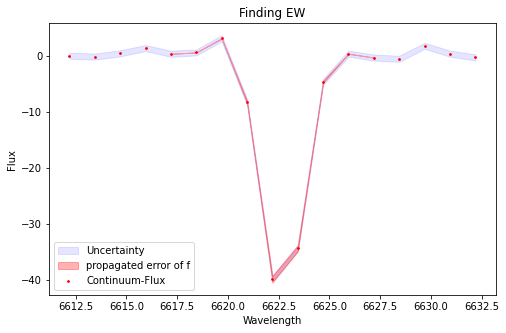

EW= -5.397968402131587  at (i,j)= 19 , 3
sigma f is  [           nan            nan 4.45401954e-08 8.76791840e-06
 4.72990903e-04 1.04795309e-02 1.01200898e-01 4.34472891e-01
 8.35697028e-01 7.21669585e-01 2.79137655e-01 4.79645430e-02
 3.58558467e-03 1.09349088e-04 8.25995679e-07            nan
            nan]
 


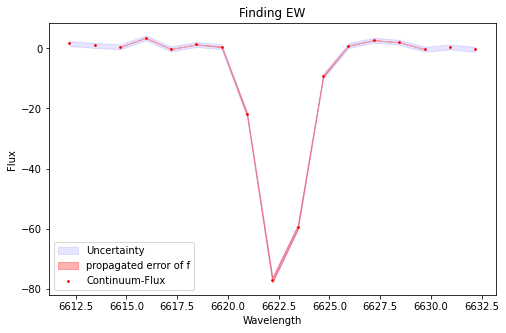

EW= -10.208737434492484  at (i,j)= 19 , 4
sigma f is  [           nan            nan 6.56716405e-07 5.11781024e-05
 1.66344801e-03 2.52293434e-02 1.84139521e-01 6.54657028e-01
 1.13949915e+00 9.72241474e-01 4.05804492e-01 8.23356168e-02
 7.99982059e-03 3.57616656e-04 6.17415257e-06            nan
            nan]
 


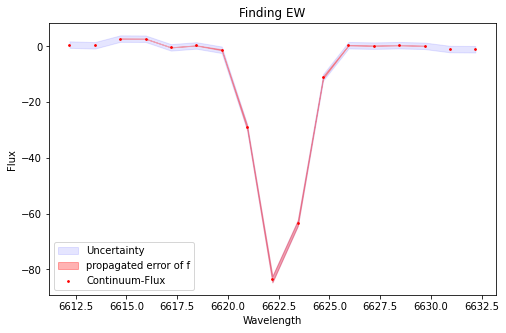

EW= -11.547854580521097  at (i,j)= 19 , 5
sigma f is  [           nan            nan            nan 1.60511951e-05
 8.83446345e-04 1.84888422e-02 1.67876388e-01 6.83578337e-01
 1.26279465e+00 1.06121049e+00 4.04087637e-01 6.87560604e-02
 5.01988710e-03 1.30524312e-04            nan            nan
            nan]
 


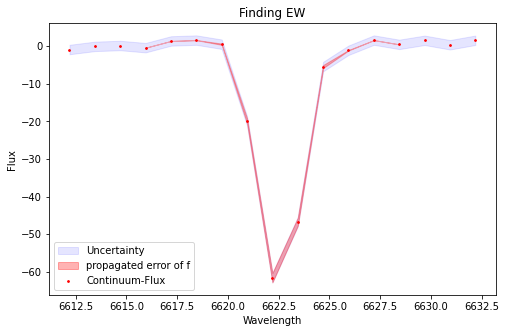

EW= -7.766163777059415  at (i,j)= 19 , 6
sigma f is  [3.00320663e-12 1.22237122e-09 2.23318757e-07 1.83243930e-05
 6.76534407e-04 1.12812038e-02 8.55552498e-02 2.98312232e-01
 4.84612711e-01 3.70655021e-01 1.33646749e-01 2.25183206e-02
 1.74968278e-03 6.19670356e-05 9.92507623e-07 7.15737286e-09
 2.31889522e-11]
 


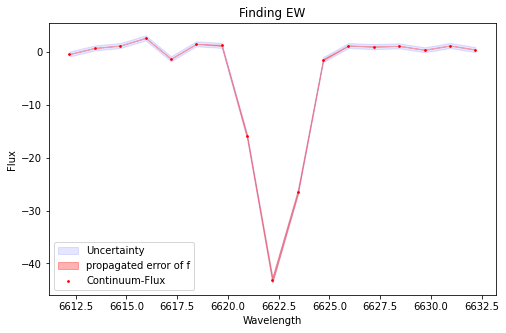

EW= -4.723898642932323  at (i,j)= 19 , 7
sigma f is  [           nan            nan            nan 1.34326909e-05
 9.38475652e-04 2.05777573e-02 1.86429843e-01 7.32849546e-01
 1.26897077e+00 9.70288330e-01 3.25117524e-01 4.64986013e-02
 2.57386553e-03            nan            nan            nan
            nan]
 


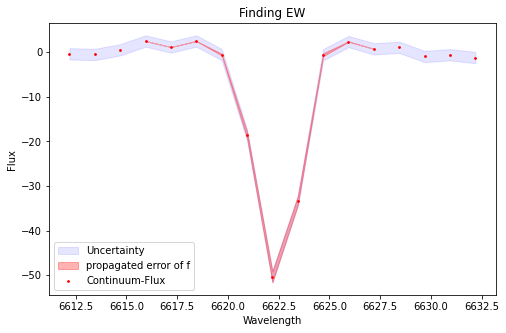

EW= -5.088265056763469  at (i,j)= 19 , 8
sigma f is  [           nan 8.32259627e-10 4.48748577e-07 3.90110610e-05
 1.42013169e-03 2.33796877e-02 1.78321330e-01 6.36450046e-01
 1.06741507e+00 8.41866117e-01 3.11539795e-01 5.37451362e-02
 4.25801731e-03 1.48880952e-04 1.93276719e-06            nan
            nan]
 


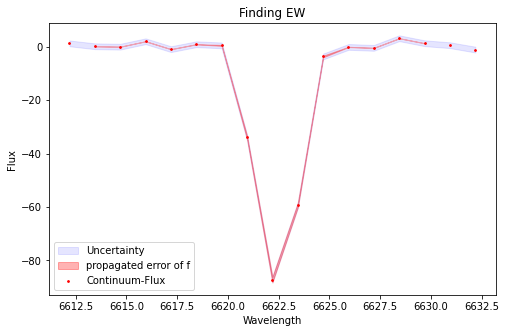

EW= -7.084838793140987  at (i,j)= 19 , 9
sigma f is  [1.33454703e-10 2.47348332e-08 2.29453398e-06 1.06684489e-04
 2.49119787e-03 2.92952739e-02 1.74070695e-01 5.24537918e-01
 8.04222817e-01 6.28672495e-01 2.50619913e-01 5.08635581e-02
 5.23908371e-03 2.72886902e-04 7.16287595e-06 9.44761624e-08
 6.24804464e-10]
 


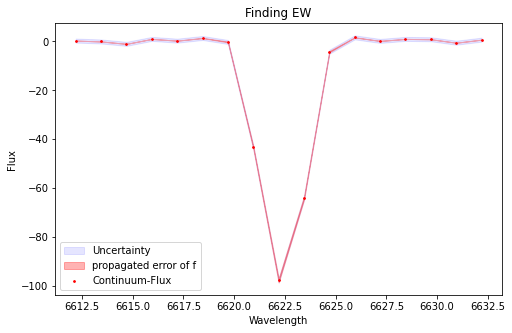

EW= -6.002276130855996  at (i,j)= 19 , 10
sigma f is  [2.07558162e-09 2.73964363e-07 1.86353801e-05 6.54149037e-04
 1.18713768e-02 1.11630428e-01 5.45270606e-01 1.38698201e+00
 1.84094385e+00 1.27645349e+00 4.62301116e-01 8.73471426e-02
 8.59117935e-03 4.38777032e-04 1.16075924e-05 1.58708481e-07
 1.11957632e-09]
 


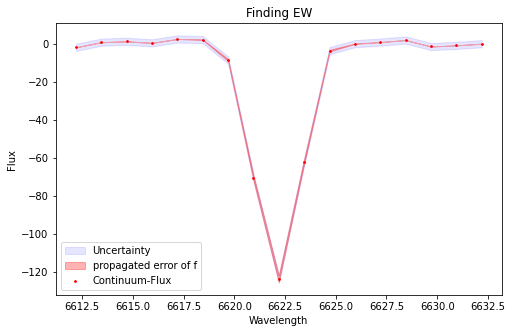

EW= -7.993333346802786  at (i,j)= 19 , 11
sigma f is  [7.32625237e-10 1.27394380e-07 1.04121765e-05 4.14320246e-04
 8.14210428e-03 7.95777933e-02 3.88266413e-01 9.47557536e-01
 1.15762906e+00 7.07884481e-01 2.16421744e-01 3.30020097e-02
 2.49878001e-03 9.31430399e-05 1.67850954e-06 1.39243331e-08
 4.13187899e-11]
 


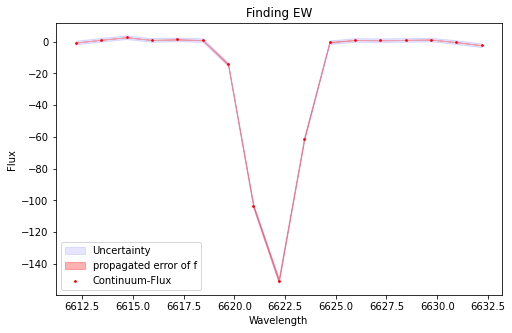

EW= -12.956403132585523  at (i,j)= 19 , 12
sigma f is  [5.25613276e-10 1.11622253e-07 1.08280313e-05 4.96272434e-04
 1.08962658e-02 1.15397253e-01 5.91651215e-01 1.47138166e+00
 1.77629472e+00 1.04081161e+00 2.95674604e-01 4.06258996e-02
 2.68783833e-03 8.49065666e-05 1.25789242e-06 8.33025904e-09
 1.93581431e-11]
 


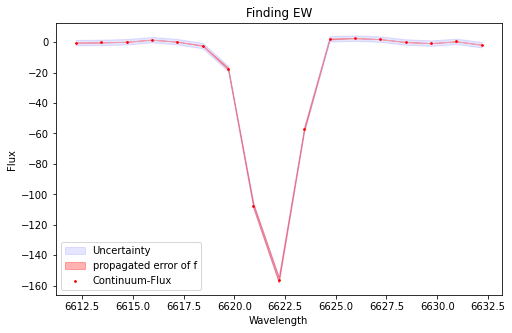

EW= -15.6447804476374  at (i,j)= 19 , 13
sigma f is  [7.48450886e-10 1.18118435e-07 9.04987385e-06 3.42222775e-04
 6.43865012e-03 6.05326533e-02 2.85078677e-01 6.73443858e-01
 7.98432833e-01 4.75034985e-01 1.41714099e-01 2.11626210e-02
 1.57719767e-03 5.83496180e-05 1.06074090e-06 9.26638110e-09
 3.64260945e-11]
 


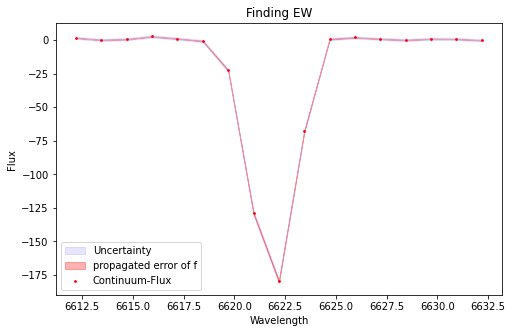

EW= -20.561382741787135  at (i,j)= 19 , 14
sigma f is  [7.01278346e-10 1.57108913e-07 1.45448359e-05 6.18491355e-04
 1.24495964e-02 1.20121537e-01 5.58947412e-01 1.25806339e+00
 1.37120271e+00 7.23457374e-01 1.84411088e-01 2.26133437e-02
 1.32253736e-03 3.62036130e-05 4.40332668e-07 1.78273265e-09
            nan]
 


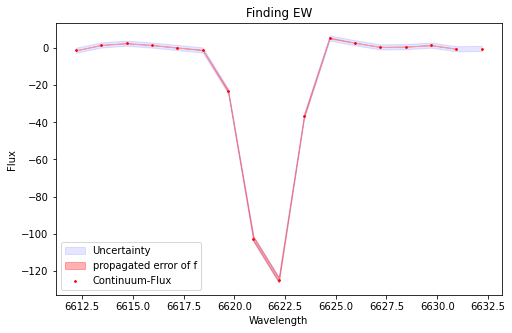

EW= -15.37980981938302  at (i,j)= 19 , 15
sigma f is  [5.97041332e-11 2.23057301e-08 3.55619124e-06 2.41944563e-04
 7.03599210e-03 8.79256842e-02 4.77993276e-01 1.15559794e+00
 1.27578855e+00 6.51306193e-01 1.51668939e-01 1.56873921e-02
 7.05305441e-04 1.36213801e-05 1.12430308e-07 3.96000965e-10
 5.95215920e-13]
 


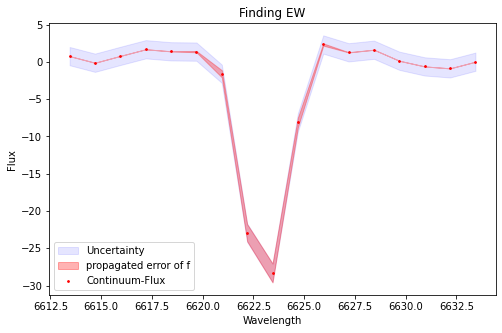

EW= -4.114745132292653  at (i,j)= 20 , 0
sigma f is  [       nan        nan        nan        nan        nan        nan
 0.01514551 0.18310915 0.59025037 0.59116993 0.18110583 0.01229172
        nan        nan        nan        nan        nan]
 


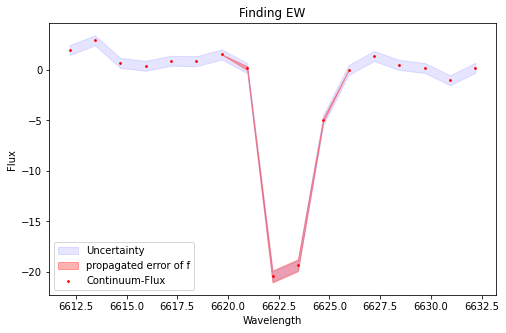

EW= -2.9009717504739005  at (i,j)= 20 , 1
sigma f is  [       nan        nan        nan        nan        nan 0.00297326
 0.05939177 0.34800915 0.80822745 0.77383363 0.30062887 0.04171202
        nan        nan        nan        nan        nan]
 


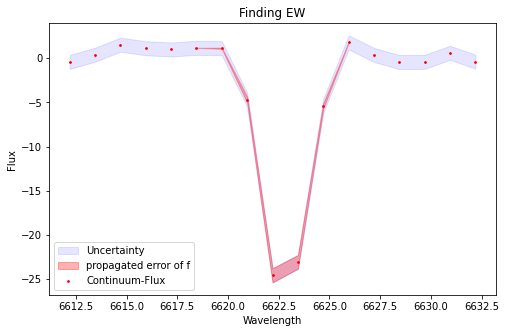

EW= -3.8111586506157082  at (i,j)= 20 , 2
sigma f is  [       nan        nan        nan        nan        nan 0.0049442
 0.09259723 0.55957944 1.25371858 1.06594408 0.33812569 0.03594939
        nan        nan        nan        nan        nan]
 


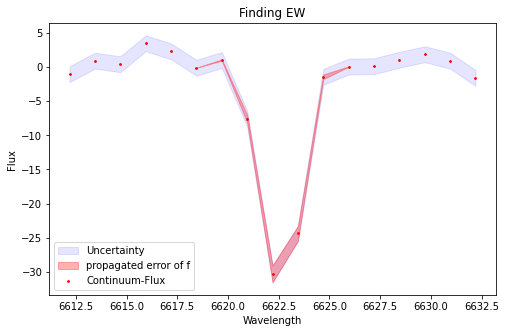

EW= -4.059733703567427  at (i,j)= 20 , 3
sigma f is  [           nan            nan            nan 1.39803352e-05
 9.27102426e-04 1.96119204e-02 1.78013528e-01 7.29610730e-01
 1.37234710e+00 1.18924231e+00 4.72597845e-01 8.46147770e-02
 6.44913097e-03 1.43768152e-04            nan            nan
            nan]
 


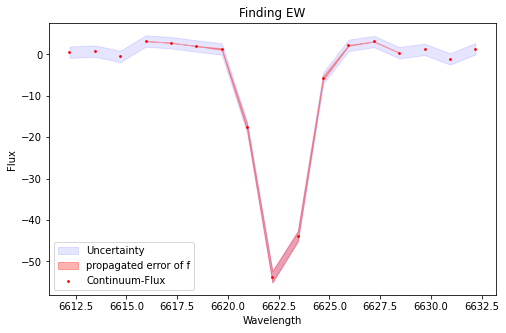

EW= -7.115053756292422  at (i,j)= 20 , 4
sigma f is  [           nan            nan 2.28618430e-06 1.24457211e-04
 3.01891128e-03 3.59796695e-02 2.16710581e-01 6.67133508e-01
 1.05452797e+00 8.56585648e-01 3.56652211e-01 7.55608547e-02
 8.00473111e-03 4.03737502e-04 7.48303105e-06            nan
            nan]
 


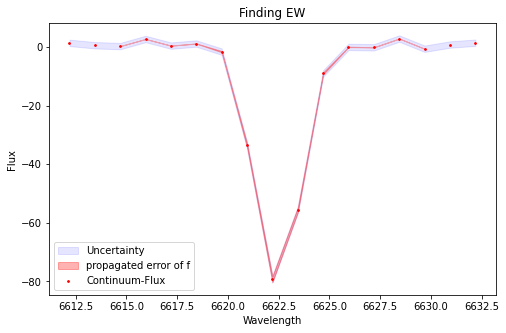

EW= -10.265122166612521  at (i,j)= 20 , 5
sigma f is  [           nan            nan            nan 2.08452532e-05
 1.02277637e-03 1.94968587e-02 1.63235885e-01 6.19469937e-01
 1.07725534e+00 8.60257412e-01 3.13903872e-01 5.14894312e-02
 3.61300754e-03 8.24170399e-05            nan            nan
            nan]
 


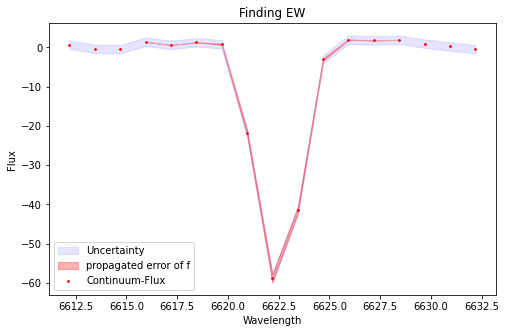

EW= -7.03611541982682  at (i,j)= 20 , 6
sigma f is  [7.17079957e-12 2.79052531e-09 4.87859640e-07 3.83325233e-05
 1.35572723e-03 2.16629272e-02 1.57539937e-01 5.27844289e-01
 8.27831719e-01 6.15627420e-01 2.17394417e-01 3.60467717e-02
 2.76212027e-03 9.65253321e-05 1.52571434e-06 1.08609555e-08
 3.47544424e-11]
 


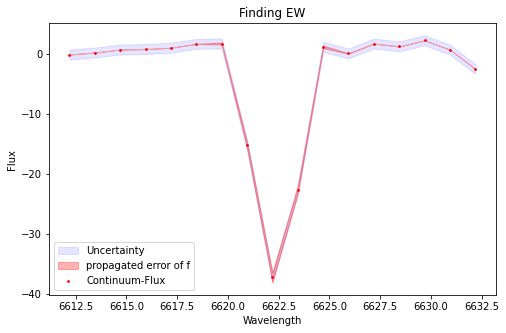

EW= -4.201580040107278  at (i,j)= 20 , 7
sigma f is  [           nan            nan            nan            nan
 8.92090074e-04 2.44189367e-02 2.28132995e-01 8.68425538e-01
 1.39402920e+00 9.45750969e-01 2.64268561e-01 2.69268082e-02
            nan            nan            nan            nan
            nan]
 


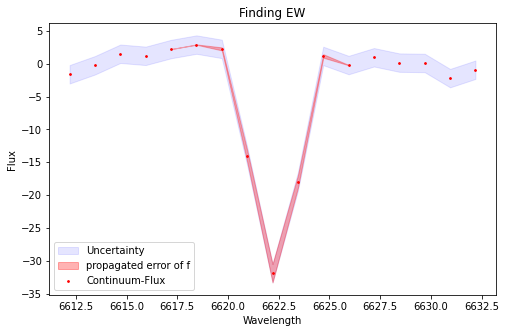

EW= -2.8577763111142604  at (i,j)= 20 , 8
sigma f is  [           nan            nan            nan 7.24393683e-05
 2.59698194e-03 3.72334022e-02 2.41050931e-01 7.26724200e-01
 1.03033384e+00 6.86957105e-01 2.13279659e-01 2.98971801e-02
 1.67501569e-03            nan            nan            nan
            nan]
 


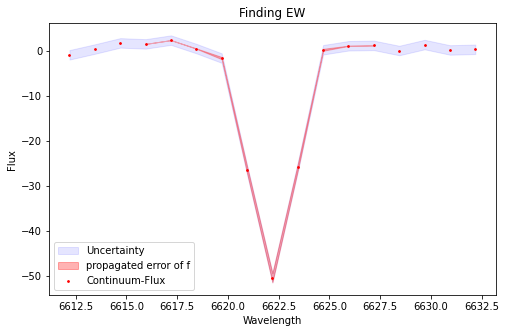

EW= -2.5380052489845437  at (i,j)= 20 , 9
sigma f is  [           nan            nan 1.33761704e-06 1.42372350e-04
 4.14704473e-03 5.26145305e-02 3.09404358e-01 8.60108268e-01
 1.13777800e+00 7.15854635e-01 2.12512619e-01 2.90879982e-02
 1.69964167e-03 1.53333422e-05            nan            nan
            nan]
 


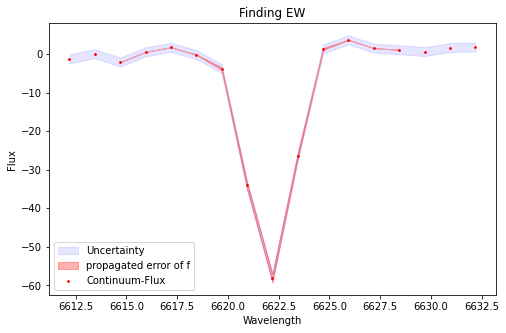

EW= -1.1580614040881025  at (i,j)= 20 , 10
sigma f is  [           nan 2.32602195e-08 3.36711758e-06 1.73941606e-04
 4.08943002e-03 4.58904342e-02 2.50063338e-01 6.66587111e-01
 8.71705573e-01 5.59097737e-01 1.75279803e-01 2.66336264e-02
 1.92282254e-03 6.22263066e-05 6.18112783e-07            nan
            nan]
 


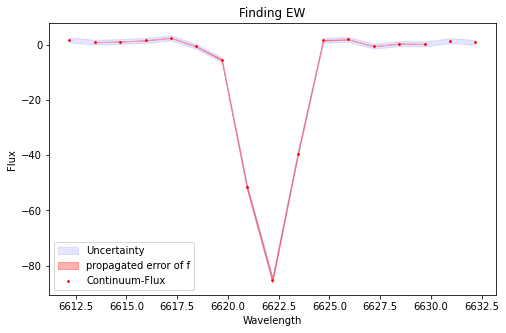

EW= -2.174593236473745  at (i,j)= 20 , 11
sigma f is  [2.14185376e-10 9.31630005e-08 8.93329080e-06 3.78817149e-04
 7.63261907e-03 7.47917221e-02 3.60016135e-01 8.55261138e-01
 1.00449297e+00 5.83044245e-01 1.66802316e-01 2.33755671e-02
 1.58327010e-03 5.01201575e-05 6.52940420e-07            nan
            nan]
 


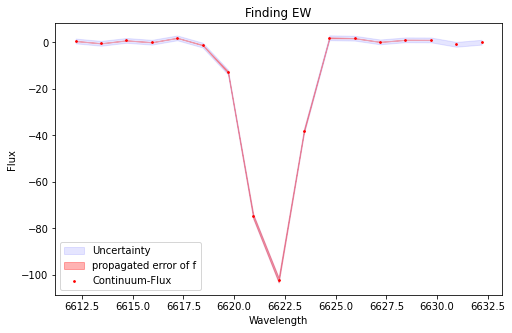

EW= -6.766768730716996  at (i,j)= 20 , 12
sigma f is  [6.88303598e-10 1.27313974e-07 1.10078606e-05 4.58597008e-04
 9.32431299e-03 9.31209045e-02 4.58382349e-01 1.11417616e+00
 1.33828579e+00 7.94238871e-01 2.32647069e-01 3.35580952e-02
 2.37363073e-03 8.16757132e-05 1.34477225e-06 1.01487228e-08
 2.88930836e-11]
 


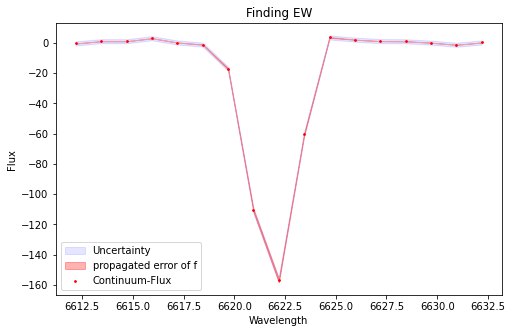

EW= -15.406629423196144  at (i,j)= 20 , 13
sigma f is  [3.21494146e-09 4.05541478e-07 2.61035079e-05 8.58171209e-04
 1.44250143e-02 1.24108574e-01 5.47126618e-01 1.23698426e+00
 1.43516742e+00 8.54706574e-01 2.61243807e-01 4.09601888e-02
 3.29158974e-03 1.35436255e-04 2.85019553e-06 3.06450026e-08
 1.68176063e-10]
 


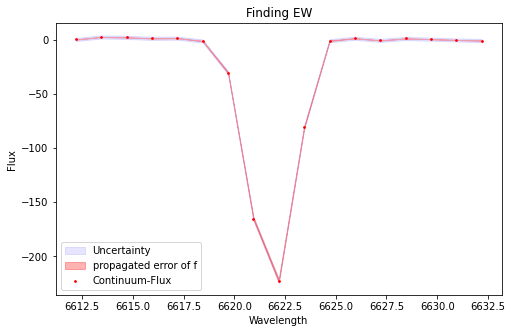

EW= -25.42981053567546  at (i,j)= 20 , 14
sigma f is  [4.87329690e-10 1.01474263e-07 9.46393522e-06 4.11203625e-04
 8.45344348e-03 8.28413412e-02 3.88512302e-01 8.73745613e-01
 9.43025893e-01 4.88325858e-01 1.21158786e-01 1.43620332e-02
 8.08989937e-04 2.14253662e-05 2.60489373e-07 1.35112698e-09
 1.41986731e-12]
 


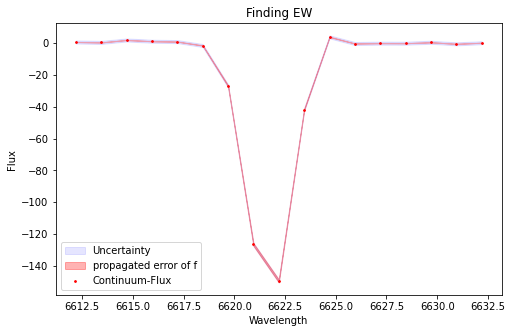

EW= -19.250128712831092  at (i,j)= 20 , 15
sigma f is  [           nan            nan            nan 1.84247920e-04
 6.30801026e-03 8.27645426e-02 4.58453383e-01 1.10055705e+00
 1.15382928e+00 5.27118656e-01 1.03431770e-01 8.32341189e-03
 2.14910416e-04            nan            nan            nan
            nan]
 


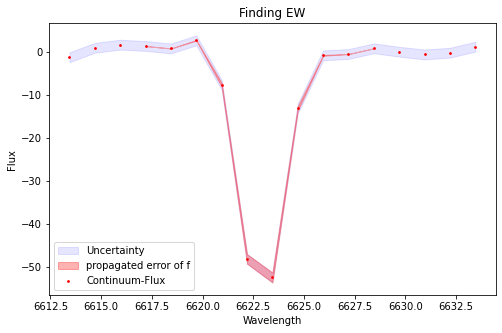

EW= -8.453438141154502  at (i,j)= 21 , 0
sigma f is  [           nan            nan            nan            nan
 2.32210676e-04 5.85654120e-03 5.92249827e-02 2.66999361e-01
 5.51478229e-01 5.25633214e-01 2.30184331e-01 4.53568148e-02
 3.73394190e-03 5.23368258e-05            nan            nan
            nan]
 


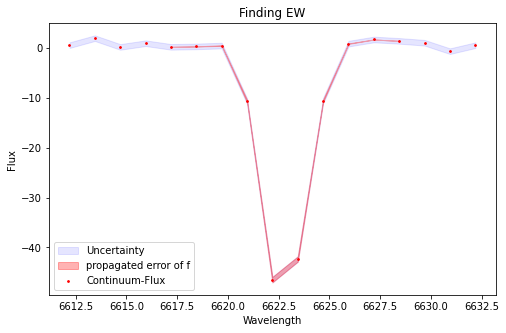

EW= -7.34734067941013  at (i,j)= 21 , 1
sigma f is  [1.05932882e-08 1.16581374e-06 6.42746038e-05 1.77794994e-03
 2.47561516e-02 1.74558935e-01 6.29297779e-01 1.17431518e+00
 1.14686511e+00 5.88312103e-01 1.57530666e-01 2.17556578e-02
 1.53143679e-03 5.44796682e-05 9.74433738e-07 8.73965092e-09
 3.92599742e-11]
 


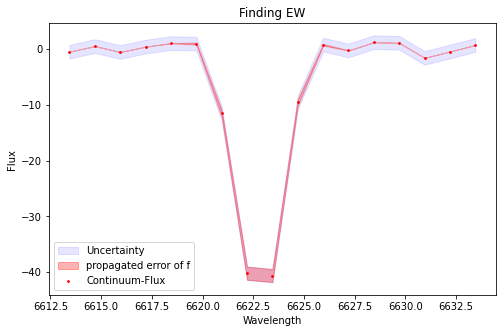

EW= -7.213086951182901  at (i,j)= 21 , 2
sigma f is  [           nan            nan            nan 1.82158499e-05
 7.55334804e-04 1.18131316e-02 8.63108649e-02 3.07677870e-01
 5.42817180e-01 4.75531497e-01 2.05901183e-01 4.33266919e-02
 4.20265793e-03 1.36801451e-04            nan            nan
            nan]
 


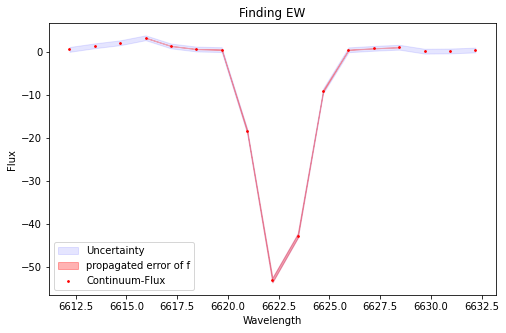

EW= -8.280562751136827  at (i,j)= 21 , 3
sigma f is  [           nan 1.43930673e-08 1.81633180e-06 9.76123163e-05
 2.53351489e-03 3.28357611e-02 2.15383057e-01 7.19531721e-01
 1.22774548e+00 1.07077451e+00 4.76778187e-01 1.08006134e-01
 1.23554800e-02 7.02269505e-04 1.90003328e-05 2.01161091e-07
            nan]
 


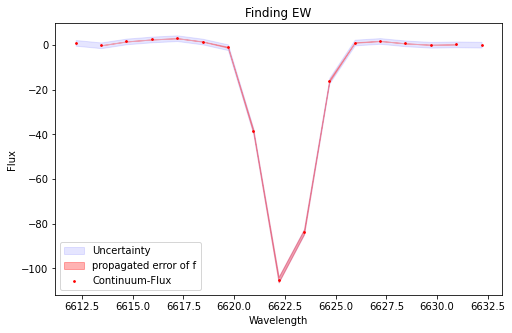

EW= -15.01296603050932  at (i,j)= 21 , 4
sigma f is  [1.70083671e-09 1.72509303e-07 9.58799482e-06 2.92287993e-04
 4.89247623e-03 4.50187202e-02 2.27995978e-01 6.36230484e-01
 9.79129015e-01 8.31445354e-01 3.89613642e-01 1.00712005e-01
 1.43497081e-02 1.12581348e-03 4.85776801e-05 1.15141751e-06
 1.49750276e-08]
 


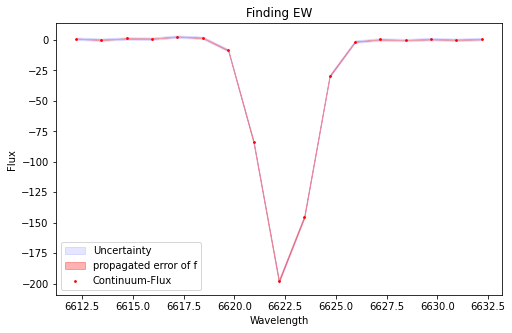

EW= -26.527983537713467  at (i,j)= 21 , 5
sigma f is  [1.72059544e-10 3.75034524e-08 3.77243861e-06 1.84975174e-04
 4.50888338e-03 5.51368552e-02 3.39857617e-01 1.05861925e+00
 1.66837258e+00 1.33059449e+00 5.36632022e-01 1.09236187e-01
 1.11826322e-02 5.71832566e-04 1.44078229e-05 1.73022192e-07
 8.75381393e-10]
 


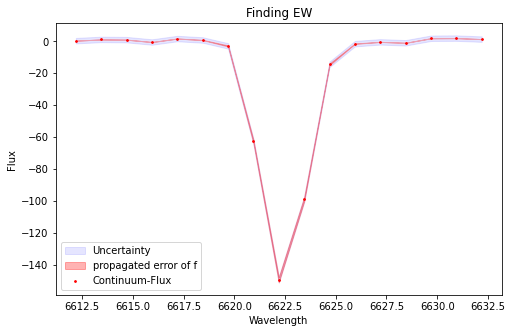

EW= -19.701101997027237  at (i,j)= 21 , 6
sigma f is  [           nan            nan            nan 2.59118574e-05
 1.19966134e-03 2.10406034e-02 1.58184176e-01 5.25901413e-01
 7.80930313e-01 5.18021159e-01 1.52039823e-01 1.91605994e-02
 9.22628060e-04            nan            nan            nan
            nan]
 


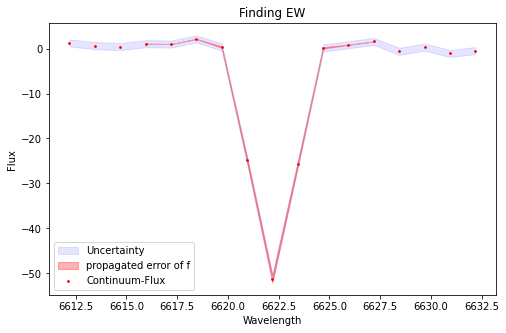

EW= -6.039426003921591  at (i,j)= 21 , 7
sigma f is  [4.99163651e-13 4.46760362e-10 1.56144645e-07 2.13123554e-05
 1.13750909e-03 2.38337957e-02 1.97760577e-01 6.60180615e-01
 9.05735833e-01 5.19012688e-01 1.23979687e-01 1.21220370e-02
 4.75158900e-04 7.36010201e-06 4.47093909e-08 1.06160474e-10
 9.84338316e-14]
 


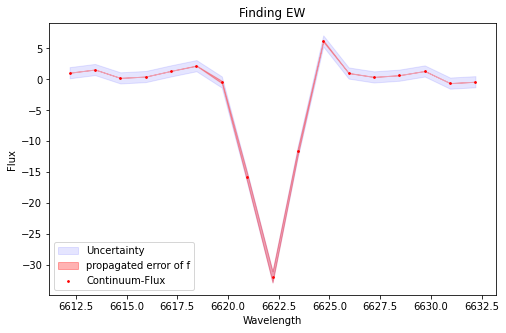

EW= -2.5776382118514145  at (i,j)= 21 , 8
sigma f is  [           nan            nan            nan            nan
 8.86467717e-04 3.05307057e-02 3.21034558e-01 1.18552299e+00
 1.58102052e+00 7.59049183e-01 1.25996346e-01 5.71446866e-03
            nan            nan            nan            nan
            nan]
 


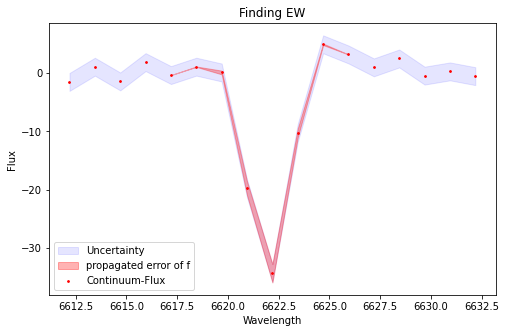

EW= -1.2235558819559325  at (i,j)= 21 , 9
sigma f is  [           nan            nan            nan 4.54027484e-04
 1.51703130e-02 2.12513017e-01 1.35696034e+00 4.04631011e+00
 5.68009853e+00 3.75326970e+00 1.15768835e+00 1.62567223e-01
 9.52162259e-03            nan            nan            nan
            nan]
 


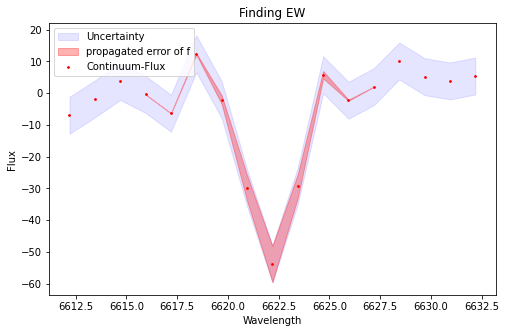

EW= -0.49631746720681674  at (i,j)= 21 , 10
sigma f is  [           nan            nan 3.19813162e-06 2.14382184e-04
 5.90435836e-03 7.33118405e-02 4.21632266e-01 1.13511465e+00
 1.43595305e+00 8.53140981e-01 2.36851354e-01 3.03236145e-02
 1.72869217e-03 3.81327014e-05            nan            nan
            nan]
 


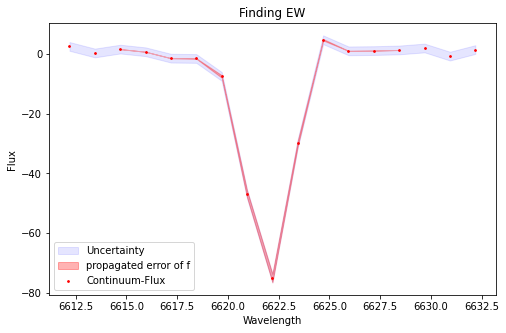

EW= -1.0987619947266816  at (i,j)= 21 , 11
sigma f is  [2.10974079e-10 6.46478250e-08 6.67249201e-06 3.08488760e-04
 6.72750818e-03 7.05035617e-02 3.58063665e-01 8.84797771e-01
 1.06546084e+00 6.25052326e-01 1.78242002e-01 2.45809272e-02
 1.62192549e-03 4.99432057e-05 6.63049007e-07 1.25437126e-09
            nan]
 


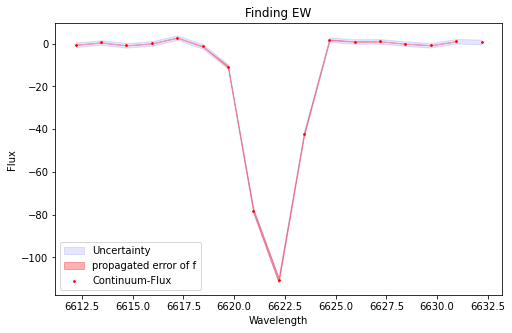

EW= -6.586898003455215  at (i,j)= 21 , 12
sigma f is  [2.71230886e-10 5.36526842e-08 4.99676687e-06 2.22860203e-04
 4.79941352e-03 5.01287240e-02 2.54577919e-01 6.29483160e-01
 7.58267802e-01 4.44928379e-01 1.27068626e-01 1.76333755e-02
 1.18541202e-03 3.83977593e-05 5.93207948e-07 4.27383008e-09
 1.34374956e-11]
 


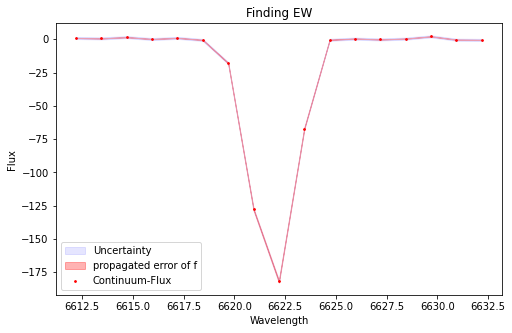

EW= -18.05482138943998  at (i,j)= 21 , 13
sigma f is  [1.70669030e-09 2.38576105e-07 1.66142778e-05 5.76979927e-04
 1.00036442e-02 8.66941448e-02 3.75965858e-01 8.16673633e-01
 8.89137055e-01 4.85297793e-01 1.32761183e-01 1.81920305e-02
 1.24745789e-03 4.27575663e-05 7.31689273e-07 6.24414252e-09
 2.65465406e-11]
 


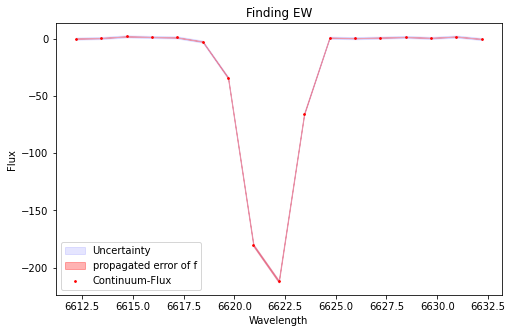

EW= -26.885657656803993  at (i,j)= 21 , 14
sigma f is  [1.10101019e-09 2.05198803e-07 1.81415679e-05 7.61546905e-04
 1.51942744e-02 1.44235069e-01 6.52053048e-01 1.40491943e+00
 1.44340957e+00 7.07225309e-01 1.65216877e-01 1.83920892e-02
 9.74827691e-04 2.45764183e-05 2.94411985e-07 1.67419327e-09
 4.51518401e-12]
 


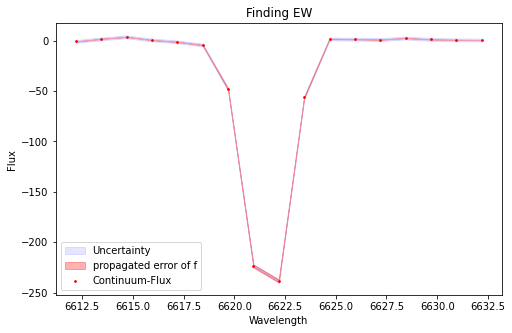

EW= -33.1601534075955  at (i,j)= 21 , 15
sigma f is  [1.81215182e-09 3.30898712e-07 2.38869102e-05 8.12623932e-04
 1.35661195e-02 1.12882475e-01 4.71572443e-01 9.92482238e-01
 1.05362869e+00 5.63927287e-01 1.51799400e-01 2.04404166e-02
 1.36145487e-03 4.36857487e-05 6.19451208e-07            nan
            nan]
 


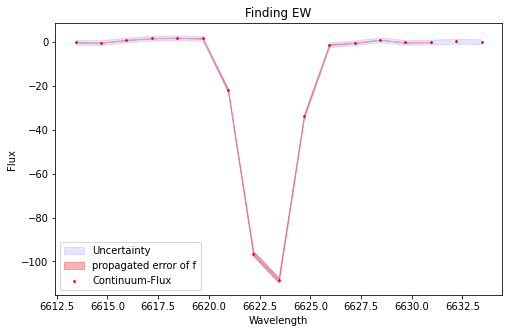

EW= -21.263455863107282  at (i,j)= 22 , 0
sigma f is  [3.75266749e-09 4.92491950e-07 3.21308385e-05 1.04368779e-03
 1.69107675e-02 1.36974546e-01 5.55870406e-01 1.13248051e+00
 1.15985760e+00 5.97420466e-01 1.54663392e-01 2.00941378e-02
 1.30745339e-03 4.25090866e-05 6.89151092e-07 5.56076034e-09
 2.23002556e-11]
 


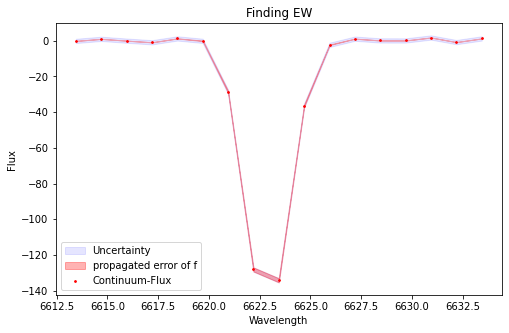

EW= -25.857299836606817  at (i,j)= 22 , 1
sigma f is  [           nan 4.69559677e-08 7.89732913e-06 4.41310332e-04
 1.04866162e-02 1.11158403e-01 5.34686931e-01 1.17548619e+00
 1.18396381e+00 5.45783918e-01 1.14578111e-01 1.08222178e-02
 4.45927418e-04 7.16013502e-06            nan            nan
            nan]
 


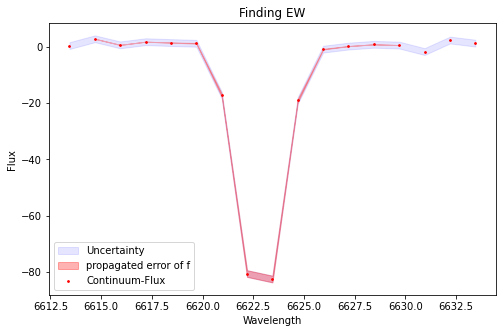

EW= -16.03103247348074  at (i,j)= 22 , 2
sigma f is  [5.54641272e-11 1.07088737e-08 1.05228721e-06 5.26900172e-05
 1.34710856e-03 1.76387052e-02 1.18771252e-01 4.13336242e-01
 7.47177687e-01 7.04147700e-01 3.46293404e-01 8.86836843e-02
 1.17751256e-02 8.06441750e-04 2.83541602e-05 5.09905803e-07
 4.67799567e-09]
 


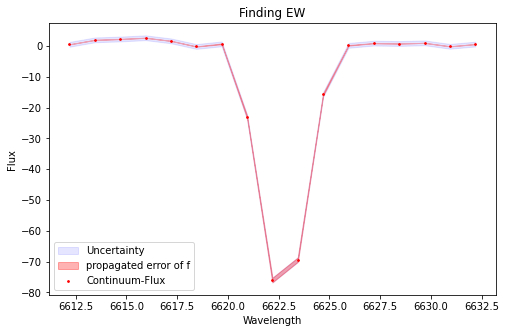

EW= -14.050729629032384  at (i,j)= 22 , 3
sigma f is  [2.85621304e-11 9.64927371e-09 1.10673641e-06 5.91813289e-05
 1.55782626e-03 2.05813139e-02 1.37688724e-01 4.68519661e-01
 8.12608066e-01 7.18791266e-01 3.23997953e-01 7.42399683e-02
 8.60425031e-03 4.99343511e-04 1.41858025e-05 1.84288270e-07
 6.15636518e-10]
 


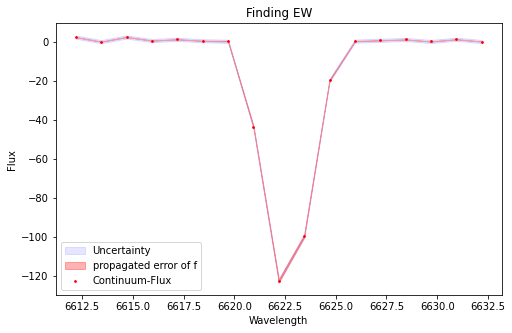

EW= -19.458881750791157  at (i,j)= 22 , 4
sigma f is  [4.37847301e-10 6.00852357e-08 4.32524771e-06 1.64334913e-04
 3.30734136e-03 3.53356467e-02 2.00691199e-01 6.06436110e-01
 9.75371324e-01 8.35075791e-01 3.80502937e-01 9.22188293e-02
 1.18760453e-02 8.11340490e-04 2.93273397e-05 5.58459152e-07
 5.55907499e-09]
 


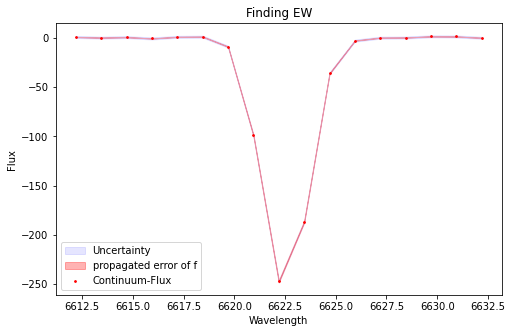

EW= -37.505595974068676  at (i,j)= 22 , 5
sigma f is  [6.83945925e-11 1.44976355e-08 1.48518860e-06 7.52511353e-05
 1.90560540e-03 2.42508009e-02 1.55573886e-01 5.03991400e-01
 8.25203546e-01 6.83015830e-01 2.85650003e-01 6.02908891e-02
 6.40788570e-03 3.41604339e-04 9.06975917e-06 1.18238333e-07
 7.31055677e-10]
 


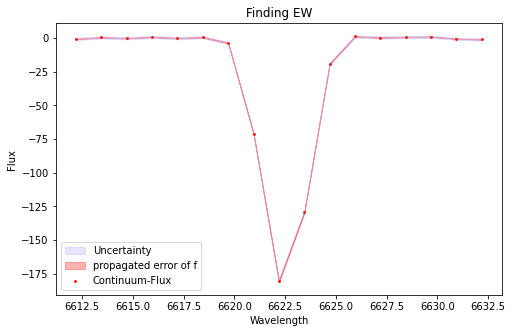

EW= -28.11389535028497  at (i,j)= 22 , 6
sigma f is  [           nan            nan            nan 1.62619448e-05
 7.46654927e-04 1.29551911e-02 9.77250536e-02 3.31487849e-01
 5.11155084e-01 3.58580215e-01 1.13448053e-01 1.57470118e-02
 8.65066786e-04            nan            nan            nan
            nan]
 


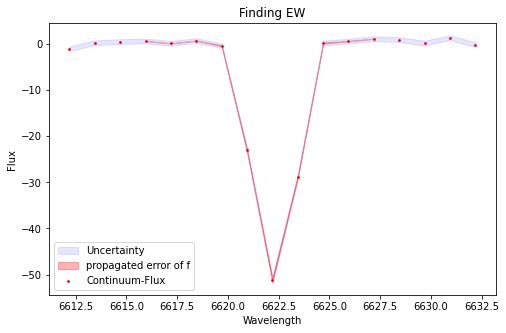

EW= -7.0174450918947615  at (i,j)= 22 , 7
sigma f is  [           nan            nan            nan            nan
 1.81143386e-04 1.07688937e-02 1.45694699e-01 6.47423251e-01
 9.90528858e-01 5.19340885e-01 8.70346688e-02 1.56936240e-03
            nan            nan            nan            nan
            nan]
 
Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/home/rita13santos/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3369, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_20894/4152575684.py", line 1, in <cell line: 1>
    map=EW_map_parametric(binned_region,wave,halpha_obs,plots=True)
  File "/home/rita13santos/PhD/extinction-ifs/functions.py", line 511, in EW_map_parametric
  File "/home/rita13santos/PhD/extinction-ifs/functions.py", line 460, in EW_parametric
  File "/home/rita13santos/anaconda3/lib/python3.9/site-packages/matplotlib/pyplot.py", line 527, in show
    return _get_backend_mod().show(*args, **kwargs)
  File "/home/rita13santos/anaconda3/lib/python3.9/site-packages/matplotlib_inline/backend_inline.py", line 41, in show
    display(
  File "/home/rita13santos/anaconda3/lib/python3.9/site-packages/IPython/core/display_functions.py", line 298, in display
    format_dict, md_dict = format(obj, include=include, 

In [267]:
map=EW_map_parametric(binned_region,wave,halpha_obs,plots=True)

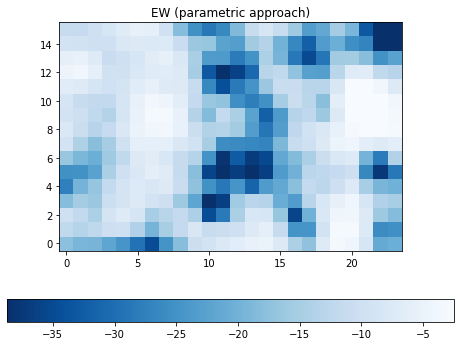

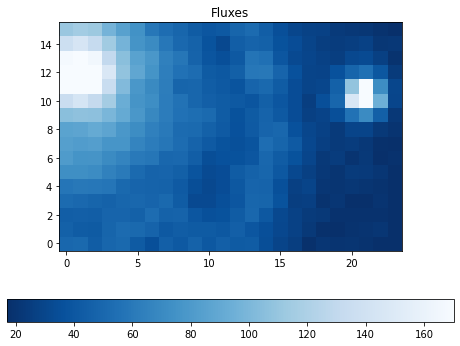

In [205]:
data= np.transpose(map)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("EW (parametric approach)")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

In [102]:
#EW_map_parametric(binned_region,wave,halpha_obs,method=1)

## EW - non parametric approach

In [103]:
x_chopped,y_chopped=chop_data(wave,binned_region[:,10,10],halpha_obs-50,halpha_obs+50)

# smooth data
y_smooth=smooth_spectra(y_chopped,kernel_size=3)

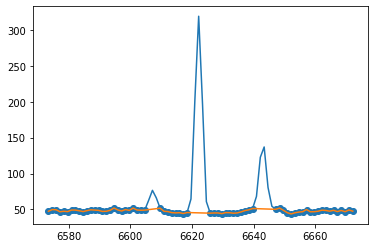

In [104]:
plt.plot(x_chopped,y_smooth)
x,y=filterout_peaks(x_chopped,y_smooth)
plt.scatter(x,y)

kernel = cosine_kernel(3)
cont = convolve(y, kernel, mode='same')

plt.plot(x,cont)

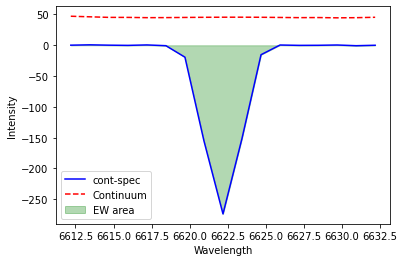

Integral of area over continuum divided by continuum: -16.86


In [106]:
max=np.argmax(y_smooth)
bound1=x_chopped[max]-10
bound2=x_chopped[max]+10
x,y=chop_data(x_chopped,y_smooth,bound1,bound2)


# continuum
x_cont,y_cont=filterout_peaks(x_chopped,y_smooth)

kernel = cosine_kernel(4)
cont = convolve(y_cont, kernel, mode='same')
interp=interp1d(x_cont, cont, kind='cubic')



continuum = interp(x)



# Compute the excess intensity above the continuum
excess_intensity = (continuum-y)/continuum

# Integrate the excess intensity (area over the continuum)
area_over_continuum = trapz(excess_intensity, x)
#continuum_summed = simps(continuum_fit(x), x)


plt.plot(x, continuum-y, label="cont-spec", color="blue")
plt.plot(x, continuum, label="Continuum", linestyle="dashed", color="red")
plt.fill_between(x, continuum-y, 0, alpha=0.3, color="green", label="EW area")
plt.xlabel("Wavelength")
plt.ylabel("Intensity")
plt.legend()
plt.show()

print(f"Integral of area over continuum divided by continuum: {area_over_continuum:.2f}")


## EW map - non parametric approach

Integral of area over continuum divided by continuum: -18.82 at (i,j)= 0 ,  0
Integral of area over continuum divided by continuum: -14.15 at (i,j)= 0 ,  1
Integral of area over continuum divided by continuum: -10.80 at (i,j)= 0 ,  2
Integral of area over continuum divided by continuum: -19.43 at (i,j)= 0 ,  3
Integral of area over continuum divided by continuum: -26.45 at (i,j)= 0 ,  4
Integral of area over continuum divided by continuum: -24.07 at (i,j)= 0 ,  5
Integral of area over continuum divided by continuum: -15.77 at (i,j)= 0 ,  6
Integral of area over continuum divided by continuum: -8.82 at (i,j)= 0 ,  7
Integral of area over continuum divided by continuum: -7.28 at (i,j)= 0 ,  8
Integral of area over continuum divided by continuum: -7.92 at (i,j)= 0 ,  9
Integral of area over continuum divided by continuum: -9.15 at (i,j)= 0 ,  10
Integral of area over continuum divided by continuum: -6.76 at (i,j)= 0 ,  11
Integral of area over continuum divided by continuum: -4.71 at (i,j

Integral of area over continuum divided by continuum: -7.21 at (i,j)= 7 ,  14
Integral of area over continuum divided by continuum: -9.36 at (i,j)= 7 ,  15
Integral of area over continuum divided by continuum: -19.62 at (i,j)= 8 ,  0
Integral of area over continuum divided by continuum: -12.70 at (i,j)= 8 ,  1
Integral of area over continuum divided by continuum: -10.91 at (i,j)= 8 ,  2
Integral of area over continuum divided by continuum: -16.49 at (i,j)= 8 ,  3
Integral of area over continuum divided by continuum: -11.73 at (i,j)= 8 ,  4
Integral of area over continuum divided by continuum: -11.69 at (i,j)= 8 ,  5
Integral of area over continuum divided by continuum: -11.14 at (i,j)= 8 ,  6
Integral of area over continuum divided by continuum: -8.51 at (i,j)= 8 ,  7
Integral of area over continuum divided by continuum: -4.74 at (i,j)= 8 ,  8
Integral of area over continuum divided by continuum: -4.76 at (i,j)= 8 ,  9
Integral of area over continuum divided by continuum: -6.34 at (i,j

Integral of area over continuum divided by continuum: -13.86 at (i,j)= 14 ,  13
Integral of area over continuum divided by continuum: -12.64 at (i,j)= 14 ,  14
Integral of area over continuum divided by continuum: -8.88 at (i,j)= 14 ,  15
Integral of area over continuum divided by continuum: -7.28 at (i,j)= 15 ,  0
Integral of area over continuum divided by continuum: -11.85 at (i,j)= 15 ,  1
Integral of area over continuum divided by continuum: -17.40 at (i,j)= 15 ,  2
Integral of area over continuum divided by continuum: -19.69 at (i,j)= 15 ,  3
Integral of area over continuum divided by continuum: -19.01 at (i,j)= 15 ,  4
Integral of area over continuum divided by continuum: -25.29 at (i,j)= 15 ,  5
Integral of area over continuum divided by continuum: -19.50 at (i,j)= 15 ,  6
Integral of area over continuum divided by continuum: -20.36 at (i,j)= 15 ,  7
Integral of area over continuum divided by continuum: -22.62 at (i,j)= 15 ,  8
Integral of area over continuum divided by continuu

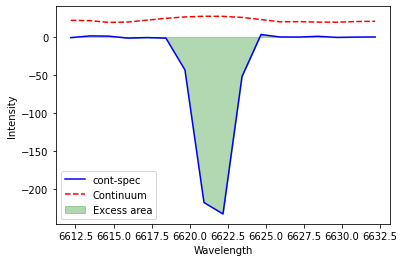

Integral of area over continuum divided by continuum: -25.34 at (i,j)= 21 ,  15


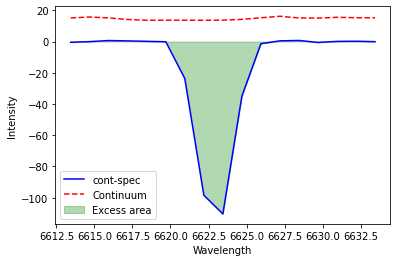

Integral of area over continuum divided by continuum: -24.40 at (i,j)= 22 ,  0


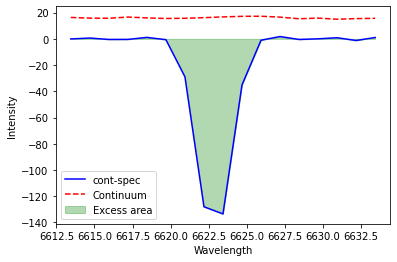

Integral of area over continuum divided by continuum: -24.79 at (i,j)= 22 ,  1


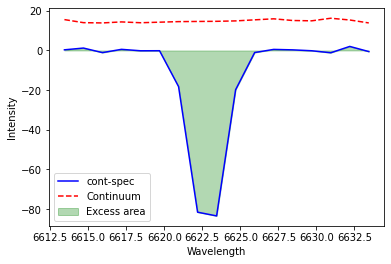

Integral of area over continuum divided by continuum: -17.10 at (i,j)= 22 ,  2


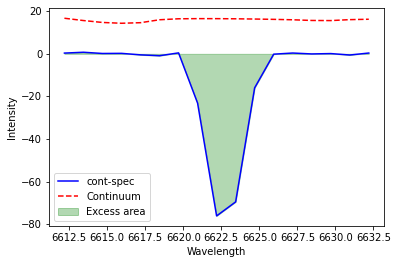

Integral of area over continuum divided by continuum: -14.01 at (i,j)= 22 ,  3


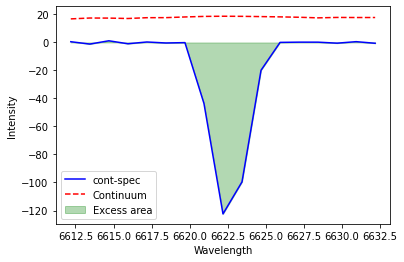

Integral of area over continuum divided by continuum: -19.18 at (i,j)= 22 ,  4


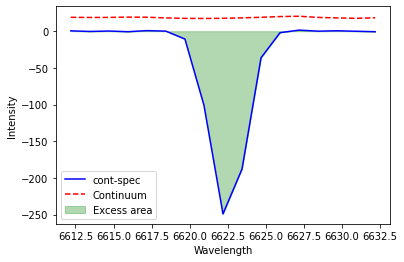

Integral of area over continuum divided by continuum: -40.98 at (i,j)= 22 ,  5


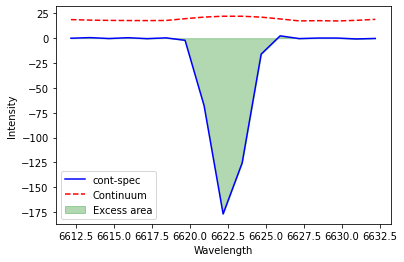

Integral of area over continuum divided by continuum: -22.07 at (i,j)= 22 ,  6


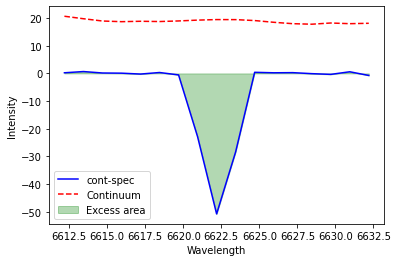

Integral of area over continuum divided by continuum: -6.46 at (i,j)= 22 ,  7


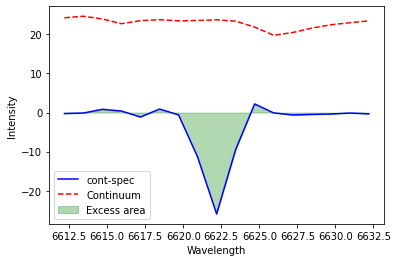

Integral of area over continuum divided by continuum: -2.46 at (i,j)= 22 ,  8


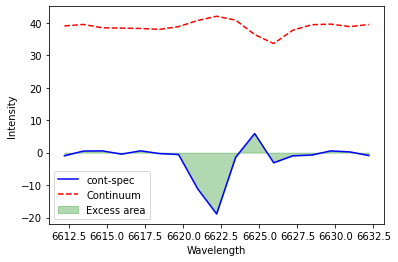

Integral of area over continuum divided by continuum: -0.91 at (i,j)= 22 ,  9


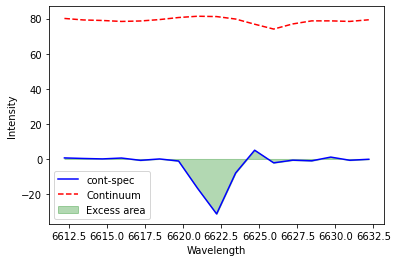

Integral of area over continuum divided by continuum: -0.87 at (i,j)= 22 ,  10


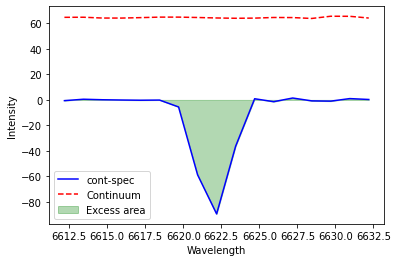

Integral of area over continuum divided by continuum: -3.68 at (i,j)= 22 ,  11


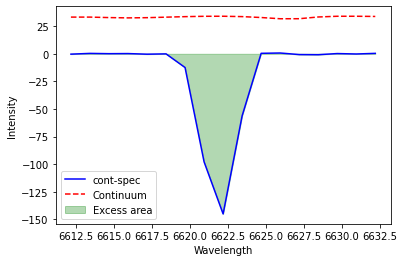

Integral of area over continuum divided by continuum: -11.50 at (i,j)= 22 ,  12


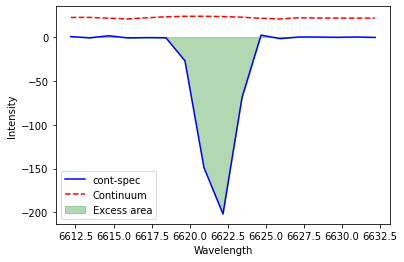

Integral of area over continuum divided by continuum: -23.73 at (i,j)= 22 ,  13


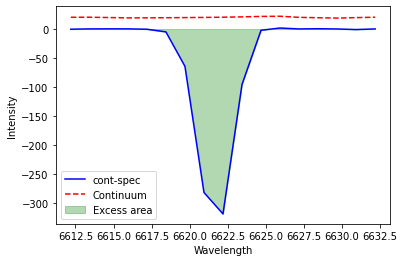

Integral of area over continuum divided by continuum: -47.29 at (i,j)= 22 ,  14


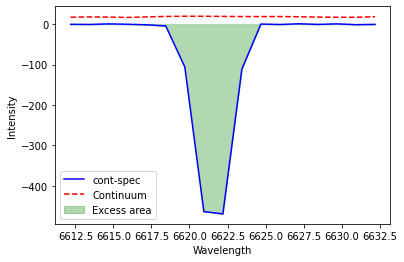

Integral of area over continuum divided by continuum: -73.91 at (i,j)= 22 ,  15


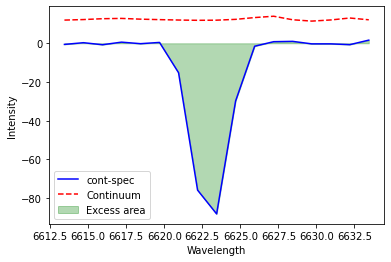

Integral of area over continuum divided by continuum: -21.82 at (i,j)= 23 ,  0


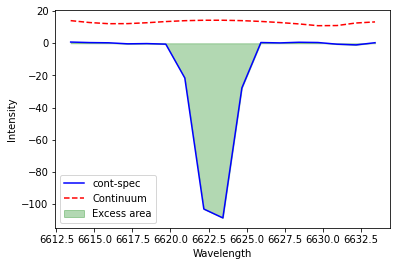

Integral of area over continuum divided by continuum: -22.87 at (i,j)= 23 ,  1


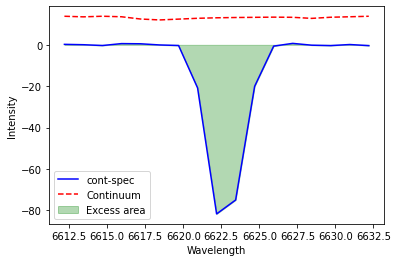

Integral of area over continuum divided by continuum: -18.82 at (i,j)= 23 ,  2


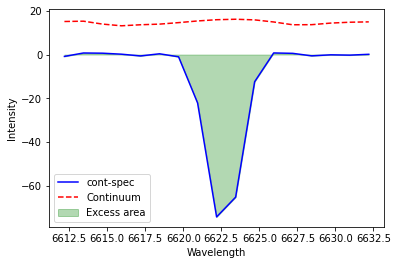

Integral of area over continuum divided by continuum: -13.65 at (i,j)= 23 ,  3


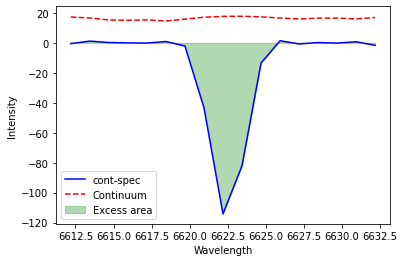

Integral of area over continuum divided by continuum: -17.91 at (i,j)= 23 ,  4


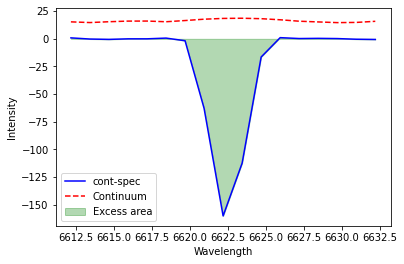

Integral of area over continuum divided by continuum: -24.02 at (i,j)= 23 ,  5


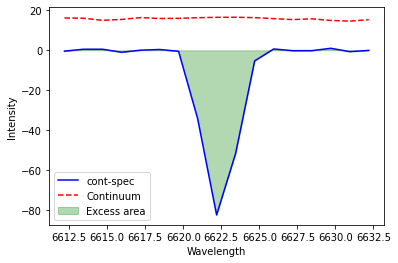

Integral of area over continuum divided by continuum: -13.15 at (i,j)= 23 ,  6


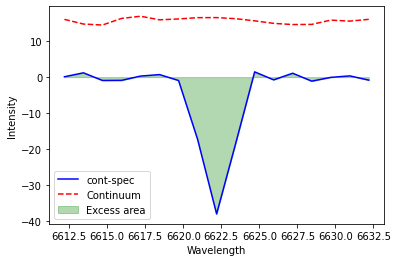

Integral of area over continuum divided by continuum: -5.56 at (i,j)= 23 ,  7


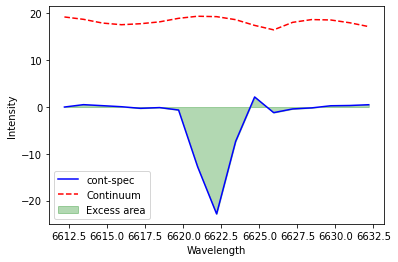

Integral of area over continuum divided by continuum: -2.72 at (i,j)= 23 ,  8


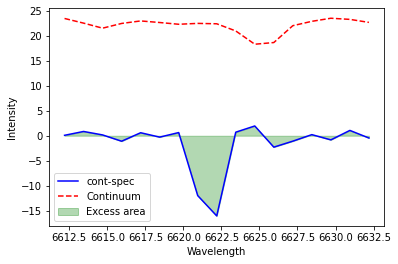

Integral of area over continuum divided by continuum: -1.51 at (i,j)= 23 ,  9


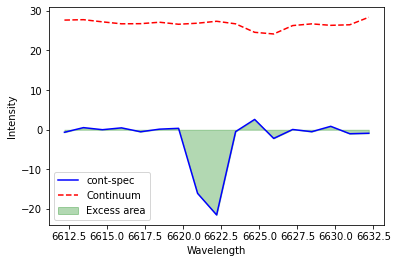

Integral of area over continuum divided by continuum: -1.75 at (i,j)= 23 ,  10


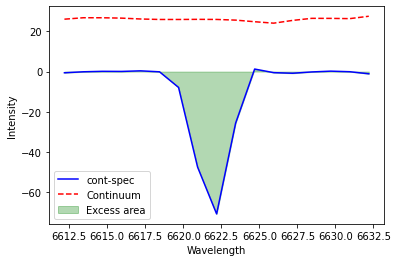

Integral of area over continuum divided by continuum: -7.36 at (i,j)= 23 ,  11


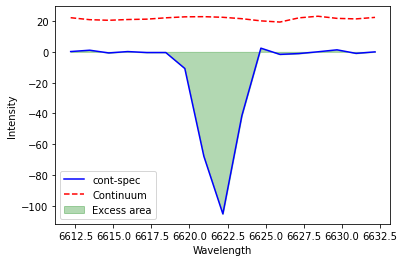

Integral of area over continuum divided by continuum: -12.57 at (i,j)= 23 ,  12


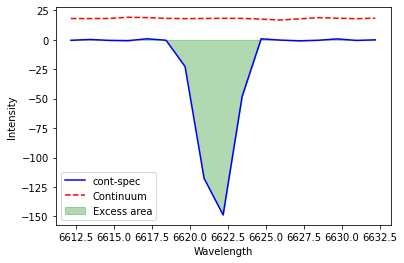

Integral of area over continuum divided by continuum: -23.10 at (i,j)= 23 ,  13


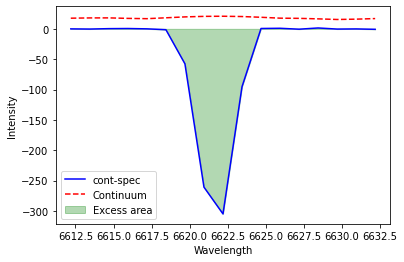

Integral of area over continuum divided by continuum: -43.81 at (i,j)= 23 ,  14


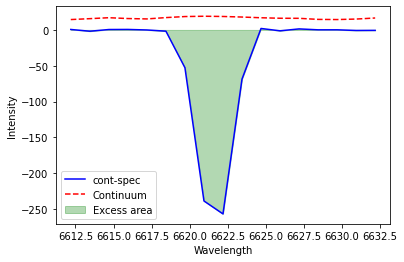

Integral of area over continuum divided by continuum: -41.29 at (i,j)= 23 ,  15


In [238]:
map_NP=EW_map_non_parametric(binned_region,wave,halpha_obs,kernel_size=3,plots=False)

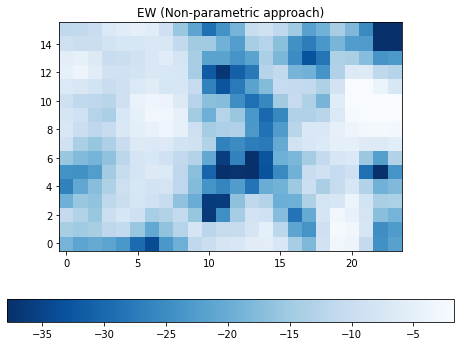

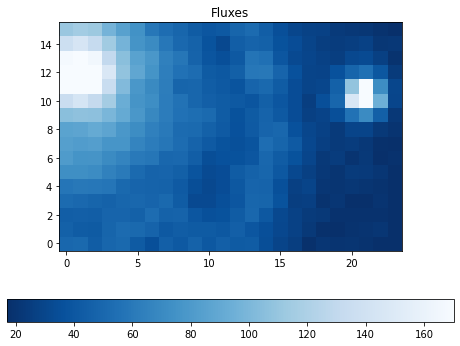

In [207]:
data= np.transpose(map_NP)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("EW (Non-parametric approach)")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

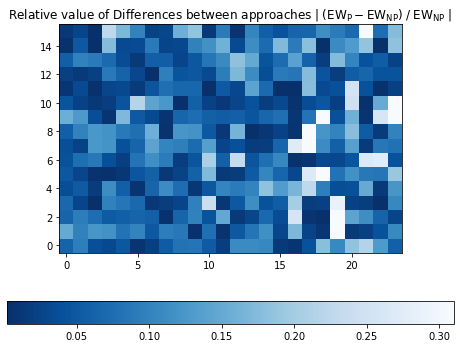

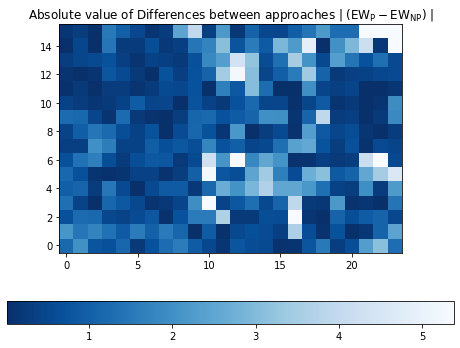

In [231]:
map_diff=abs((map_NP-map)/map_NP)

data= np.transpose(map_diff)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Relative value of Differences between approaches $|\; (\mathrm{EW_{P}}-\mathrm{EW_{NP}}) \; / \; \mathrm{EW_{NP}}\; |$")
plt.show()


###

map_diff=abs((map_NP-map))

data= np.transpose(map_diff)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Absolute value of Differences between approaches $|\; (\mathrm{EW_{P}}-\mathrm{EW_{NP}}) \;|$")
plt.show()

In [119]:
map_nonbinned_NP=EW_map_non_parametric(region,wave,halpha_obs,kernel_size=3,plots=False)

Integral of area over continuum divided by continuum: -24.94
Integral of area over continuum divided by continuum: -17.69
Integral of area over continuum divided by continuum: -16.21
Integral of area over continuum divided by continuum: -13.01
Integral of area over continuum divided by continuum: -10.80
Integral of area over continuum divided by continuum: -10.75
Integral of area over continuum divided by continuum: -11.59
Integral of area over continuum divided by continuum: -10.42
Integral of area over continuum divided by continuum: -8.90
Integral of area over continuum divided by continuum: -8.79
Integral of area over continuum divided by continuum: -6.78
Integral of area over continuum divided by continuum: -7.25
Integral of area over continuum divided by continuum: -5.96
Integral of area over continuum divided by continuum: -13.07
Integral of area over continuum divided by continuum: -18.03
Integral of area over continuum divided by continuum: -15.71
Integral of area over continu

Integral of area over continuum divided by continuum: -9.49
Integral of area over continuum divided by continuum: -14.48
Integral of area over continuum divided by continuum: -16.62
Integral of area over continuum divided by continuum: -8.34
Integral of area over continuum divided by continuum: -7.65
Integral of area over continuum divided by continuum: -5.83
Integral of area over continuum divided by continuum: -6.66
Integral of area over continuum divided by continuum: -7.97
Integral of area over continuum divided by continuum: -6.86
Integral of area over continuum divided by continuum: -8.62
Integral of area over continuum divided by continuum: -13.30
Integral of area over continuum divided by continuum: -19.42
Integral of area over continuum divided by continuum: -18.72
Integral of area over continuum divided by continuum: -20.16
Integral of area over continuum divided by continuum: -20.92
Integral of area over continuum divided by continuum: -20.16
Integral of area over continuum 

Integral of area over continuum divided by continuum: -5.21
Integral of area over continuum divided by continuum: -9.44
Integral of area over continuum divided by continuum: -10.01
Integral of area over continuum divided by continuum: -8.11
Integral of area over continuum divided by continuum: -13.64
Integral of area over continuum divided by continuum: -13.47
Integral of area over continuum divided by continuum: -10.64
Integral of area over continuum divided by continuum: -14.08
Integral of area over continuum divided by continuum: -17.39
Integral of area over continuum divided by continuum: -21.51
Integral of area over continuum divided by continuum: -20.42
Integral of area over continuum divided by continuum: -20.86
Integral of area over continuum divided by continuum: -27.68
Integral of area over continuum divided by continuum: -25.16
Integral of area over continuum divided by continuum: -24.85
Integral of area over continuum divided by continuum: -27.71
Integral of area over conti

Integral of area over continuum divided by continuum: -15.67
Integral of area over continuum divided by continuum: -12.99
Integral of area over continuum divided by continuum: -10.08
Integral of area over continuum divided by continuum: -11.50
Integral of area over continuum divided by continuum: -11.34
Integral of area over continuum divided by continuum: -9.26
Integral of area over continuum divided by continuum: -8.44
Integral of area over continuum divided by continuum: -7.89
Integral of area over continuum divided by continuum: -8.18
Integral of area over continuum divided by continuum: -8.48
Integral of area over continuum divided by continuum: -8.29
Integral of area over continuum divided by continuum: -7.92
Integral of area over continuum divided by continuum: -8.41
Integral of area over continuum divided by continuum: -8.93
Integral of area over continuum divided by continuum: -8.90
Integral of area over continuum divided by continuum: -8.61
Integral of area over continuum div

Integral of area over continuum divided by continuum: -5.04
Integral of area over continuum divided by continuum: -5.29
Integral of area over continuum divided by continuum: -6.01
Integral of area over continuum divided by continuum: -6.74
Integral of area over continuum divided by continuum: -6.42
Integral of area over continuum divided by continuum: -8.31
Integral of area over continuum divided by continuum: -7.23
Integral of area over continuum divided by continuum: -11.90
Integral of area over continuum divided by continuum: -9.27
Integral of area over continuum divided by continuum: -12.95
Integral of area over continuum divided by continuum: -10.88
Integral of area over continuum divided by continuum: -10.22
Integral of area over continuum divided by continuum: -8.10
Integral of area over continuum divided by continuum: -27.84
Integral of area over continuum divided by continuum: -32.50
Integral of area over continuum divided by continuum: -24.75
Integral of area over continuum d

Integral of area over continuum divided by continuum: -5.19
Integral of area over continuum divided by continuum: -5.44
Integral of area over continuum divided by continuum: -5.34
Integral of area over continuum divided by continuum: -5.79
Integral of area over continuum divided by continuum: -6.22
Integral of area over continuum divided by continuum: -6.70
Integral of area over continuum divided by continuum: -8.19
Integral of area over continuum divided by continuum: -8.36
Integral of area over continuum divided by continuum: -8.85
Integral of area over continuum divided by continuum: -11.53
Integral of area over continuum divided by continuum: -8.47
Integral of area over continuum divided by continuum: -9.33
Integral of area over continuum divided by continuum: -10.04
Integral of area over continuum divided by continuum: -6.91
Integral of area over continuum divided by continuum: -25.47
Integral of area over continuum divided by continuum: -20.19
Integral of area over continuum divi

Integral of area over continuum divided by continuum: -10.18
Integral of area over continuum divided by continuum: -8.71
Integral of area over continuum divided by continuum: -8.50
Integral of area over continuum divided by continuum: -22.44
Integral of area over continuum divided by continuum: -26.16
Integral of area over continuum divided by continuum: -19.88
Integral of area over continuum divided by continuum: -15.10
Integral of area over continuum divided by continuum: -14.52
Integral of area over continuum divided by continuum: -8.62
Integral of area over continuum divided by continuum: -9.58
Integral of area over continuum divided by continuum: -9.22
Integral of area over continuum divided by continuum: -15.04
Integral of area over continuum divided by continuum: -7.78
Integral of area over continuum divided by continuum: -7.44
Integral of area over continuum divided by continuum: -16.92
Integral of area over continuum divided by continuum: -17.61
Integral of area over continuum

Integral of area over continuum divided by continuum: -14.69
Integral of area over continuum divided by continuum: -14.91
Integral of area over continuum divided by continuum: -13.09
Integral of area over continuum divided by continuum: -13.56
Integral of area over continuum divided by continuum: -11.32
Integral of area over continuum divided by continuum: -12.55
Integral of area over continuum divided by continuum: -12.01
Integral of area over continuum divided by continuum: -12.96
Integral of area over continuum divided by continuum: -10.75
Integral of area over continuum divided by continuum: -11.49
Integral of area over continuum divided by continuum: -14.16
Integral of area over continuum divided by continuum: -12.26
Integral of area over continuum divided by continuum: -14.45
Integral of area over continuum divided by continuum: -11.37
Integral of area over continuum divided by continuum: -10.81
Integral of area over continuum divided by continuum: -10.97
Integral of area over co

Integral of area over continuum divided by continuum: -14.64
Integral of area over continuum divided by continuum: -14.62
Integral of area over continuum divided by continuum: -7.79
Integral of area over continuum divided by continuum: -11.85
Integral of area over continuum divided by continuum: -6.47
Integral of area over continuum divided by continuum: -5.02
Integral of area over continuum divided by continuum: -5.29
Integral of area over continuum divided by continuum: -6.76
Integral of area over continuum divided by continuum: -5.65
Integral of area over continuum divided by continuum: -6.00
Integral of area over continuum divided by continuum: -6.22
Integral of area over continuum divided by continuum: -5.42
Integral of area over continuum divided by continuum: -6.11
Integral of area over continuum divided by continuum: -10.70
Integral of area over continuum divided by continuum: -10.39
Integral of area over continuum divided by continuum: -11.32
Integral of area over continuum di

Integral of area over continuum divided by continuum: -10.63
Integral of area over continuum divided by continuum: -11.47
Integral of area over continuum divided by continuum: -12.82
Integral of area over continuum divided by continuum: -10.63
Integral of area over continuum divided by continuum: -12.38
Integral of area over continuum divided by continuum: -14.37
Integral of area over continuum divided by continuum: -16.74
Integral of area over continuum divided by continuum: -12.03
Integral of area over continuum divided by continuum: -12.94
Integral of area over continuum divided by continuum: -15.15
Integral of area over continuum divided by continuum: -13.97
Integral of area over continuum divided by continuum: -11.23
Integral of area over continuum divided by continuum: -13.16
Integral of area over continuum divided by continuum: -10.78
Integral of area over continuum divided by continuum: -8.23
Integral of area over continuum divided by continuum: -6.86
Integral of area over cont

Integral of area over continuum divided by continuum: -11.02
Integral of area over continuum divided by continuum: -7.01
Integral of area over continuum divided by continuum: -11.74
Integral of area over continuum divided by continuum: -11.39
Integral of area over continuum divided by continuum: -8.13
Integral of area over continuum divided by continuum: -9.08
Integral of area over continuum divided by continuum: -5.26
Integral of area over continuum divided by continuum: -9.46
Integral of area over continuum divided by continuum: -10.30
Integral of area over continuum divided by continuum: -9.20
Integral of area over continuum divided by continuum: -10.52
Integral of area over continuum divided by continuum: -12.88
Integral of area over continuum divided by continuum: -13.09
Integral of area over continuum divided by continuum: -12.88
Integral of area over continuum divided by continuum: -15.92
Integral of area over continuum divided by continuum: -11.08
Integral of area over continuu

Integral of area over continuum divided by continuum: -7.17
Integral of area over continuum divided by continuum: -10.86
Integral of area over continuum divided by continuum: -9.93
Integral of area over continuum divided by continuum: -8.65
Integral of area over continuum divided by continuum: -9.43
Integral of area over continuum divided by continuum: -8.11
Integral of area over continuum divided by continuum: -8.05
Integral of area over continuum divided by continuum: -8.48
Integral of area over continuum divided by continuum: -8.21
Integral of area over continuum divided by continuum: -8.51
Integral of area over continuum divided by continuum: -8.11
Integral of area over continuum divided by continuum: -10.04
Integral of area over continuum divided by continuum: -7.29
Integral of area over continuum divided by continuum: -9.77
Integral of area over continuum divided by continuum: -6.25
Integral of area over continuum divided by continuum: -4.50
Integral of area over continuum divide

Integral of area over continuum divided by continuum: -4.76
Integral of area over continuum divided by continuum: -6.73
Integral of area over continuum divided by continuum: -9.91
Integral of area over continuum divided by continuum: -8.35
Integral of area over continuum divided by continuum: -8.15
Integral of area over continuum divided by continuum: -6.62
Integral of area over continuum divided by continuum: -5.03
Integral of area over continuum divided by continuum: -7.53
Integral of area over continuum divided by continuum: -5.33
Integral of area over continuum divided by continuum: -4.82
Integral of area over continuum divided by continuum: -5.60
Integral of area over continuum divided by continuum: -4.25
Integral of area over continuum divided by continuum: -4.73
Integral of area over continuum divided by continuum: -5.67
Integral of area over continuum divided by continuum: -4.01
Integral of area over continuum divided by continuum: -5.45
Integral of area over continuum divided 

Integral of area over continuum divided by continuum: -2.96
Integral of area over continuum divided by continuum: -4.62
Integral of area over continuum divided by continuum: -4.05
Integral of area over continuum divided by continuum: -3.44
Integral of area over continuum divided by continuum: -3.35
Integral of area over continuum divided by continuum: -4.39
Integral of area over continuum divided by continuum: -4.66
Integral of area over continuum divided by continuum: -3.90
Integral of area over continuum divided by continuum: -3.80
Integral of area over continuum divided by continuum: -4.03
Integral of area over continuum divided by continuum: -5.09
Integral of area over continuum divided by continuum: -5.11
Integral of area over continuum divided by continuum: -5.16
Integral of area over continuum divided by continuum: -6.86
Integral of area over continuum divided by continuum: -5.11
Integral of area over continuum divided by continuum: -4.78
Integral of area over continuum divided 

Integral of area over continuum divided by continuum: -8.78
Integral of area over continuum divided by continuum: -8.63
Integral of area over continuum divided by continuum: -8.60
Integral of area over continuum divided by continuum: -6.96
Integral of area over continuum divided by continuum: -9.27
Integral of area over continuum divided by continuum: -8.45
Integral of area over continuum divided by continuum: -7.96
Integral of area over continuum divided by continuum: -6.95
Integral of area over continuum divided by continuum: -6.99
Integral of area over continuum divided by continuum: -7.74
Integral of area over continuum divided by continuum: -5.88
Integral of area over continuum divided by continuum: -7.05
Integral of area over continuum divided by continuum: -5.27
Integral of area over continuum divided by continuum: -4.29
Integral of area over continuum divided by continuum: -5.21
Integral of area over continuum divided by continuum: -4.49
Integral of area over continuum divided 

Integral of area over continuum divided by continuum: -5.65
Integral of area over continuum divided by continuum: -4.53
Integral of area over continuum divided by continuum: -7.14
Integral of area over continuum divided by continuum: -5.61
Integral of area over continuum divided by continuum: -7.63
Integral of area over continuum divided by continuum: -4.89
Integral of area over continuum divided by continuum: -6.47
Integral of area over continuum divided by continuum: -6.26
Integral of area over continuum divided by continuum: -7.20
Integral of area over continuum divided by continuum: -8.33
Integral of area over continuum divided by continuum: -9.54
Integral of area over continuum divided by continuum: -7.04
Integral of area over continuum divided by continuum: -6.66
Integral of area over continuum divided by continuum: -5.40
Integral of area over continuum divided by continuum: -8.19
Integral of area over continuum divided by continuum: -5.02
Integral of area over continuum divided 

Integral of area over continuum divided by continuum: -6.93
Integral of area over continuum divided by continuum: -8.13
Integral of area over continuum divided by continuum: -6.76
Integral of area over continuum divided by continuum: -6.07
Integral of area over continuum divided by continuum: -4.34
Integral of area over continuum divided by continuum: -5.74
Integral of area over continuum divided by continuum: -38.66
Integral of area over continuum divided by continuum: -28.27
Integral of area over continuum divided by continuum: -23.47
Integral of area over continuum divided by continuum: -26.93
Integral of area over continuum divided by continuum: -15.68
Integral of area over continuum divided by continuum: -24.20
Integral of area over continuum divided by continuum: -20.49
Integral of area over continuum divided by continuum: -26.67
Integral of area over continuum divided by continuum: -11.84
Integral of area over continuum divided by continuum: -14.78
Integral of area over continuu

Integral of area over continuum divided by continuum: -36.60
Integral of area over continuum divided by continuum: -30.04
Integral of area over continuum divided by continuum: -22.32
Integral of area over continuum divided by continuum: -19.64
Integral of area over continuum divided by continuum: -15.05
Integral of area over continuum divided by continuum: -14.77
Integral of area over continuum divided by continuum: -10.22
Integral of area over continuum divided by continuum: -15.38
Integral of area over continuum divided by continuum: -7.78
Integral of area over continuum divided by continuum: -13.01
Integral of area over continuum divided by continuum: -12.44
Integral of area over continuum divided by continuum: -10.80
Integral of area over continuum divided by continuum: -12.50
Integral of area over continuum divided by continuum: -21.46
Integral of area over continuum divided by continuum: -8.30
Integral of area over continuum divided by continuum: -10.34
Integral of area over cont

Integral of area over continuum divided by continuum: -7.76
Integral of area over continuum divided by continuum: -9.93
Integral of area over continuum divided by continuum: -10.79
Integral of area over continuum divided by continuum: -11.29
Integral of area over continuum divided by continuum: -11.42
Integral of area over continuum divided by continuum: -14.72
Integral of area over continuum divided by continuum: -13.28
Integral of area over continuum divided by continuum: -11.65
Integral of area over continuum divided by continuum: -13.96
Integral of area over continuum divided by continuum: -15.36
Integral of area over continuum divided by continuum: -11.54
Integral of area over continuum divided by continuum: -6.91
Integral of area over continuum divided by continuum: -7.93
Integral of area over continuum divided by continuum: -7.81
Integral of area over continuum divided by continuum: -8.24
Integral of area over continuum divided by continuum: -7.51
Integral of area over continuum

Integral of area over continuum divided by continuum: -17.84
Integral of area over continuum divided by continuum: -9.69
Integral of area over continuum divided by continuum: -9.16
Integral of area over continuum divided by continuum: -7.64
Integral of area over continuum divided by continuum: -8.83
Integral of area over continuum divided by continuum: -13.15
Integral of area over continuum divided by continuum: -12.38
Integral of area over continuum divided by continuum: -10.78
Integral of area over continuum divided by continuum: -6.84
Integral of area over continuum divided by continuum: -5.92
Integral of area over continuum divided by continuum: -5.01
Integral of area over continuum divided by continuum: -3.92
Integral of area over continuum divided by continuum: -3.43
Integral of area over continuum divided by continuum: -4.38
Integral of area over continuum divided by continuum: -5.53
Integral of area over continuum divided by continuum: -3.05
Integral of area over continuum divi

Integral of area over continuum divided by continuum: -11.59
Integral of area over continuum divided by continuum: -12.50
Integral of area over continuum divided by continuum: -15.17
Integral of area over continuum divided by continuum: -17.73
Integral of area over continuum divided by continuum: -19.19
Integral of area over continuum divided by continuum: -20.72
Integral of area over continuum divided by continuum: -18.40
Integral of area over continuum divided by continuum: -17.65
Integral of area over continuum divided by continuum: -13.82
Integral of area over continuum divided by continuum: -11.82
Integral of area over continuum divided by continuum: -14.52
Integral of area over continuum divided by continuum: -12.82
Integral of area over continuum divided by continuum: -9.27
Integral of area over continuum divided by continuum: -10.85
Integral of area over continuum divided by continuum: -12.36
Integral of area over continuum divided by continuum: -15.56
Integral of area over con

Integral of area over continuum divided by continuum: -15.57
Integral of area over continuum divided by continuum: -14.53
Integral of area over continuum divided by continuum: -19.72
Integral of area over continuum divided by continuum: -14.08
Integral of area over continuum divided by continuum: -13.11
Integral of area over continuum divided by continuum: -10.59
Integral of area over continuum divided by continuum: -10.89
Integral of area over continuum divided by continuum: -8.81
Integral of area over continuum divided by continuum: -9.06
Integral of area over continuum divided by continuum: -7.17
Integral of area over continuum divided by continuum: -8.05
Integral of area over continuum divided by continuum: -8.39
Integral of area over continuum divided by continuum: -6.63
Integral of area over continuum divided by continuum: -5.63
Integral of area over continuum divided by continuum: -8.46
Integral of area over continuum divided by continuum: -7.62
Integral of area over continuum d

Integral of area over continuum divided by continuum: -7.13
Integral of area over continuum divided by continuum: -7.62
Integral of area over continuum divided by continuum: -10.20
Integral of area over continuum divided by continuum: -8.25
Integral of area over continuum divided by continuum: -12.03
Integral of area over continuum divided by continuum: -14.07
Integral of area over continuum divided by continuum: -12.22
Integral of area over continuum divided by continuum: -9.66
Integral of area over continuum divided by continuum: -8.98
Integral of area over continuum divided by continuum: -10.35
Integral of area over continuum divided by continuum: -11.76
Integral of area over continuum divided by continuum: -9.38
Integral of area over continuum divided by continuum: -10.06
Integral of area over continuum divided by continuum: -6.41
Integral of area over continuum divided by continuum: -7.19
Integral of area over continuum divided by continuum: -9.38
Integral of area over continuum d

Integral of area over continuum divided by continuum: -9.08
Integral of area over continuum divided by continuum: -8.44
Integral of area over continuum divided by continuum: -8.16
Integral of area over continuum divided by continuum: -8.68
Integral of area over continuum divided by continuum: -11.59
Integral of area over continuum divided by continuum: -15.32
Integral of area over continuum divided by continuum: -16.36
Integral of area over continuum divided by continuum: -18.70
Integral of area over continuum divided by continuum: -19.45
Integral of area over continuum divided by continuum: -19.19
Integral of area over continuum divided by continuum: -26.57
Integral of area over continuum divided by continuum: -18.44
Integral of area over continuum divided by continuum: -15.22
Integral of area over continuum divided by continuum: -20.78
Integral of area over continuum divided by continuum: -19.67
Integral of area over continuum divided by continuum: -15.63
Integral of area over contin

Integral of area over continuum divided by continuum: -29.11
Integral of area over continuum divided by continuum: -32.66
Integral of area over continuum divided by continuum: -8.23
Integral of area over continuum divided by continuum: -6.68
Integral of area over continuum divided by continuum: -8.68
Integral of area over continuum divided by continuum: -6.40
Integral of area over continuum divided by continuum: -6.51
Integral of area over continuum divided by continuum: -5.67
Integral of area over continuum divided by continuum: -5.04
Integral of area over continuum divided by continuum: -10.19
Integral of area over continuum divided by continuum: -11.20
Integral of area over continuum divided by continuum: -18.27
Integral of area over continuum divided by continuum: -19.91
Integral of area over continuum divided by continuum: -14.49
Integral of area over continuum divided by continuum: -25.09
Integral of area over continuum divided by continuum: -31.41
Integral of area over continuum

Integral of area over continuum divided by continuum: -66.67
Integral of area over continuum divided by continuum: -46.37
Integral of area over continuum divided by continuum: -60.03
Integral of area over continuum divided by continuum: -61.68
Integral of area over continuum divided by continuum: -29.95
Integral of area over continuum divided by continuum: -21.95
Integral of area over continuum divided by continuum: -16.95
Integral of area over continuum divided by continuum: -20.02
Integral of area over continuum divided by continuum: -19.21
Integral of area over continuum divided by continuum: -25.78
Integral of area over continuum divided by continuum: -23.58
Integral of area over continuum divided by continuum: -26.50
Integral of area over continuum divided by continuum: -31.07
Integral of area over continuum divided by continuum: -31.48
Integral of area over continuum divided by continuum: -38.01
Integral of area over continuum divided by continuum: -35.42
Integral of area over co

Integral of area over continuum divided by continuum: -14.28
Integral of area over continuum divided by continuum: -13.69
Integral of area over continuum divided by continuum: -11.88
Integral of area over continuum divided by continuum: -8.77
Integral of area over continuum divided by continuum: -10.07
Integral of area over continuum divided by continuum: -12.31
Integral of area over continuum divided by continuum: -8.78
Integral of area over continuum divided by continuum: -8.45
Integral of area over continuum divided by continuum: -8.47
Integral of area over continuum divided by continuum: -8.79
Integral of area over continuum divided by continuum: -9.53
Integral of area over continuum divided by continuum: -8.04
Integral of area over continuum divided by continuum: -8.88
Integral of area over continuum divided by continuum: -11.00
Integral of area over continuum divided by continuum: -10.42
Integral of area over continuum divided by continuum: -12.30
Integral of area over continuum 

Integral of area over continuum divided by continuum: -40.57
Integral of area over continuum divided by continuum: -36.92
Integral of area over continuum divided by continuum: -31.04
Integral of area over continuum divided by continuum: -34.12
Integral of area over continuum divided by continuum: -32.61
Integral of area over continuum divided by continuum: -22.24
Integral of area over continuum divided by continuum: -21.56
Integral of area over continuum divided by continuum: -19.50
Integral of area over continuum divided by continuum: -17.02
Integral of area over continuum divided by continuum: -15.59
Integral of area over continuum divided by continuum: -16.88
Integral of area over continuum divided by continuum: -14.52
Integral of area over continuum divided by continuum: -23.93
Integral of area over continuum divided by continuum: -20.98
Integral of area over continuum divided by continuum: -21.34
Integral of area over continuum divided by continuum: -20.84
Integral of area over co

Integral of area over continuum divided by continuum: -16.80
Integral of area over continuum divided by continuum: -18.72
Integral of area over continuum divided by continuum: -37.94
Integral of area over continuum divided by continuum: -28.08
Integral of area over continuum divided by continuum: -28.46
Integral of area over continuum divided by continuum: -29.66
Integral of area over continuum divided by continuum: -28.20
Integral of area over continuum divided by continuum: -32.52
Integral of area over continuum divided by continuum: -30.56
Integral of area over continuum divided by continuum: -33.97
Integral of area over continuum divided by continuum: -25.81
Integral of area over continuum divided by continuum: -31.89
Integral of area over continuum divided by continuum: -26.98
Integral of area over continuum divided by continuum: -35.33
Integral of area over continuum divided by continuum: -23.64
Integral of area over continuum divided by continuum: -16.40
Integral of area over co

Integral of area over continuum divided by continuum: -24.49
Integral of area over continuum divided by continuum: -21.07
Integral of area over continuum divided by continuum: -21.59
Integral of area over continuum divided by continuum: -21.81
Integral of area over continuum divided by continuum: -18.63
Integral of area over continuum divided by continuum: -20.28
Integral of area over continuum divided by continuum: -14.52
Integral of area over continuum divided by continuum: -14.80
Integral of area over continuum divided by continuum: -12.27
Integral of area over continuum divided by continuum: -11.79
Integral of area over continuum divided by continuum: -16.27
Integral of area over continuum divided by continuum: -10.66
Integral of area over continuum divided by continuum: -10.48
Integral of area over continuum divided by continuum: -14.26
Integral of area over continuum divided by continuum: -13.32
Integral of area over continuum divided by continuum: -11.17
Integral of area over co

Integral of area over continuum divided by continuum: -25.43
Integral of area over continuum divided by continuum: -21.40
Integral of area over continuum divided by continuum: -12.99
Integral of area over continuum divided by continuum: -11.31
Integral of area over continuum divided by continuum: -12.53
Integral of area over continuum divided by continuum: -11.07
Integral of area over continuum divided by continuum: -23.86
Integral of area over continuum divided by continuum: -13.55
Integral of area over continuum divided by continuum: -28.42
Integral of area over continuum divided by continuum: -38.27
Integral of area over continuum divided by continuum: -28.53
Integral of area over continuum divided by continuum: -25.49
Integral of area over continuum divided by continuum: -25.82
Integral of area over continuum divided by continuum: -19.02
Integral of area over continuum divided by continuum: -17.92
Integral of area over continuum divided by continuum: -26.02
Integral of area over co

Integral of area over continuum divided by continuum: -32.42
Integral of area over continuum divided by continuum: -38.65
Integral of area over continuum divided by continuum: -34.58
Integral of area over continuum divided by continuum: -20.79
Integral of area over continuum divided by continuum: -15.58
Integral of area over continuum divided by continuum: -20.61
Integral of area over continuum divided by continuum: -19.45
Integral of area over continuum divided by continuum: -21.09
Integral of area over continuum divided by continuum: -21.14
Integral of area over continuum divided by continuum: -21.81
Integral of area over continuum divided by continuum: -16.17
Integral of area over continuum divided by continuum: -16.96
Integral of area over continuum divided by continuum: -33.12
Integral of area over continuum divided by continuum: -15.85
Integral of area over continuum divided by continuum: -13.22
Integral of area over continuum divided by continuum: -25.73
Integral of area over co

Integral of area over continuum divided by continuum: -14.87
Integral of area over continuum divided by continuum: -16.24
Integral of area over continuum divided by continuum: -15.63
Integral of area over continuum divided by continuum: -15.72
Integral of area over continuum divided by continuum: -13.53
Integral of area over continuum divided by continuum: -11.00
Integral of area over continuum divided by continuum: -9.91
Integral of area over continuum divided by continuum: -11.20
Integral of area over continuum divided by continuum: -10.53
Integral of area over continuum divided by continuum: -6.14
Integral of area over continuum divided by continuum: -7.92
Integral of area over continuum divided by continuum: -7.19
Integral of area over continuum divided by continuum: -3.25
Integral of area over continuum divided by continuum: -1.55
Integral of area over continuum divided by continuum: -4.72
Integral of area over continuum divided by continuum: -3.14
Integral of area over continuum 

Integral of area over continuum divided by continuum: -11.39
Integral of area over continuum divided by continuum: -14.70
Integral of area over continuum divided by continuum: -17.18
Integral of area over continuum divided by continuum: -17.84
Integral of area over continuum divided by continuum: -16.88
Integral of area over continuum divided by continuum: -19.43
Integral of area over continuum divided by continuum: -24.28
Integral of area over continuum divided by continuum: -22.40
Integral of area over continuum divided by continuum: -29.89
Integral of area over continuum divided by continuum: -28.85
Integral of area over continuum divided by continuum: -24.59
Integral of area over continuum divided by continuum: -28.93
Integral of area over continuum divided by continuum: -30.17
Integral of area over continuum divided by continuum: -26.30
Integral of area over continuum divided by continuum: -24.94
Integral of area over continuum divided by continuum: -21.97
Integral of area over co

Integral of area over continuum divided by continuum: -26.94
Integral of area over continuum divided by continuum: -27.07
Integral of area over continuum divided by continuum: -26.17
Integral of area over continuum divided by continuum: -31.72
Integral of area over continuum divided by continuum: -38.31
Integral of area over continuum divided by continuum: -30.67
Integral of area over continuum divided by continuum: -21.14
Integral of area over continuum divided by continuum: -19.82
Integral of area over continuum divided by continuum: -19.56
Integral of area over continuum divided by continuum: -27.18
Integral of area over continuum divided by continuum: -26.33
Integral of area over continuum divided by continuum: -13.68
Integral of area over continuum divided by continuum: -12.14
Integral of area over continuum divided by continuum: -10.73
Integral of area over continuum divided by continuum: -13.15
Integral of area over continuum divided by continuum: -8.45
Integral of area over con

Integral of area over continuum divided by continuum: -18.43
Integral of area over continuum divided by continuum: -21.17
Integral of area over continuum divided by continuum: -22.47
Integral of area over continuum divided by continuum: -17.27
Integral of area over continuum divided by continuum: -31.77
Integral of area over continuum divided by continuum: -34.73
Integral of area over continuum divided by continuum: -41.97
Integral of area over continuum divided by continuum: -15.26
Integral of area over continuum divided by continuum: -29.38
Integral of area over continuum divided by continuum: -15.11
Integral of area over continuum divided by continuum: -12.95
Integral of area over continuum divided by continuum: -10.56
Integral of area over continuum divided by continuum: -11.20
Integral of area over continuum divided by continuum: -13.67
Integral of area over continuum divided by continuum: -8.66
Integral of area over continuum divided by continuum: -11.96
Integral of area over con

Integral of area over continuum divided by continuum: -7.51
Integral of area over continuum divided by continuum: -7.16
Integral of area over continuum divided by continuum: -9.30
Integral of area over continuum divided by continuum: -5.68
Integral of area over continuum divided by continuum: -11.58
Integral of area over continuum divided by continuum: -6.41
Integral of area over continuum divided by continuum: -10.17
Integral of area over continuum divided by continuum: -5.52
Integral of area over continuum divided by continuum: -8.35
Integral of area over continuum divided by continuum: -14.16
Integral of area over continuum divided by continuum: -11.06
Integral of area over continuum divided by continuum: -12.96
Integral of area over continuum divided by continuum: -20.49
Integral of area over continuum divided by continuum: -19.78
Integral of area over continuum divided by continuum: -21.20
Integral of area over continuum divided by continuum: -22.60
Integral of area over continuum

Integral of area over continuum divided by continuum: -30.50
Integral of area over continuum divided by continuum: -25.12
Integral of area over continuum divided by continuum: -29.72
Integral of area over continuum divided by continuum: -27.62
Integral of area over continuum divided by continuum: -22.78
Integral of area over continuum divided by continuum: -17.24
Integral of area over continuum divided by continuum: -21.39
Integral of area over continuum divided by continuum: -15.79
Integral of area over continuum divided by continuum: -11.86
Integral of area over continuum divided by continuum: -11.64
Integral of area over continuum divided by continuum: -10.58
Integral of area over continuum divided by continuum: -5.26
Integral of area over continuum divided by continuum: -10.80
Integral of area over continuum divided by continuum: -17.63
Integral of area over continuum divided by continuum: -14.51
Integral of area over continuum divided by continuum: -26.65
Integral of area over con

Integral of area over continuum divided by continuum: -19.97
Integral of area over continuum divided by continuum: -24.94
Integral of area over continuum divided by continuum: -21.33
Integral of area over continuum divided by continuum: -26.59
Integral of area over continuum divided by continuum: -19.03
Integral of area over continuum divided by continuum: -16.64
Integral of area over continuum divided by continuum: -18.71
Integral of area over continuum divided by continuum: -18.88
Integral of area over continuum divided by continuum: -13.63
Integral of area over continuum divided by continuum: -6.64
Integral of area over continuum divided by continuum: -12.15
Integral of area over continuum divided by continuum: -19.15
Integral of area over continuum divided by continuum: -19.90
Integral of area over continuum divided by continuum: -18.72
Integral of area over continuum divided by continuum: -19.69
Integral of area over continuum divided by continuum: -18.38
Integral of area over con

Integral of area over continuum divided by continuum: -12.58
Integral of area over continuum divided by continuum: -10.08
Integral of area over continuum divided by continuum: -6.31
Integral of area over continuum divided by continuum: -9.94
Integral of area over continuum divided by continuum: -10.27
Integral of area over continuum divided by continuum: -12.04
Integral of area over continuum divided by continuum: -13.29
Integral of area over continuum divided by continuum: -11.86
Integral of area over continuum divided by continuum: -10.41
Integral of area over continuum divided by continuum: -12.86
Integral of area over continuum divided by continuum: -15.97
Integral of area over continuum divided by continuum: -10.15
Integral of area over continuum divided by continuum: -8.84
Integral of area over continuum divided by continuum: -11.47
Integral of area over continuum divided by continuum: -8.24
Integral of area over continuum divided by continuum: -6.77
Integral of area over continu

Integral of area over continuum divided by continuum: -5.89
Integral of area over continuum divided by continuum: -7.34
Integral of area over continuum divided by continuum: -11.26
Integral of area over continuum divided by continuum: -12.73
Integral of area over continuum divided by continuum: -9.92
Integral of area over continuum divided by continuum: -6.74
Integral of area over continuum divided by continuum: -11.07
Integral of area over continuum divided by continuum: -10.34
Integral of area over continuum divided by continuum: -10.57
Integral of area over continuum divided by continuum: -7.69
Integral of area over continuum divided by continuum: -7.55
Integral of area over continuum divided by continuum: -7.98
Integral of area over continuum divided by continuum: -8.45
Integral of area over continuum divided by continuum: -9.09
Integral of area over continuum divided by continuum: -7.09
Integral of area over continuum divided by continuum: -10.71
Integral of area over continuum di

Integral of area over continuum divided by continuum: -8.62
Integral of area over continuum divided by continuum: -10.69
Integral of area over continuum divided by continuum: -11.37
Integral of area over continuum divided by continuum: -10.39
Integral of area over continuum divided by continuum: -8.87
Integral of area over continuum divided by continuum: -10.88
Integral of area over continuum divided by continuum: -9.75
Integral of area over continuum divided by continuum: -10.56
Integral of area over continuum divided by continuum: -12.80
Integral of area over continuum divided by continuum: -15.34
Integral of area over continuum divided by continuum: -41.62
Integral of area over continuum divided by continuum: -21.75
Integral of area over continuum divided by continuum: -33.01
Integral of area over continuum divided by continuum: -32.82
Integral of area over continuum divided by continuum: -34.47
Integral of area over continuum divided by continuum: -24.18
Integral of area over conti

Integral of area over continuum divided by continuum: -23.10
Integral of area over continuum divided by continuum: -39.43
Integral of area over continuum divided by continuum: -45.21
Integral of area over continuum divided by continuum: -26.38
Integral of area over continuum divided by continuum: -48.93
Integral of area over continuum divided by continuum: -38.58
Integral of area over continuum divided by continuum: -32.39
Integral of area over continuum divided by continuum: -35.65
Integral of area over continuum divided by continuum: -19.45
Integral of area over continuum divided by continuum: -35.75
Integral of area over continuum divided by continuum: -19.31
Integral of area over continuum divided by continuum: -20.10
Integral of area over continuum divided by continuum: -27.76
Integral of area over continuum divided by continuum: -31.49
Integral of area over continuum divided by continuum: -26.84
Integral of area over continuum divided by continuum: -25.63
Integral of area over co

Integral of area over continuum divided by continuum: -4.38
Integral of area over continuum divided by continuum: -1.71
Integral of area over continuum divided by continuum: -5.11
Integral of area over continuum divided by continuum: -3.69
Integral of area over continuum divided by continuum: -2.77
Integral of area over continuum divided by continuum: -3.28
Integral of area over continuum divided by continuum: -3.48
Integral of area over continuum divided by continuum: -1.68
Integral of area over continuum divided by continuum: -2.81
Integral of area over continuum divided by continuum: -1.77
Integral of area over continuum divided by continuum: -2.99
Integral of area over continuum divided by continuum: -7.95
Integral of area over continuum divided by continuum: -7.21
Integral of area over continuum divided by continuum: -10.61
Integral of area over continuum divided by continuum: -13.67
Integral of area over continuum divided by continuum: -9.18
Integral of area over continuum divide

Integral of area over continuum divided by continuum: -6.40
Integral of area over continuum divided by continuum: -13.74
Integral of area over continuum divided by continuum: -9.77
Integral of area over continuum divided by continuum: -3.07
Integral of area over continuum divided by continuum: -7.46
Integral of area over continuum divided by continuum: -2.21
Integral of area over continuum divided by continuum: -10.84
Integral of area over continuum divided by continuum: -6.06
Integral of area over continuum divided by continuum: -4.52
Integral of area over continuum divided by continuum: -3.57
Integral of area over continuum divided by continuum: -3.12
Integral of area over continuum divided by continuum: -6.01
Integral of area over continuum divided by continuum: -4.45
Integral of area over continuum divided by continuum: -5.68
Integral of area over continuum divided by continuum: -6.86
Integral of area over continuum divided by continuum: -7.27
Integral of area over continuum divide

Integral of area over continuum divided by continuum: -5.67
Integral of area over continuum divided by continuum: -3.68
Integral of area over continuum divided by continuum: -4.22
Integral of area over continuum divided by continuum: -5.29
Integral of area over continuum divided by continuum: -8.09
Integral of area over continuum divided by continuum: -5.94
Integral of area over continuum divided by continuum: -8.41
Integral of area over continuum divided by continuum: -8.29
Integral of area over continuum divided by continuum: -13.19
Integral of area over continuum divided by continuum: -11.63
Integral of area over continuum divided by continuum: -8.53
Integral of area over continuum divided by continuum: -11.16
Integral of area over continuum divided by continuum: -8.43
Integral of area over continuum divided by continuum: -11.61
Integral of area over continuum divided by continuum: -9.71
Integral of area over continuum divided by continuum: -10.23
Integral of area over continuum div

Integral of area over continuum divided by continuum: -32.51
Integral of area over continuum divided by continuum: -19.56
Integral of area over continuum divided by continuum: -18.04
Integral of area over continuum divided by continuum: -19.43
Integral of area over continuum divided by continuum: -18.15
Integral of area over continuum divided by continuum: -15.60
Integral of area over continuum divided by continuum: -18.71
Integral of area over continuum divided by continuum: -11.30
Integral of area over continuum divided by continuum: -5.81
Integral of area over continuum divided by continuum: -2.83
Integral of area over continuum divided by continuum: -4.87
Integral of area over continuum divided by continuum: -2.27
Integral of area over continuum divided by continuum: -1.54
Integral of area over continuum divided by continuum: -2.56
Integral of area over continuum divided by continuum: -12.99
Integral of area over continuum divided by continuum: -4.08
Integral of area over continuum

Integral of area over continuum divided by continuum: -24.44
Integral of area over continuum divided by continuum: -18.80
Integral of area over continuum divided by continuum: -24.92
Integral of area over continuum divided by continuum: -22.72
Integral of area over continuum divided by continuum: -20.67
Integral of area over continuum divided by continuum: -24.47
Integral of area over continuum divided by continuum: -13.34
Integral of area over continuum divided by continuum: -18.34
Integral of area over continuum divided by continuum: -14.50
Integral of area over continuum divided by continuum: -6.31
Integral of area over continuum divided by continuum: -11.51
Integral of area over continuum divided by continuum: -3.70
Integral of area over continuum divided by continuum: -2.70
Integral of area over continuum divided by continuum: -0.39
Integral of area over continuum divided by continuum: -3.72
Integral of area over continuum divided by continuum: -2.51
Integral of area over continuu

Integral of area over continuum divided by continuum: -8.53
Integral of area over continuum divided by continuum: -7.80
Integral of area over continuum divided by continuum: -15.12
Integral of area over continuum divided by continuum: -9.84
Integral of area over continuum divided by continuum: -13.15
Integral of area over continuum divided by continuum: -11.85
Integral of area over continuum divided by continuum: -13.00
Integral of area over continuum divided by continuum: -12.40
Integral of area over continuum divided by continuum: -10.69
Integral of area over continuum divided by continuum: -4.70
Integral of area over continuum divided by continuum: -5.39
Integral of area over continuum divided by continuum: -7.68
Integral of area over continuum divided by continuum: -1.10
Integral of area over continuum divided by continuum: -2.76
Integral of area over continuum divided by continuum: -3.77
Integral of area over continuum divided by continuum: -3.40
Integral of area over continuum di

Integral of area over continuum divided by continuum: -0.21
Integral of area over continuum divided by continuum: -0.87
Integral of area over continuum divided by continuum: -0.67
Integral of area over continuum divided by continuum: -0.33
Integral of area over continuum divided by continuum: -0.28
Integral of area over continuum divided by continuum: -0.88
Integral of area over continuum divided by continuum: -1.37
Integral of area over continuum divided by continuum: -1.58
Integral of area over continuum divided by continuum: -2.61
Integral of area over continuum divided by continuum: -4.78
Integral of area over continuum divided by continuum: -5.40
Integral of area over continuum divided by continuum: -4.90
Integral of area over continuum divided by continuum: -10.38
Integral of area over continuum divided by continuum: -12.07
Integral of area over continuum divided by continuum: -11.78
Integral of area over continuum divided by continuum: -12.31
Integral of area over continuum divi

Integral of area over continuum divided by continuum: -48.74
Integral of area over continuum divided by continuum: -10.76
Integral of area over continuum divided by continuum: -14.83
Integral of area over continuum divided by continuum: -16.89
Integral of area over continuum divided by continuum: -26.15
Integral of area over continuum divided by continuum: -24.52
Integral of area over continuum divided by continuum: -22.69
Integral of area over continuum divided by continuum: -19.36
Integral of area over continuum divided by continuum: -22.65
Integral of area over continuum divided by continuum: -13.37
Integral of area over continuum divided by continuum: -23.24
Integral of area over continuum divided by continuum: -15.07
Integral of area over continuum divided by continuum: -4.21
Integral of area over continuum divided by continuum: -5.34
Integral of area over continuum divided by continuum: -3.02
Integral of area over continuum divided by continuum: -4.59
Integral of area over contin

Integral of area over continuum divided by continuum: -35.57
Integral of area over continuum divided by continuum: -18.92
Integral of area over continuum divided by continuum: -10.80
Integral of area over continuum divided by continuum: -9.97
Integral of area over continuum divided by continuum: -7.79
Integral of area over continuum divided by continuum: -5.21
Integral of area over continuum divided by continuum: -3.21
Integral of area over continuum divided by continuum: -4.88
Integral of area over continuum divided by continuum: -0.89
Integral of area over continuum divided by continuum: -1.80
Integral of area over continuum divided by continuum: -2.34
Integral of area over continuum divided by continuum: -0.79
Integral of area over continuum divided by continuum: -1.10
Integral of area over continuum divided by continuum: -0.29
Integral of area over continuum divided by continuum: -0.39
Integral of area over continuum divided by continuum: -0.81
Integral of area over continuum divid

Integral of area over continuum divided by continuum: -1.81
Integral of area over continuum divided by continuum: -7.27
Integral of area over continuum divided by continuum: -1.75
Integral of area over continuum divided by continuum: -2.78
Integral of area over continuum divided by continuum: -1.09
Integral of area over continuum divided by continuum: -2.39
Integral of area over continuum divided by continuum: -1.48
Integral of area over continuum divided by continuum: -1.84
Integral of area over continuum divided by continuum: -0.86
Integral of area over continuum divided by continuum: -0.82
Integral of area over continuum divided by continuum: -0.99
Integral of area over continuum divided by continuum: -0.39
Integral of area over continuum divided by continuum: -0.14
Integral of area over continuum divided by continuum: -0.96
Integral of area over continuum divided by continuum: -1.38
Integral of area over continuum divided by continuum: -1.72
Integral of area over continuum divided 

Integral of area over continuum divided by continuum: -93.58
Integral of area over continuum divided by continuum: -62.28
Integral of area over continuum divided by continuum: -48.91
Integral of area over continuum divided by continuum: -97.35
Integral of area over continuum divided by continuum: -42.94
Integral of area over continuum divided by continuum: -44.32
Integral of area over continuum divided by continuum: -29.43
Integral of area over continuum divided by continuum: -9.53
Integral of area over continuum divided by continuum: -14.38
Integral of area over continuum divided by continuum: -17.65
Integral of area over continuum divided by continuum: -24.07
Integral of area over continuum divided by continuum: -37.82
Integral of area over continuum divided by continuum: -31.65
Integral of area over continuum divided by continuum: -15.49
Integral of area over continuum divided by continuum: -15.23
Integral of area over continuum divided by continuum: -42.91
Integral of area over con

Integral of area over continuum divided by continuum: -5.33
Integral of area over continuum divided by continuum: -4.09
Integral of area over continuum divided by continuum: -1.46
Integral of area over continuum divided by continuum: -2.12
Integral of area over continuum divided by continuum: -1.61
Integral of area over continuum divided by continuum: -0.69
Integral of area over continuum divided by continuum: -1.26
Integral of area over continuum divided by continuum: -1.55
Integral of area over continuum divided by continuum: -1.47
Integral of area over continuum divided by continuum: -0.84
Integral of area over continuum divided by continuum: -1.75
Integral of area over continuum divided by continuum: -1.03
Integral of area over continuum divided by continuum: -0.53
Integral of area over continuum divided by continuum: -1.06
Integral of area over continuum divided by continuum: -1.53
Integral of area over continuum divided by continuum: -2.83
Integral of area over continuum divided 

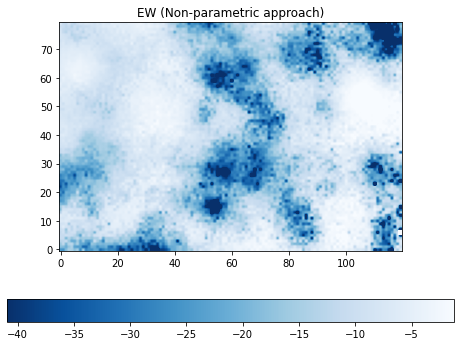

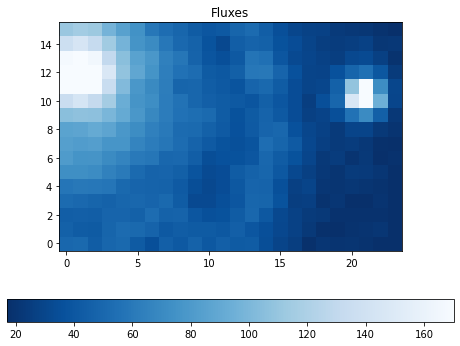

In [121]:

data= np.transpose(map_nonbinned_NP)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("EW (Non-parametric approach)")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

# Velocity maps

In [ ]:
spec=region[:,10,10]

# chop data
x_chopped,y_chopped=chop_data(wave,spec,halpha_obs-40,halpha_obs+40)
            
# smooth data
y_smooth=smooth_spectra(y_chopped,3)
            
# fit to continuum
cont=continuum(x_chopped,y_smooth)[0]

In [133]:
velocity(x_chopped,y_chopped,cont,halpha)

TypeError: 'numpy.ndarray' object is not callable

In [338]:
halpha

6563

In [131]:
map_vel=velocity_map(binned_region,wave,halpha_obs,halpha,kernel_size=3)

LinAlgError: Singular matrix

In [130]:
data= np.transpose(map_vel)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Velocity")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

NameError: name 'map_vel' is not defined

# Voronoi binning

goal: reach a chosen constant S/N per bin

I will choose noise to be a constant, the standard deviation of the pixel values divided by 50.

In [25]:
header;


selection=findWavelengths(wave, 5000)
selection[1]
cube[selection[1]]

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype='>f4')

In [24]:
len(final_x)

NameError: name 'final_x' is not defined

what should I use for the parameter pixelsize? Do i knwo the pixel scale of the cubes?

In [ ]:
from vorbin.voronoi_2d_binning import voronoi_2d_binning

data=cube[selection[1]]
x_len=len(data)
y_len=len(data[0])

#creating arrays of grid x_positions and y_positions

x=range(0,x_len)
y=range(0,y_len)
final_x=[]
final_y=[]
final_signal=[]
j=0
for yy in y:
    i=0
    for xx in x:
        i+=1
        if i%100==0 & j%100==0:
            final_x.append(xx)
            final_y.append(yy)
            final_signal.append(data[xx,yy])
    j+=1
        


target_sn = 10 #whats a good target S/N?

final_x=np.array(final_x)
final_y=np.array(final_y)
final_signal=np.array(final_signal)

# Create a mask that is True where the values are not NaN
mask = ~np.isnan(final_x) & ~np.isnan(final_y) & ~np.isnan(final_signal)

# Apply the mask to filter out NaN values
#print(final_x, final_y, final_signal)2
final_x = final_x[mask]
final_y = final_y[mask]
final_signal = final_signal[mask]

# Print out the filtered arrays to check
#print(final_x, final_y, final_signal)


std_dev=np.nanstd(data)
noise = np.full(shape=len(final_signal),fill_value=std_dev/50)

# Compute Voronoi bins
out=voronoi_2d_binning(final_x, final_y, final_signal, noise, target_sn, plot=True,pixelsize=1)

plt.show();

## Spectra at Hα

In [240]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

#plot_image(cube[index],wavelen,index,'Blues_r')


data=cube[index]

In [241]:
from astropy.stats import sigma_clipped_stats,gaussian_sigma_to_fwhm

from photutils import DAOStarFinder

mean, median, std = sigma_clipped_stats(data, sigma=5.0,maxiters=5) 
print((mean, median, std))

daofind = DAOStarFinder(fwhm=50, threshold=10.*std)

sources = daofind(data)

print("     Found %i stars in image " %len(sources))

(39.827423, 13.7210865, 63.754784)
     Found 6 stars in image 


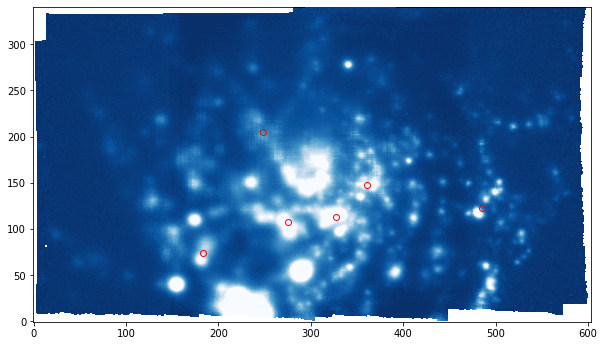

In [242]:

lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(10, 8))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
        
        
plt.plot(sources["xcentroid"],sources["ycentroid"],'or',mfc='none');

In [245]:
#defining (x,y) where we want to observe the spectra

i_brightest=np.argsort(sources['flux'])[0]

x_pos=int(sources[i_brightest][1])
y_pos=int(sources[i_brightest][2])

plotting spectra

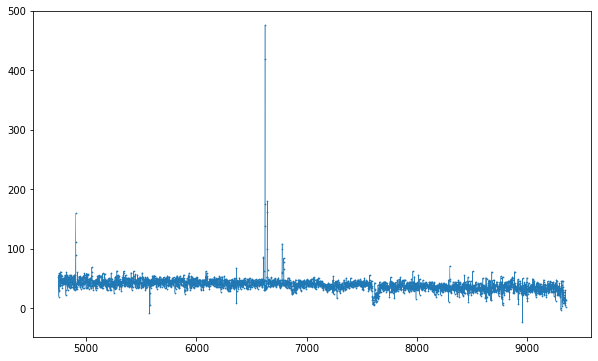

In [246]:
specdata=cube[:,y_pos,x_pos]

plt.figure(figsize=(10,6))

plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

Text(0.5, 1.0, 'Zoom in Halpha emission region')

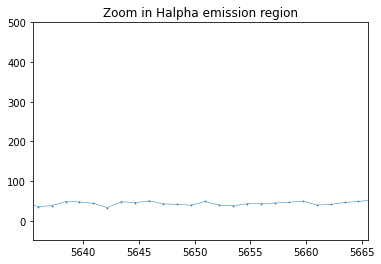

In [253]:
plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

plt.xlim(halpha_obs-15,halpha_obs+15)
#plt.ylim(-20,90)
plt.title("Zoom in Halpha emission region")

fitting a Gaussian

In [64]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6625)[1])

In [66]:
x = wave[bound1:bound2]
y = specdata[bound1:bound2]

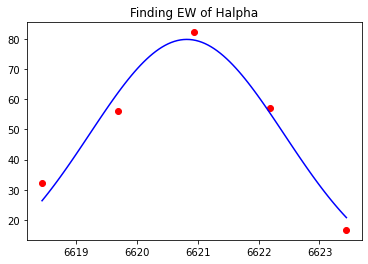

Fitted Amplitude (A): 79.7570857754474
Fitted Mean (mu): 6620.82077366716
Fitted Standard Deviation (sigma): 1.5989482179390269


In [67]:
initial_guess = [max(y), x[np.argmax(y)], 1]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(min(x), max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])

plt.scatter(x, y, label="Data", color="red")
plt.plot(x_fit, y_fit, label="Gaussian Fit", color="blue")

plt.title("Finding EW of Halpha")
plt.show()


# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")

Integral using Simpson's rule: 281.6268


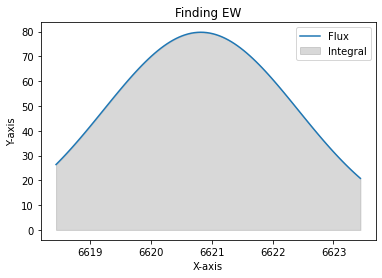

In [77]:

from scipy.integrate import simps

x = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

# Compute the integral using Simpson's rule
integral_simps = simps(y_fit, x)

print(f"Integral using Simpson's rule: {integral_simps:.4f}")

# Plot the curve
plt.plot(x, y_fit, label="Flux")
plt.fill_between(x, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


## Using Specutils

In [79]:
#from astropy.io import fits

from astropy import units as u

from astropy.visualization import quantity_support

quantity_support()  # for getting units on the axes below  

<astropy.visualization.units.quantity_support.<locals>.MplQuantityConverter at 0x7f656aa54e80>

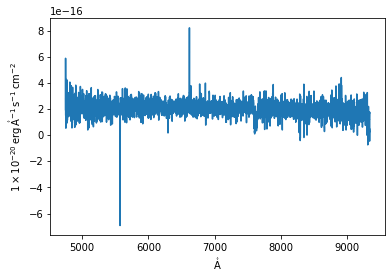

In [80]:
from specutils import Spectrum1D

lamb = wave * u.AA 

flux = specdata * 10**-17 * u.Unit(str(header["BUNIT"])) #taking the units from the header of the cube

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

f, ax = plt.subplots()  

ax.step(spec.spectral_axis, spec.flux) 
#ax.set_xlim(halpha_obs-15,halpha_obs+15)

Calculating SNR of the spectra

In [81]:
from specutils.analysis import snr_derived

snr_derived(spec)

<Quantity 4.432747>

In [82]:
import warnings

from specutils.fitting import fit_generic_continuum

with warnings.catch_warnings():  # Ignore warnings

    warnings.simplefilter('ignore')

    #normalizing by continuum estimate
    cont_norm_spec = spec / fit_generic_continuum(spec)(spec.spectral_axis) 

In [130]:
fit_generic_continuum.param_names

AttributeError: 'function' object has no attribute 'param_names'

ESTE ajuste está onde? fit_generic_continuum

(6598.263076399999, 6648.263076399999)

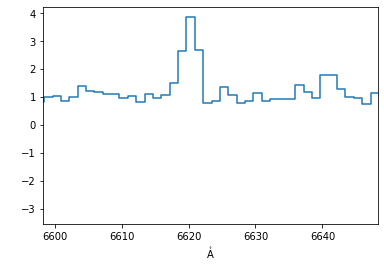

In [83]:
f, ax = plt.subplots()  

ax.step(cont_norm_spec.wavelength, cont_norm_spec.flux)  

ax.set_xlim((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm)  

In [84]:
from specutils import SpectralRegion

from specutils.analysis import equivalent_width

equivalent_width(cont_norm_spec, regions=SpectralRegion((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm))

<Quantity -11.53433117 Angstrom>

### Slicing a spectra into a particular region of interest

In [85]:
from specutils.manipulation import spectral_slab

ss = spectral_slab(cont_norm_spec, 5000.*u.AA, 5003.*u.AA)
ss

<Spectrum1D(flux=<Quantity [1.0896934 , 0.89806395]> (shape=(2,), mean=0.99388); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [5000.94238281 5002.19238281] Angstrom> (length=2))>

### Calculating Moments

In [86]:
from specutils.analysis import moment

m = moment(spec, order=1) 

m.shape  


print(m)

6953.192735554875 Angstrom


## Line Finding

In [87]:
cont_norm_spec; #continuum normalized spectra

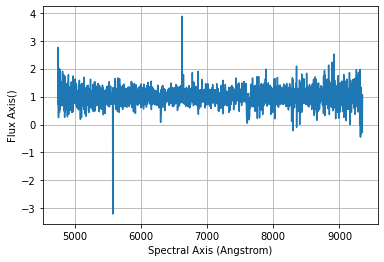

In [88]:
plt.plot(cont_norm_spec.spectral_axis, cont_norm_spec.flux) 

plt.xlabel('Spectral Axis ({})'.format(cont_norm_spec.spectral_axis.unit)) 

plt.ylabel('Flux Axis({})'.format(cont_norm_spec.flux.unit)) 

plt.grid(True)

Estimating uncertainty

In [89]:
ss = spectral_slab(cont_norm_spec, (halpha_obs-10)*u.AA, (halpha_obs+10)*u.AA) 
ss

<Spectrum1D(flux=<Quantity [0.83285743, 1.13031769, 0.9865351 , 1.07730173, 1.52001143,
           2.64860749, 3.87609295, 2.69161481, 0.78927651, 0.85823559,
           1.35906313, 1.08187466, 0.78013955, 0.85364203, 1.13819795,
           0.84613211]> (shape=(16,), mean=1.40437); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [6613.44238281 6614.69238281 6615.94238281 ... 6629.69238281 6630.94238281
 6632.19238281] Angstrom> (length=16))>

In [90]:
from specutils.manipulation import noise_region_uncertainty

noise_region = SpectralRegion(0*u.um, 3*u.um)

cont_norm_spec = noise_region_uncertainty(ss, noise_region)

from specutils.fitting import find_lines_threshold

lines = find_lines_threshold(ss, noise_factor=3)  

lines[lines['line_type'] == 'emission']


If you want to suppress this warning either type 'specutils.conf.do_continuum_function_check = False' or see http://docs.astropy.org/en/stable/config/#adding-new-configuration-items for other ways to configure the warning. [specutils.analysis.flux]


line_center,line_type,line_center_index
Angstrom,,
float64,str8,int64
6620.9423828125,emission,6


### Parameter Estimation

our specdata is in units 10**(-20) erg / (Angstrom s cm2) so we have to convert it to Jy using:

1 Jy = 10**(-23) erg/(cm^2)

In [91]:
(str(header["BUNIT"]))

'10**(-20)*erg/s/cm**2/Angstrom'

In [92]:
"""auxspec=specdata*10**(20) #this is in erg / (Angstrom s cm2)
auxspec=specdata*10**(20)*10**(-10) #this is in erg / ( s cm2)"""
auxspec=specdata*halpha_obs**2/(3.34*10**(-19))

In [93]:
lamb = wave * u.AA 
flux = auxspec * u.Unit(str('Jy')) 

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

In [99]:
from specutils import SpectralRegion

from specutils.fitting import estimate_line_parameters

from specutils.manipulation import extract_region

sub_region = SpectralRegion((halpha_obs-25)/10 *u.um, (halpha_obs+25)/10 *u.um)

sub_spectrum = extract_region(spec, sub_region)

In [100]:
result = estimate_line_parameters(spec, models.Gaussian1D())

print(result.amplitude)

print(result.mean) 

print(result.stddev) 

Parameter('amplitude', value=1.0786672501485288e+28, unit=Jy)
Parameter('mean', value=6953.192977414863, unit=Angstrom)
Parameter('stddev', value=1309.7939786398235, unit=Angstrom, bounds=(1.1754943508222875e-38, None))


In [97]:
from astropy.modeling import models
from specutils.fitting import fit_lines
from astropy import units as u


# Fit the spectrum and calculate the fitted flux values (``y_fit``)
g_init = models.Gaussian1D(amplitude=1.1*u.Jy, mean=halpha_obs*u.um, stddev=13*u.um)
g_fit = fit_lines(spec, g_init)


y_fit = g_fit(x*u.um)

# Plot the original spectrum and the fitted.
plt.plot(spec, , label="Original spectrum")
plt.plot(spec, y_fit, label="Fit result")
plt.title('Single fit peak')
plt.grid(True)
plt.legend()

SyntaxError: invalid syntax (1266487270.py, line 14)